# Introduction
This project will involve forecasting time series data related to average real estate prices in various zipcodes in order to answer the client's question: "What are the top 5 zipcodes for us to invest in?" This question is a bit vague, and will require some domain knowledge to answer. To approach this project, a CRISP-DM workflow will be followed.<br>
<br>
#### Outline:
[Business Understanding](#business_understanding)<br>
[Data Understanding](#data_understanding)<br>
[Data Preparation](#data_preparation)<br>
>[Finding Best Zip Codes](#finding_zipcodes)<br>
>[Looking at the whole market](#whole_market)<br>

[Modeling](#modeling)<br>
>[Facebook Prophet](#fbproph)<br>
>[ARIMA on Full data](#arima_full)<br>
>[ARIMA on Returns](#arima_returns)<br>

<a id='business_understanding'></a>
# Business Understanding:
A couple things to immediately note about the question at hand:
<ol>
    <li>
        Whether the client is looking at investment in residential/commercial real estate (or both) is not established. Taking a look at the <a href='https://www.zillow.com/research/data/'>Zillow Research Page</a>, from which the data is sourced, reveals that the prices are in reference to residential properties. This is valuable to know, as it narrows the scope of consideration for market forces that might be in effect at any given time, and removes possibility of inconsistences of market type among the zipcodes.</li>
    <li>        
The time horizon for these investments is not defined. Shorter-term investments that could bring faster returns typically have more risk involved due to price volatility. Less volatile markets with stable growth are typically good targets for longer term investment. Diversification is generally accepted to be a good strategy in any investment portfolio, so it may be wise to consider some split between these two strategies. With real estate, one could assume that the holding period of the assets would be longer than, say, with stock investment, since real estate is less liquid. This might mean that a short holding period may be more like a year, and a longer holding period around 5 or even 10 years. More exposure to the data will reveal some strategic insights. It is also important to note that long-term real-estate investments can be leased in the short-term. Although it is not established whether the client is a landlord or property management company, these services can be provided by third parties, so for any type of investor holding real estate for years at a time, this is a good profit strategy. In all, logic would suggest that the strategy should be investing in properties which have strong expected growth over a time horizon, and leasing the property during that time horizon.</li></ol>
<br>
 Although the <a href='https://www.investopedia.com/articles/basics/04/022004.asp'>Efficient Market Hypothesis</a>, which states that market prices reflect all current available knowledge affecting the investment, has been shown to be demonstrably false (as indicated by the level of diversity in the returns of individual investors in markets), it is not completely without merit or unworthy of consideration. Especially when dealing with median prices for real estate in a region, such as this dataset, one can expect that a fair deal of knowledge about the future expectations for the real estate of that region is already factored into the averaged market price seen. Further, depending on the number of zipcodes in the dataset, doing individualized research to understand fundamental developments occuring in each may be unfeasible. However, if the list is narrowed down to a few, further investigation may be appropriate.<br>
 <br>
 Since models will have a range of values within the confidence interval, the low side may or may not be higher than the initial investment, a good way to narrow down the pool of zipcodes to consider might involve using the lower end of the confidence interval at a projection period of 5 years out, and seeing if it is higher than the initial investment, therefore showing good confidence that in a worst case scenario, the investor would not be likely to LOSE any money on the investment. Also, any losses may be offset by leasing the properties over the course of the investment period.<br>
 <br>
 Another filtering method that may be employed would be to find the average monthly return of each zipcode, and focus on those zipcodes which consistently outperformed in repeated sampling of random time windows. Since the data spans across the Great Recession, this would also indicate which zipcodes had real estate which was more resilient to the crisis, further justifying investor confidence.

<a id='data_understanding'></a>
# Data Understanding:
- The data to be used for this project has been made available in a .csv file 'zillow_data.csv' contained in this repository. The data is in Wide Format, meaning that the dates for the time series are the headers of columns. This means that the data will have to be melted using pandas in order to get it into Long Format, which will be necessary for modeling the time series.
- Further data about the zip codes may later be obtained from the internet, depending on the project's needs, after the list of potential investments has been considerably narrowed down.

In [1]:
# Importing the necessary libraries
from IPython.display import display
import itertools
import matplotlib.pyplot as plt
import my_functions as mf
import numpy as np
from operator import itemgetter
import pandas as pd
from scipy import stats
import seaborn as sns
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
import statsmodels.stats.stattools as st
from statsmodels.tsa.filters.hp_filter import hpfilter
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.statespace.sarimax import SARIMAX

In [2]:
%load_ext autoreload
%autoreload 1
%aimport my_functions

In [3]:
# Plot styling
plt.style.use('ggplot')
from jupyterthemes import jtplot
jtplot.style()

In [4]:
from matplotlib.pylab import rcParams
rcParams['figure.figsize'] = 11, 7

In [5]:
pd.plotting.register_matplotlib_converters()

## Loading DataFrame and Initial Feature Inspection

In [6]:
# Getting a look at the raw data
df = pd.read_csv('zillow_data.csv')
df.head()

,RegionID,RegionName,City,State,Metro,CountyName,SizeRank,1996-04,1996-05,1996-06,...,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04
0,84654,60657,Chicago,IL,Chicago,Cook,1,334200.0,335400.0,336500.0,...,1005500,1007500,1007800,1009600,1013300,1018700,1024400,1030700,1033800,1030600
1,90668,75070,McKinney,TX,Dallas-Fort Worth,Collin,2,235700.0,236900.0,236700.0,...,308000,310000,312500,314100,315000,316600,318100,319600,321100,321800
2,91982,77494,Katy,TX,Houston,Harris,3,210400.0,212200.0,212200.0,...,321000,320600,320200,320400,320800,321200,321200,323000,326900,329900
3,84616,60614,Chicago,IL,Chicago,Cook,4,498100.0,500900.0,503100.0,...,1289800,1287700,1287400,1291500,1296600,1299000,1302700,1306400,1308500,1307000
4,93144,79936,El Paso,TX,El Paso,El Paso,5,77300.0,77300.0,77300.0,...,119100,119400,120000,120300,120300,120300,120300,120500,121000,121500


In [7]:
#import dataframe_image as di

In [8]:
#di.export(df.iloc[:5], 'images/df_head1.png', max_cols = 15)

A question to answer immediately is whether the RegionID or RegionName represents the zip code of a region. A few quick google searches reveal that the RegionName column contains the zip codes.

In [9]:
# Getting the number of rows and columns
df.info(())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14723 entries, 0 to 14722
Columns: 272 entries, RegionID to 2018-04
dtypes: float64(219), int64(49), object(4)
memory usage: 30.6+ MB


In [10]:
# We can see that there are a lot of rows, 14723, in the dataset.
# Checking to see if there is the same number of unique zip codes (RegionName)
df.RegionName.nunique()

14723

In [11]:
# We see that there are 14723 unique zip codes in the database. For clarity, I will rename
# the RegionName column to 'zipcode':
df.rename(columns={'RegionName':'zipcode'}, inplace=True)
df.head(15)

,RegionID,zipcode,City,State,Metro,CountyName,SizeRank,1996-04,1996-05,1996-06,...,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04
0,84654,60657,Chicago,IL,Chicago,Cook,1,334200.0,335400.0,336500.0,...,1005500,1007500,1007800,1009600,1013300,1018700,1024400,1030700,1033800,1030600
1,90668,75070,McKinney,TX,Dallas-Fort Worth,Collin,2,235700.0,236900.0,236700.0,...,308000,310000,312500,314100,315000,316600,318100,319600,321100,321800
2,91982,77494,Katy,TX,Houston,Harris,3,210400.0,212200.0,212200.0,...,321000,320600,320200,320400,320800,321200,321200,323000,326900,329900
3,84616,60614,Chicago,IL,Chicago,Cook,4,498100.0,500900.0,503100.0,...,1289800,1287700,1287400,1291500,1296600,1299000,1302700,1306400,1308500,1307000
4,93144,79936,El Paso,TX,El Paso,El Paso,5,77300.0,77300.0,77300.0,...,119100,119400,120000,120300,120300,120300,120300,120500,121000,121500
5,91733,77084,Houston,TX,Houston,Harris,6,95000.0,95200.0,95400.0,...,157900,158700,160200,161900,162800,162800,162800,162900,163500,164300
6,61807,10467,New York,NY,New York,Bronx,7,152900.0,152700.0,152600.0,...,394400,400000,407300,411600,413200,414300,413900,411400,413200,417900
7,84640,60640,Chicago,IL,Chicago,Cook,8,216500.0,216700.0,216900.0,...,798000,787100,776100,774900,777900,777900,778500,780500,782800,782800
8,91940,77449,Katy,TX,Houston,Harris,9,95400.0,95600.0,95800.0,...,166800,167400,168400,169600,170900,172300,173300,174200,175400,176200
9,97564,94109,San Francisco,CA,San Francisco,San Francisco,10,766000.0,771100.0,776500.0,...,3767700,3763900,3775000,3799700,3793900,3778700,3770800,3763100,3779800,3813500


In [12]:
# It appears the SizeRank column is in ascending order, no description of this column is given
df.SizeRank

0            1
1            2
2            3
3            4
4            5
         ...  
14718    14719
14719    14720
14720    14721
14721    14722
14722    14723
Name: SizeRank, Length: 14723, dtype: int64

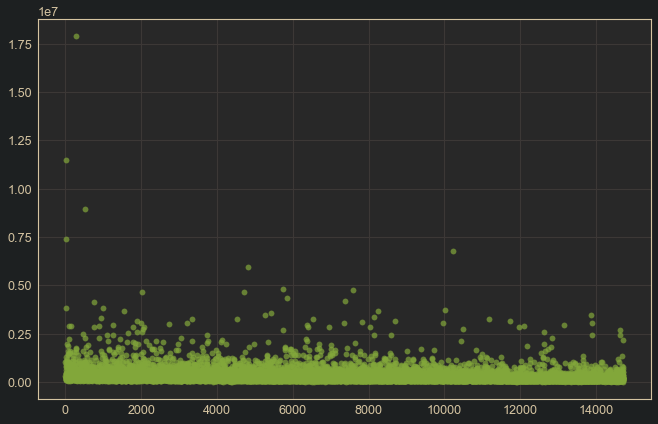

In [13]:
# Does SizeRank have any correlation to most recent prices?
plt.figure(figsize=(11,7))
plt.scatter(df.SizeRank, df['2018-04'], alpha=0.7);

In [14]:
# Althought the largest outliers in most recent prices fall in the earlier size ranks,
# there does not appear to be any significant correlation beyond that. This feature is probably
# not valuable.

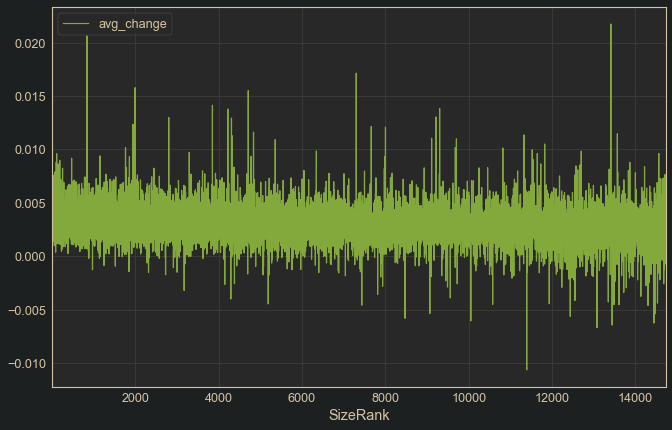

In [15]:
# I would like to see another relationship, that between SizeRank and the average monthly change
# of a zipcode over the whole time period
pct_change = df.set_index('SizeRank').drop(columns=['City', 
                                                   'State', 
                                                   'Metro', 
                                                   'CountyName', 
                                                   'RegionID',
                                                   'zipcode',]).T.pct_change()
avg_change = pd.DataFrame(pct_change.mean(), columns=['avg_change'])
avg_change.plot()

In [16]:
avg_change.head()

,avg_change
SizeRank,
1,0.004295
2,0.001215
3,0.001757
4,0.003682
5,0.001728


In [17]:
# Adding SizeRank back as a column for compatibility with functions
avg_change = avg_change.reset_index()
avg_change.head()

,SizeRank,avg_change
0,1,0.004295
1,2,0.001215
2,3,0.001757
3,4,0.003682
4,5,0.001728


In [18]:
# A look at the pearson correlation score for the two columns
avg_change.corr()

,SizeRank,avg_change
SizeRank,1.000000,-0.124774
avg_change,-0.124774,1.000000


Linear Regression for avg_change~SizeRank


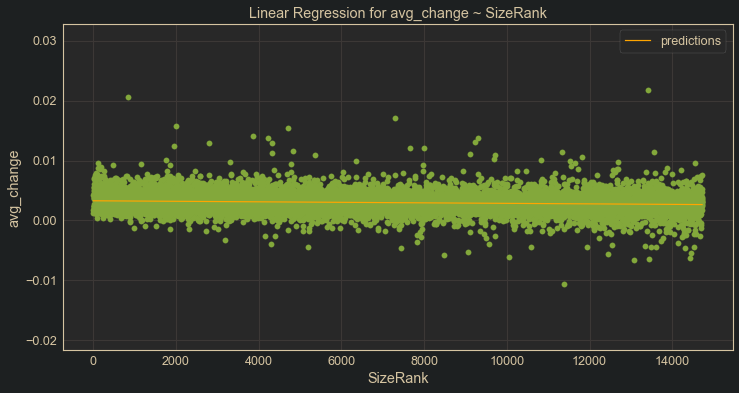

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             avg_change   R-squared:                       0.016
Model:                            OLS   Adj. R-squared:                  0.016
Method:                 Least Squares   F-statistic:                     232.8
Date:                Fri, 04 Sep 2020   Prob (F-statistic):           3.65e-52
Time:                        12:52:10   Log-Likelihood:                 75316.
No. Observations:               14723   AIC:                        -1.506e+05
Df Residuals:                   14721   BIC:                        -1.506e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.0033   2.39e-05    136.700      0.000       0.003       0.003
SizeRank   -4.298e-08   2.82e-09    -15.258      0.000   -4.85e-08   -3.75e-08
==============================================================================
Omnibus:                     3405.502   Durbin-Watson:                   1.959
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            52557.288
Skew:                           0.691   Prob(JB):                         0.00
Kurtosis:                      12.152   Cond. No.                     1.70e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.7e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Test for homoscedasticity of residuals:


,F_statistic,p_value
Goldfeld-Quandt,1.55542,1.12559e-71


Normality Test Results for ['residuals']:
-------------------------------------------------------------------------------------------


C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\morestats.py:1660: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


K-S and Shapiro-Wilk: 
 
 
 
 
 K-S 
 Shapiro-Wilk 
 
 
 
 
 residuals 
 Statistic 
 0.496387 
 0.937573 
 
 
 p-value 
 0.000000 
 0.000000 
 
 
 Anderson-Darling: 
 
 
 
 statistic 
 critical 
 
 
 
 
 residuals 
 114.871991 
 0.787 
 
 
 Jarque-Bera: 
 
 
 
 residuals 
 
 
 
 
 Statistic 
 52557.287540 
 
 
 p-value 
 0.000000 
 
 
 Skew 
 0.691120 
 
 
 Kurtosis 
 12.152223

Skew: 0.691120172619765
Kurtosis: 9.152222715093057


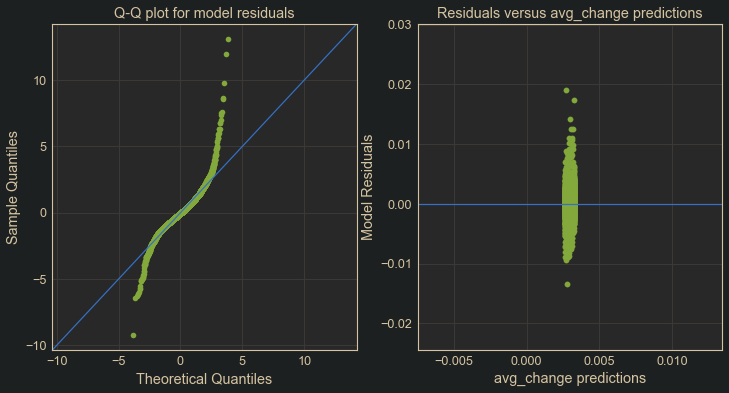

In [19]:
# There does appear to be a small amount of negative correlation between the SizeRank and the
# overall average monthly change of a zipcode. Let's test this relationship further with a
# linear regression.
mf.do_a_linreg(avg_change, 'SizeRank', 'avg_change')

In the above regression, the coefficient for the SizeRank feature's influence on a zipcode's overall average monthly return, though apparently significant, is extremely small, and negligible. Further, the assumptions of the regression were not met, and the R-squared was woeful anyhow. I will assume this feature is not valuable, and ignore it from here.

<a id='data_preparation'></a>
# Data Preparation:

In [20]:
# Dropping the SizeRank column, as well as the RegionID
df.drop(columns=['RegionID', 'SizeRank'], inplace=True)

In [21]:
# Melting dataframe to convert into Long Format
df2 = pd.melt(df, id_vars=['zipcode', 'City', 'State', 'Metro', 'CountyName'], var_name='date')
df2.head()

,zipcode,City,State,Metro,CountyName,date,value
0,60657,Chicago,IL,Chicago,Cook,1996-04,334200.0
1,75070,McKinney,TX,Dallas-Fort Worth,Collin,1996-04,235700.0
2,77494,Katy,TX,Houston,Harris,1996-04,210400.0
3,60614,Chicago,IL,Chicago,Cook,1996-04,498100.0
4,79936,El Paso,TX,El Paso,El Paso,1996-04,77300.0


In [22]:
#di.export(df2.iloc[:5], 'images/df2head1.png')

In [23]:
# We can see that the unpivoted dataframe is quite long, with nearly 4 million rows
len(df2)

3901595

In [24]:
# Converting 'date' column to datetime format
df2.date = pd.to_datetime(df2.date, format='%Y-%m')
df2.date

0         1996-04-01
1         1996-04-01
2         1996-04-01
3         1996-04-01
4         1996-04-01
             ...    
3901590   2018-04-01
3901591   2018-04-01
3901592   2018-04-01
3901593   2018-04-01
3901594   2018-04-01
Name: date, Length: 3901595, dtype: datetime64[ns]

In [25]:
# checking 'value' column for missing data:
df2.value.isna().sum()

156891

In [26]:
# There are many missing values, but I will leave them in place for now

# Grouping the data by zipcode
groups = df2.groupby('zipcode')
len(groups)

14723

1001
1002
1005
1007
1008
1010


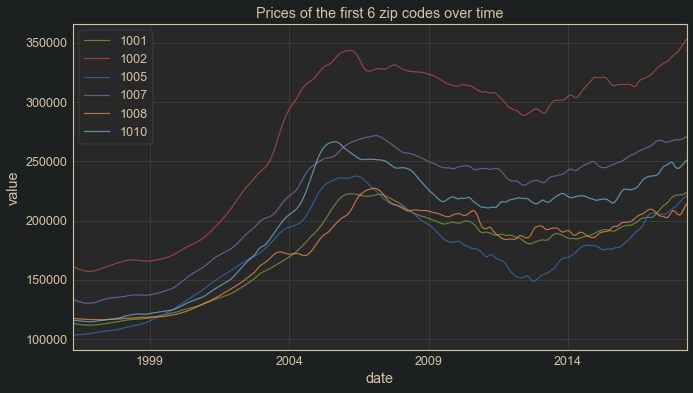

In [32]:
# A quick look at the first 6 zipcodes:
for i, (name, group) in enumerate(groups):
    print(name)
    group.set_index('date').value.plot(figsize=(11,6), alpha=0.7, label=name)
    if i >= 5:
        break
        
plt.ylabel('value')
plt.title('Prices of the first 6 zip codes over time')
plt.legend();

Above we can start to see that not all zipcodes are growing at the same overall rate, and that the 2007 crisis had greater or more long lasting effects on certain ones. For instance, zipcode 01008 and 01001 both had less of a decline post-2007 than zipcode 01005, but they have all seemed to recover to around their pre-crash levels. Earlier, we saw that the average among all zip codes is higher than it was before the crash, meaning some zipcodes have been growing better than others since the low point around 2013, certainly better than the ones above, which all are pretty close to breaking even with their previous highs.

<a id='finding_zipcodes'></a>
## Finding outperforming zip codes
Now to conduct an analysis of the data to find the top performing zip codes. The objective is to find zip codes which showed superior growth as well as resilience during the crash. Zip codes for which recent growth is slow will be less favored.

In [33]:
# First using percent changes
pct_change = df.set_index('zipcode').drop(columns=['City', 
                                                   'State', 
                                                   'Metro', 
                                                   'CountyName'
                                                  ]).T.pct_change()

In [34]:
pct_change.head()

zipcode,60657,75070,77494,60614,79936,77084,10467,60640,77449,94109,...,3765,84781,12429,97028,12720,1338,3293,40404,81225,89155
1996-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1996-05,0.003591,0.005091,0.008555,0.005621,0.000000,0.002105,-0.001308,0.000924,0.002096,0.006658,...,-0.008663,0.002943,0.000000,0.002937,0.001600,-0.003171,-0.002157,0.003503,0.006803,-0.000567
1996-06,0.003280,-0.000844,0.000000,0.004392,0.000000,0.002101,-0.000655,0.000923,0.002092,0.007003,...,-0.008739,0.002201,-0.001277,0.001464,0.001597,-0.003181,-0.001081,0.003490,0.006757,-0.001134
1996-07,0.003269,-0.005492,-0.007069,0.002982,0.000000,0.003145,-0.001311,0.000461,0.003132,0.006954,...,-0.010076,0.002196,0.000000,0.000000,0.000000,-0.003191,-0.002165,0.003478,0.006711,-0.000568
1996-08,0.002666,-0.008921,-0.011391,0.001784,0.001294,0.002090,-0.000656,0.000461,0.003122,0.006906,...,-0.008906,0.001461,-0.001279,-0.000731,0.000000,-0.003202,-0.001085,0.005199,0.006667,-0.000568


Median for 60657: 0.004016387138366273
Mean for 60657: 0.0042950361785796054
Normality Test Results for [60657]:
-------------------------------------------------------------------------------------------


K-S and Shapiro-Wilk: 
 
 
 
 
 K-S 
 Shapiro-Wilk 
 
 
 
 
 60657 
 Statistic 
 4.952419e-01 
 0.988272 
 
 
 p-value 
 2.559368e-60 
 0.030556 
 
 
 Anderson-Darling: 
 
 
 
 statistic 
 critical 
 
 
 
 
 60657 
 0.970426 
 0.776 
 
 
 Jarque-Bera: 
 
 
 
 60657 
 
 
 
 
 Statistic 
 1.042787 
 
 
 p-value 
 0.593693 
 
 
 Skew 
 -0.078841 
 
 
 Kurtosis 
 2.735547

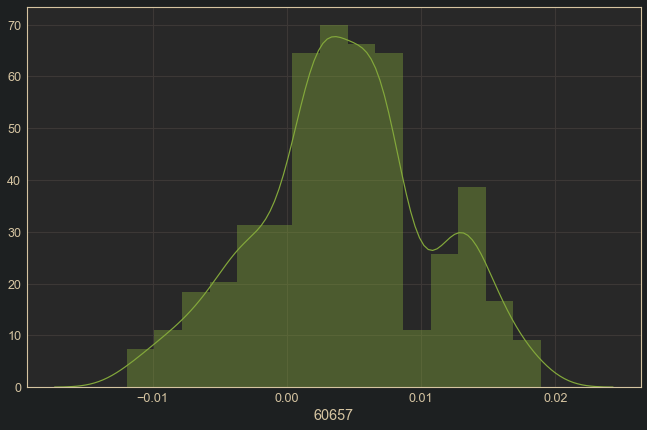

Median for 75070: 0.002254961175804371
Mean for 75070: 0.0012151485394771924
Normality Test Results for [75070]:
-------------------------------------------------------------------------------------------


K-S and Shapiro-Wilk: 
 
 
 
 
 K-S 
 Shapiro-Wilk 
 
 
 
 
 75070 
 Statistic 
 4.897961e-01 
 9.421729e-01 
 
 
 p-value 
 6.380644e-59 
 1.105654e-08 
 
 
 Anderson-Darling: 
 
 
 
 statistic 
 critical 
 
 
 
 
 75070 
 5.644502 
 0.776 
 
 
 Jarque-Bera: 
 
 
 
 75070 
 
 
 
 
 Statistic 
 4.307768e+01 
 
 
 p-value 
 4.423863e-10 
 
 
 Skew 
 -5.530765e-01 
 
 
 Kurtosis 
 4.640908e+00

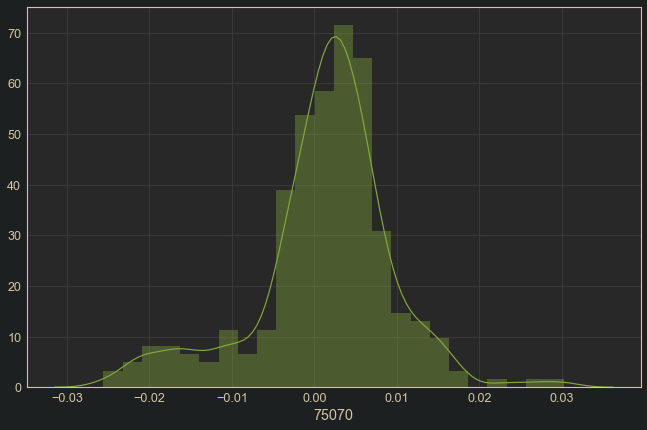

Median for 77494: 0.0013373421057769619
Mean for 77494: 0.00175682453435862
Normality Test Results for [77494]:
-------------------------------------------------------------------------------------------


K-S and Shapiro-Wilk: 
 
 
 
 
 K-S 
 Shapiro-Wilk 
 
 
 
 
 77494 
 Statistic 
 4.886697e-01 
 9.440606e-01 
 
 
 p-value 
 1.233816e-58 
 1.722436e-08 
 
 
 Anderson-Darling: 
 
 
 
 statistic 
 critical 
 
 
 
 
 77494 
 4.750811 
 0.776 
 
 
 Jarque-Bera: 
 
 
 
 77494 
 
 
 
 
 Statistic 
 4.542569e+01 
 
 
 p-value 
 1.367529e-10 
 
 
 Skew 
 6.968922e-02 
 
 
 Kurtosis 
 5.027358e+00

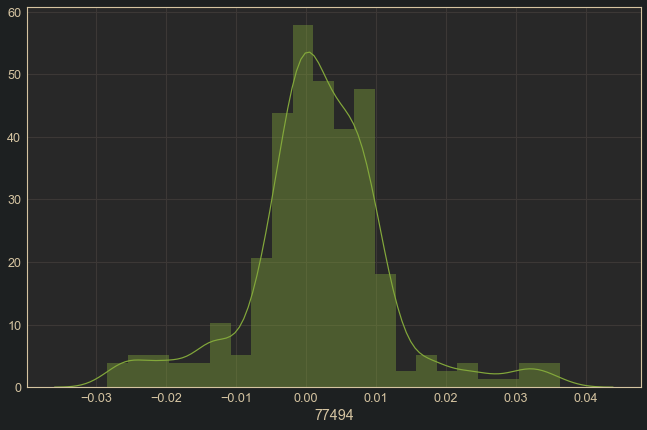

Median for 60614: 0.003648611561309134
Mean for 60614: 0.0036818024757118103
Normality Test Results for [60614]:
-------------------------------------------------------------------------------------------


K-S and Shapiro-Wilk: 
 
 
 
 
 K-S 
 Shapiro-Wilk 
 
 
 
 
 60614 
 Statistic 
 4.945085e-01 
 0.987546 
 
 
 p-value 
 3.957235e-60 
 0.022071 
 
 
 Anderson-Darling: 
 
 
 
 statistic 
 critical 
 
 
 
 
 60614 
 0.888871 
 0.776 
 
 
 Jarque-Bera: 
 
 
 
 60614 
 
 
 
 
 Statistic 
 1.131290 
 
 
 p-value 
 0.567994 
 
 
 Skew 
 -0.154046 
 
 
 Kurtosis 
 2.910981

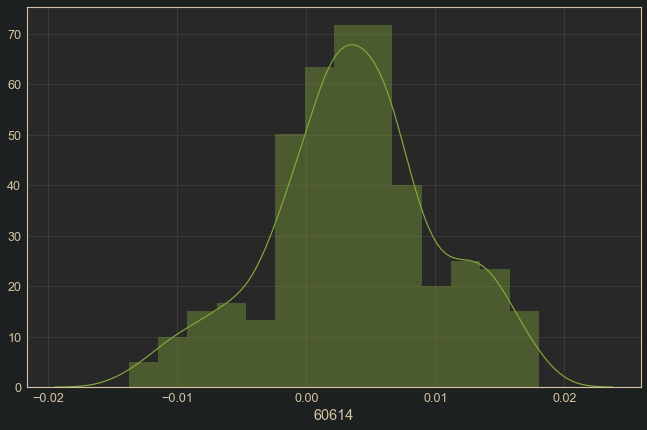

Median for 79936: 0.0012714809964918805
Mean for 79936: 0.001728273319979783
Normality Test Results for [79936]:
-------------------------------------------------------------------------------------------


K-S and Shapiro-Wilk: 
 
 
 
 
 K-S 
 Shapiro-Wilk 
 
 
 
 
 79936 
 Statistic 
 4.954825e-01 
 9.577079e-01 
 
 
 p-value 
 2.218038e-60 
 5.729984e-07 
 
 
 Anderson-Darling: 
 
 
 
 statistic 
 critical 
 
 
 
 
 79936 
 3.097394 
 0.776 
 
 
 Jarque-Bera: 
 
 
 
 79936 
 
 
 
 
 Statistic 
 3.524575e+01 
 
 
 p-value 
 2.220667e-08 
 
 
 Skew 
 7.404179e-01 
 
 
 Kurtosis 
 4.005626e+00

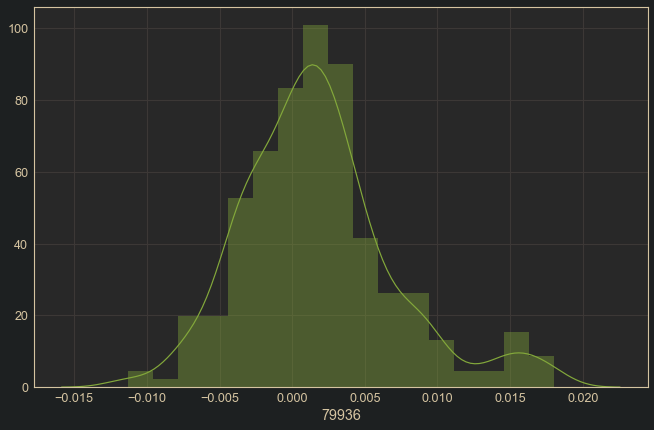

In [35]:
# Checking how normal the distributions are to determine if mean is a reliable statistic to use
for i in range(5):
    subset = pct_change.iloc[:, i]
    sns.distplot(subset.dropna())
    print("Median for {}: {}".format(subset.name, subset.median()))
    print("Mean for {}: {}".format(subset.name, subset.mean()))
    mf.check_normality(subset, [subset.name])
    plt.show()

In [36]:
# We can see that while some of the zipcodes have normally distributed percent changes,
# some do not, so mean may not be the best comparison, and median may be more robust.
# First, I'd like to see how the distributions of log returns look
log_rets = np.log(df.set_index('zipcode').drop(columns=['City', 
                                                   'State', 
                                                   'Metro', 
                                                   'CountyName'
                                                  ]).T).diff()
log_rets.head()

zipcode,60657,75070,77494,60614,79936,77084,10467,60640,77449,94109,...,3765,84781,12429,97028,12720,1338,3293,40404,81225,89155
1996-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1996-05,0.003584,0.005078,0.008519,0.005606,0.000000,0.002103,-0.001309,0.000923,0.002094,0.006636,...,-0.008701,0.002939,0.000000,0.002933,0.001599,-0.003176,-0.002160,0.003497,0.006780,-0.000567
1996-06,0.003274,-0.000845,0.000000,0.004382,0.000000,0.002099,-0.000655,0.000923,0.002090,0.006979,...,-0.008777,0.002199,-0.001278,0.001463,0.001596,-0.003186,-0.001082,0.003484,0.006734,-0.001135
1996-07,0.003264,-0.005507,-0.007094,0.002977,0.000000,0.003140,-0.001311,0.000461,0.003127,0.006930,...,-0.010127,0.002194,0.000000,0.000000,0.000000,-0.003197,-0.002167,0.003472,0.006689,-0.000568
1996-08,0.002662,-0.008961,-0.011456,0.001782,0.001293,0.002088,-0.000656,0.000461,0.003117,0.006883,...,-0.008946,0.001460,-0.001280,-0.000731,0.000000,-0.003207,-0.001085,0.005186,0.006645,-0.000568


Median for 60657: 0.004008342975265755
Mean for 60657: 0.004265745529291026
Normality Test Results for [60657]:
-------------------------------------------------------------------------------------------


K-S and Shapiro-Wilk: 
 
 
 
 
 K-S 
 Shapiro-Wilk 
 
 
 
 
 60657 
 Statistic 
 4.952133e-01 
 0.988135 
 
 
 p-value 
 2.603280e-60 
 0.028736 
 
 
 Anderson-Darling: 
 
 
 
 statistic 
 critical 
 
 
 
 
 60657 
 0.971525 
 0.776 
 
 
 Jarque-Bera: 
 
 
 
 60657 
 
 
 
 
 Statistic 
 1.129386 
 
 
 p-value 
 0.568535 
 
 
 Skew 
 -0.095309 
 
 
 Kurtosis 
 2.742442

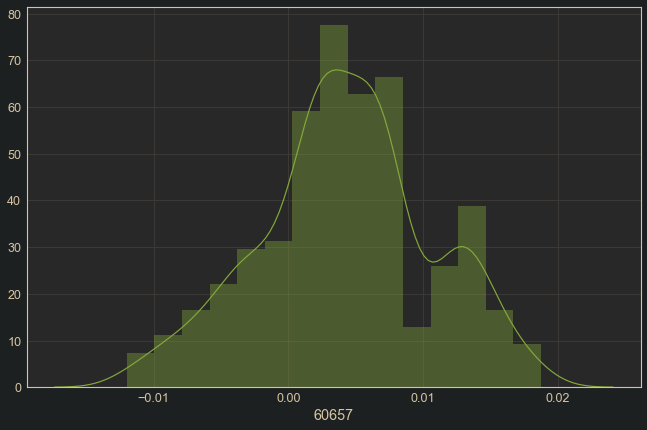

Median for 75070: 0.00225241976995072
Mean for 75070: 0.0011794334265765088
Normality Test Results for [75070]:
-------------------------------------------------------------------------------------------


K-S and Shapiro-Wilk: 
 
 
 
 
 K-S 
 Shapiro-Wilk 
 
 
 
 
 75070 
 Statistic 
 4.896633e-01 
 9.404321e-01 
 
 
 p-value 
 6.897024e-59 
 7.403229e-09 
 
 
 Anderson-Darling: 
 
 
 
 statistic 
 critical 
 
 
 
 
 75070 
 5.807307 
 0.776 
 
 
 Jarque-Bera: 
 
 
 
 75070 
 
 
 
 
 Statistic 
 4.543445e+01 
 
 
 p-value 
 1.361552e-10 
 
 
 Skew 
 -5.946513e-01 
 
 
 Kurtosis 
 4.648018e+00

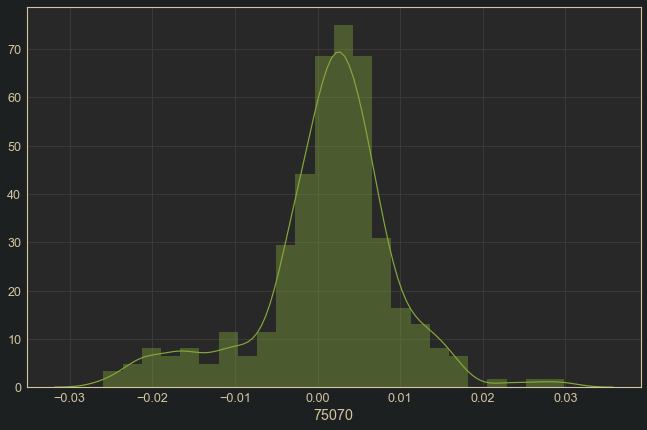

Median for 77494: 0.0013364486127782627
Mean for 77494: 0.0017037087021628033
Normality Test Results for [77494]:
-------------------------------------------------------------------------------------------


K-S and Shapiro-Wilk: 
 
 
 
 
 K-S 
 Shapiro-Wilk 
 
 
 
 
 77494 
 Statistic 
 4.885057e-01 
 9.443247e-01 
 
 
 p-value 
 1.357920e-58 
 1.833962e-08 
 
 
 Anderson-Darling: 
 
 
 
 statistic 
 critical 
 
 
 
 
 77494 
 4.774342 
 0.776 
 
 
 Jarque-Bera: 
 
 
 
 77494 
 
 
 
 
 Statistic 
 4.384197e+01 
 
 
 p-value 
 3.018825e-10 
 
 
 Skew 
 8.646898e-03 
 
 
 Kurtosis 
 4.996330e+00

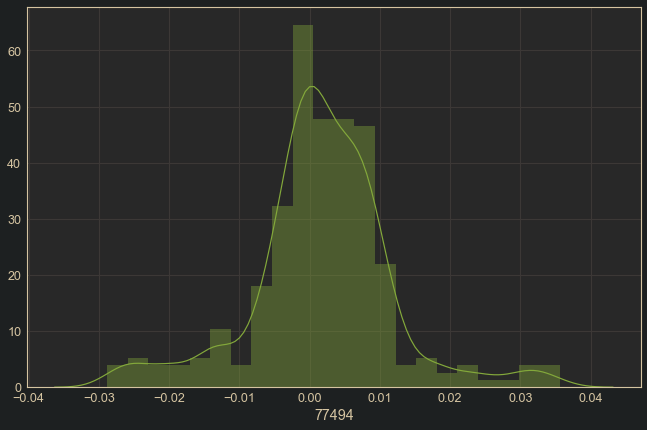

Median for 60614: 0.0036419698370986353
Mean for 60614: 0.003654124445246147
Normality Test Results for [60614]:
-------------------------------------------------------------------------------------------


K-S and Shapiro-Wilk: 
 
 
 
 
 K-S 
 Shapiro-Wilk 
 
 
 
 
 60614 
 Statistic 
 4.944704e-01 
 0.987231 
 
 
 p-value 
 4.047864e-60 
 0.019177 
 
 
 Anderson-Darling: 
 
 
 
 statistic 
 critical 
 
 
 
 
 60614 
 0.901185 
 0.776 
 
 
 Jarque-Bera: 
 
 
 
 60614 
 
 
 
 
 Statistic 
 1.373603 
 
 
 p-value 
 0.503183 
 
 
 Skew 
 -0.172390 
 
 
 Kurtosis 
 2.922544

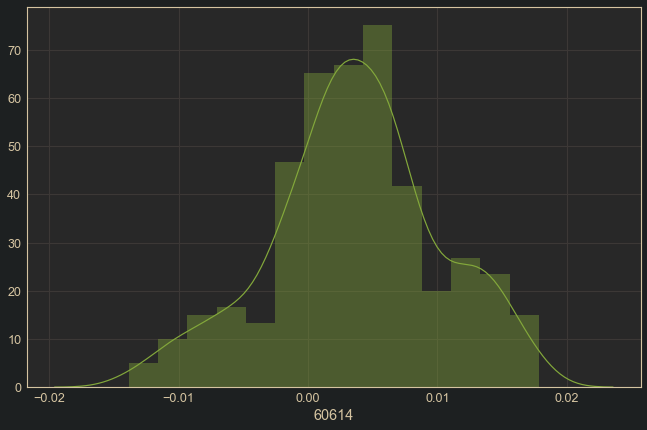

Median for 79936: 0.0012706733330958286
Mean for 79936: 0.0017129557090425275
Normality Test Results for [79936]:
-------------------------------------------------------------------------------------------


K-S and Shapiro-Wilk: 
 
 
 
 
 K-S 
 Shapiro-Wilk 
 
 
 
 
 79936 
 Statistic 
 4.954567e-01 
 9.591054e-01 
 
 
 p-value 
 2.252322e-60 
 8.491392e-07 
 
 
 Anderson-Darling: 
 
 
 
 statistic 
 critical 
 
 
 
 
 79936 
 3.006986 
 0.776 
 
 
 Jarque-Bera: 
 
 
 
 79936 
 
 
 
 
 Statistic 
 3.334479e+01 
 
 
 p-value 
 5.744751e-08 
 
 
 Skew 
 7.210552e-01 
 
 
 Kurtosis 
 3.975532e+00

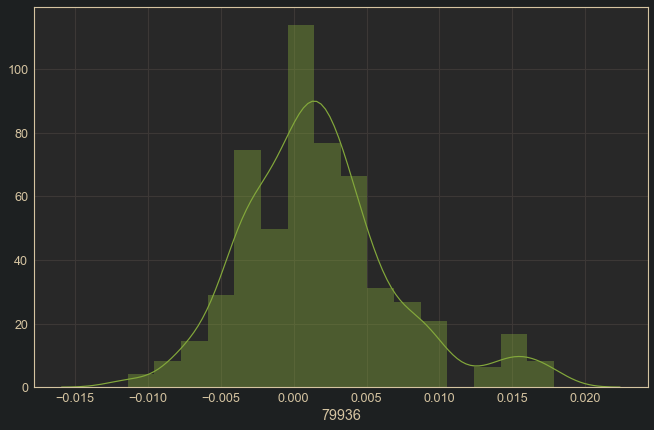

In [37]:
for i in range(5):
    subset = log_rets.iloc[:, i]
    sns.distplot(subset.dropna())
    print("Median for {}: {}".format(subset.name, subset.median()))
    print("Mean for {}: {}".format(subset.name, subset.mean()))
    mf.check_normality(subset, [subset.name])
    plt.show()

In [38]:
# We can see that this didn't help the normality of the zip codes. However, log returns are
# generally favored in the financial analysis world due to their mathematical properties. I
# will use them in this notebook.
# Because medians can sometimes ignore important information about outliers,
# and since the idea here is to find zipcodes which outperformed over time, AND were resilient
# during the crash, it may be better to allow the outliers to have a more weighted impact on
# central tendency so that highly negative values punish the scores.
# I will use both median and mean compare zipcode performance, and compare the two
medians = log_rets.median()
medians.head()

zipcode
60657    0.004008
75070    0.002252
77494    0.001336
60614    0.003642
79936    0.001271
dtype: float64

In [39]:
# Now I'd like to look at the 10 best performers
ten_best_median = medians.sort_values(ascending=False).iloc[:10]
ten_best_median

zipcode
27980    0.022908
30032    0.019264
49636    0.017914
80216    0.016801
89030    0.016425
30288    0.014718
43206    0.014418
94621    0.014299
29405    0.013560
89512    0.013498
dtype: float64

In [40]:
# And now to do the same with the means of log returns:
log_ret_means = log_rets.mean()
log_ret_means.head()

zipcode
60657    0.004266
75070    0.001179
77494    0.001704
60614    0.003654
79936    0.001713
dtype: float64

In [41]:
ten_best_means = log_ret_means.sort_values(ascending=False).iloc[:10]
ten_best_means

zipcode
27980    0.021365
30032    0.020352
80216    0.016964
89030    0.015623
94621    0.015365
43206    0.013883
89512    0.013676
30288    0.013591
95351    0.012892
32435    0.012830
dtype: float64

I now have a list of the ten best performing zip codes according to their median monthly returns and mean log returns over the time period. Some of the same zip codes appear on both lists, so these may make good contenders for inspection. I notice that zip code 49636 is entirely absent from the best performers according to mean, though it is third on the list according to median. This is probably demonstrating the effect of how medians give less weight to outliers. As stated before, the performance based on means may be better for this project, because if another housing market crash occurs, we want to know which zip codes were most resilient during the last one, which is reflected in their low outliers. 

,zipcode,City,State,Metro,CountyName,date,value
13409,27980,Hertford,NC,Elizabeth City,Perquimans,1996-04-01,NaN
28132,27980,Hertford,NC,Elizabeth City,Perquimans,1996-05-01,NaN
42855,27980,Hertford,NC,Elizabeth City,Perquimans,1996-06-01,NaN
57578,27980,Hertford,NC,Elizabeth City,Perquimans,1996-07-01,NaN
72301,27980,Hertford,NC,Elizabeth City,Perquimans,1996-08-01,NaN


,zipcode,City,State,Metro,CountyName,date,value
842,30032,Candler-Mcafee,GA,Atlanta,Dekalb,1996-04-01,NaN
15565,30032,Candler-Mcafee,GA,Atlanta,Dekalb,1996-05-01,NaN
30288,30032,Candler-Mcafee,GA,Atlanta,Dekalb,1996-06-01,NaN
45011,30032,Candler-Mcafee,GA,Atlanta,Dekalb,1996-07-01,NaN
59734,30032,Candler-Mcafee,GA,Atlanta,Dekalb,1996-08-01,NaN


,zipcode,City,State,Metro,CountyName,date,value
14341,49636,Glen Arbor,MI,Traverse City,Leelanau,1996-04-01,NaN
29064,49636,Glen Arbor,MI,Traverse City,Leelanau,1996-05-01,NaN
43787,49636,Glen Arbor,MI,Traverse City,Leelanau,1996-06-01,NaN
58510,49636,Glen Arbor,MI,Traverse City,Leelanau,1996-07-01,NaN
73233,49636,Glen Arbor,MI,Traverse City,Leelanau,1996-08-01,NaN


,zipcode,City,State,Metro,CountyName,date,value
7302,80216,Denver,CO,Denver,Denver,1996-04-01,NaN
22025,80216,Denver,CO,Denver,Denver,1996-05-01,NaN
36748,80216,Denver,CO,Denver,Denver,1996-06-01,NaN
51471,80216,Denver,CO,Denver,Denver,1996-07-01,NaN
66194,80216,Denver,CO,Denver,Denver,1996-08-01,NaN


,zipcode,City,State,Metro,CountyName,date,value
1998,89030,North Las Vegas,NV,Las Vegas,Clark,1996-04-01,NaN
16721,89030,North Las Vegas,NV,Las Vegas,Clark,1996-05-01,NaN
31444,89030,North Las Vegas,NV,Las Vegas,Clark,1996-06-01,NaN
46167,89030,North Las Vegas,NV,Las Vegas,Clark,1996-07-01,NaN
60890,89030,North Las Vegas,NV,Las Vegas,Clark,1996-08-01,NaN


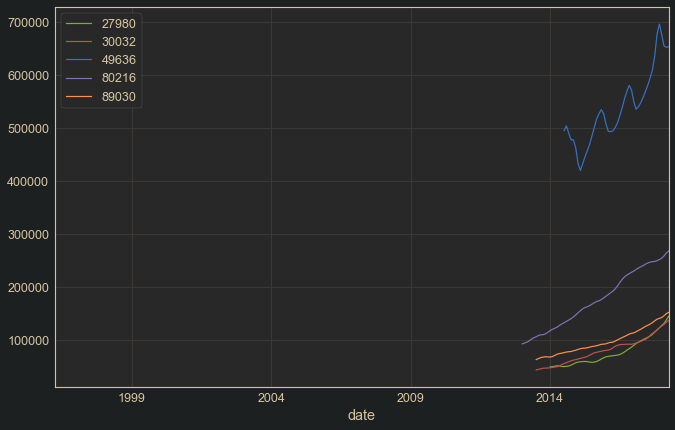

In [42]:
# I would like to compare the top five zipcodes from each list, to see if there is a visible
# difference in their performance
# First the top performers based on median:
for i in range(5):
    name = ten_best_median.index[i]
    zip_code = groups.get_group(name)
    display(zip_code.head())
    zip_code.set_index('date').value.plot(label=name)
plt.legend();

We can see that we've run into a problem related to NaN values. The zip codes above do not have data going back further than around 2014, which is after the recovery of the crash. This would explain why the central tendency of their returns would seem to outperform zip codes that had data during the crash.

,zipcode,City,State,Metro,CountyName,date,value
13409,27980,Hertford,NC,Elizabeth City,Perquimans,1996-04-01,NaN
28132,27980,Hertford,NC,Elizabeth City,Perquimans,1996-05-01,NaN
42855,27980,Hertford,NC,Elizabeth City,Perquimans,1996-06-01,NaN
57578,27980,Hertford,NC,Elizabeth City,Perquimans,1996-07-01,NaN
72301,27980,Hertford,NC,Elizabeth City,Perquimans,1996-08-01,NaN


,zipcode,City,State,Metro,CountyName,date,value
842,30032,Candler-Mcafee,GA,Atlanta,Dekalb,1996-04-01,NaN
15565,30032,Candler-Mcafee,GA,Atlanta,Dekalb,1996-05-01,NaN
30288,30032,Candler-Mcafee,GA,Atlanta,Dekalb,1996-06-01,NaN
45011,30032,Candler-Mcafee,GA,Atlanta,Dekalb,1996-07-01,NaN
59734,30032,Candler-Mcafee,GA,Atlanta,Dekalb,1996-08-01,NaN


,zipcode,City,State,Metro,CountyName,date,value
7302,80216,Denver,CO,Denver,Denver,1996-04-01,NaN
22025,80216,Denver,CO,Denver,Denver,1996-05-01,NaN
36748,80216,Denver,CO,Denver,Denver,1996-06-01,NaN
51471,80216,Denver,CO,Denver,Denver,1996-07-01,NaN
66194,80216,Denver,CO,Denver,Denver,1996-08-01,NaN


,zipcode,City,State,Metro,CountyName,date,value
1998,89030,North Las Vegas,NV,Las Vegas,Clark,1996-04-01,NaN
16721,89030,North Las Vegas,NV,Las Vegas,Clark,1996-05-01,NaN
31444,89030,North Las Vegas,NV,Las Vegas,Clark,1996-06-01,NaN
46167,89030,North Las Vegas,NV,Las Vegas,Clark,1996-07-01,NaN
60890,89030,North Las Vegas,NV,Las Vegas,Clark,1996-08-01,NaN


,zipcode,City,State,Metro,CountyName,date,value
4712,94621,Oakland,CA,San Francisco,Alameda,1996-04-01,NaN
19435,94621,Oakland,CA,San Francisco,Alameda,1996-05-01,NaN
34158,94621,Oakland,CA,San Francisco,Alameda,1996-06-01,NaN
48881,94621,Oakland,CA,San Francisco,Alameda,1996-07-01,NaN
63604,94621,Oakland,CA,San Francisco,Alameda,1996-08-01,NaN


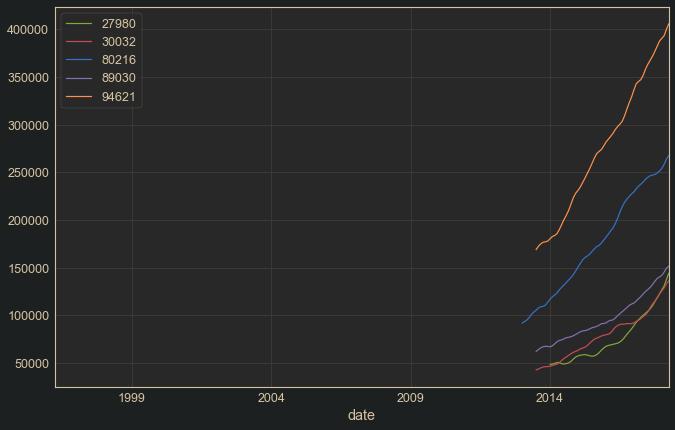

In [43]:
# Looking at the best performing based on mean
for i in range(5):
    name = ten_best_means.index[i]
    zip_code = groups.get_group(name)
    display(zip_code.head())
    zip_code.set_index('date').value.plot(label=name)
plt.legend();

Again, we are seeing the same problem. Zip codes which did not have data going back past around 2014 show better average performance than zip codes which had data during the crash.

In [44]:
# I need a list of zipcodes containing NaN values and count how many each has, because
# these could cause misrepresentations when combined with the rest of the zipcodes which have
# more historical data.
counts = {}
for name, group in groups:
    count = group.value.isna().sum()
    if count > 0:
        counts[name] = count

In [45]:
# Let's see how many zipcodes are missing values
len(counts)

1039

In [46]:
# I'm going to make panel data out of the data in case it comes in handy
index = pd.MultiIndex.from_frame(df2[['zipcode','date']].sort_values(['zipcode','date']))
panel = df2.reindex(index)

In [47]:
panel

zipcode City State Metro CountyName date  value
zipcode date                                                       
1001    1996-04-01      NaN  NaN   NaN   NaN        NaN  NaT    NaN
        1996-05-01      NaN  NaN   NaN   NaN        NaN  NaT    NaN
        1996-06-01      NaN  NaN   NaN   NaN        NaN  NaT    NaN
        1996-07-01      NaN  NaN   NaN   NaN        NaN  NaT    NaN
        1996-08-01      NaN  NaN   NaN   NaN        NaN  NaT    NaN
...                     ...  ...   ...   ...        ...  ...    ...
99901   2017-12-01      NaN  NaN   NaN   NaN        NaN  NaT    NaN
        2018-01-01      NaN  NaN   NaN   NaN        NaN  NaT    NaN
        2018-02-01      NaN  NaN   NaN   NaN        NaN  NaT    NaN
        2018-03-01      NaN  NaN   NaN   NaN        NaN  NaT    NaN
        2018-04-01      NaN  NaN   NaN   NaN        NaN  NaT    NaN

[3901595 rows x 7 columns]

In [48]:
# Checking number of dates in data
len(panel.loc[panel.index.levels[0][0]])

265

In [49]:
# Finding the number of dates in the data
for i, (name, group) in enumerate(groups):
    print("Number of dates in the data:", len(group.values))
    if i == 0:
        break

Number of dates in the data: 265


In [50]:
# We can see there are 1039 zip codes for which there is incomplete data over the time frame
# This is not a huge amount, but it does add a bit of complexity when comparing the performance
# of zip codes.
# Let's see how many values are missing from each of these zip codes, keeping in mind that
# there are 265 dates in total
N = 2000
res = dict(sorted(counts.items(), key = itemgetter(1), reverse = True)[:N]) 
for k, v in res.items():
    print(k, v)

2116 219
4009 219
16625 219
19954 219
22625 219
28039 219
28088 219
31527 219
32435 219
35759 219
35760 219
35810 219
35816 219
35824 219
39202 219
39216 219
43406 219
43443 219
43450 219
43466 219
43619 219
44491 219
45872 219
46320 219
46327 219
47336 219
47371 219
47373 219
47512 219
48157 219
49245 219
49253 219
49636 219
49950 219
53015 219
54230 219
56441 219
62215 219
62216 219
62440 219
62870 219
62882 219
62922 219
65259 219
66739 219
67544 219
68730 219
70431 219
70515 219
70647 219
72718 219
73173 219
74857 219
97435 219
97467 219
97499 219
10456 213
11749 213
12428 213
12458 213
13797 213
15943 213
21225 213
27980 213
29405 213
30288 213
32764 213
35773 213
35806 213
37184 213
38858 213
38862 213
38868 213
43013 213
43206 213
43211 213
43219 213
43569 213
44411 213
44449 213
49284 213
49799 213
50233 213
62401 213
65020 213
65556 213
65786 213
67062 213
67117 213
67156 213
70615 213
70812 213
75210 213
75941 213
78593 213
88044 213
88047 213
88048 213
89512 213
93268 213
93

96732 87
96779 87
96790 87
97801 87
97838 87
97862 87
97868 87
97882 87
97886 87
99320 87
99352 87
23015 21
23192 21
23047 15


In [51]:
# In order to truly compare zipcodes, we will need to only compare their average returns over
# time periods for which they share data.

### Looking at zipcodes without missing data

In [52]:
# First step is to compare all the zipcodes with full data, then compare the best from that 
# category with those for whom the data is more limited.
# I am going to stick with using means because I want low outliers caused by the crash to
# penalize the average scores more, so that I am left with the most resilient zip codes
indices = [ind for ind in log_ret_means.index if ind not in counts.keys()]
ten_best_means = log_ret_means.loc[indices].sort_values(ascending=False).iloc[:10]
ten_best_means

zipcode
11211    0.009472
11222    0.009263
11216    0.009063
7302     0.008872
11215    0.008700
11975    0.008692
11930    0.008553
80449    0.008290
90291    0.008228
20001    0.008161
dtype: float64

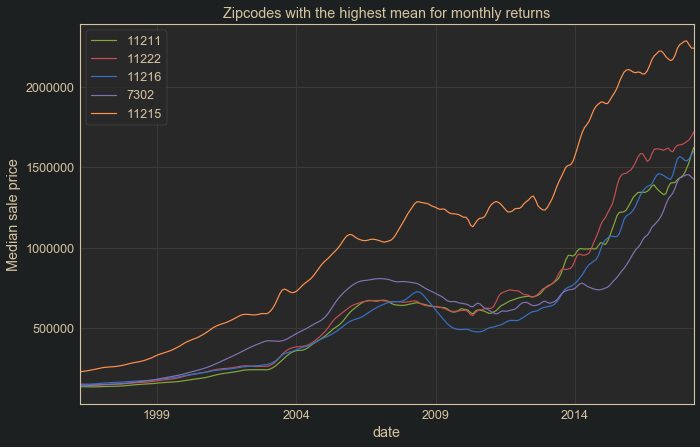

In [53]:
for i in range(5):
    name = ten_best_means.index[i]
    zip_code = groups.get_group(name)
    #display(zip_code.head())
    zip_code.set_index('date').value.plot(label=name)
plt.title("Zipcodes with the highest mean for monthly returns")
plt.ylabel("Median sale price")
plt.legend();

In [54]:
# As we can see, this has resulted in filtering to zip codes which were extraordinarily
# resilient to the crash, with some barely responding to the crisis.
# Another thing to note here is that these represent extremely expensive neighborhoods,
# which makes sense, since the wealthy would have been the least impacted by the economic crash
# This should make a handy benchmark to compare the monthly returns of zip codes which had
# incomplete data.
# Just out of curiosity, I'd like to run this process using the medians
indices = [ind for ind in medians.index if ind not in counts.keys()]
ten_best_medians = medians.loc[indices].sort_values(ascending=False).iloc[:10]
ten_best_medians

zipcode
2119     0.012063
94590    0.010718
2121     0.010642
94601    0.010595
86334    0.010589
7302     0.010361
94606    0.010297
90291    0.010271
11963    0.010095
2657     0.010090
dtype: float64

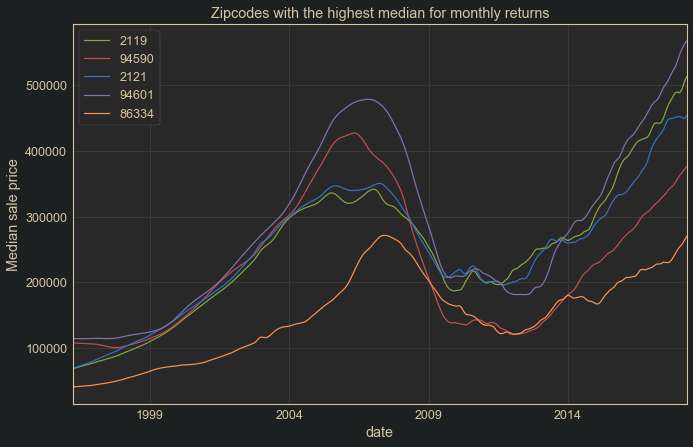

In [55]:
# We can see immediately that these values are higher, since the lower outliers have not 
# penalized the average as much. Let's look at a chart of the top 5
for i in range(5):
    name = ten_best_medians.index[i]
    zip_code = groups.get_group(name)
    #display(zip_code.head())
    zip_code.set_index('date').value.plot(label=name)
plt.title("Zipcodes with the highest median for monthly returns")
plt.ylabel("Median sale price")
plt.legend();

In [56]:
# Woof. We can see that these zip codes did not handle the crash nearly as well. Most of these
# lost over half of their value during the recession. These are much more middle-class homes,
# and these would have been the houses that people were taking loans that turned out to be
# out of their ability to pay, which ultimately got foreclosed on. However, it should be noted
# that the rate of their recovery was very solid after around 2013

# We will continue from here using the means for analysis

,City,State,Metro,CountyName,avgReturn
80449,Hartsel,CO,Denver,Park,0.00829042
57110,Sioux Falls,SD,Sioux Falls,Minnehaha,0.00792513
19125,Philadelphia,PA,Philadelphia,Philadelphia,0.0078984
19951,Harbeson,DE,Salisbury,Sussex,0.007889
30317,Atlanta,GA,Atlanta,Fulton,0.00766231


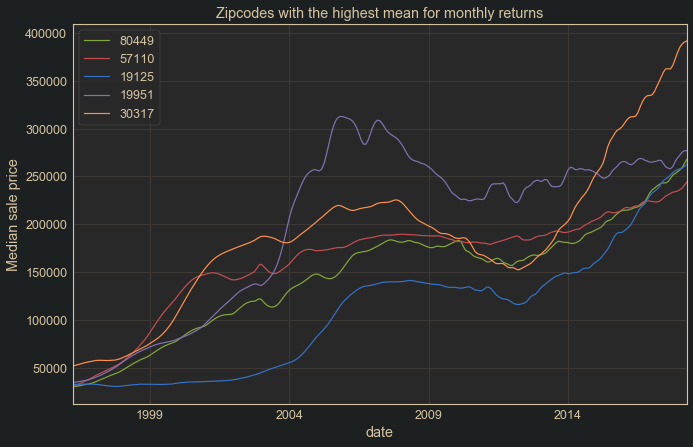

,City,State,Metro,CountyName,avgReturn
78702,Austin,TX,Austin,Travis,0.00765756
29403,Charleston,SC,Charleston,Charleston,0.0076441
28762,Old Fort,NC,Marion,McDowell,0.00760581
19147,Philadelphia,PA,Philadelphia,Philadelphia,0.00733891
80205,Denver,CO,Denver,Denver,0.00729196


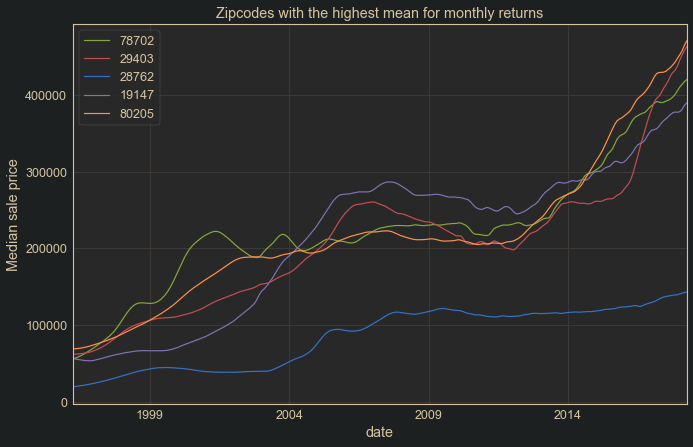

,City,State,Metro,CountyName,avgReturn
57005,Brandon,SD,Sioux Falls,Minnehaha,0.00726574
80456,Jefferson,CO,Denver,Park,0.00726346
71241,Farmerville,LA,Monroe,Union,0.00725226
19123,Philadelphia,PA,Philadelphia,Philadelphia,0.00721051
71234,Downsville,LA,Monroe,Union,0.00713303


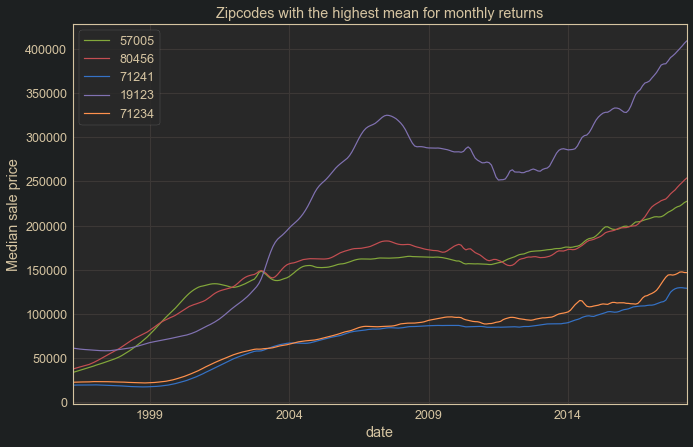

,City,State,Metro,CountyName,avgReturn
86334,Paulden,AZ,Prescott,Yavapai,0.00712895
2121,Boston,MA,Boston,Suffolk,0.00710357
33947,Rotonda West,FL,Punta Gorda,Charlotte,0.00710352
55449,Blaine,MN,Minneapolis-St Paul,Anoka,0.00707305
68523,Lincoln,NE,Lincoln,Lancaster,0.00683372


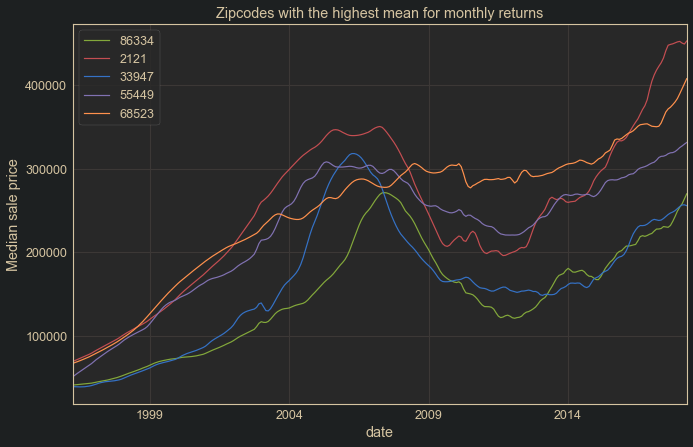

,City,State,Metro,CountyName,avgReturn
27583,Timberlake,NC,Durham,Person,0.00677721
57030,Garretson,SD,Sioux Falls,Minnehaha,0.00676346
37046,College Grove,TN,Nashville,Williamson,0.00674437
2128,Boston,MA,Boston,Suffolk,0.00671118
16611,Porter,PA,Huntingdon,Huntingdon,0.00663976


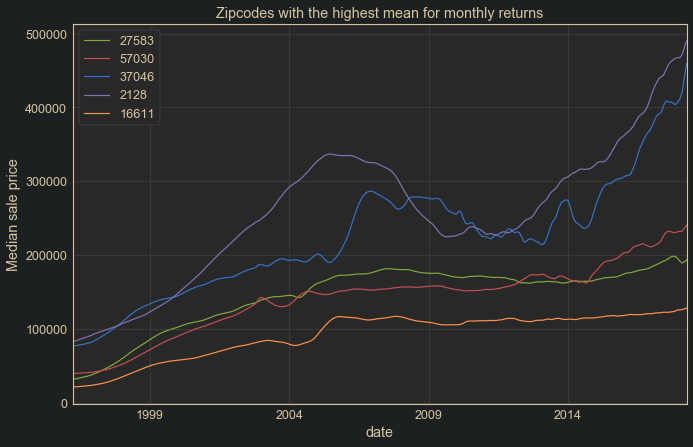

,City,State,Metro,CountyName,avgReturn
33701,Saint Petersburg,FL,Tampa,Pinellas,0.00661395
30547,Homer,GA,NaN,Banks,0.00660741
19130,Philadelphia,PA,Philadelphia,Philadelphia,0.00652333
15681,Loyalhanna,PA,Pittsburgh,Westmoreland,0.00652187
16844,Union,PA,State College,Centre,0.00650503


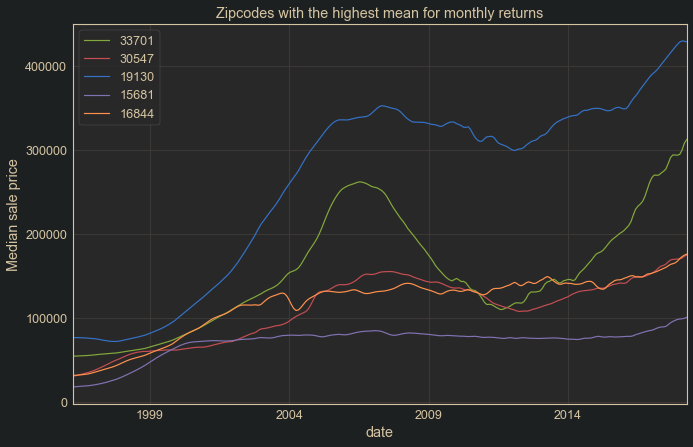

,City,State,Metro,CountyName,avgReturn
16669,Jackson,PA,Huntingdon,Huntingdon,0.00649649
78722,Austin,TX,Austin,Travis,0.00644289
97211,Portland,OR,Portland,Multnomah,0.00638069
15201,Pittsburgh,PA,Pittsburgh,Allegheny,0.00637644
30530,Commerce,GA,Jefferson,Jackson,0.00635241


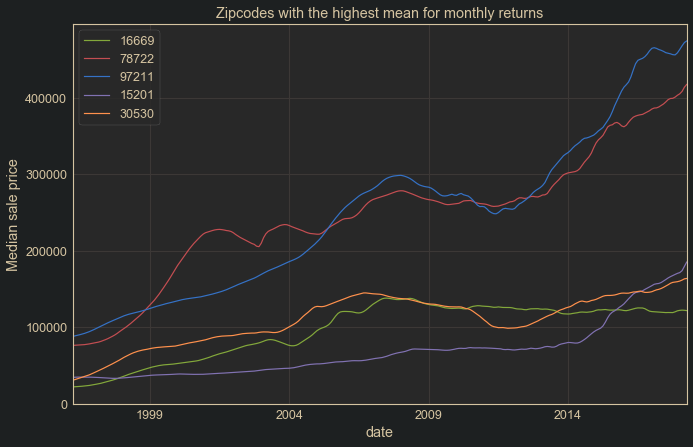

,City,State,Metro,CountyName,avgReturn
16875,Gregg,PA,State College,Centre,0.00633948
21231,Baltimore,MD,Baltimore,Baltimore City,0.0063352
19966,Millsboro,DE,Salisbury,Sussex,0.0063349
15687,Donegal,PA,Pittsburgh,Westmoreland,0.00632457
49814,Champion,MI,Marquette,Marquette,0.00631257


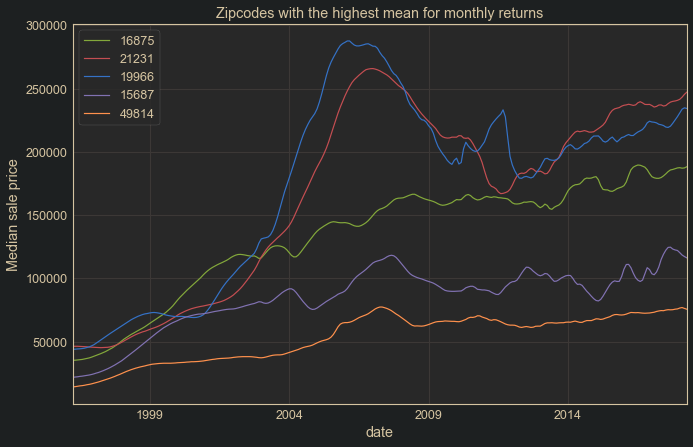

,City,State,Metro,CountyName,avgReturn
80207,Denver,CO,Denver,Denver,0.00630566
32680,Old Town,FL,NaN,Dixie,0.00629791
73103,Oklahoma City,OK,Oklahoma City,Oklahoma,0.00629502
80440,Fairplay,CO,Denver,Park,0.00627703
19145,Philadelphia,PA,Philadelphia,Philadelphia,0.0062124


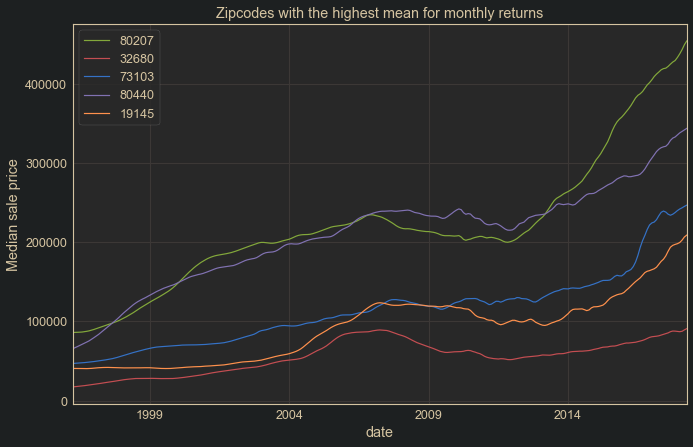

,City,State,Metro,CountyName,avgReturn
57003,Baltic,SD,Sioux Falls,Minnehaha,0.0062019
16870,Patton,PA,State College,Centre,0.00619539
17860,Shamokin,PA,Sunbury,Northumberland,0.00618594
19148,Philadelphia,PA,Philadelphia,Philadelphia,0.00618021
80204,Denver,CO,Denver,Denver,0.00617984


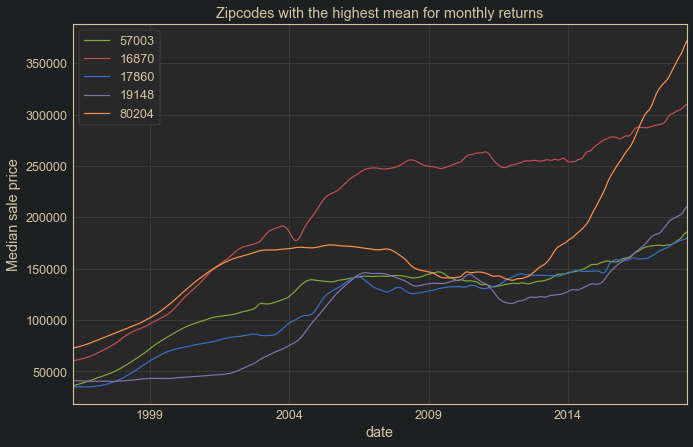

In [57]:
# What I will do now, to see if I can find any zip codes which were resilient, but also don't 
# cost a fortune to invest in, is iterate over the highest mean returns a few times, 5 at a time
# to see what I can find.

# Getting an ordered list of best performing zip codes
best_means = log_ret_means.loc[indices].sort_values(ascending=False)

# Creating a df to generate rows for view_dfs generated below
zips_df = df.set_index('zipcode')[['City', 
                                  'State', 
                                  'Metro', 
                                  'CountyName']].merge(pd.Series(best_means, 
                                                                 name='avgReturn'), 
                                                       left_index=True, 
                                                       right_on='zipcode')

n = 0
for i in range(10):
    j = 0
    view_df = pd.DataFrame()
    while j < 5:
        name = best_means.index[n]
        zip_code = groups.get_group(name)
        
        # Continue loop if most recent value is over 500k
        if zip_code.set_index('date').value.iloc[-1] > 500000:
            n += 1
            continue
        #display(zip_code.head())
        else:
            zip_code.set_index('date').value.plot(label=name)
            n += 1
            j += 1
            view_df = pd.concat([view_df, pd.DataFrame(zips_df.loc[name]).T], axis=0)
    display(view_df)
    plt.title("Zipcodes with the highest mean for monthly returns")
    plt.ylabel("Median sale price")
    plt.legend()
    plt.show()

In [58]:
# A look at the scores for these zipcodes for comparison
best_means

zipcode
11211    0.009472
11222    0.009263
11216    0.009063
7302     0.008872
11215    0.008700
           ...   
61012   -0.001501
15902   -0.001510
78735   -0.001783
48503   -0.002748
48506   -0.002881
Length: 13684, dtype: float64

Now that we have narrowed our view to zipcodes that have performed very well over the time frame, we notice that some of these zipcodes contain very expensive properties on average, up in the millions of dollars. Since buying and holding properties in hopes of capital appreciation comes with costs (property tax, insurance, maintenance, lost risk-free-rate investment), a real estate investment company would need to consider renting the properties it is holding over the investment horizon. This leads us to some questions: if the goal is to rent properties in the short term, what are the differences in renting luxury houses (million dollar homes) vs utility houses? Are there renters for luxury homes? What is the difference in profitability of renting luxury homes vs utility homes?<br>
<br>
A [very informative article](https://www.financialsamurai.com/real-estate-investing-rule-rent-luxury-buy-utility/) written by Sam Dogen, founder of Financial Samurai, explains the scenario from the perspective of a real estate investor and consultant. Dogen explains a principle that he calls BURL (Buy Utility, Rent Luxury), explaining that luxury homes, especially in coastal cities, tend to not have near the yearly profitability through renting as utility homes, and often have no profitability at all, with the rent merely covering the expenses of ownership, and in some cases not even doing that. He also mentions that the "valuations are stretched in expensive coastal cities." <br>
<br>
Here is an informative graphic from the article, sourced from [Zillow](https://www.zillow.com/research/where-rent-covers-mortgage-15624/):
![Zillow Analysis Graphic](https://i2.wp.com/financialsamurai.com/wp-content/uploads/2017/06/where-it-pays-to-be-a-landlord.jpg?fit=1456,9999)<br>

We can see from the chart that big expensive coastal cities have a low chance of profitability for renting out properties. Dogen makes clear in the article that it is better to buy less expensive properties in non-luxury cities, especially those in the Midwest, which can be rented for a much higher ratio to their value, in order to generate income. This means that for our client, we should be looking for the zip codes with the strongest growth and best resilience that do not predominantly contain expensive luxury homes. I will then hand select some of the zip codes shown above that currently have median values less than $ 500,000, and look more closely at them. 

In [59]:
# 20 zip codes meeting our criteria so far
good_zips = [80449, 19125, 57110, 19951, 30317, 78702, 29403, 28762, 2119, 19147, 80205,
             57005, 80456, 71241, 19123, 71234, 68523, 15201, 19145, 17860,
            ]
best_means.loc[good_zips]

zipcode
80449    0.008290
19125    0.007898
57110    0.007925
19951    0.007889
30317    0.007662
78702    0.007658
29403    0.007644
28762    0.007606
2119     0.007602
19147    0.007339
80205    0.007292
57005    0.007266
80456    0.007263
71241    0.007252
19123    0.007211
71234    0.007133
68523    0.006834
15201    0.006376
19145    0.006212
17860    0.006186
dtype: float64

,City,State,Metro,CountyName,avgReturn
80449,Hartsel,CO,Denver,Park,0.00829042
19125,Philadelphia,PA,Philadelphia,Philadelphia,0.0078984
57110,Sioux Falls,SD,Sioux Falls,Minnehaha,0.00792513
19951,Harbeson,DE,Salisbury,Sussex,0.007889
30317,Atlanta,GA,Atlanta,Fulton,0.00766231


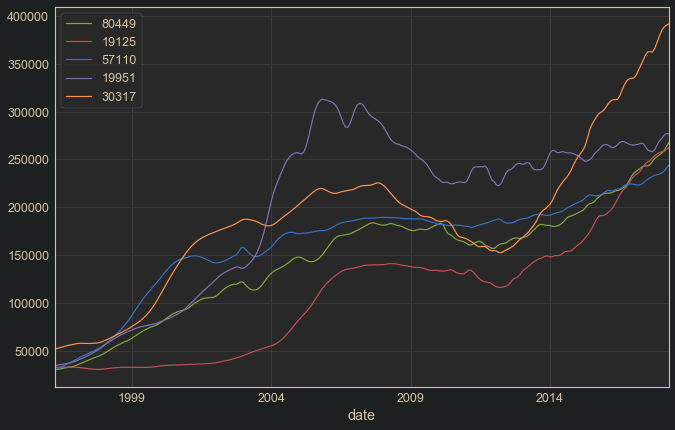

,City,State,Metro,CountyName,avgReturn
78702,Austin,TX,Austin,Travis,0.00765756
29403,Charleston,SC,Charleston,Charleston,0.0076441
28762,Old Fort,NC,Marion,McDowell,0.00760581
2119,Boston,MA,Boston,Suffolk,0.00760167
19147,Philadelphia,PA,Philadelphia,Philadelphia,0.00733891


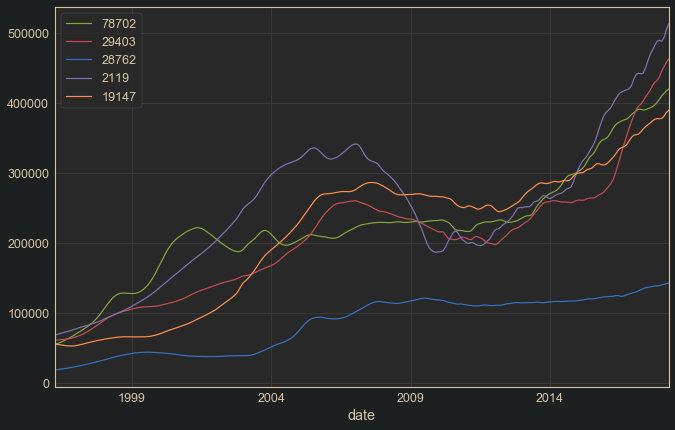

,City,State,Metro,CountyName,avgReturn
80205,Denver,CO,Denver,Denver,0.00729196
57005,Brandon,SD,Sioux Falls,Minnehaha,0.00726574
80456,Jefferson,CO,Denver,Park,0.00726346
71241,Farmerville,LA,Monroe,Union,0.00725226
19123,Philadelphia,PA,Philadelphia,Philadelphia,0.00721051


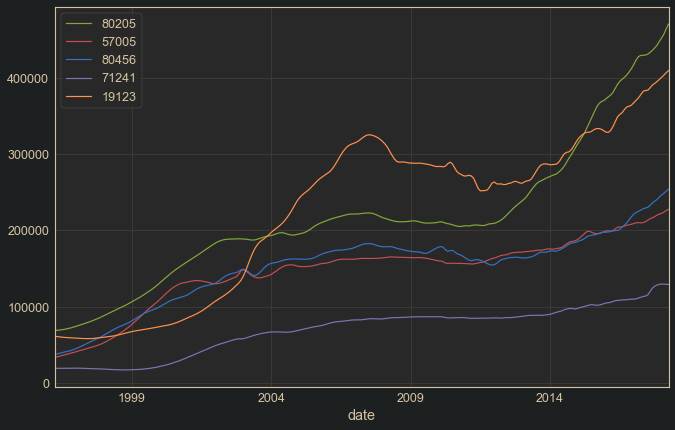

,City,State,Metro,CountyName,avgReturn
71234,Downsville,LA,Monroe,Union,0.00713303
68523,Lincoln,NE,Lincoln,Lancaster,0.00683372
15201,Pittsburgh,PA,Pittsburgh,Allegheny,0.00637644
19145,Philadelphia,PA,Philadelphia,Philadelphia,0.0062124
17860,Shamokin,PA,Sunbury,Northumberland,0.00618594


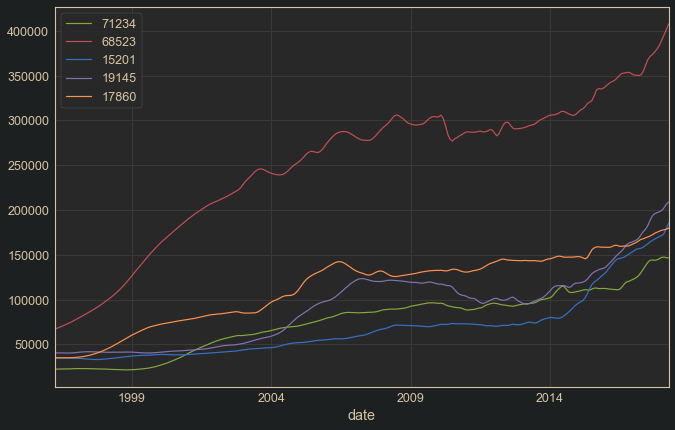

In [60]:
zips_df = df.set_index('zipcode').loc[good_zips][['City', 
                                                  'State', 
                                                  'Metro', 
                                                  'CountyName']].merge(pd.Series(best_means.loc[good_zips], 
                                                                                 name='avgReturn'), 
                                                                       left_index=True, 
                                                                       right_on='zipcode')

i = 1
view_df = pd.DataFrame()
for idx in good_zips:
    grp = groups.get_group(idx)
    view_df = pd.concat([view_df, pd.DataFrame(zips_df.loc[idx]).T], axis=0)
    grp.set_index('date').value.plot(label=idx)
    if i % 5 == 0:
        display(view_df)
        view_df = pd.DataFrame()
        plt.legend()
        plt.show()
    i += 1

A few things to note now that we have narrowed our view down to 15 zip codes is that among these candidates, some had better growth before the crash, then have mostly leveled off since then, while others have shown very strong growth more recently. Since our client would be investing in the current market, it is likely that it would be better to select the zip codes which are currently showing momentum. <br>
<br>
Looking at the actual locations of these candidates, there are a few we can probably dismiss. Boston is a no-go, and Austin does not look promising either. Philadelphia is a maybe, and there are three results from this area in this list. All of these have shown strong recent growth.
<br>
Sioux Falls, SD looks like a gem, with a nice linear upward trend, and a location which is not considered luxury. Brandon is in the same area, with a similar growth curve.<br>
<br>
Hartsel, CO looks goood, because it is in the Denver metro area, but a wikipedia and google search shows that it is a 2hr drive, with a population of 667, up in the mountains, so it may be somewhat of a luxury area. Nevertheless, the property is appreciating nicely, with the highest average monthly return on this list, so it might be worth consideration. A google search led me to [Xome.com](https://www.xome.com/homes-for-sale/CO/Hartsel), which says that in Hartsel, "approximately 31.24% of Hartsel homes are owned, compared to 0.48% rented, while 68.28% are vacant." Therefore, this is not a good prospect for real estate investors. Jefferson, CO is similarly located over an hour outside of Denver in a rural area with a small population.<br>
<br>
Harbeson can probably be ignored, because it has not had strong growth in the recent years. It is on this list mostly because of its resiliency to the crash and its rapid growth prior to it.<br>
<br>
The Atlanta zipcode has shown very strong growth in recent years. Sometimes fast growth means an upcoming pull back, but we'll keep this zip code in mind, as Atlanta is quite high up on the above Zillow list. A Google search reveals that this zip code is right outside of downtown, making it quite urban.<br>
<br>
Old Fort is intriguing. It has low prices, and was quite resilient to the crash. I am actually familiar with the town, as I used to drive past it on my way in and out of Asheville, NC, which is a rapidly growing area with high real estate prices. Old Fort is only 37 minutes away, and much cheaper, so it stands to reason that people might invest in Old Fort and commute to Asheville.<br>
<br>
Farmerville, LA is probably too small to consider, with not much more than a Wal-Mart, in a rural area of Louisiana. Downsville LA is nearly nonexistent, with a population of 137.

#### A note on investment diversity and risk exposure:
In finance, portfolio managers diversify investments in order to limit the amount of certain types of risk the portfolio is exposed to. This is often thought of in terms of sector (technology, financials, etc), but risk can be regional as well. This means that for a real estate investor, putting all of your eggs in one geographical basket is more risky than spreading them around, because something that affects one area may not affect another, and also something that affects metropolitan areas may affect more rural areas differently. In the context of this client, it stands to reason that they should invest in various areas, with some in urban areas, and some in more (but not completely) rural areas.

#### Notes so far:
Taking everything into consideration so far, it looks like Sioux Falls and Old Fort are good investment opportunities. Sioux Falls is much larger than Old Fort, but Old Fort is very close to Asheville, NC, which is a rapidly growing area, and a google search reveals that 45.38% of households in Old Fort are rentals. Atlanta looks very promising as an urban investment, with powerful recent growth, and the zipcode is right outside of downtown. Three seperate zipcodes from Philadelphia appeared in our list, all showing powerful recent growth as well as resilience to the crash. The best of these three should be considered a good investment opportunity. This gives us four prospects so far, and we have not yet looked at any of the zip codes which had missing data. One thing to note about zip codes with missing data is that they may have newer construction, which is always appealing, and new construction is generally placed in areas with expected growth. Let's move on now to inspect the zip codes that had missing data.

### Looking at zipcodes with missing data

In [61]:
# Let's take a fresh look at the dictionary of zipcodes that were missing data, and how many
# NaNs they contained
for k, v in counts.items():
    print('{}: {}'.format(k, v))

2116: 219
2301: 87
2302: 87
3215: 171
3240: 195
3256: 87
3838: 111
4008: 117
4009: 219
4037: 87
4093: 159
4357: 117
4429: 111
4530: 117
4562: 117
4963: 87
10011: 105
10014: 93
10021: 93
10456: 213
10459: 87
10550: 171
11101: 189
11205: 93
11217: 93
11231: 93
11238: 93
11749: 213
11944: 87
12138: 171
12428: 213
12458: 213
12775: 87
12783: 87
12790: 87
13607: 183
13656: 201
13797: 213
14025: 87
14030: 87
14032: 87
14033: 87
14080: 87
14201: 177
14222: 87
14716: 183
15067: 183
15333: 171
15442: 177
15552: 117
15931: 201
15943: 213
15958: 201
16041: 189
16102: 87
16112: 87
16116: 87
16120: 87
16142: 87
16143: 87
16156: 87
16157: 87
16613: 201
16625: 219
16637: 177
16912: 171
17236: 93
17252: 93
17744: 201
17752: 177
17771: 201
17965: 207
18252: 207
18326: 87
18332: 87
18344: 87
18350: 87
18372: 87
18435: 117
18444: 117
19901: 159
19904: 159
19934: 159
19938: 153
19939: 87
19943: 159
19945: 87
19946: 153
19952: 159
19953: 153
19954: 219
19962: 159
19963: 171
19964: 153
19977: 105
20871: 87


In [62]:
# I think the best way to deal with the variety of time windows missing from these zipcodes
# is to split them into lists which correspond to their amount of missing data, stored in 
# a dictionary, then iterate through the various missing data lengths, dropping any zip codes
# which have more missing data, then running a full comparison, and seeing if any of the newly
# added zip codes at any missing data length appear in the list of top 50 performing zip codes
# that result.
# First, I'm going to regenerate the original dictionary with ascending values
res = dict(sorted(counts.items(), key = itemgetter(1), reverse = False)) 
res

{23047: 15,
 23015: 21,
 23192: 21,
 2301: 87,
 2302: 87,
 3256: 87,
 4037: 87,
 4963: 87,
 10459: 87,
 11944: 87,
 12775: 87,
 12783: 87,
 12790: 87,
 14025: 87,
 14030: 87,
 14032: 87,
 14033: 87,
 14080: 87,
 14222: 87,
 16102: 87,
 16112: 87,
 16116: 87,
 16120: 87,
 16142: 87,
 16143: 87,
 16156: 87,
 16157: 87,
 18326: 87,
 18332: 87,
 18344: 87,
 18350: 87,
 18372: 87,
 19939: 87,
 19945: 87,
 20871: 87,
 21738: 87,
 21875: 87,
 24013: 87,
 24016: 87,
 27939: 87,
 27948: 87,
 27949: 87,
 27954: 87,
 27958: 87,
 28574: 87,
 28634: 87,
 28660: 87,
 30103: 87,
 30120: 87,
 30121: 87,
 30139: 87,
 30145: 87,
 30171: 87,
 30178: 87,
 30184: 87,
 31523: 87,
 31757: 87,
 32033: 87,
 32343: 87,
 32465: 87,
 33859: 87,
 34288: 87,
 34773: 87,
 37882: 87,
 42776: 87,
 45305: 87,
 45314: 87,
 45335: 87,
 45370: 87,
 45385: 87,
 45387: 87,
 45430: 87,
 48650: 87,
 48708: 87,
 49620: 87,
 50109: 87,
 50323: 87,
 55129: 87,
 55360: 87,
 56096: 87,
 57018: 87,
 57020: 87,
 57033: 87,
 57035: 8

In [63]:
last_length = 0
zip_groups = {}
lst = []
for k, v in res.items():
    if v != last_length:
        if len(lst) > 0:
            zip_groups[last_length] = lst
        lst = [k]
        last_length = v
    else:
        lst.append(k)

In [64]:
zip_groups

{15: [23047],
 21: [23015, 23192],
 87: [2301,
  2302,
  3256,
  4037,
  4963,
  10459,
  11944,
  12775,
  12783,
  12790,
  14025,
  14030,
  14032,
  14033,
  14080,
  14222,
  16102,
  16112,
  16116,
  16120,
  16142,
  16143,
  16156,
  16157,
  18326,
  18332,
  18344,
  18350,
  18372,
  19939,
  19945,
  20871,
  21738,
  21875,
  24013,
  24016,
  27939,
  27948,
  27949,
  27954,
  27958,
  28574,
  28634,
  28660,
  30103,
  30120,
  30121,
  30139,
  30145,
  30171,
  30178,
  30184,
  31523,
  31757,
  32033,
  32343,
  32465,
  33859,
  34288,
  34773,
  37882,
  42776,
  45305,
  45314,
  45335,
  45370,
  45385,
  45387,
  45430,
  48650,
  48708,
  49620,
  50109,
  50323,
  55129,
  55360,
  56096,
  57018,
  57020,
  57033,
  57035,
  57078,
  57104,
  57105,
  57106,
  57107,
  61011,
  63101,
  68832,
  72764,
  73150,
  78616,
  79415,
  80642,
  83263,
  86315,
  86413,
  89448,
  89449,
  93529,
  93546,
  93664,
  95228,
  95249,
  95453,
  96020,
  96708,
  9

In [65]:
# checking how using the dictionary keys with iloc would work
log_rets.iloc[15:][23047].head()

1997-07         NaN
1997-08    0.042354
1997-09    0.041769
1997-10    0.040094
1997-11    0.038549
Name: 23047, dtype: float64

In [66]:
# we can see that we'll need to add 1 to each key to correctly limit the time window
log_rets.iloc[15+1:][23047].head()

1997-08    0.042354
1997-09    0.041769
1997-10    0.040094
1997-11    0.038549
1997-12    0.041158
Name: 23047, dtype: float64

zipcode
11238    0.008528
11217    0.007365
68526    0.006950
11231    0.006692
dtype: float64

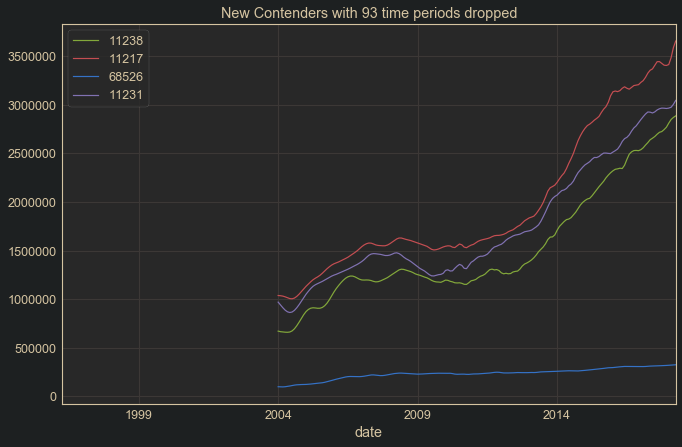

zipcode
10011    0.007016
dtype: float64

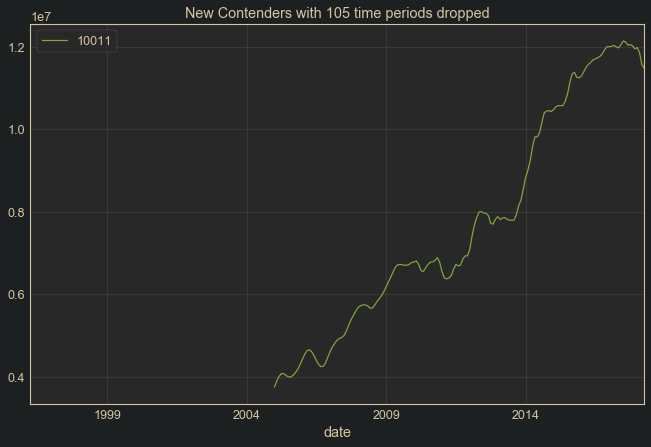

zipcode
58801    0.008190
96771    0.005774
dtype: float64

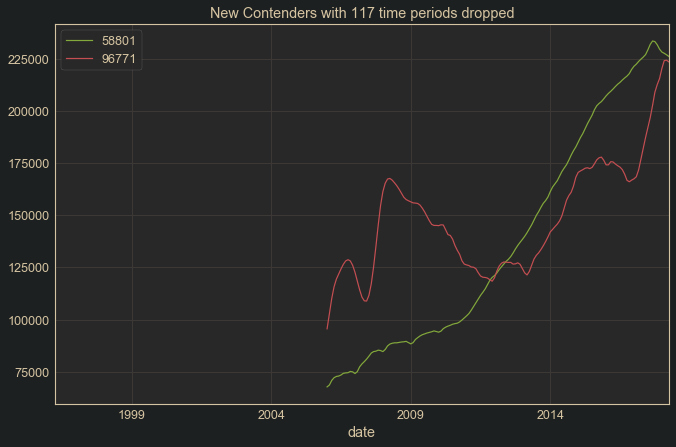

zipcode
58318    0.00611
dtype: float64

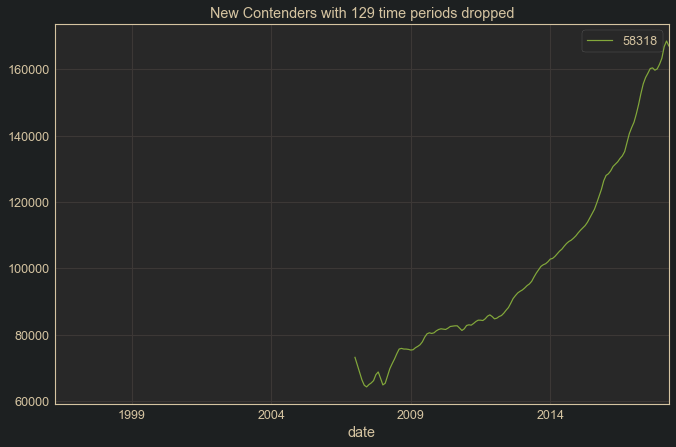

zipcode
85035    0.012214
94608    0.010032
dtype: float64

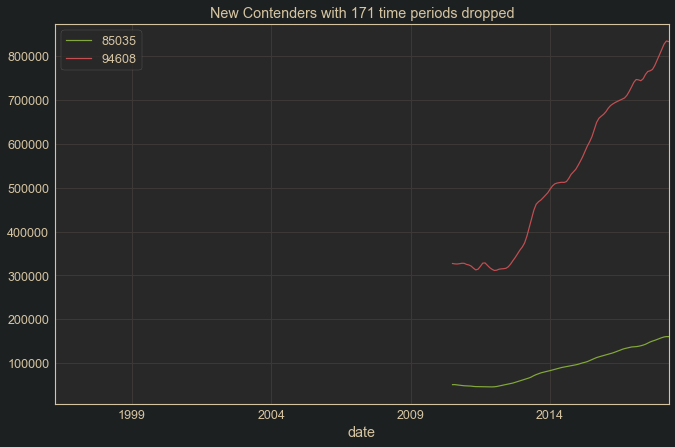

zipcode
33974    0.012062
33976    0.012003
dtype: float64

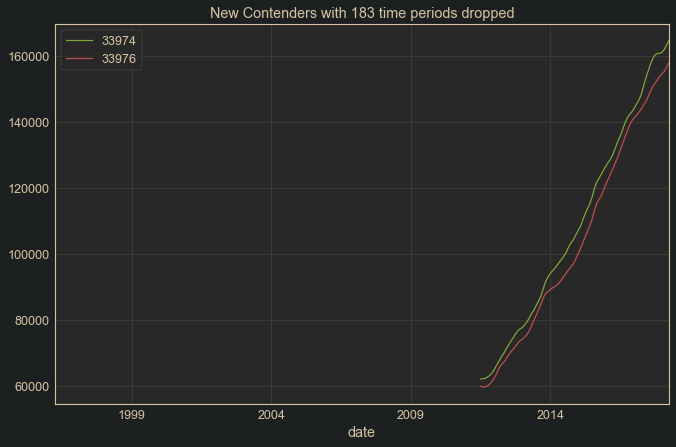

zipcode
80216    0.016964
dtype: float64

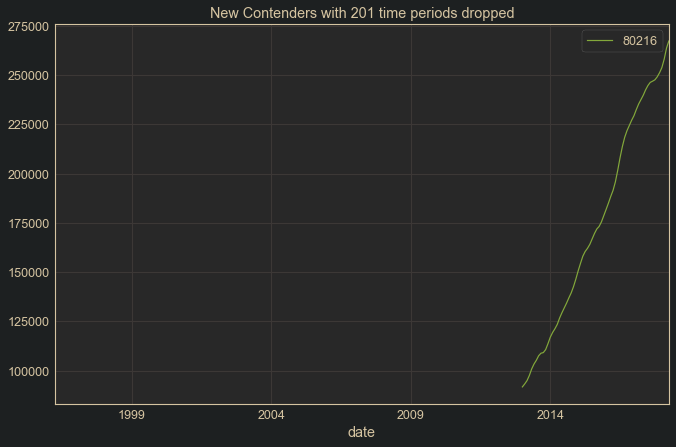

zipcode
30032    0.020352
89030    0.015623
94621    0.015365
dtype: float64

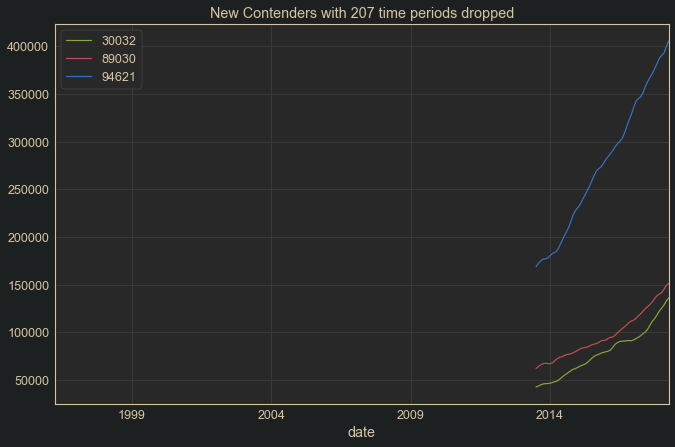

zipcode
27980    0.021365
dtype: float64

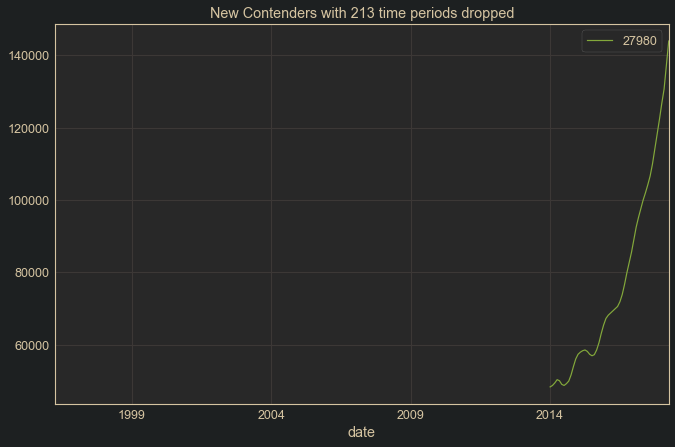

In [67]:
# The dictionary is ready, now to make comparisons on each time window
contenders = {}
for k, v in zip_groups.items():
    to_drop = []
    
    # Create list of zip codes to drop which have missing data in the current time window
    for key, val, in zip_groups.items():
        if key > k:
            to_drop.append(val)
    to_drop = [item for sublist in to_drop for item in sublist]
    
    lrmeans = log_rets.iloc[k+1:].mean()
    indices = [ind for ind in lrmeans.index if ind not in to_drop]
    fifty_best = lrmeans.loc[indices].sort_values(ascending=False).iloc[:50]
    # Find any new zip codes appearing in top 50
    new_contenders = [x for x in fifty_best.index if x in v]
    new_contenders = fifty_best.loc[new_contenders]
    # create dictionary for current time window and store info
    contenders[k] = {}
    contenders[k]['contenders'] = new_contenders
    contenders[k]['fifty_best'] = fifty_best
    
    # display contenders of time window and plot them
    if len(new_contenders) > 0:
        display(new_contenders)
        for cont in new_contenders.index:
            grp = groups.get_group(cont)
            grp.set_index('date').value.plot(label=cont)
        plt.title('New Contenders with {} time periods dropped'.format(k))
        plt.legend()
    plt.show()

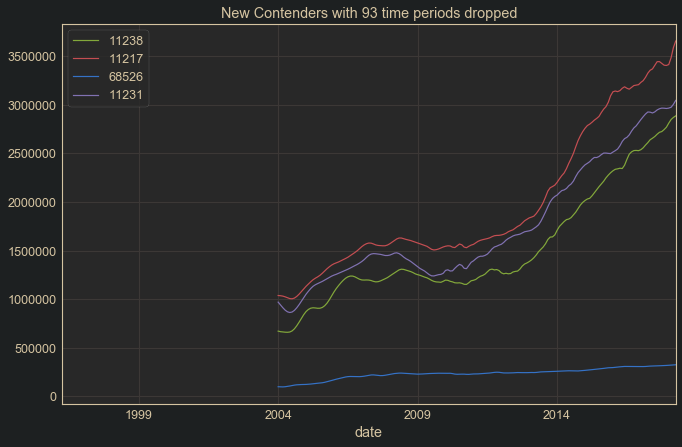

Average mean return of top fifty zip codes for time period: 0.007150373586415396


,City,State,Metro,CountyName,avgReturn
zipcode,,,,,
11238,New York,NY,New York,Kings,0.008528
11217,New York,NY,New York,Kings,0.007365
68526,Lincoln,NE,Lincoln,Lancaster,0.006950
11231,New York,NY,New York,New York,0.006692


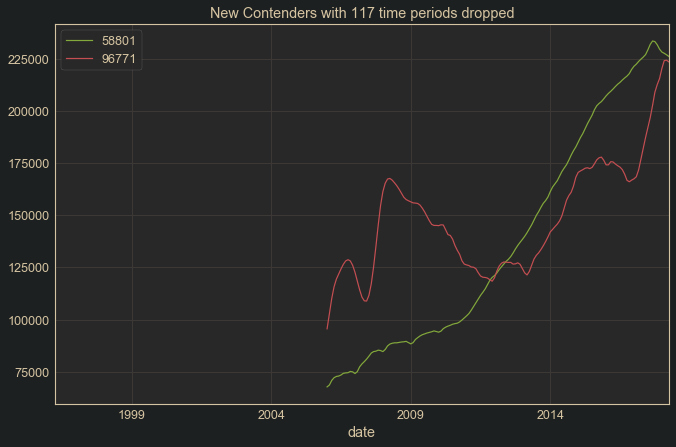

Average mean return of top fifty zip codes for time period: 0.006624902794140936


,City,State,Metro,CountyName,avgReturn
zipcode,,,,,
58801,Williston,ND,Williston,Williams,0.008190
96771,Mountain View,HI,Hilo,Hawaii,0.005774


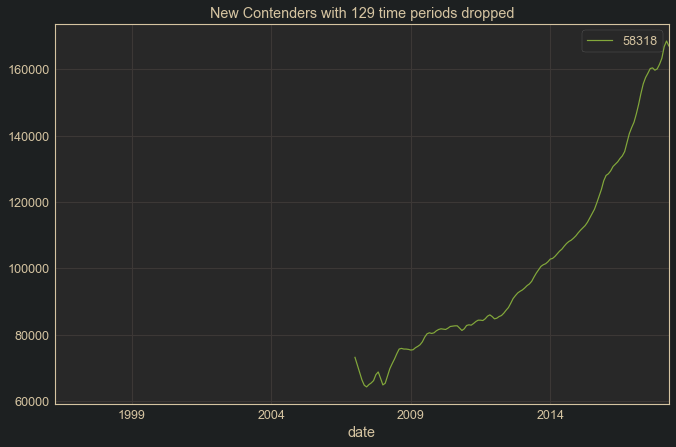

Average mean return of top fifty zip codes for time period: 0.006717214501357673


,City,State,Metro,CountyName,avgReturn
zipcode,,,,,
58318,Bottineau,ND,NaN,Bottineau,0.00611


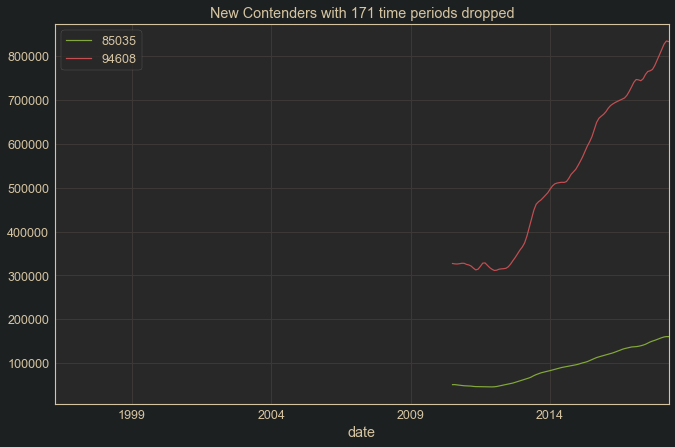

Average mean return of top fifty zip codes for time period: 0.010455729787478472


,City,State,Metro,CountyName,avgReturn
zipcode,,,,,
85035,Phoenix,AZ,Phoenix,Maricopa,0.012214
94608,Oakland,CA,San Francisco,Alameda,0.010032


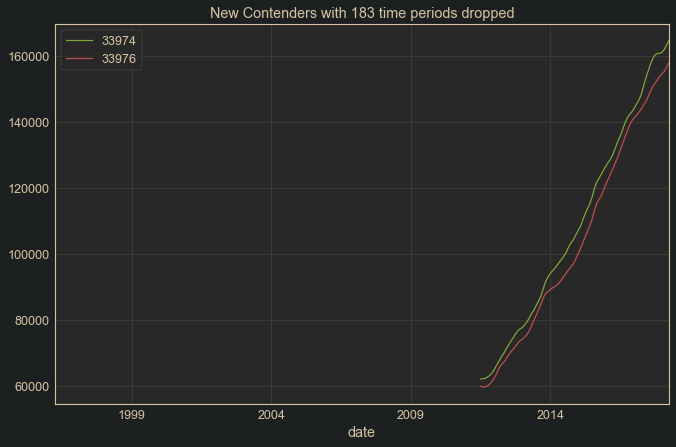

Average mean return of top fifty zip codes for time period: 0.012615718348460394


,City,State,Metro,CountyName,avgReturn
zipcode,,,,,
33974,Lehigh Acres,FL,Fort Myers,Lee,0.012062
33976,Lehigh Acres,FL,Fort Myers,Lee,0.012003


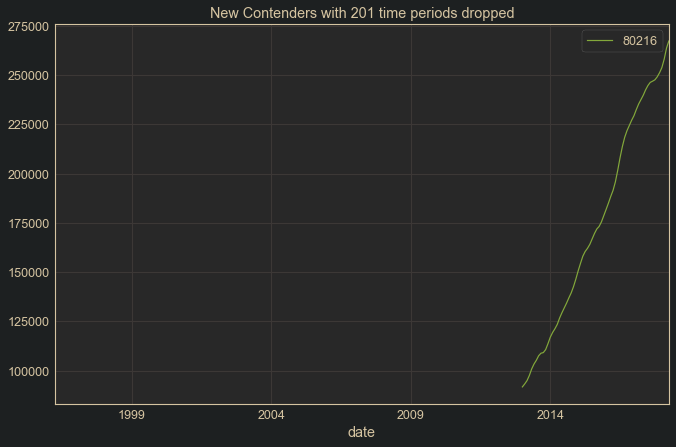

Average mean return of top fifty zip codes for time period: 0.014806659730997236


,City,State,Metro,CountyName,avgReturn
zipcode,,,,,
80216,Denver,CO,Denver,Denver,0.016964


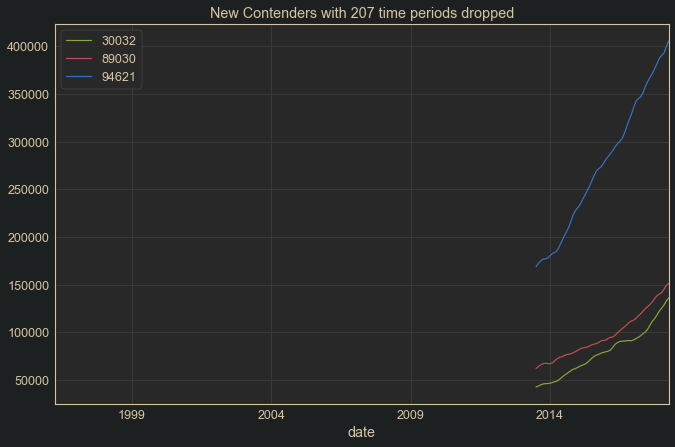

Average mean return of top fifty zip codes for time period: 0.014679695609137068


,City,State,Metro,CountyName,avgReturn
zipcode,,,,,
30032,Candler-Mcafee,GA,Atlanta,Dekalb,0.020352
89030,North Las Vegas,NV,Las Vegas,Clark,0.015623
94621,Oakland,CA,San Francisco,Alameda,0.015365


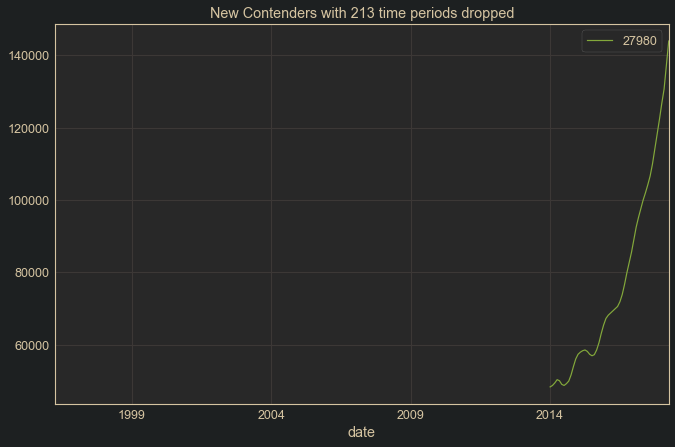

Average mean return of top fifty zip codes for time period: 0.015083719392837886


,City,State,Metro,CountyName,avgReturn
zipcode,,,,,
27980,Hertford,NC,Elizabeth City,Perquimans,0.021365


In [68]:
# We can see some promising contenders, and some to be ignored. I will ignore the 105 period
# drop, because we aren't in the market for $10 million houses
# We will also need to view these contenders in their relations to the other best zip codes
# in the time frames, so I will print the average mean return of the top fifty to see how
# the new contenders compare to the mean value
for k, v in contenders.items():
    if k == 105:
        continue
    if len(v['contenders']) > 0:
        idx = v['contenders'].index
        for cont in idx:
            grp = groups.get_group(cont)
            grp.set_index('date').value.plot(label=cont)
        plt.title('New Contenders with {} time periods dropped'.format(k))
        plt.legend()
        plt.show()
        print('Average mean return of top fifty zip codes for time period: {}'.format(v['fifty_best'].mean()))
        zips_df = df.set_index('zipcode').loc[idx][['City', 
                                                  'State', 
                                                  'Metro', 
                                                  'CountyName']].merge(pd.Series(v['contenders'], 
                                                                                 name='avgReturn'), 
                                                                       left_index=True, 
                                                                       right_on='zipcode')
        display(zips_df)
        #idx = v['fifty_best'].index
        #zips_df = df.set_index('zipcode').loc[idx][['City', 
        #                                          'State', 
        #                                          'Metro', 
        #                                          'CountyName']].merge(pd.Series(v['fifty_best'], 
        #                                                                         name='avgReturn'), 
        #                                                               left_index=True, 
        #                                                               right_on='zipcode')        
        #display(zips_df)
        print('===============================================================================')

#### Notes:
In the first time window we see three NYC zip codes, with expensive properties, so these are out. However, the fourth is Lincoln, Nebraska, which fits our criteria for good real estate investment, as it is in the Midwest, the median price is falling below 500k, and these prices appear to have been resilient during the crash.<br>
<br>
In the second time window we see a volatile zipcode in Hawaii which underperformed the average of the top fifty of this window, but we also see a promising zip code in Williston, North Dakota, which is certainly meeting our criteria for good investment, with rapid recent growth, resilience during the crash, and Midwestern location.<br>
<br>
In the third time window, we see another promising North Dakota zip code, with strong recent growth. This is a much smaller town than the other ND zip code, however, with only a tenth of the population of Williston, so it may not be as good of a candidate for investment.<br>
<br>
In the fourth time window, we see a San Francisco zip code, which is right out. However, the other zip code is Phoenix, AZ, which is promising indeed. The growth rate is high, the Zillow chart shows that rentals are profitable, and it is a populous area with businesses, home to 1.66 million people.<br>
<br>
In the next time window we see two zipcodes from the same town in Florida called Lehigh Acres, which has shown excellent growth. At this point, no commentary on resiliency to the crash can be made, as it is outside the time window.<br>
<br>
The next window has a zipcode from Denver with reasonable prices and a good growth rate. Denver appears pretty low on our chart from earlier, nearby Austin, so it may not be a good choice.
<br>
The next window shows three zip codes with reasonable prices outperforming the mean of the top 50 zip codes over this time period. The San Francisco one can probably be ignored, but the other two are promising. The one near Atlanta, Candler-McCafee has tremendous growth. The other is in Las Vegas, which appeared high on the Zillow Chart, and could be a good prospect.<br>
<br>
The final window shows a town called Hertford, NC, showing explosive growth since 2014, far exceeding the mean of performance of the top 50 zip codes over this time period. This is a small town on the Pariquimans River in eastern NC.

#### Notes so far:
This investigation has given us plently to choose from. In order to narrow down our candidates, I have found a useful metric and related data in [this Zillow Research article](https://www.zillow.com/research/where-rent-covers-mortgage-15624/) called Price to Rent Ratio. This ratio and parts of this article were also referenced in Sam Dogen's Investment Samurai article mentioned earlier. The article talks about the importance of an investor being sure that the amount that they can charge to rent a property is high enough to cover the costs of owning and maintaining the property. Both articles agree that this is most of an issue in larger metros on the West Coast and Northeast US. In some areas, the amount one can charge for rent will not cover the costs of ownership, so an investor needs to make sure that they are not buying in an area where this is a typical problem. But since breaking even with rent isn't as nice as profiting from rent, the ratio can help a keen investor get the most bang for their buck.<br>
<br>
The nationwide average (at the time of the article) of the Price-to-Rent Ratio was 11.4, meaning that it would take 11.4 years of rent to cover the cost of the house. In Sam Dogen's article, he recommended to invest in houses that trade at or below 9.6. Using this information, we should be able to narrow our choices down. It is likely that the more rural town on our list of contenders will not appear in this dataset, but we were hoping to diversify between rural and urban areas, so this should help us pinpoint which cities are most profitable. This is important since an investor with widely spread assets geographically will need to hire property management companies to attend to the maintenance and related issues of landlordship for their properties, which will take a cut. According to [this Zillow article](https://www.zillow.com/rental-manager/resources/hiring-a-property-manager/), a property management company will usually take a cut between 7% and 10% of monthly rent.

In [69]:
# Importing the data
p2r = pd.read_csv('price_to_rent.csv')
p2r.head()

,Region Name,Region Name (group),National Average,P2R,Zhvi
0,"Yuma, AZ",Other,11.44,12.18,"$134,200"
1,"Yuba City, CA",Other,11.44,14.90,"$249,400"
2,"Youngstown, OH",Other,11.44,8.86,"$85,400"
3,"York, PA",Other,11.44,10.55,"$163,600"
4,"Yakima, WA",Other,11.44,13.51,"$181,700"


Let's make a concise list of the zip codes that have caught our attention so far:
1. 57110 - Sioux Falls, SD
2. 28762 - Old Fort, NC (Marion)
3. 19125 - Philadelphia, PA
4. 30317 - Atlanta, GA
5. 68526 - Lincoln, NE
6. 58801 - Williston, ND
7. 85035 - Phoenix, AZ
8. 33974 - Lehigh Acres, FL (Fort Myers)
9. 30032 - Candler-Mcafee, GA (Atlanta)
10. 89030 - North Las Vegas, NV (Las Vegas)
11. 27980 - Hertford, NC (Elizabeth City)

In [70]:
# Let's get a dataframe going of our candidates:
selections = [57110, 28762, 19125, 30317, 68526, 58801, 85035, 33974, 30032, 89030, 27980]
selections = df.set_index('zipcode').loc[selections]
selections

,City,State,Metro,CountyName,1996-04,1996-05,1996-06,1996-07,1996-08,1996-09,...,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04
zipcode,,,,,,,,,,,,,,,,,,,,,
57110,Sioux Falls,SD,Sioux Falls,Minnehaha,30100.0,31200.0,32300.0,33400.0,34600.0,35800.0,...,229500,230900,232200,233500,234000,234700,236000,237700,240800,243900
28762,Old Fort,NC,Marion,McDowell,19200.0,19700.0,20100.0,20600.0,21000.0,21500.0,...,137100,137600,138100,138800,139000,139400,140600,141400,142100,143000
19125,Philadelphia,PA,Philadelphia,Philadelphia,32600.0,32700.0,32800.0,32800.0,32900.0,32900.0,...,247500,249000,251600,253900,255700,257100,258000,258500,260500,262300
30317,Atlanta,GA,Atlanta,Fulton,51800.0,52500.0,53200.0,53900.0,54500.0,55200.0,...,362500,362500,362300,366000,372400,379200,384900,388400,390400,391600
68526,Lincoln,NE,Lincoln,Lancaster,NaN,NaN,NaN,NaN,NaN,NaN,...,313600,315000,315500,315800,316600,318200,319700,321300,323100,324900
58801,Williston,ND,Williston,Williams,NaN,NaN,NaN,NaN,NaN,NaN,...,229200,231800,233400,233100,231600,229500,228100,227500,226800,226000
85035,Phoenix,AZ,Phoenix,Maricopa,NaN,NaN,NaN,NaN,NaN,NaN,...,146100,148800,150800,152500,154600,156800,158600,160200,161000,161000
33974,Lehigh Acres,FL,Fort Myers,Lee,NaN,NaN,NaN,NaN,NaN,NaN,...,155400,157500,159200,160400,160900,160900,161200,162100,163400,164700
30032,Candler-Mcafee,GA,Atlanta,Dekalb,NaN,NaN,NaN,NaN,NaN,NaN,...,103300,107700,111700,114600,118300,122300,125400,128600,132800,135900


In [71]:
# Creating a new column in a similar format to the p2r data
selections['cityState'] = selections.Metro + ', ' + selections.State
selections

,City,State,Metro,CountyName,1996-04,1996-05,1996-06,1996-07,1996-08,1996-09,...,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04,cityState
zipcode,,,,,,,,,,,,,,,,,,,,,
57110,Sioux Falls,SD,Sioux Falls,Minnehaha,30100.0,31200.0,32300.0,33400.0,34600.0,35800.0,...,230900,232200,233500,234000,234700,236000,237700,240800,243900,"Sioux Falls, SD"
28762,Old Fort,NC,Marion,McDowell,19200.0,19700.0,20100.0,20600.0,21000.0,21500.0,...,137600,138100,138800,139000,139400,140600,141400,142100,143000,"Marion, NC"
19125,Philadelphia,PA,Philadelphia,Philadelphia,32600.0,32700.0,32800.0,32800.0,32900.0,32900.0,...,249000,251600,253900,255700,257100,258000,258500,260500,262300,"Philadelphia, PA"
30317,Atlanta,GA,Atlanta,Fulton,51800.0,52500.0,53200.0,53900.0,54500.0,55200.0,...,362500,362300,366000,372400,379200,384900,388400,390400,391600,"Atlanta, GA"
68526,Lincoln,NE,Lincoln,Lancaster,NaN,NaN,NaN,NaN,NaN,NaN,...,315000,315500,315800,316600,318200,319700,321300,323100,324900,"Lincoln, NE"
58801,Williston,ND,Williston,Williams,NaN,NaN,NaN,NaN,NaN,NaN,...,231800,233400,233100,231600,229500,228100,227500,226800,226000,"Williston, ND"
85035,Phoenix,AZ,Phoenix,Maricopa,NaN,NaN,NaN,NaN,NaN,NaN,...,148800,150800,152500,154600,156800,158600,160200,161000,161000,"Phoenix, AZ"
33974,Lehigh Acres,FL,Fort Myers,Lee,NaN,NaN,NaN,NaN,NaN,NaN,...,157500,159200,160400,160900,160900,161200,162100,163400,164700,"Fort Myers, FL"
30032,Candler-Mcafee,GA,Atlanta,Dekalb,NaN,NaN,NaN,NaN,NaN,NaN,...,107700,111700,114600,118300,122300,125400,128600,132800,135900,"Atlanta, GA"


In [72]:
# Now to see which of the selection has a corresponding entry in the p2r data
p2r[p2r['Region Name'].isin(selections.cityState)]

,Region Name,Region Name (group),National Average,P2R,Zhvi
168,"Phoenix, AZ",Other,11.44,14.48,"$231,700"
169,"Philadelphia, PA",Other,11.44,11.20,"$215,400"
251,"Marion, NC",Other,11.44,10.43,"$119,600"
272,"Lincoln, NE",Other,11.44,10.45,"$156,400"
282,"Las Vegas, NV",Other,11.44,14.36,"$217,800"
390,"Fort Myers, FL",Other,11.44,10.80,"$222,900"
548,"Atlanta, GA",Other,11.44,10.93,"$175,200"


In [73]:
# This has worked, although none of the p2r values of our list of selections actually falls
# below the recommended 9.6. This is likely due to the fact that we originally filtered for zip
# codes with promising captial appreciation rates, and it stands to reason that the highest
# performing zip codes may not have the best p2r ratios. However, many of our selections do have
# p2r ratios which are below the national average, so this is not bad, and could be considered
# a satisfactory result, especially since the article the data was sourced from mentioned that
# the vast majority of american cities had houses which could be rented for a profit, so beating
# the national average of p2r means that you're going to be profiting, and at a better rate than
# the majority of cities in the US.

In [74]:
# A quick check for Denver
p2r[p2r['Region Name'] == 'Denver, CO']

,Region Name,Region Name (group),National Average,P2R,Zhvi
433,"Denver, CO",Other,11.44,14.65,"$359,100"


In [75]:
# I'd like to see if I can get p2r info for the selections we missed by finding the closest
# metro that the p2r data contains.
# First to try Sioux Falls
p2r[p2r['Region Name'].str.contains('SD')]

,Region Name,Region Name (group),National Average,P2R,Zhvi


In [76]:
# It appears no data from South Dakota is available, let's try the closest city
p2r[p2r['Region Name'].str.contains('MN')]

,Region Name,Region Name (group),National Average,P2R,Zhvi
8,"Winona, MN",Other,11.44,10.29,"$143,300"
12,"Willmar, MN",Other,11.44,11.31,"$163,000"
134,"Rochester, MN",Other,11.44,11.36,"$183,900"
182,"Owatonna, MN",Other,11.44,10.72,"$156,900"
235,"Minneapolis-St Paul, MN",Other,11.44,12.63,"$239,700"
255,"Mankato, MN",Other,11.44,11.12,"$178,700"
401,"Faribault, MN",Other,11.44,12.41,"$204,900"
426,"Duluth, MN",Other,11.44,10.31,"$136,300"
544,"Austin, MN",Other,11.44,8.24,"$96,200"


In [77]:
# Sioux Falls is close to Austin, MN, which is closer to the metro than Sioux Falls, so it can
# be assumed that the p2r is similar between the two. 8.24 is a good result.
# Now let's look for Williston, ND proxies
p2r[p2r['Region Name'].str.contains('ND')]

,Region Name,Region Name (group),National Average,P2R,Zhvi
234,"Minot, ND",Other,11.44,12.57,"$203,900"
321,"Jamestown, ND",Other,11.44,11.29,"$163,300"
372,"Grand Forks, ND",Other,11.44,10.43,"$149,500"
402,"Fargo, ND",Other,11.44,12.71,"$205,300"
430,"Dickinson, ND",Other,11.44,12.36,"$201,000"
517,"Bismarck, ND",Other,11.44,13.66,"$242,400"


In [78]:
# It looks as though renters in North Dakota aren't willing to pay very much, the closest
# on the above list to Williston is Minot, which has a high p2r. Not ideal.
# The last one to try for is Hertford/Elizabeth City
p2r[p2r['Region Name'].str.contains('NC')]

,Region Name,Region Name (group),National Average,P2R,Zhvi
7,"Winston-Salem, NC",Other,11.44,10.52,"$129,700"
10,"Wilson, NC",Other,11.44,9.94,"$123,500"
11,"Wilmington, NC",Other,11.44,12.69,"$208,600"
111,"Sanford, NC",Other,11.44,10.18,"$121,400"
131,"Rocky Mount, NC",Other,11.44,8.65,"$82,000"
147,"Raleigh, NC",Other,11.44,12.80,"$221,600"
180,"Oxford, NC",Other,11.44,10.89,"$145,700"
226,"Morehead City, NC",Other,11.44,15.79,"$246,300"
251,"Marion, NC",Other,11.44,10.43,"$119,600"
322,"Jacksonville, NC",Other,11.44,11.97,"$129,400"


In [79]:
# The closest on the above list is Rocky Mount, with 8.65, which is a good result.
# A Google search shows that 51.21% of households in Hertford are rentals.

#### Notes so far:
So far we have narrowed down prospect by a number of criteria. For zip codes which we had enough data, we checked for resilience to the market crash. We have selected based on overall growth, and then we were able to find which zip codes were part of metros with acceptable Price-to-Rent ratios. We should also take into account whether people actually rent in these places, so I will try and add that to a convenient dataframe now. It would also be helpful to compare our selections average returns over the same time period, to see if they are all beating the average growth in the last few years.

In [80]:
# From our selections, we will remove those with p2r ratios above the national average, this
# included Las Vegas, Phoenix, and our North Dakota selection of Williston
select2 = selections.drop(index=[85035, 58801, 89030])
select2

,City,State,Metro,CountyName,1996-04,1996-05,1996-06,1996-07,1996-08,1996-09,...,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04,cityState
zipcode,,,,,,,,,,,,,,,,,,,,,
57110,Sioux Falls,SD,Sioux Falls,Minnehaha,30100.0,31200.0,32300.0,33400.0,34600.0,35800.0,...,230900,232200,233500,234000,234700,236000,237700,240800,243900,"Sioux Falls, SD"
28762,Old Fort,NC,Marion,McDowell,19200.0,19700.0,20100.0,20600.0,21000.0,21500.0,...,137600,138100,138800,139000,139400,140600,141400,142100,143000,"Marion, NC"
19125,Philadelphia,PA,Philadelphia,Philadelphia,32600.0,32700.0,32800.0,32800.0,32900.0,32900.0,...,249000,251600,253900,255700,257100,258000,258500,260500,262300,"Philadelphia, PA"
30317,Atlanta,GA,Atlanta,Fulton,51800.0,52500.0,53200.0,53900.0,54500.0,55200.0,...,362500,362300,366000,372400,379200,384900,388400,390400,391600,"Atlanta, GA"
68526,Lincoln,NE,Lincoln,Lancaster,NaN,NaN,NaN,NaN,NaN,NaN,...,315000,315500,315800,316600,318200,319700,321300,323100,324900,"Lincoln, NE"
33974,Lehigh Acres,FL,Fort Myers,Lee,NaN,NaN,NaN,NaN,NaN,NaN,...,157500,159200,160400,160900,160900,161200,162100,163400,164700,"Fort Myers, FL"
30032,Candler-Mcafee,GA,Atlanta,Dekalb,NaN,NaN,NaN,NaN,NaN,NaN,...,107700,111700,114600,118300,122300,125400,128600,132800,135900,"Atlanta, GA"
27980,Hertford,NC,Elizabeth City,Perquimans,NaN,NaN,NaN,NaN,NaN,NaN,...,106600,109900,114000,118100,122200,126600,130600,137300,143900,"Elizabeth City, NC"


In [81]:
# Now let's make a summary dataframe with comparative recent growth rates, and p2r info and
# renter info
select_summary = select2[['City', 'State', 'Metro', 'CountyName', 'cityState']]
mean_rtn = pd.Series(name='avg_return')
for zipcode in select2.index:
    grpmean = log_rets.iloc[214:][zipcode].mean()
    mean_rtn.loc[zipcode] = grpmean
select_summary = select_summary.merge(mean_rtn, left_index=True, right_index=True)
select_summary

,City,State,Metro,CountyName,cityState,avg_return
57110,Sioux Falls,SD,Sioux Falls,Minnehaha,"Sioux Falls, SD",0.004702
28762,Old Fort,NC,Marion,McDowell,"Marion, NC",0.004069
19125,Philadelphia,PA,Philadelphia,Philadelphia,"Philadelphia, PA",0.011195
30317,Atlanta,GA,Atlanta,Fulton,"Atlanta, GA",0.012835
68526,Lincoln,NE,Lincoln,Lancaster,"Lincoln, NE",0.004528
33974,Lehigh Acres,FL,Fort Myers,Lee,"Fort Myers, FL",0.010976
30032,Candler-Mcafee,GA,Atlanta,Dekalb,"Atlanta, GA",0.021029
27980,Hertford,NC,Elizabeth City,Perquimans,"Elizabeth City, NC",0.021365


In [82]:
# One zip code I ignored earlier was Charleston, SC. Let's see what the p2r is here
p2r[p2r['Region Name'].str.contains('SC')]

,Region Name,Region Name (group),National Average,P2R,Zhvi
69,"Sumter, SC",Other,11.44,9.42,"$87,900"
89,"Spartanburg, SC",Other,11.44,8.92,"$118,900"
100,"Seneca, SC",Other,11.44,12.52,"$143,400"
186,"Orangeburg, SC",Other,11.44,7.79,"$83,200"
217,"Myrtle Beach, SC",Other,11.44,11.07,"$166,500"
344,"Hilton Head Island, SC",Other,11.44,12.28,"$276,800"
360,"Greenville, SC",Other,11.44,10.25,"$150,700"
376,"Georgetown, SC",Other,11.44,12.11,"$213,800"
394,"Florence, SC",Other,11.44,8.59,"$102,200"
463,"Columbia, SC",Other,11.44,9.39,"$124,900"


In [83]:
# Charleston is closest to Columnbia, with a nice p2r ratio. Let's add Charleston to the list
charleston = df.set_index('zipcode').loc[[29403],['City', 'State', 'Metro', 'CountyName']]
charleston['avg_return'] = log_rets.iloc[214:][29403].mean()
charleston

,City,State,Metro,CountyName,avg_return
zipcode,,,,,
29403,Charleston,SC,Charleston,Charleston,0.011332


In [84]:
select_summary = pd.concat([select_summary, charleston])
select_summary

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  """Entry point for launching an IPython kernel.


,City,CountyName,Metro,State,avg_return,cityState
57110,Sioux Falls,Minnehaha,Sioux Falls,SD,0.004702,"Sioux Falls, SD"
28762,Old Fort,McDowell,Marion,NC,0.004069,"Marion, NC"
19125,Philadelphia,Philadelphia,Philadelphia,PA,0.011195,"Philadelphia, PA"
30317,Atlanta,Fulton,Atlanta,GA,0.012835,"Atlanta, GA"
68526,Lincoln,Lancaster,Lincoln,NE,0.004528,"Lincoln, NE"
33974,Lehigh Acres,Lee,Fort Myers,FL,0.010976,"Fort Myers, FL"
30032,Candler-Mcafee,Dekalb,Atlanta,GA,0.021029,"Atlanta, GA"
27980,Hertford,Perquimans,Elizabeth City,NC,0.021365,"Elizabeth City, NC"
29403,Charleston,Charleston,Charleston,SC,0.011332,NaN


In [85]:
# National average of monthly returns
print("National average of monthly returns over shared time window:")
log_rets.iloc[214:].mean().mean()

National average of monthly returns over shared time window:


0.004622523927970145

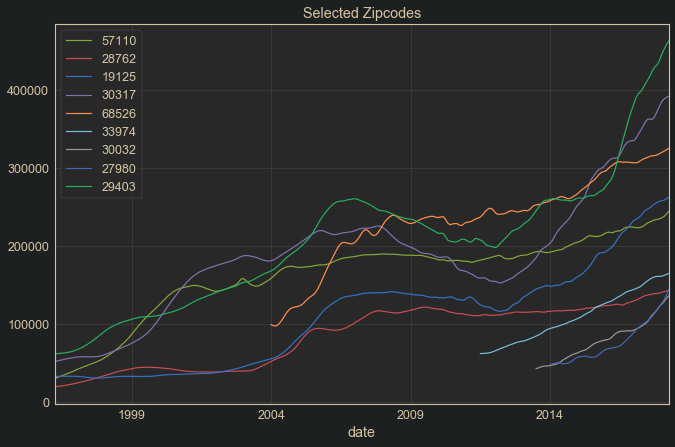

In [86]:
for zipcode in select_summary.index:
    grp = groups.get_group(zipcode)
    grp.set_index('date').value.plot(label=zipcode)
plt.title('Selected Zipcodes')
plt.legend();

#### Notes:
Viewing our selections together, it looks like Old Fort may not be growing as fast as we would like, and it is a tiny town, with the only real advantage it has being proximity to Asheville, NC.<br>
<br>
Some Google searching reveals that the Atlanta and Candler-Mcafee zip codes are directly adjacent to each other, with the latter being the next thing outward from downtown Atlanta. A look at [this site](http://www.city-data.com/zips/30317.html) informs us that 30317 is a nicer, richer area, while 30032 is a poorer area, but with a nice growth rate over the past few years. [Bestplaces.net](https://www.bestplaces.net/crime/zip-code/georgia/candler-mcafee/30032) exposes the fact that there is a crime problem in 30032, and the other site showed that it had quite a number of registered sex offenders living in it, so this may not be the best place to invest, despite the recent growth rate. Growth rates have a tendency to look very high when assests are not very valuable to begin with, also.<br>
<br>
Lincoln, NE is a great pick. It is growing, reasonably priced, and was stable through the crash. 19125 in Philadelphia also seems like a good pick, which shows recent growth and resilience through the crash. Both of these picks have below average Price-to-Rent ratios.<br>
<br>
Sioux Falls I believe is still a good pick, despite it's relatively unexciting growth rate. It is reasonably priced, showed resilience in the crash, and has a great Price-to-Rent ratio around its area, making it a stable, profitable pick.<br>
<br>
The 33974 in Lehigh Acres in FL looks like a good pick. It has shown stable, constant growth, and is in an area with a good Price-to-Rent ratio.<br>
<br>
Charleston has an exciting recent growth rate, but its current prices are quite high, which concerns me in thinking they may not be as profitable for renting, and that the growth may taper off.<br>
<br>
I believe that the 30317 zip code near downtown Atlanta would make a good addition to the portfolio. It would be the most expensive zip code to invest in, but it is close to downtown in a thriving city with a Price-to-Rent ratio below the national average. The site linked to earlier revealed that this is a relatively well-to-do area in ATL, and one can expect the property value to appreciate.

### Conclusions:
From this analysis of various zip codes in their relative performances in returns over various time frames, as well as their locations, their Price-to-Rent ratios, and other availiable information, we have narrowed down our interest to 5 zip codes worthy of investment:

1. 57110 - Sioux Falls, SD
2. 19125 - Philadelphia, PA
3. 30317 - Atlanta, GA
4. 68526 - Lincoln, NE
5. 33974 - Lehigh Acres, FL
<br><br>
I will make a dataframe of all pertinent information.

In [87]:
best_5 = [57110, 19125, 30317, 68526, 33974]
best_5 = select_summary.loc[best_5]
idx = best_5.index
best_5 = best_5.merge(p2r, left_index=False, how='left', left_on='cityState', right_on='Region Name')
best_5.index = idx
best_5

,City,CountyName,Metro,State,avg_return,cityState,Region Name,Region Name (group),National Average,P2R,Zhvi
57110,Sioux Falls,Minnehaha,Sioux Falls,SD,0.004702,"Sioux Falls, SD",NaN,NaN,NaN,NaN,NaN
19125,Philadelphia,Philadelphia,Philadelphia,PA,0.011195,"Philadelphia, PA","Philadelphia, PA",Other,11.44,11.20,"$215,400"
30317,Atlanta,Fulton,Atlanta,GA,0.012835,"Atlanta, GA","Atlanta, GA",Other,11.44,10.93,"$175,200"
68526,Lincoln,Lancaster,Lincoln,NE,0.004528,"Lincoln, NE","Lincoln, NE",Other,11.44,10.45,"$156,400"
33974,Lehigh Acres,Lee,Fort Myers,FL,0.010976,"Fort Myers, FL","Fort Myers, FL",Other,11.44,10.80,"$222,900"


A look at [this Zillow page](https://www.zillow.com/sioux-falls-sd/home-values/) can provide us with the missing data for our table. Since our p2r data, including the national average used for comparisons, comes from a Zillow article written in June 2017, it is appropriate to fill the table using values from this time, for accurate comparison.

In [88]:
sioux_Zhvi = '$187,000'
sioux_p2r = 187000.0 / (1278 * 12)
sioux_na = 11.44
best_5.loc[57110, ['Zhvi','National Average', 'P2R']] = [sioux_Zhvi, sioux_na, sioux_p2r]
best_5

,City,CountyName,Metro,State,avg_return,cityState,Region Name,Region Name (group),National Average,P2R,Zhvi
57110,Sioux Falls,Minnehaha,Sioux Falls,SD,0.004702,"Sioux Falls, SD",NaN,NaN,11.44,12.193532,"$187,000"
19125,Philadelphia,Philadelphia,Philadelphia,PA,0.011195,"Philadelphia, PA","Philadelphia, PA",Other,11.44,11.200000,"$215,400"
30317,Atlanta,Fulton,Atlanta,GA,0.012835,"Atlanta, GA","Atlanta, GA",Other,11.44,10.930000,"$175,200"
68526,Lincoln,Lancaster,Lincoln,NE,0.004528,"Lincoln, NE","Lincoln, NE",Other,11.44,10.450000,"$156,400"
33974,Lehigh Acres,Lee,Fort Myers,FL,0.010976,"Fort Myers, FL","Fort Myers, FL",Other,11.44,10.800000,"$222,900"


In [89]:
best_5.drop(columns=['avg_return', 'cityState','Region Name', 'Region Name (group)', 'Zhvi'])

,City,CountyName,Metro,State,National Average,P2R
57110,Sioux Falls,Minnehaha,Sioux Falls,SD,11.44,12.193532
19125,Philadelphia,Philadelphia,Philadelphia,PA,11.44,11.200000
30317,Atlanta,Fulton,Atlanta,GA,11.44,10.930000
68526,Lincoln,Lancaster,Lincoln,NE,11.44,10.450000
33974,Lehigh Acres,Lee,Fort Myers,FL,11.44,10.800000


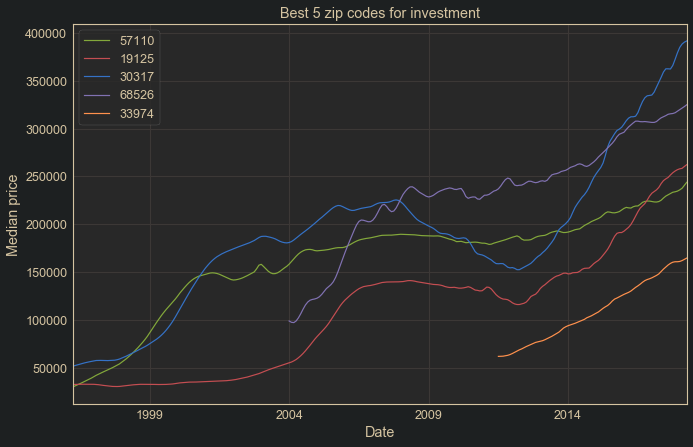

In [90]:
for zipcode in best_5.index:
    grp = groups.get_group(zipcode).set_index('date')
    grp.value.plot(label=zipcode)
plt.legend()
plt.title('Best 5 zip codes for investment')
plt.ylabel('Median price')
plt.xlabel('Date')
plt.show()

<a id='whole_market'></a>
## Looking at the whole real estate market within the data
Since there are so many individual zipcodes, it will be useful to do some investigation with a more broad view by taking the average of the median sale prices of all the zipcodes for each month. This will give us an overall view of what generally happened with the market over the time period.

Median for 1996-04: 99500.0
Mean for 1996-04: 118299.12306343175
Normality Test Results for ['1996-04']:
-------------------------------------------------------------------------------------------


C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\morestats.py:1660: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


K-S and Shapiro-Wilk: 
 
 
 
 
 K-S 
 Shapiro-Wilk 
 
 
 
 
 1996-04 
 Statistic 
 1.0 
 0.669048 
 
 
 p-value 
 0.0 
 0.000000 
 
 
 Anderson-Darling: 
 
 
 
 statistic 
 critical 
 
 
 
 
 1996-04 
 704.744235 
 0.787 
 
 
 Jarque-Bera: 
 
 
 
 1996-04 
 
 
 
 
 Statistic 
 3.184048e+07 
 
 
 p-value 
 0.000000e+00 
 
 
 Skew 
 8.186575e+00 
 
 
 Kurtosis 
 2.387458e+02

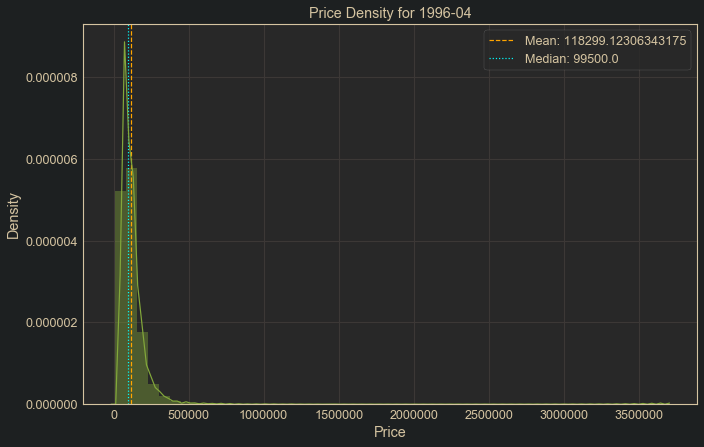

Median for 1996-05: 99500.0
Mean for 1996-05: 118419.0441391406
Normality Test Results for ['1996-05']:
-------------------------------------------------------------------------------------------


C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\morestats.py:1660: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


K-S and Shapiro-Wilk: 
 
 
 
 
 K-S 
 Shapiro-Wilk 
 
 
 
 
 1996-05 
 Statistic 
 1.0 
 0.667243 
 
 
 p-value 
 0.0 
 0.000000 
 
 
 Anderson-Darling: 
 
 
 
 statistic 
 critical 
 
 
 
 
 1996-05 
 709.007375 
 0.787 
 
 
 Jarque-Bera: 
 
 
 
 1996-05 
 
 
 
 
 Statistic 
 3.321174e+07 
 
 
 p-value 
 0.000000e+00 
 
 
 Skew 
 8.277905e+00 
 
 
 Kurtosis 
 2.437801e+02

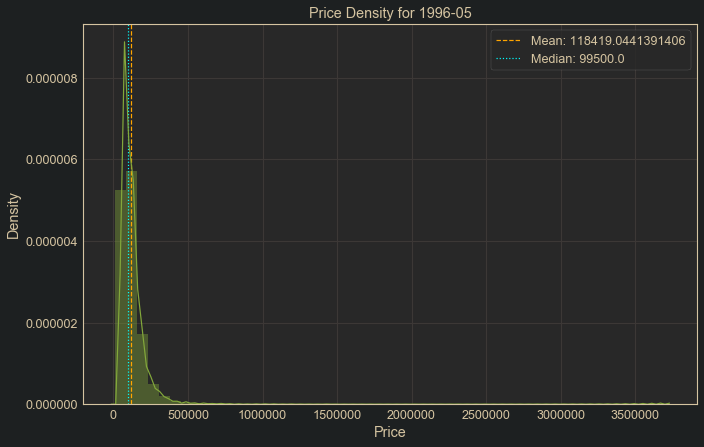

Median for 1996-06: 99700.0
Mean for 1996-06: 118537.42326805028
Normality Test Results for ['1996-06']:
-------------------------------------------------------------------------------------------


C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\morestats.py:1660: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


K-S and Shapiro-Wilk: 
 
 
 
 
 K-S 
 Shapiro-Wilk 
 
 
 
 
 1996-06 
 Statistic 
 1.0 
 0.665485 
 
 
 p-value 
 0.0 
 0.000000 
 
 
 Anderson-Darling: 
 
 
 
 statistic 
 critical 
 
 
 
 
 1996-06 
 713.330173 
 0.787 
 
 
 Jarque-Bera: 
 
 
 
 1996-06 
 
 
 
 
 Statistic 
 3.449232e+07 
 
 
 p-value 
 0.000000e+00 
 
 
 Skew 
 8.362241e+00 
 
 
 Kurtosis 
 2.483884e+02

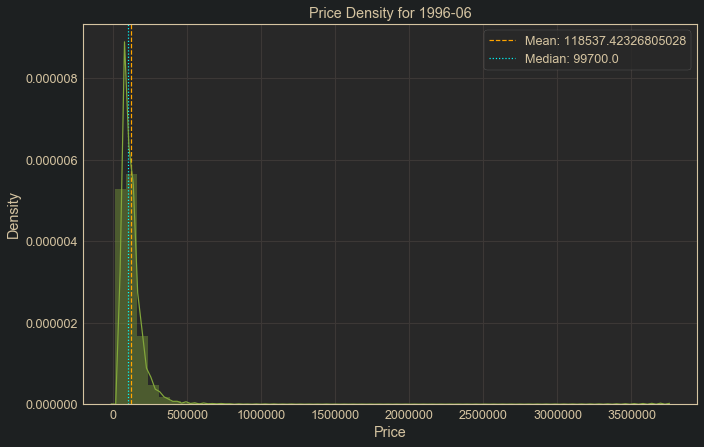

Median for 1996-07: 99700.0
Mean for 1996-07: 118653.06927798889
Normality Test Results for ['1996-07']:
-------------------------------------------------------------------------------------------


C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\morestats.py:1660: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


K-S and Shapiro-Wilk: 
 
 
 
 
 K-S 
 Shapiro-Wilk 
 
 
 
 
 1996-07 
 Statistic 
 1.0 
 0.66371 
 
 
 p-value 
 0.0 
 0.00000 
 
 
 Anderson-Darling: 
 
 
 
 statistic 
 critical 
 
 
 
 
 1996-07 
 717.804874 
 0.787 
 
 
 Jarque-Bera: 
 
 
 
 1996-07 
 
 
 
 
 Statistic 
 3.577506e+07 
 
 
 p-value 
 0.000000e+00 
 
 
 Skew 
 8.445455e+00 
 
 
 Kurtosis 
 2.529192e+02

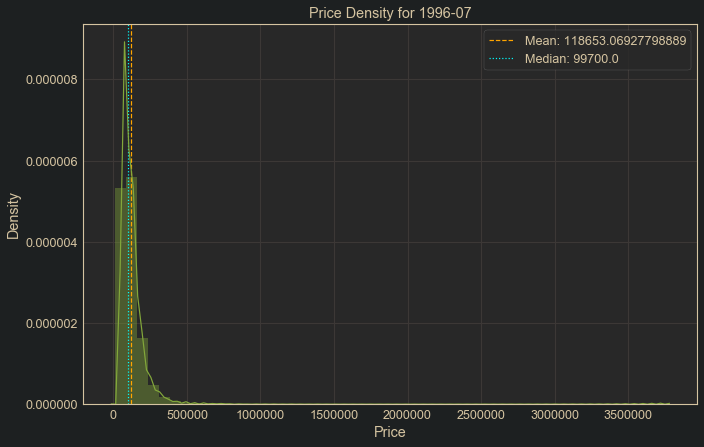

Median for 1996-08: 99800.0
Mean for 1996-08: 118780.25431160479
Normality Test Results for ['1996-08']:
-------------------------------------------------------------------------------------------


C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\morestats.py:1660: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


K-S and Shapiro-Wilk: 
 
 
 
 
 K-S 
 Shapiro-Wilk 
 
 
 
 
 1996-08 
 Statistic 
 1.0 
 0.661852 
 
 
 p-value 
 0.0 
 0.000000 
 
 
 Anderson-Darling: 
 
 
 
 statistic 
 critical 
 
 
 
 
 1996-08 
 722.401212 
 0.787 
 
 
 Jarque-Bera: 
 
 
 
 1996-08 
 
 
 
 
 Statistic 
 3.718596e+07 
 
 
 p-value 
 0.000000e+00 
 
 
 Skew 
 8.534637e+00 
 
 
 Kurtosis 
 2.578099e+02

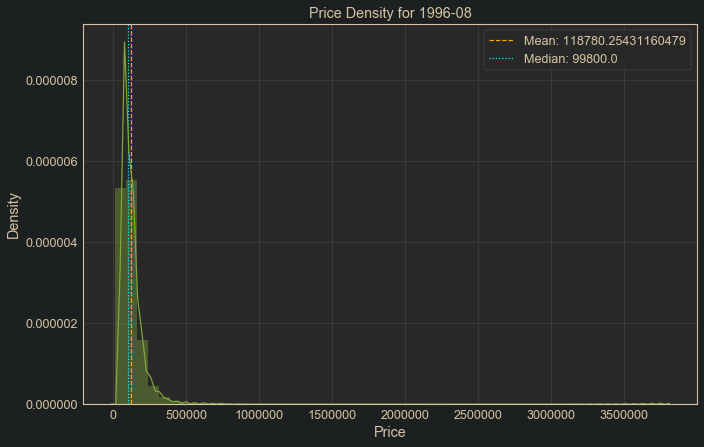

In [91]:
# Checking to see if mean is a reliable statistic:
datezips = df.set_index('zipcode').drop(columns=['City', 'State', 'Metro', 'CountyName'])
for i in range(5):
    subset = datezips.iloc[:, i].dropna()
    fig, ax = plt.subplots()
    ax.axvline(subset.mean(), ls='--', c='orange', label='Mean: {}'.format(subset.mean()))
    ax.axvline(subset.median(), ls=':', c='cyan', label='Median: {}'.format(subset.median()))
    sns.distplot(subset)
    print("Median for {}: {}".format(subset.name, subset.median()))
    print("Mean for {}: {}".format(subset.name, subset.mean()))
    mf.check_normality(subset, [subset.name])
    plt.title('Price Density for {}'.format(datezips.columns[i]))
    plt.xlabel('Price')
    plt.ylabel('Density')
    plt.legend()
    plt.show()

Median for 1996-04: 11.507912923146684
Mean for 1996-04: 11.514263656083454
Normality Test Results for ['1996-04']:
-------------------------------------------------------------------------------------------


C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\morestats.py:1660: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


K-S and Shapiro-Wilk: 
 
 
 
 
 K-S 
 Shapiro-Wilk 
 
 
 
 
 1996-04 
 Statistic 
 1.0 
 9.964508e-01 
 
 
 p-value 
 0.0 
 1.173114e-17 
 
 
 Anderson-Darling: 
 
 
 
 statistic 
 critical 
 
 
 
 
 1996-04 
 5.471796 
 0.787 
 
 
 Jarque-Bera: 
 
 
 
 1996-04 
 
 
 
 
 Statistic 
 2.592146e+02 
 
 
 p-value 
 5.155377e-57 
 
 
 Skew 
 1.697598e-01 
 
 
 Kurtosis 
 3.582543e+00

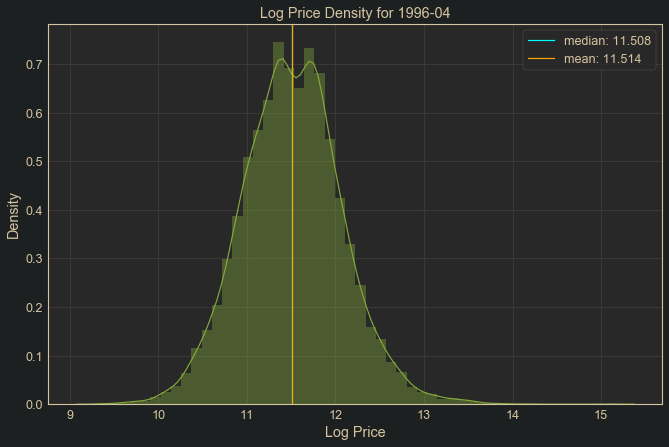

Median for 1996-05: 11.507912923146684
Mean for 1996-05: 11.515620114910819
Normality Test Results for ['1996-05']:
-------------------------------------------------------------------------------------------


C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\morestats.py:1660: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


K-S and Shapiro-Wilk: 
 
 
 
 
 K-S 
 Shapiro-Wilk 
 
 
 
 
 1996-05 
 Statistic 
 1.0 
 9.963446e-01 
 
 
 p-value 
 0.0 
 5.902393e-18 
 
 
 Anderson-Darling: 
 
 
 
 statistic 
 critical 
 
 
 
 
 1996-05 
 5.646196 
 0.787 
 
 
 Jarque-Bera: 
 
 
 
 1996-05 
 
 
 
 
 Statistic 
 2.680339e+02 
 
 
 p-value 
 6.268676e-59 
 
 
 Skew 
 1.748670e-01 
 
 
 Kurtosis 
 3.589732e+00

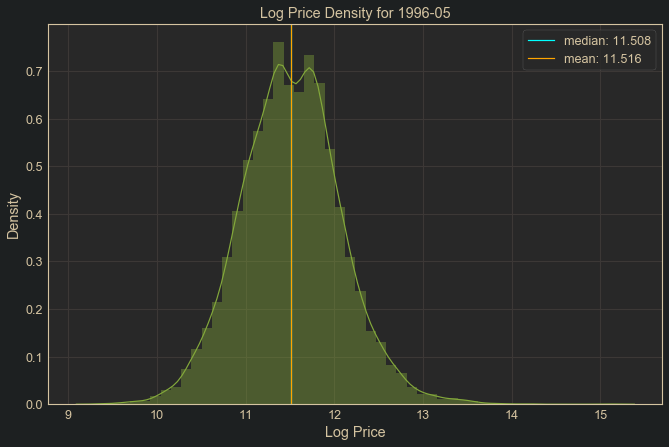

Median for 1996-06: 11.50992095594993
Mean for 1996-06: 11.516948575182408
Normality Test Results for ['1996-06']:
-------------------------------------------------------------------------------------------


C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\morestats.py:1660: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


K-S and Shapiro-Wilk: 
 
 
 
 
 K-S 
 Shapiro-Wilk 
 
 
 
 
 1996-06 
 Statistic 
 1.0 
 9.962552e-01 
 
 
 p-value 
 0.0 
 3.346901e-18 
 
 
 Anderson-Darling: 
 
 
 
 statistic 
 critical 
 
 
 
 
 1996-06 
 5.833936 
 0.787 
 
 
 Jarque-Bera: 
 
 
 
 1996-06 
 
 
 
 
 Statistic 
 2.773738e+02 
 
 
 p-value 
 5.875499e-61 
 
 
 Skew 
 1.800722e-01 
 
 
 Kurtosis 
 3.597306e+00

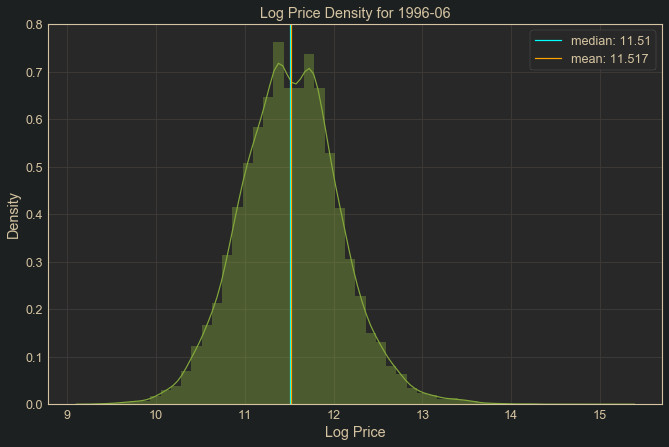

Median for 1996-07: 11.50992095594993
Mean for 1996-07: 11.518235757662946
Normality Test Results for ['1996-07']:
-------------------------------------------------------------------------------------------


C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\morestats.py:1660: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


K-S and Shapiro-Wilk: 
 
 
 
 
 K-S 
 Shapiro-Wilk 
 
 
 
 
 1996-07 
 Statistic 
 1.0 
 9.961358e-01 
 
 
 p-value 
 0.0 
 1.591792e-18 
 
 
 Anderson-Darling: 
 
 
 
 statistic 
 critical 
 
 
 
 
 1996-07 
 6.034485 
 0.787 
 
 
 Jarque-Bera: 
 
 
 
 1996-07 
 
 
 
 
 Statistic 
 2.870832e+02 
 
 
 p-value 
 4.577968e-63 
 
 
 Skew 
 1.854644e-01 
 
 
 Kurtosis 
 3.604913e+00

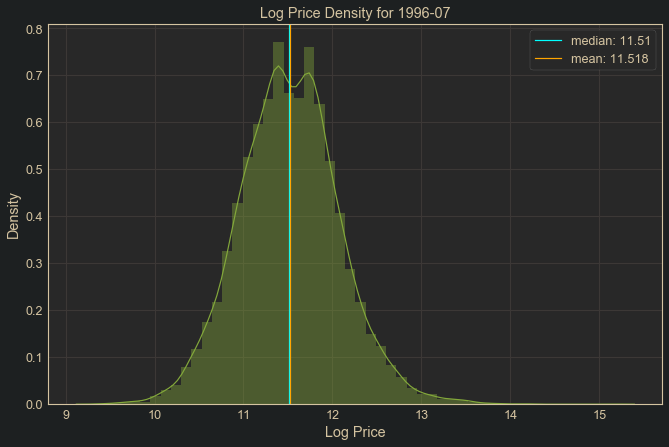

Median for 1996-08: 11.510923462299555
Mean for 1996-08: 11.519575746755715
Normality Test Results for ['1996-08']:
-------------------------------------------------------------------------------------------


C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\morestats.py:1660: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


K-S and Shapiro-Wilk: 
 
 
 
 
 K-S 
 Shapiro-Wilk 
 
 
 
 
 1996-08 
 Statistic 
 1.0 
 9.960376e-01 
 
 
 p-value 
 0.0 
 8.740750e-19 
 
 
 Anderson-Darling: 
 
 
 
 statistic 
 critical 
 
 
 
 
 1996-08 
 6.244039 
 0.787 
 
 
 Jarque-Bera: 
 
 
 
 1996-08 
 
 
 
 
 Statistic 
 2.970940e+02 
 
 
 p-value 
 3.067993e-65 
 
 
 Skew 
 1.905442e-01 
 
 
 Kurtosis 
 3.613055e+00

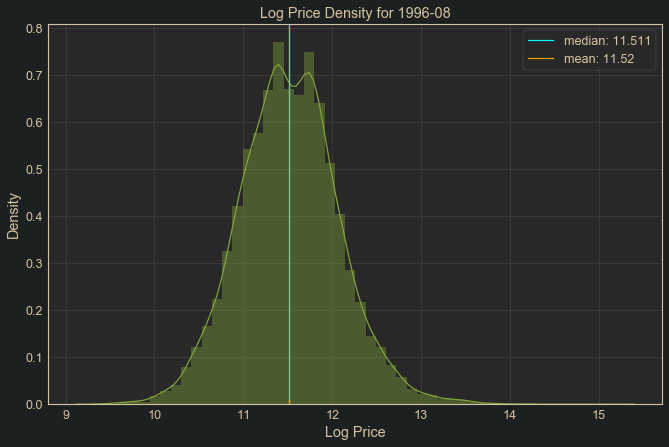

In [92]:
# We can see the prices among the zipcodes for each month are heavily positively skewed,
# log transformations may help this, but it may be more appropriate to use median values.
# Looking at the effect of log transformations:
for i in range(5):
    fig, ax = plt.subplots()
    subset = np.log(datezips.iloc[:, i])
    sns.distplot(subset.dropna(), ax=ax)
    median = subset.median()
    mean = subset.mean()
    print("Median for {}: {}".format(subset.name, median))
    print("Mean for {}: {}".format(subset.name, mean))
    mf.check_normality(subset, [subset.name])
    ax.axvline(median, color='cyan', label='median: {}'.format(round(median, 3)))
    ax.axvline(mean, color='orange', label='mean: {}'.format(round(mean, 3)))
    plt.title('Log Price Density for {}'.format(datezips.columns[i]))
    plt.xlabel('Log Price')
    plt.ylabel('Density')
    plt.legend()
    plt.show()

In [93]:
# It looks as though the log transformations have made the prices for each zip code
# per month much more normal. The tests are still rejecting the null-hypothesis of normality,
# but as the warnings above make clear, this may be (and probably is) due to the very large
# sample size of 14k+ zip codes. Looking at the median and means from this, we can see that
# they are all very similar, meaning the distribution is centered, also indicated by the
# relatively low skew. We will use these logged distributions to represent each date, and take
# the means to track the changes of the market over time. In order to avoid artifacts in the 
# returns stream, we must leave out any zipcodes which had incomplete data over the time window
# of the dataset, which we can do by omitting any zipcodes found in the counts dictionary.

In [94]:
# Getting a series of means for each month
means = np.log(df.set_index('zipcode').drop(columns=['City', 'State', 'Metro', 'CountyName'])).mean()
means

1996-04    11.514264
1996-05    11.515620
1996-06    11.516949
1996-07    11.518236
1996-08    11.519576
             ...    
2017-12    12.244559
2018-01    12.249051
2018-02    12.254503
2018-03    12.262258
2018-04    12.268095
Length: 265, dtype: float64

In [95]:
# Making a series of means which omits zip codes that had missing data:
means2 = np.log(df.set_index('zipcode').drop(columns=['City', 'State', 'Metro', 'CountyName'],
                                      index=counts.keys()
                                     )).mean()
means2

1996-04    11.514264
1996-05    11.515620
1996-06    11.516949
1996-07    11.518236
1996-08    11.519576
             ...    
2017-12    12.279193
2018-01    12.283881
2018-02    12.289423
2018-03    12.297175
2018-04    12.303019
Length: 265, dtype: float64

In [96]:
# Setting index to datetime format and checking result
means.index = pd.to_datetime(means.index, format='%Y-%m')
means2.index = pd.to_datetime(means2.index, format='%Y-%m')
means.index

DatetimeIndex(['1996-04-01', '1996-05-01', '1996-06-01', '1996-07-01',
               '1996-08-01', '1996-09-01', '1996-10-01', '1996-11-01',
               '1996-12-01', '1997-01-01',
               ...
               '2017-07-01', '2017-08-01', '2017-09-01', '2017-10-01',
               '2017-11-01', '2017-12-01', '2018-01-01', '2018-02-01',
               '2018-03-01', '2018-04-01'],
              dtype='datetime64[ns]', length=265, freq=None)

In [97]:
# Checking for any null values
print("Number of missing values:", means.isna().sum())

Number of missing values: 0


In [98]:
means = pd.DataFrame(means)
means.columns = ['mean price']
means.head()

,mean price
1996-04-01,11.514264
1996-05-01,11.515620
1996-06-01,11.516949
1996-07-01,11.518236
1996-08-01,11.519576


In [99]:
means2 = pd.DataFrame(means2)
means2.columns = ['mean log price']
means2.head()

,mean log price
1996-04-01,11.514264
1996-05-01,11.515620
1996-06-01,11.516949
1996-07-01,11.518236
1996-08-01,11.519576


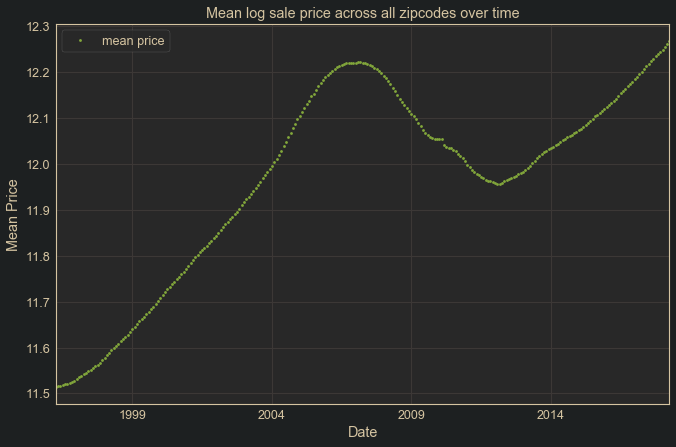

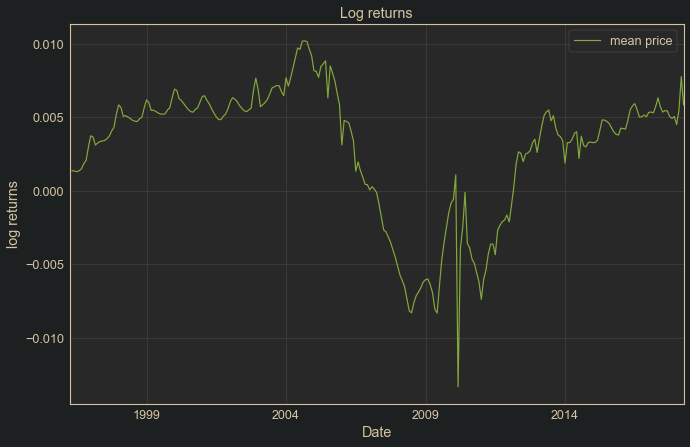

In [100]:
means.plot(style='.b', figsize=(11,7))
plt.title("Mean log sale price across all zipcodes over time")
plt.xlabel("Date")
plt.ylabel("Mean Price")
plt.show()

means.diff().plot(figsize=(11,7))
plt.title('Log returns')
plt.xlabel('Date')
plt.ylabel('log returns')
plt.show()

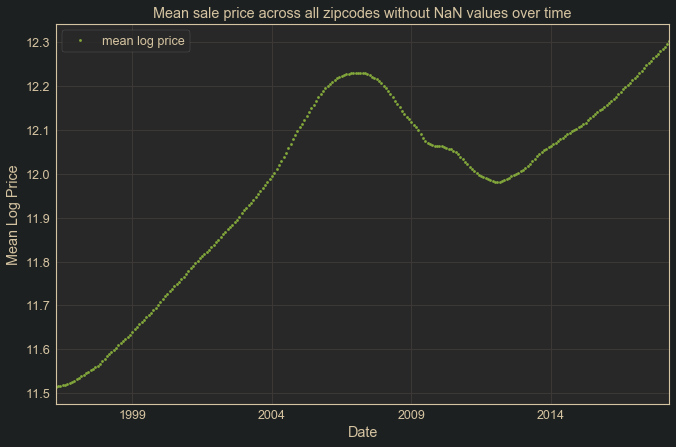

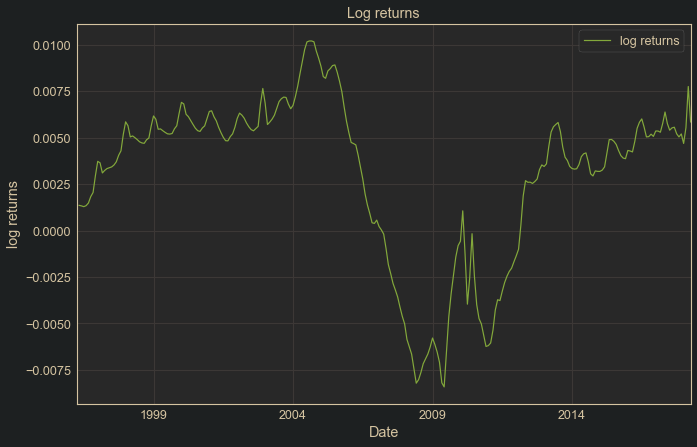

In [101]:
means2.plot(style='.b', figsize=(11,7))
plt.title("Mean sale price across all zipcodes without NaN values over time")
plt.xlabel("Date")
plt.ylabel("Mean Log Price")
plt.show()

means2.diff().plot(figsize=(11,7))
plt.title('Log returns')
plt.xlabel('Date')
plt.ylabel('log returns')
plt.legend(['log returns'])
plt.show()

We can see that not omitting the zip codes with incomplete data introduces more noise, and more extreme volatility on certain months. This would have had adverse effects on modeling, and made us see features in the data that were actually just artifacts of new zipcodes poppping up along the timeline.<br>
<br>
We can definitely see an overall trend in the data. It is a reminder that the housing market crashed in the [Subprime Mortgage Crisis](https://en.wikipedia.org/wiki/Subprime_mortgage_crisis) between 2007 and 2010, due to too many subprime mortgages being written out by banks (which they then sold on the securities market), many of which were ultimately foreclosed on. After the dip, we see another period of price inflation, but can we expect to see another "bubble pop" in another 5 years or so? That would have to consider whether the circumstances that led to the 2008 crash were truly unique, or whether there is a cyclic period of deflation that is known to happen even without questionable banking practices occuring in a widespread fashion. More historical data would be helpful to look for such a recurring trend, but is not available in the dataset. Another important consideration is that the data only goes through April of 2018, and that it is currently the end of July 2020, so the pattern may already be changing, if only we had more data to show it.<br>
<br>
Turning to outside research, an <a href='https://www.investopedia.com/investing/next-housing-recession-2020-predicts-zillow/'>article</a> posted in investopedia.com on October 2, 2019, states that researchers at Zillow (the same company that provided the data being used) predicted the next housing recession would manifest itself in 2020, though not for the same reasons as the 2008 crash. Their concerns were instead focused on rising federal interest rates, which would lead to mortgages being more expensive for potential homebuyers, potentially driving them out of the market. The article mentioned that very low unemployment, steady economic growth, and limited housing supply were overshadowing those concerns at the time of the research.<br>
<br>
There are some important things to mention in response to this. First is that around the time the article was written, the fed began to reduce interest rates. Then, in 2020, the Covid-19 pandemic struck and the federal interest rates plummeted to 0.25%, whereas they had been close to 2% when the article was published. This can be seen in the chart below:

<u>Historic Fed Interest Rates:</u>
![Historic Fed Interest Rates](images/fed_rates_chart.png)

This would mean that interest rates will likely not be the leading factor in a housing market recession, if it were to happen this year. Instead, vast unemployment and financial hardship due to the virus will be likely to drive housing prices down. Thus, though the reasoning may be different, it is not unlikely to see a declining housing market in 2020. This is another good reason to determine the zipcodes which were most resilient during the last downturn.<br>
<br>
A more recent <a href=https://www.redfin.com/blog/charting-coronavirus-housing-market-trends/>article</a> posted on Redfin.com corroborates the theory of another downturn occurring due to the pandemic. It shows that year-on-year price growth has indeed stagnated amidst the Covid-19 pandemic. The article mentions that lagged competition has given buyers more room to negotiate better prices, but stresses that sellers are not yet willing to reduce prices, knowing that supply is still low. This is summed up in a quote from Redfin agent David Palmer: "There’s fear on both sides. We have a bunch of buyers who want 40,000 dollar price reductions or credit that really should have been 15,000 dollars to 20,000 dollars. We’re calling it the ‘coronavirus credit’. I’d say it is getting a little closer to a level playing field, but sellers know that inventory is low and they’re trying to stick to their guns."

A further update to this line of thinking is the current eviction crisis. Homeowners may be looking to sell properties if they cannot find stable tenants to occupy them during the crisis, and this may lead to a surplus in supply, and a decrease in demand, leading to lower prices over the next year at least.<br>
<br>
All of this being said, all we should really keep in mind is that market downturns do occur, and usually for reasons unforseen to investors. Since the dataset only spans to April 2018, we should imagine that we are consulting investors at that time, so that none of our knowledge of current events in 2020 introduces look-ahead bias into this project. From now on, we will pretend we are living in mid-2018.

In [95]:
# exporting .csv file of means for use in R notebook:
# Note that this was exported before I realized that I made the mistake of analyzing the data
# with the artifacts from the presence of zipcodes with incomplete data. You can see the false
# conclusions that I came to in doing so in other notebooks
means.to_csv('housing_means.csv')

In [96]:
# exporting the corrected means
means2.to_csv('housing_means2.csv')

In [102]:
# Since we no longer need the tainted means, I will reinstantiate so that the corrected means
# are known as 'means'
means = means2

### Checking Stationarity

Text(0.5, 1.0, 'Differenced means across all zipcodes')

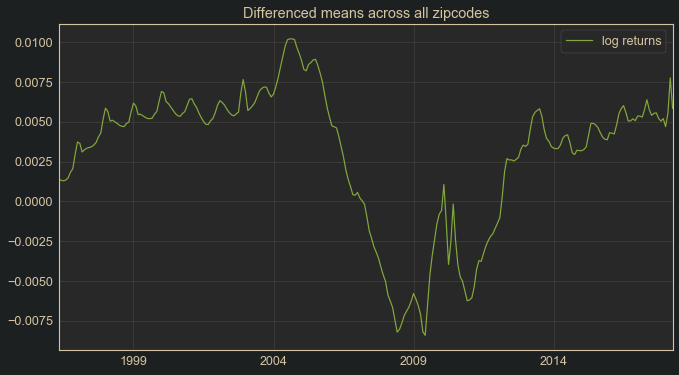

In [104]:
# Looking at the log returns (the differenced log values), we can see that the series is not
# stationary, as the mean is not constant, and clearly displays a trend.
means_diff = means.diff().dropna()
means_diff.columns = ['log returns']
means_diff.plot(figsize=(11,6))
plt.title("Differenced means across all zipcodes")

In [105]:
# After differencing, we can still see the large trend caused by the crash and recovery of the
# market. Also, we can see what may be yearly seasonality starting to appear

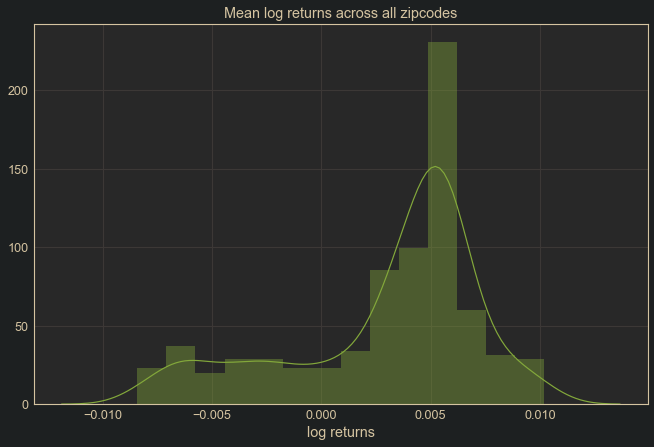

In [109]:
# We can see that these values are not normally distributed
sns.distplot(means_diff['log returns'])
plt.title("Mean log returns across all zipcodes");

In [110]:
np.exp(0.005)

1.005012520859401

In [111]:
# We can see that by and large, investors in the market had positive returns on a monthly basis
# Let's see what a Dickey-Fuller test would have to say about the stationarity of this series.
# Using Dickey-Fuller test on stationarity of differenced means
dftest = adfuller(means_diff['log returns'])
dfoutput = pd.Series(dftest[0:4], index=['Test Statistic', 'p-value', '#Lags Used', 'Number of Observations Used'])
print("Dickey-Fuller Results for Differenced Means:\n================================\n",dfoutput)

Dickey-Fuller Results for Differenced Means:
 Test Statistic                  -1.942736
p-value                          0.312231
#Lags Used                      14.000000
Number of Observations Used    249.000000
dtype: float64


In [112]:
# Using Dickey-Fuller test on stationarity of log returns
dftest = adfuller(means_diff['log returns'])
dfoutput = pd.DataFrame(dftest[0:4], 
                        index=['Test Statistic',
                               'p-value', 
                               '#Lags Used', 
                               'Number of Observations Used'],
                        columns=['Dickey-Fuller']
                       )
dfoutput

,Dickey-Fuller
Test Statistic,-1.942736
p-value,0.312231
#Lags Used,14.000000
Number of Observations Used,249.000000


In [114]:
#di.export(dfoutput, 'images/adfoutput_returns.png')

In [115]:
# Above we can see that differencing the log means has not made them stationary according to the
# Augmented Dickey-Fuller test, as the null hypothesis of non-stationarity has not been
# rejected. Let's see if further transformations or differencing will fix it

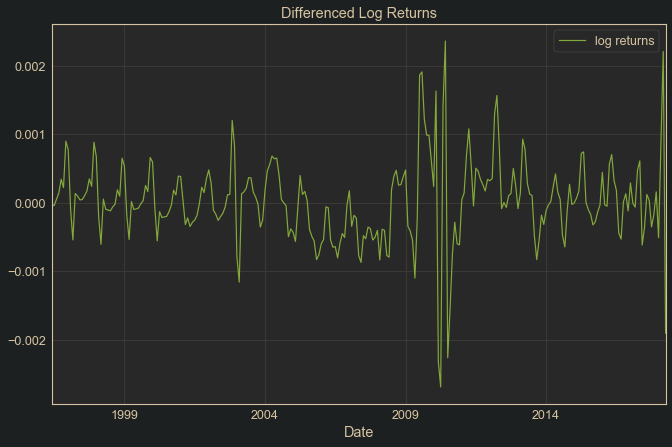

In [116]:
# Since the d value in ARIMA models does not represent the number of periods to difference
# across, but rather how many times a difference of 1 period is done recursively, I would like
# to see what a 2nd order differencing would do for the data.
# Since log returns are the first order difference of the log values of a price series, we
# will make a series log_returns, then perform another order of differencing. This will amount
# to two orders of differencing on the original series.
log_returns = means.diff().dropna()
log_returns.columns = ['log returns']
log_returns = log_returns.asfreq('MS')
diff_log_returns = log_returns.diff().dropna()
diff_log_returns.plot()
plt.title('Differenced Log Returns')
plt.xlabel('Date')
plt.show()

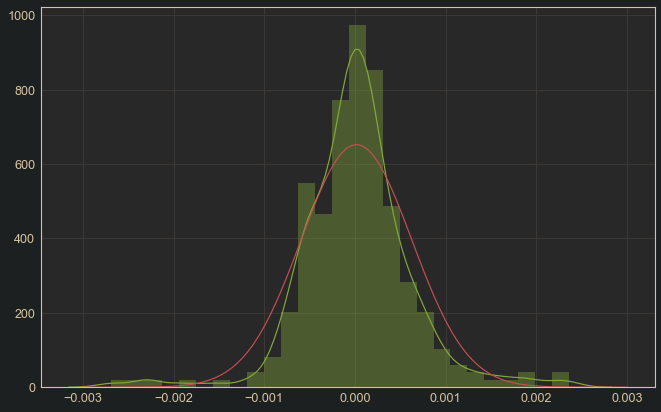

In [120]:
# This is looking much more stationary, let's see the distribution compared to a normal dist
fig, ax = plt.subplots()
sns.distplot(diff_log_returns, ax=ax)
xx = np.linspace(-.003, .003, 100)
yy = stats.norm.pdf(xx, loc=diff_log_returns.mean(), scale=diff_log_returns.std())
ax.plot(xx, yy)

In [122]:
dftest = adfuller(diff_log_returns)
dfoutput = pd.Series(dftest[0:4], index=['Test Statistic', 'p-value', '#Lags Used', 'Number of Observations Used'])
print("Dickey-Fuller Results for Differenced Means:\n================================\n",dfoutput)

Dickey-Fuller Results for Differenced Means:
 Test Statistic                  -3.509216
p-value                          0.007754
#Lags Used                      13.000000
Number of Observations Used    249.000000
dtype: float64


In [123]:
# Using Dickey-Fuller test on stationarity of log returns
dftest = adfuller(diff_log_returns)
dfoutput = pd.DataFrame(dftest[0:4], 
                        index=['Test Statistic',
                               'p-value', 
                               '#Lags Used', 
                               'Number of Observations Used'],
                        columns=['Dickey-Fuller']
                       )
dfoutput

,Dickey-Fuller
Test Statistic,-3.509216
p-value,0.007754
#Lags Used,13.000000
Number of Observations Used,249.000000


In [124]:
#di.export(dfoutput, 'images/adfoutput_diff_returns.png')

In [125]:
# We can see that this second order of differencing has made for a much more normal, and much
# more stationary series. Although there is still visibile volatility clustering, it may be
# sufficient to try some modeling.

It is worth noting at this point that the ADF test rejected the null hypothesis of non-stationarity, but this is misleading, because one of the requirements of a stationary time series is having constant variance across time. As cited in [Stockhammar & Oller (2007)](https://www.diva-portal.org/smash/get/diva2:187599/FULLTEXT01.pdf), a study by Kim and Schmidt (1993) showed that Dickey-Fuller tests tend to reject too often in the presence of conditional heteroscedasticity (pg. 4). In order for a time series to be considered weakly stationary, which is an assumption for ARIMA models, it must have constant mean AND variance. As Stockhammar and Oller go on to discuss in their paper, conditional heteroskedasticity can make it difficult to detect time-varying means, masking non-stationarity. This means that the non-stationarity in variance must be dealt with, or omitted from the data.

### Considering Returns Instead
Upon further reading on modeling financial markets, it has come to my attention that people generally model returns rather than the prices, because these tend to more closely resemble normal distributions, and have better stationarity. Further, returns are generally calculated in practice as log returns, due to their additive properties. When returns are represented as percentages, they are multiplicative of their previous value, whereas log returns can be added together rather than multiplied. This make for more convenient math considering sequential data, since a cumsum() method can combine all of the growth.

### Looking at Seasonal Decomposition

I'd like to see what the seasonal_decompose function does with this data.

In [105]:
log_returns = means_fix['mean log price'].diff().dropna()
log_returns.name = 'log returns'

In [106]:
log_returns.head()

date
1996-05-01    0.001356
1996-06-01    0.001328
1996-07-01    0.001287
1996-08-01    0.001340
1996-09-01    0.001482
Freq: MS, Name: log returns, dtype: float64

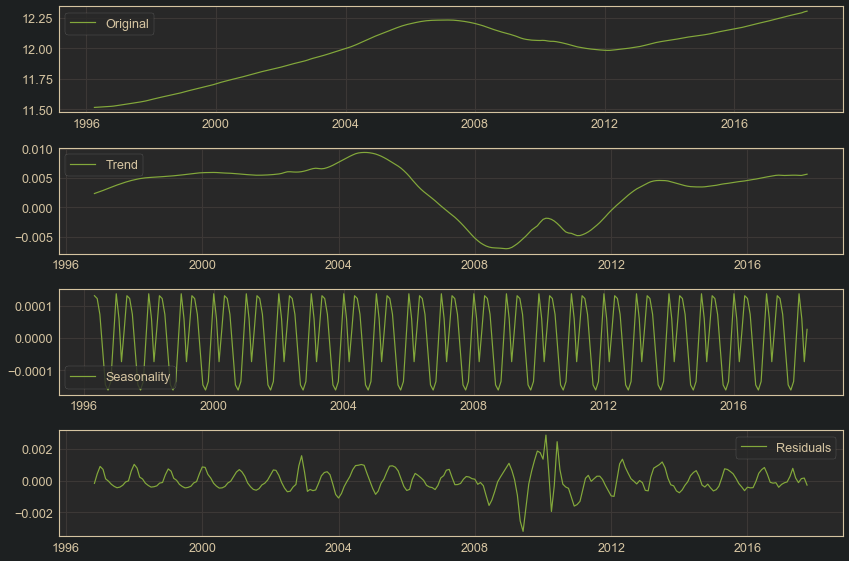

In [107]:
decomposition = seasonal_decompose(log_returns)

# Gather the trend, seasonality, and residuals 
trend = decomposition.trend
seasonal = decomposition.seasonal
residual = decomposition.resid

# Plot gathered statistics
plt.figure(figsize=(12,8))
plt.subplot(411)
plt.plot(means.dropna(), label='Original')
plt.legend(loc='best')
plt.subplot(412)
plt.plot(trend, label='Trend')
plt.legend(loc='best')
plt.subplot(413)
plt.plot(seasonal,label='Seasonality')
plt.legend(loc='best')
plt.subplot(414)
plt.plot(residual, label='Residuals')
plt.legend(loc='best')
plt.tight_layout()

In [108]:
# We can see that when the decomposition removes the large sweeping trend
# This decomposition seems to be detecting yearly seasonality as well, but it is very
# small in influence
# The residuals show some heteroscedasticity, but mostly they seem pretty consistent

### Using Periodogram to find long-term seasonality

I would now like to see if a periodogram can detect some longer seasonal trends

In [101]:
from scipy.signal import periodogram

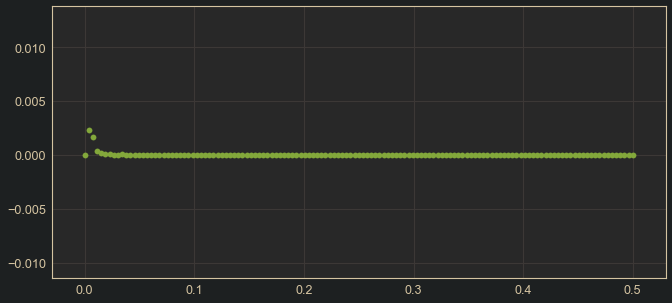

In [109]:
pgram = periodogram(log_returns)
plt.figure(figsize=(11,5))
plt.scatter(pgram[0], pgram[1]);

In [110]:
# Finding 3 largest specs:
indices = np.argpartition(pgram[1], -2)[-3:]
pd.DataFrame(list(zip((1 / pgram[0][indices])[::-1], pgram[1][indices][::-1])),
             columns=['Period', 'Spec']
            )

,Period,Spec
0,264.0,0.002350
1,132.0,0.001705
2,88.0,0.000388


In [111]:
# check length of log_returns
print(len(log_returns))
print(len(log_returns)/2)
print(len(log_returns)/3)

264
132.0
88.0


We can see that the most influential periods from the periodogram are periods which correspond to the full length of the dataset, half the length of the dataset, and a third of the length of the dataset. As shown in the investigation in [this notebook](understanding_fourier_series_with_R.ipynb), this is merely an artifact of the math involved in the periodogram, and does not give us conclusive evidence of a long term seasonality. As was shown in the other notebook, a mostly random set of data will show spikes on a periodogram at the full length of the data, and another at the halfway point. It should be noted however that the strength of the spike at the half-period in this series is stronger than expected for random data.

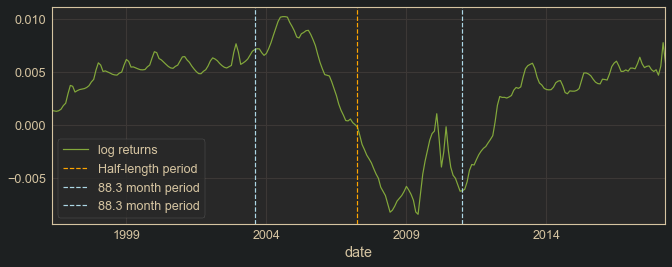

In [112]:
# Here we can observe visually the periods indicated by the periodogram, and see that there is
# no real seasonality at these periods:
ax = log_returns.plot(figsize=(11,4))
ax.axvline(means.index[132], 
           color='orange', 
           ls='--',
           label='Half-length period'
          )
ax.axvline(means.index[88], 
           color='lightblue', 
           ls='--',
           label='88.3 month period'
          )
ax.axvline(means.index[177], 
           color='lightblue', 
           ls='--',
           label='88.3 month period'
          )
plt.legend();

To drive this point home, the reason that a powerful spike will always be present at the period corresponding to the full length of a dataset is because you can take any time series of data, and lay it end on end some number of times, and produce a seasonality. This is shown below.

In [113]:
# Placing the trend data end on end
trend2 = pd.concat([pd.DataFrame(log_returns), 
                    pd.DataFrame(log_returns)], axis=0).reset_index()

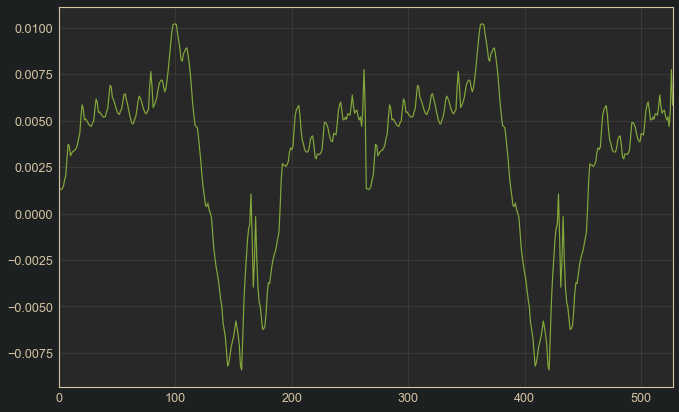

In [114]:
# Here we can see that having a seasonality the full length of data is not a valid assumption
# since repeating data is bound to make seasonality occur
trend2['log returns'].plot();

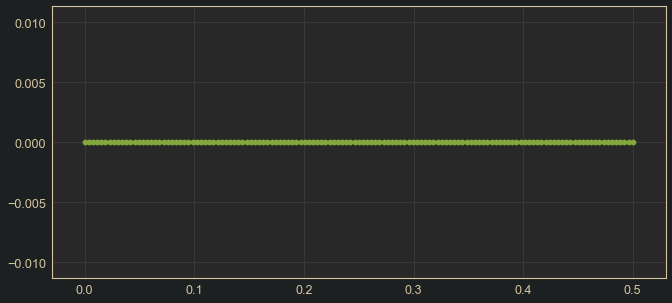

In [115]:
# Let's see if the seasonal component of the decomposition has useful information
pgram = periodogram(seasonal)
plt.figure(figsize=(11,5))
plt.scatter(pgram[0], pgram[1]);

In [116]:
# Finding 3 largest specs:
indices = np.argpartition(pgram[1], -2)[-3:]
pd.DataFrame(list(zip((1 / pgram[0][indices])[::-1], pgram[1][indices][::-1])),
             columns=['Period', 'Spec']
            )

,Period,Spec
0,6.0,1.287000e-06
1,12.0,1.273207e-06
2,4.0,2.444789e-07


In [117]:
# We can see that there are factors of 12 (yearly seasonality) perhaps a fourier series from
# these values might help a model

In [299]:
# A helpful function to plot and return df related to periodogram for a series.
def check_pgram(series):
    pgram = periodogram(series)
    plt.figure(figsize=(11,4))
    plt.plot(pgram[0], pgram[1], marker='o')
    indices = (-pgram[1]).argsort()[:10]
    results = pd.DataFrame(list(zip((1 / pgram[0][indices]), pgram[1][indices])),
                                 columns=['Period', 'Spec']
                                )
    return results

<a id='modeling'></a>
## Modeling:

<a id='fbproph'></a>
### Facebook Prophet on full data:
Before going into fitting SARIMAX models on the data, I want to see what kind of predictions fbprophet will make, just as a comparison/benchmark, since prophet's predictions are generally considered to be reliable.

In [118]:
# I am going to do a fbprophet forecast on the mean market data, to see how it behaves
from fbprophet import Prophet as proph

In [119]:
means_proph = means.copy()
means_proph.head()

,mean log price
date,
1996-04-01,11.514264
1996-05-01,11.515620
1996-06-01,11.516949
1996-07-01,11.518236
1996-08-01,11.519576


In [148]:
# Need to format the new dataframe for prophet
means_proph['ds'] = means_proph.index
means_proph['ds'] = means_proph['ds'].asfreq('MS')
means_proph.rename(columns={'mean log price':'y'}, inplace=True)
means_proph.head()

,y,ds
1996-04-01,11.514264,1996-04-01
1996-05-01,11.515620,1996-05-01
1996-06-01,11.516949,1996-06-01
1996-07-01,11.518236,1996-07-01
1996-08-01,11.519576,1996-08-01


In [149]:
Model = proph(interval_width=0.95)
Model.fit(means_proph)

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [150]:
# I will make projections 5yrs into the future, as this seems to be a good time horizon for
# real estate investment.
future_dates = Model.make_future_dataframe(periods=60, freq='MS')
predictions = Model.predict(future_dates)
pred_subset = predictions[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]

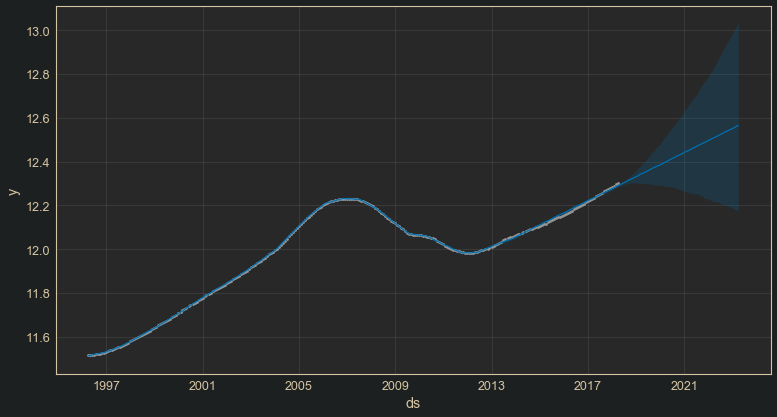

In [151]:
fig, ax = plt.subplots(figsize=(11, 6))
Model.plot(predictions, uncertainty=True, ax=ax);

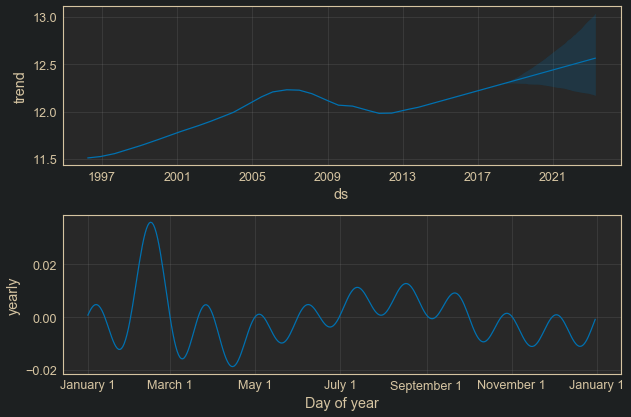

In [152]:
#fig, ax = plt.subplots(figsize=(11, 6))
ax = Model.plot_components(predictions)
ax.set_facecolor(plt.rcParams.get('figure.facecolor'))

We can see that Prophet has done its under-the-hood magic, and produced forecasts that are essentially a linear continuation of the trend after the market crash, with a confidence window that incorporates a possible second crash around the years 2020-2021. This is a pretty good result, considering that it was fast and seems to cover the different scenarios of the future market. It will be interesting to see how this stacks up to an ARIMA model on the same data (knowing that the data will be heteroscedastic, these models will still perform decently).

### Facebook Prophet on Returns:

In [153]:
returns_proph = log_returns.copy()
returns_proph.head()

,log returns
1996-05-01,0.001356
1996-06-01,0.001328
1996-07-01,0.001287
1996-08-01,0.001340
1996-09-01,0.001482


In [155]:
# Need to format the new dataframe for prophet
returns_proph['ds'] = returns_proph.index
returns_proph['ds'] = returns_proph['ds'].asfreq('MS')
returns_proph.rename(columns={'log returns':'y'}, inplace=True)
returns_proph.head()

,y,ds
1996-05-01,0.001356,1996-05-01
1996-06-01,0.001328,1996-06-01
1996-07-01,0.001287,1996-07-01
1996-08-01,0.001340,1996-08-01
1996-09-01,0.001482,1996-09-01


In [156]:
Model = proph(interval_width=0.95)
Model.fit(returns_proph)

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [157]:
# I will make projections 5yrs into the future, as this seems to be a good time horizon for
# real estate investment.
future_dates = Model.make_future_dataframe(periods=60, freq='MS')
predictions = Model.predict(future_dates)
pred_subset = predictions[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]

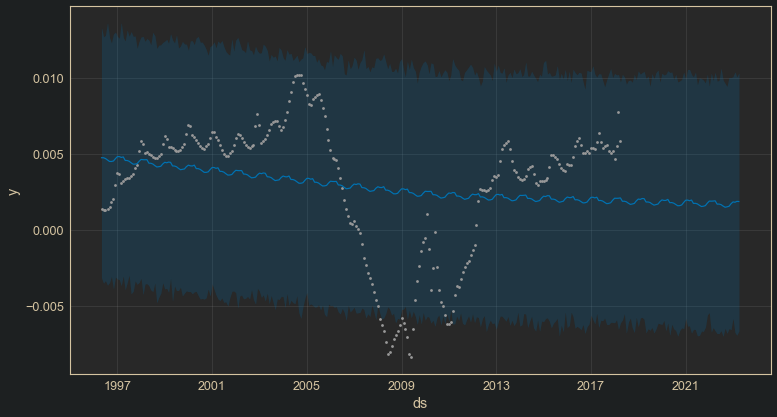

In [158]:
fig, ax = plt.subplots(figsize=(11, 6))
Model.plot(predictions, uncertainty=True, ax=ax);

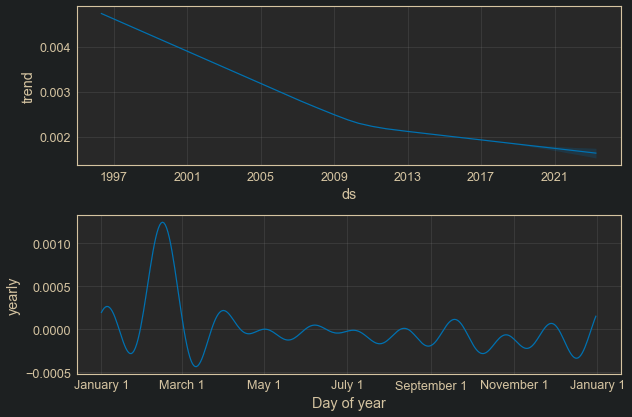

In [159]:
#fig, ax = plt.subplots(figsize=(11, 6))
ax = Model.plot_components(predictions)
ax.set_facecolor(plt.rcParams.get('figure.facecolor'))

Facebook prophet seems to have exhibited some strange behavior on the log returns... But it does seem to have also indicated some yearly seasonality. It looks as though the model is trying to indicate that the average monthly returns of real estate investment is diminishing, and might be expected to into the next few years.

<a id='arima_full'></a>
### ARIMA on full data:

I'm now going to fit an ARIMA model to the means data, just to compare to facebook prophet, knowing that there is a special event taking place with the crash, and that the conditional heteroscedasticity violates the stationarity assumption.

### Looking at autocorrelation

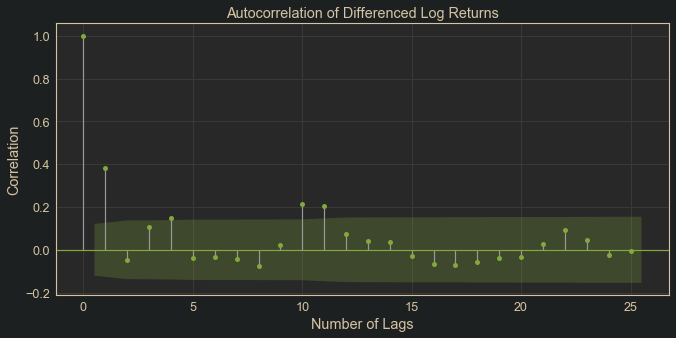

In [160]:
# First a look at an ACF for the stationary series produced by a 2nd order differencing
# Note that a sharp dropoff past a certain value would inform us of a potential order for 
# MA terms
fig, ax = plt.subplots(figsize=(11,5))
plot_acf(log_returns.diff().dropna(), 
          #lags = len(trend.dropna())-1, 
          ax=ax)
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')
plt.title('Autocorrelation of Differenced Log Returns')
plt.show()

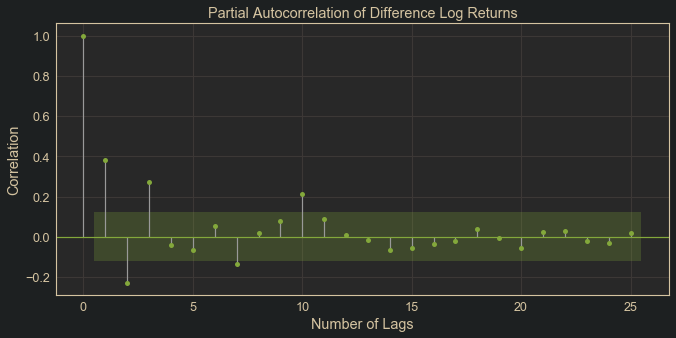

In [161]:
# We can see above that the ACF drops off after 1 lag, meaning an MA(1) model may be appropriate
# There are also significant spikes at 10 and 11 lags
# Now a look at a PACF for the series. Note that a sharp dropoff after a lag will indicate a
# potential order for AR terms, and a taper past a lag would be further evidence for an order
# of MA terms
fig, ax = plt.subplots(figsize=(11,5))
plot_pacf(log_returns.diff().dropna(), 
          #lags = len(trend.dropna())-1, 
          ax=ax)
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')
plt.title('Partial Autocorrelation of Difference Log Returns');

In [162]:
# We can see that there is a taper after the 1st lag, and also another spike at 10
# So far, an MA(1) model after an order of differencing looks appropriate

In [7]:
means = pd.read_csv('housing_means2.csv')
means.rename(columns={'Unnamed: 0': 'date',
                      'mean price': 'mean log price'
                     }, inplace=True)
means.date = pd.to_datetime(means.date, infer_datetime_format=True)
means.head()

,date,mean log price
0,1996-04-01,11.514264
1,1996-05-01,11.515620
2,1996-06-01,11.516949
3,1996-07-01,11.518236
4,1996-08-01,11.519576


In [8]:
means.date

0     1996-04-01
1     1996-05-01
2     1996-06-01
3     1996-07-01
4     1996-08-01
         ...    
260   2017-12-01
261   2018-01-01
262   2018-02-01
263   2018-03-01
264   2018-04-01
Name: date, Length: 265, dtype: datetime64[ns]

In [9]:
means.set_index('date', inplace=True)

In [10]:
# Checking to see if index has an assigned frequency
means.index = pd.to_datetime(means.index, infer_datetime_format=True)
means.index

DatetimeIndex(['1996-04-01', '1996-05-01', '1996-06-01', '1996-07-01',
               '1996-08-01', '1996-09-01', '1996-10-01', '1996-11-01',
               '1996-12-01', '1997-01-01',
               ...
               '2017-07-01', '2017-08-01', '2017-09-01', '2017-10-01',
               '2017-11-01', '2017-12-01', '2018-01-01', '2018-02-01',
               '2018-03-01', '2018-04-01'],
              dtype='datetime64[ns]', name='date', length=265, freq=None)

In [11]:
# Need to fix the dataframe to have an explicit frequency for statsmodels
means_fix = means.asfreq('MS')
means_fix.index

DatetimeIndex(['1996-04-01', '1996-05-01', '1996-06-01', '1996-07-01',
               '1996-08-01', '1996-09-01', '1996-10-01', '1996-11-01',
               '1996-12-01', '1997-01-01',
               ...
               '2017-07-01', '2017-08-01', '2017-09-01', '2017-10-01',
               '2017-11-01', '2017-12-01', '2018-01-01', '2018-02-01',
               '2018-03-01', '2018-04-01'],
              dtype='datetime64[ns]', name='date', length=265, freq='MS')

In [54]:
# Let's start with letting the max p, d, and q be 2
p = d = q = range(0, 3)

# Generating all combos of p, d, and q
pdq = list(itertools.product(p, d, q))

# Since we saw potential yearly seasonality earlier, I will use a s value of 12, and make 
# necessary combinations:
pdqs = [(x[0], x[1], x[2], 12) for x in pdq]

In [55]:
# checking pdq
pdq

[(0, 0, 0),
 (0, 0, 1),
 (0, 0, 2),
 (0, 1, 0),
 (0, 1, 1),
 (0, 1, 2),
 (0, 2, 0),
 (0, 2, 1),
 (0, 2, 2),
 (1, 0, 0),
 (1, 0, 1),
 (1, 0, 2),
 (1, 1, 0),
 (1, 1, 1),
 (1, 1, 2),
 (1, 2, 0),
 (1, 2, 1),
 (1, 2, 2),
 (2, 0, 0),
 (2, 0, 1),
 (2, 0, 2),
 (2, 1, 0),
 (2, 1, 1),
 (2, 1, 2),
 (2, 2, 0),
 (2, 2, 1),
 (2, 2, 2)]

In [56]:
# checking pdqs
pdqs

[(0, 0, 0, 12),
 (0, 0, 1, 12),
 (0, 0, 2, 12),
 (0, 1, 0, 12),
 (0, 1, 1, 12),
 (0, 1, 2, 12),
 (0, 2, 0, 12),
 (0, 2, 1, 12),
 (0, 2, 2, 12),
 (1, 0, 0, 12),
 (1, 0, 1, 12),
 (1, 0, 2, 12),
 (1, 1, 0, 12),
 (1, 1, 1, 12),
 (1, 1, 2, 12),
 (1, 2, 0, 12),
 (1, 2, 1, 12),
 (1, 2, 2, 12),
 (2, 0, 0, 12),
 (2, 0, 1, 12),
 (2, 0, 2, 12),
 (2, 1, 0, 12),
 (2, 1, 1, 12),
 (2, 1, 2, 12),
 (2, 2, 0, 12),
 (2, 2, 1, 12),
 (2, 2, 2, 12)]

In [147]:
len(pdq)*len(pdqs)

729

In [148]:
combos = np.zeros(len(pdq)*len(pdqs))
aic_values = np.zeros(len(pdq)*len(pdqs))
scores = {}

for combo in pdq:
    for scombo in pdqs:
        model_params = (combo, scombo)
        scores[model_params] = np.NaN
        try:
            model = SARIMAX(means_fix,
                              order=combo,
                              seasonal_order=scombo,
                              enforce_stationarity=False,
                              enforce_invertibility=False
                             )
            output = model.fit()
            scores[model_params] = output.aic
            
        except:
            print("Error with parameters:", model_params)
            continue

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:5

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:5

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:5

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:5

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:5

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:5

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:5

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:5

In [149]:
len(scores)

729

In [150]:
# Noting that this is taking a long time, whereas the auto.arima() function in R is very fast,
# it will be interesting to compare the results, after the wait. Note that the result from the
# R notebook was (0, 2, 1) with no seasonality, resulting in an AIC of 3222.27

# Another note is that this is taking a REALLY long time, so that it would not be possible to 
# generate a model in this way for each individual zipcode. It may be necessary to find the
# optimal pdq values generated by a model on the means, then apply those parameters to each
# zipcode, or it might be fast enough to use the auto.arima() function in R for each zipcode,
# allowing for more flexibility with the different data in each zipcode.

In [151]:
# Find the parameters with minimal AIC value
# Note that the algebraically lower scores are better, even if they are negative. So larger
# negative AICs are better.
ideal_params = min(scores, key=scores.get)
print("Optimal AIC of {} with params: {}".format(min(scores.values()), ideal_params))
#print(ideal_params)

Optimal AIC of -3204.5563689239198 with params: ((1, 1, 1), (0, 0, 0, 12))


In [939]:
model = SARIMAX(means_fix,
                order=ideal_params[0],
                seasonal_order=ideal_params[1],
                enforce_stationary=False,
                enforce_invertibility=False
               ).fit()
print(model.summary())

                           Statespace Model Results                           
Dep. Variable:             mean price   No. Observations:                  265
Model:               SARIMAX(1, 1, 1)   Log Likelihood                1616.068
Date:                Sun, 30 Aug 2020   AIC                          -3226.137
Time:                        15:03:42   BIC                          -3215.409
Sample:                    04-01-1996   HQIC                         -3221.826
                         - 04-01-2018                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9885      0.010    101.148      0.000       0.969       1.008
ma.L1          0.5320      0.036     14.583      0.000       0.461       0.604
sigma2      2.761e-07   1.06e-08     25.935      0.0

In [529]:
# For some reason, the AIC of this model does not match the score from the grid search...
# I have reviewed the code and have no explanation for this.

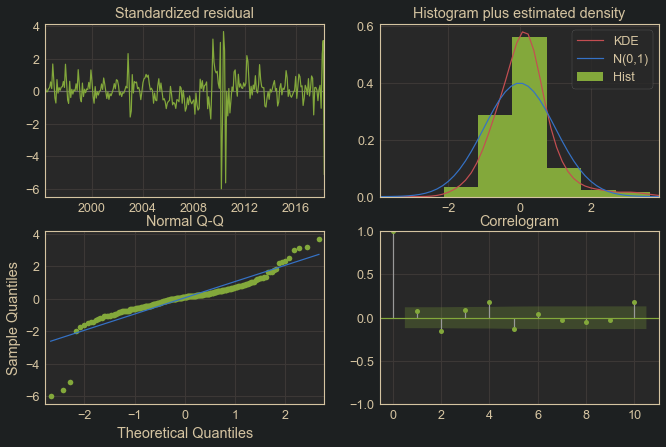

In [940]:
model.plot_diagnostics();

In [565]:
# The AIC is different, there seems to be a bug
# I will build a nested for loop and see if this gets rid of the bug
scores = {}
rang = range(0,3)

for p in rang:
    for d in rang:
        for q in rang:
            for sp in rang:
                for sd in rang:
                    for sq in rang:
                        model_params = ((p,d,q), (sp,sd,sq,12))
                        scores[model_params] = np.NaN
                        try:
                            sarimax = SARIMAX(means_fix,
                                              order=(p,d,q),
                                              seasonal_order=(sp,sd,sq,12),
                                              enforce_stationarity=False,
                                              enforce_invertibility=False
                                             )
                            output = sarimax.fit()
                            scores[model_params] = output.aic

                        except:
                            print("Error with parameters:", model_params)
                            continue

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check

In [566]:
# Find the parameters with minimal AIC value
ideal_params2= min(scores, key=scores.get)
print("Optimal AIC of {} with params: {}".format(min(scores.values()), ideal_params2))
#print(ideal_params)

Optimal AIC of -3204.5563471320424 with params: ((1, 1, 1), (0, 0, 0, 12))


In [ ]:
# Again, the grid search has produced an AIC value that is different from what I get when I run
# the model with the same parameters. Interestingly enough, the misreported AIC values are
# the same from both grid searches. I will come back to this.

In [567]:
# In response to this problem, I will call auto.arima function from R, which is an efficient way
# to get optimal parameters for ARIMA models

In [12]:
# Allows you to import r packages
from rpy2.robjects.packages import importr

In [13]:
# How to install r packages from python
#utils = importr('utils')
#utils.install_packages('forecast')

In [14]:
# Import desired package(s)
importr('forecast')

rpy2.robjects.packages.Package as a <module 'forecast'>

In [15]:
# Will convert python lists to a R style FloatVector
from rpy2.robjects import FloatVector

In [16]:
from collections import OrderedDict
from rpy2.robjects import DataFrame

In [17]:
from rpy2.robjects import r

In [18]:
rlist = list(map(FloatVector, [means_fix['mean log price']]))

In [19]:
d = OrderedDict(zip(map(str, range(len(rlist))), rlist))
data = DataFrame(d)

In [20]:
# Convert series into a usable format
FloatVector(means_fix['mean log price'])

11.514264,11.515620,11.516949,11.518236,...,12.283881,12.289423,12.297175,12.303019


In [21]:
autoarima = r['auto.arima'](r['ts'](FloatVector(means_fix['mean log price']), freq=12), 
                            seasonal=True,
                           )

In [22]:
print(autoarima)

Series: structure(c(11.5142636560835, 11.5156201149108, 11.5169485751824,  11.5182357576629, 11.5195757467557, 11.5210575971359, 11.5228841489884,  11.5249333014024, 11.5278829306489, 11.5316086082182, 11.535252316171,  11.5383534954782, 11.5415904538513, 11.5449263757948, 11.54830457405,  11.5517305429253, 11.5552601274276, 11.5589619578487, 11.5630126618771,  11.5673044536636, 11.5724822697232, 11.578333641924, 11.5839786994788,  11.5890169642435, 11.5941094198777, 11.5991079190941, 11.6040011697805,  11.6087765989047, 11.6134920813558, 11.6181866190224, 11.6230718089739,  11.6280522465346, 11.6336840083587, 11.6398526349363, 11.6458408132802,  11.6512929777247, 11.6567625445083, 11.6621346678752, 11.6674173362969,  11.6726227747144, 11.6778141452453, 11.6830376187281, 11.6885137086376,  11.6941535701393, 11.7004552784774, 11.7073544441803, 11.7141693716779,  11.7204271709258, 11.7265550433744, 11.7324668468003, 11.7381735593981,  11.7436797558414, 11.7490539850659, 11.7543890300087,

In [23]:
# Extracting the model parameters by making output into a string:
string = str(autoarima).split('ARIMA')[1].split(' ')[0]
if len(string) < 8:
    param = tuple(int(x) for x in string.replace('(','').replace(')','').split(','))
    sparam = (0,0,0,0)
else:
    params = tuple(int(x) for x in string.replace('(','').replace(')',',')
                   .replace('[','').replace(']','').split(','))
    param = params[:3]
    sparam = params[3:]
print(param)
print(sparam)

(0, 2, 1)
(0, 0, 0, 0)


In [24]:
# The auto.arima function is recommending an ARIMA(0,2,1) model with no seasonality. Note that
# this matches our prediction from the ACF/PACF graphs of a MA(1) model on the differenced
# log returns, as two orders of differencing on the original data is equivalent

In [26]:
# Trying the model with the parameters recommended from auto.arima
# Note that it is taking 2nd order differencing. Since we are using the mean values of log sales
# prices, the first order of differencing is log returns, then the second order of differencing
# is effectively a 1st order difference if we were modeling log returns.
model = SARIMAX(means_fix['mean log price'],
                order=param,
                seasonal_order=sparam,
                enforce_stationary=False,
                enforce_invertibility=False
               ).fit()
print(model.summary())

                               SARIMAX Results                                
Dep. Variable:         mean log price   No. Observations:                  265
Model:               SARIMAX(0, 2, 1)   Log Likelihood                1613.160
Date:                Fri, 04 Sep 2020   AIC                          -3222.321
Time:                        14:06:55   BIC                          -3215.176
Sample:                    04-01-1996   HQIC                         -3219.450
                         - 04-01-2018                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.6281      0.036     17.502      0.000       0.558       0.698
sigma2      2.737e-07   9.72e-09     28.162      0.000    2.55e-07    2.93e-07
Ljung-Box (L10) (Q):                 34.05   Jarque-

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\mlemodel.py:3225: FutureWarning: The default value of lags is changing.  After 0.12, this value will become min(10, nobs//5) for non-seasonal time series and min (2*m, nobs//5) for seasonal time series. Directly set lags to silence this warning.
  FutureWarning


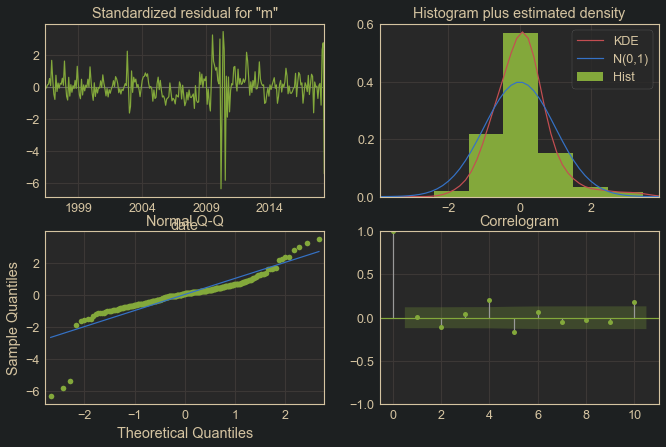

In [27]:
model.plot_diagnostics(figsize=(11,7));

In [28]:
# Diagnosing the model, we can see that the null hypothesis of the Ljung-Box test that the
# residuals are not autocorrelated is rejected, and some significant autocorrelation can be
# seen in the correlogram of residuals.
# We can also see that the null hypothesis of the Heteroskedasticity test, which is that the
# residuals are not heteroskedastic, is rejected
# The kurtosis is quite high and thus the JB test null hypothesis of normal skew and kurtosis
# of residuals is rejected. This is due to the period of volatility clustering as the market
# began to recover

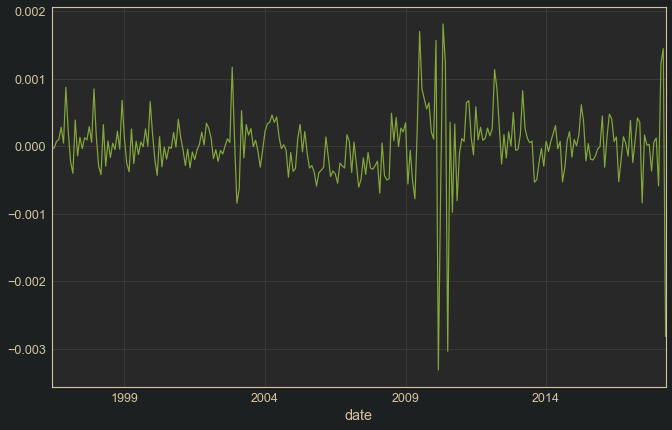

In [29]:
# Looking closer at the residuals, we can see that the mild yearly seasonality is present,
# but that it seems like it may shift out of phase after the first few years, and become less
# uniform. This may be an example of a profitable signal being arbitraged out of a market when
# investors become keen to it and begin to exploit it.
model.resid[2:].plot()

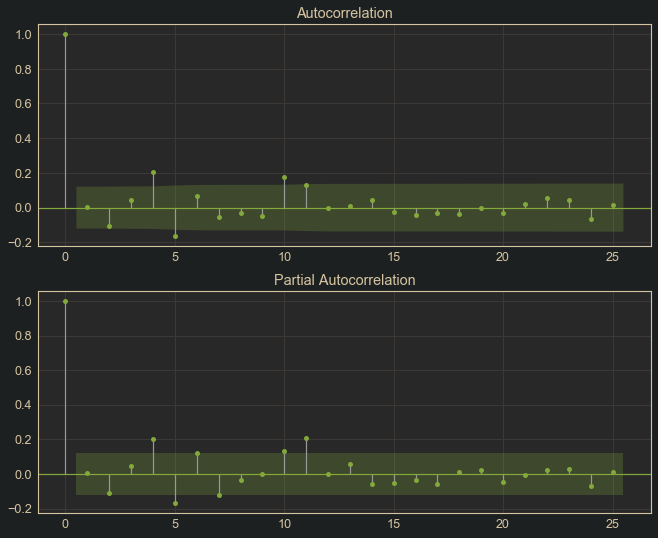

In [33]:
# A closer look at residual autocorrelation with more lags
fig, (ax1, ax2) = plt.subplots(2, figsize=(11,9))
plot_acf(model.resid[2:], ax=ax1);
plot_pacf(model.resid[2:], ax=ax2);

In [39]:
sm.stats.acorr_ljungbox(model.resid[2:], return_df=True, auto_lag=True)

,lb_stat,lb_pvalue
1,0.004035,0.949351
2,3.137588,0.208296
3,3.710392,0.294483
4,15.080289,0.004538
5,22.422066,0.000435
6,23.704732,0.000592
7,24.417510,0.000962
8,24.650182,0.001781
9,25.233852,0.002723
10,34.044082,0.000182


In [40]:
model.test_serial_correlation(method='ljungbox')

array([[[4.01863623e-03, 3.13813464e+00, 3.71096914e+00, 1.50814296e+01,
         2.24214743e+01, 2.37064246e+01, 2.44188464e+01, 2.46519792e+01,
         2.52360336e+01, 3.40481444e+01],
        [9.49453789e-01, 2.08239312e-01, 2.94413133e-01, 4.53527257e-03,
         4.35291270e-04, 5.91329532e-04, 9.61395766e-04, 1.78022218e-03,
         2.72088048e-03, 1.81261760e-04]]])

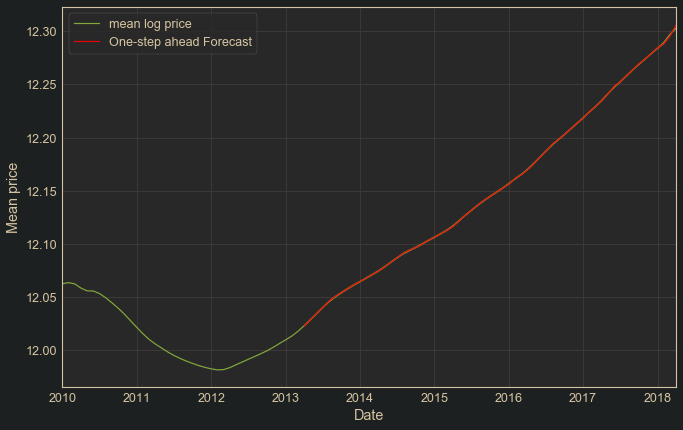

In [41]:
# Get predictions
pred = model.get_prediction('2013-04', '2018-04', dynamic=False)
pred_conf = pred.conf_int()
# Plot observed values
ax = means['2010':].plot(label='observed')
# Plot predicted values
pred.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', color='red', alpha=0.9)
# Plot the range for confidence intervals
ax.fill_between(pred_conf.index, 
                pred_conf.iloc[:, 0], 
                pred_conf.iloc[:, 1],
                alpha=0.5
               )
# Set axes labels
ax.set_xlabel('Date')
ax.set_ylabel('Mean price')
plt.legend()
plt.show()

In [43]:
forecasted = pred.predicted_mean
truth = means_fix['2013-04':'2018-04']['mean log price']

# Compute the mean square error
mse = np.mean((forecasted - truth) ** 2)
print('The Mean Squared Error of our forecasts is {}'.format(round(mse, 7)))

The Mean Squared Error of our forecasts is 3e-07


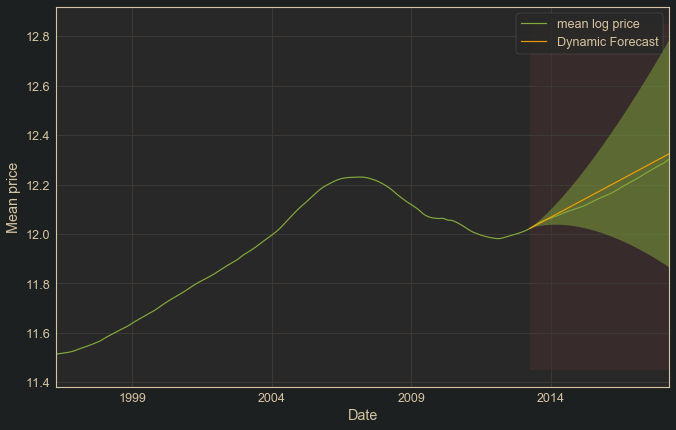

In [44]:
# We can see that the one step ahead forecasts were fairly accurate on the training data,
# let's look now at the dynamic forecast from the same date

# Get dynamic predictions with confidence intervals
pred_dynamic = model.get_prediction(start='2013-04', end='2018-04', dynamic=True, full_results=True)
pred_dynamic_conf = pred_dynamic.conf_int()

# Plot observed values
ax = means_fix.plot(label='observed')
# Plot predicted values
pred_dynamic.predicted_mean.plot(ax=ax, label='Dynamic Forecast', color='orange', alpha=0.9)
# Plot the range for confidence intervals
ax.fill_between(pred_dynamic_conf.index, 
                pred_dynamic_conf.iloc[:, 0], 
                pred_dynamic_conf.iloc[:, 1],
                alpha=0.5
               )
ax.fill_betweenx(ax.get_ylim(), 
                 pd.to_datetime('2013-04'), 
                pred_dynamic.predicted_mean.index[-1],
                alpha=0.1,
                zorder=-1
               )
# Set axes labels
ax.set_xlabel('Date')
ax.set_ylabel('Mean price')
plt.legend()
plt.show()

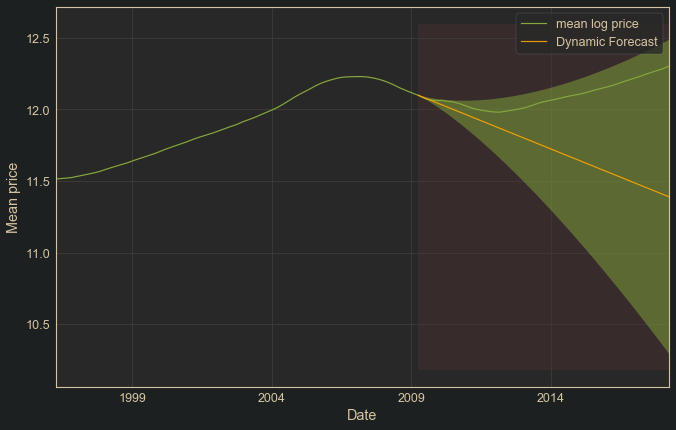

In [45]:
# We can see that this went pretty well, the orange line of the projected means falls pretty
# close to the actual line
# We can check how this model would have performed back just before the area of high volatility
# Around 2010, and whether the true events fell within its confidence

# Get dynamic predictions with confidence intervals
pred_dynamic = model.get_prediction(start='2009-04', end='2018-04', dynamic=True, full_results=True)
pred_dynamic_conf = pred_dynamic.conf_int()

# Plot observed values
ax = means_fix.plot(label='observed')
# Plot predicted values
pred_dynamic.predicted_mean.plot(ax=ax, label='Dynamic Forecast', color='orange', alpha=0.9)
# Plot the range for confidence intervals
ax.fill_between(pred_dynamic_conf.index, 
                pred_dynamic_conf.iloc[:, 0], 
                pred_dynamic_conf.iloc[:, 1],
                alpha=0.5
               )
ax.fill_betweenx(ax.get_ylim(), 
                 pd.to_datetime('2009-04'), 
                pred_dynamic.predicted_mean.index[-1],
                alpha=0.1,
                zorder=-1
               )
# Set axes labels
ax.set_xlabel('Date')
ax.set_ylabel('Mean price')
plt.legend()
plt.show()

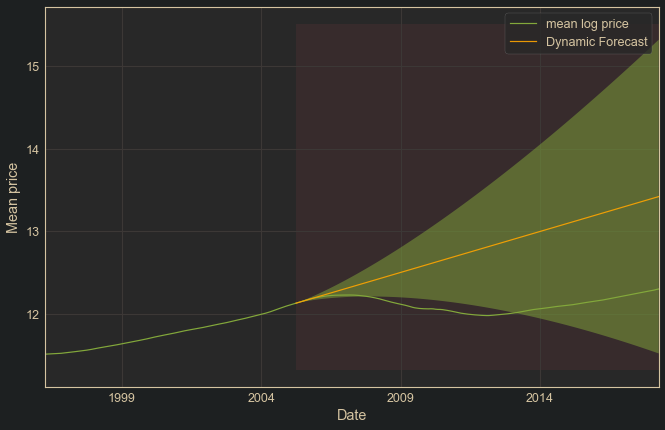

In [46]:
# We can see that even in the area when the model had the most trouble due to the conditional
# variance at the time, the dynamic projection still had confidence intervals which contained
# the true events. This shows that the model shows ability to show best case and worse case
# scenarios at any time looking forward. Let's look again at what it would do just before the
# crash
# Get dynamic predictions with confidence intervals
pred_dynamic = model.get_prediction(start='2005-04', end='2018-04', dynamic=True, full_results=True)
pred_dynamic_conf = pred_dynamic.conf_int()

# Plot observed values
ax = means_fix.plot(label='observed')
# Plot predicted values
pred_dynamic.predicted_mean.plot(ax=ax, label='Dynamic Forecast', color='orange', alpha=0.9)
# Plot the range for confidence intervals
ax.fill_between(pred_dynamic_conf.index, 
                pred_dynamic_conf.iloc[:, 0], 
                pred_dynamic_conf.iloc[:, 1],
                alpha=0.5
               )
ax.fill_betweenx(ax.get_ylim(), 
                 pd.to_datetime('2005-04'), 
                pred_dynamic.predicted_mean.index[-1],
                alpha=0.1,
                zorder=-1
               )
# Set axes labels
ax.set_xlabel('Date')
ax.set_ylabel('Mean price')
plt.legend()
plt.show()

We can see that the market took a dramatic turn during the crash, which went outside the confidence bands, but ultimately fell back in. Interpreting the model, it is actually a very simple model, with 2 orders of difference and a single moving average term. This is a very general model, which is not overfit. It is merely taking two orders of differencing, which is the differenced log returns, then it has one moving average term.

In [47]:
# Let's look at a 5 year forecast with this model
prediction = model.get_forecast(60)

# Get confidence intervals of forecasts
pred_conf = prediction.conf_int()

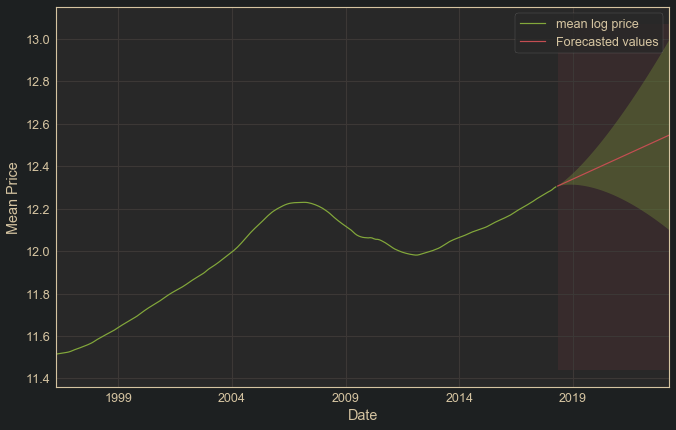

In [48]:
# Plot future predictions with confidence intervals
ax = means_fix.plot(label='observed')
prediction.predicted_mean.plot(label='Forecasted values', ax=ax)

ax.fill_between(pred_conf.index,
                pred_conf.iloc[:, 0],
                pred_conf.iloc[:, 1],
                alpha=0.3
               )

ax.fill_betweenx(ax.get_ylim(), pred_conf.index[0], pred_conf.index[-1],
                 alpha=0.1,
                 zorder=-1
                )

ax.set_xlabel('Date')
ax.set_ylabel('Mean Price')
plt.legend()
plt.show()

In [49]:
# This looks very similar to the forecast results from the fbprophet model.
# This model is fairly decent, and simple. The test for heteroscedasticity rejected the null
# hypothesis of homoscedastic residuals, and we can see from the chart of residuals that this
# is due to the period of high volatility as the market began to make a recovery. Since this
# is an event caused by macroeconomic factors, it would not be possible to account for it in the
# model without having some sort of exogenous variable
# If we ignore this period of volatility clustering, the residuals appear as though they would
# be stationary and homoscedastic, so the model is appropriate for the majority of the data

In [57]:
# I would now like to do another grid search, this time leaving out the seasonal component
# altogether, to see if python reaches the same result as auto.arima() in this way
scores = {}
for combo in pdq:
    scores[combo] = np.NaN
    sarimax = SARIMAX(means_fix,
                      order=combo,
                      enforce_stationarity=False,
                      enforce_invertibility=False
                     )
    output = sarimax.fit()
    scores[combo] = output.aic

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:5

In [58]:
# Find the parameters with minimal AIC value
ideal_params = min(scores, key=scores.get)
print("Optimal AIC of {} with params: {}".format(min(scores.values()), ideal_params))

Optimal AIC of -3204.556363853556 with params: (1, 1, 1)


In [59]:
# Again, we have an AIC which doesn't match with what we get when we run a model with these
# parameters
# Let's make sure the scores were encoded as expected
scores

{(0, 0, 0): 2062.505512686851,
 (0, 0, 1): 2054.6718753931455,
 (0, 0, 2): 1915.213116388422,
 (0, 1, 0): -2005.1640731130572,
 (0, 1, 1): -2342.3568920488906,
 (0, 1, 2): -2488.49651318476,
 (0, 2, 0): -3131.7488721241166,
 (0, 2, 1): -3196.216441975474,
 (0, 2, 2): -3171.354377487537,
 (1, 0, 0): -2110.298062489691,
 (1, 0, 1): -2367.140960055398,
 (1, 0, 2): -2734.75684040604,
 (1, 1, 0): -3143.1158381074674,
 (1, 1, 1): -3204.556363853556,
 (1, 1, 2): -3167.9065581789955,
 (1, 2, 0): -3173.019773916772,
 (1, 2, 1): -3023.4501571083856,
 (1, 2, 2): -3166.299636894374,
 (2, 0, 0): -3141.95287432276,
 (2, 0, 1): -3203.3883103746616,
 (2, 0, 2): -3141.125503247641,
 (2, 1, 0): -3172.740545189348,
 (2, 1, 1): -3200.5906557039607,
 (2, 1, 2): -3167.623543164328,
 (2, 2, 0): -3178.732991485969,
 (2, 2, 1): -3143.5377152135616,
 (2, 2, 2): -3190.542343357776}

In [60]:
# This does seem to produce a lower AIC score, let's see this model
model = SARIMAX(means_fix,
                order=(1,1,1),
                enforce_stationary=False,
                enforce_invertibility=False
               ).fit()
print(model.summary())

                               SARIMAX Results                                
Dep. Variable:         mean log price   No. Observations:                  265
Model:               SARIMAX(1, 1, 1)   Log Likelihood                1616.068
Date:                Fri, 04 Sep 2020   AIC                          -3226.137
Time:                        18:35:02   BIC                          -3215.409
Sample:                    04-01-1996   HQIC                         -3221.826
                         - 04-01-2018                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9885      0.010    101.126      0.000       0.969       1.008
ma.L1          0.5320      0.036     14.579      0.000       0.460       0.604
sigma2      2.761e-07   1.06e-08     25.928      0.0

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\mlemodel.py:3225: FutureWarning: The default value of lags is changing.  After 0.12, this value will become min(10, nobs//5) for non-seasonal time series and min (2*m, nobs//5) for seasonal time series. Directly set lags to silence this warning.
  FutureWarning


In [61]:
model.aic

-3226.1366864393485

In [62]:
# Interestingly enough, the grid search has yet again deceived me in the AIC that the model
# parameters produce. This method has simply not paid off so far in this way. However, the
# model it recommends does actually turn out to have a lower AIC score than the auto.arima
# recommended model. Let's look at it

In [63]:
print(model.summary())

                               SARIMAX Results                                
Dep. Variable:         mean log price   No. Observations:                  265
Model:               SARIMAX(1, 1, 1)   Log Likelihood                1616.068
Date:                Fri, 04 Sep 2020   AIC                          -3226.137
Time:                        18:36:04   BIC                          -3215.409
Sample:                    04-01-1996   HQIC                         -3221.826
                         - 04-01-2018                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9885      0.010    101.126      0.000       0.969       1.008
ma.L1          0.5320      0.036     14.579      0.000       0.460       0.604
sigma2      2.761e-07   1.06e-08     25.928      0.0

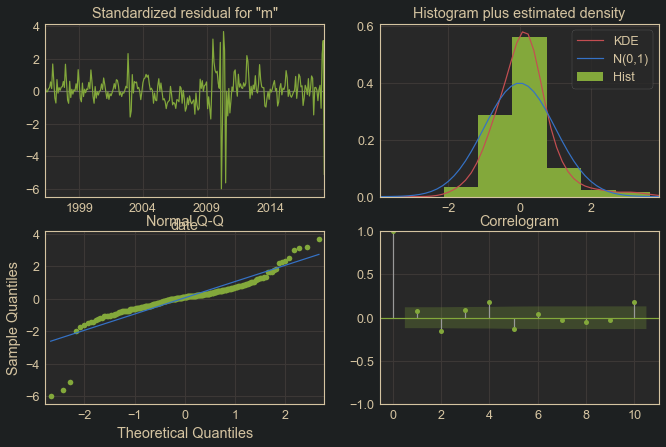

In [65]:
# We can see that the null hypotheses of non-correlated and homoscedastic residuals are both
# rejected. The Jarque-Bera test null hypothesis of normal residuals is also rejected.
model.plot_diagnostics();

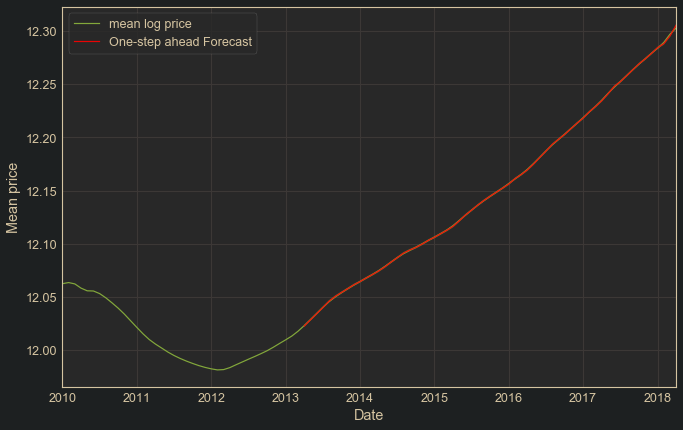

In [66]:
# Get predictions
pred = model.get_prediction('2013-04', '2018-04', dynamic=False)
pred_conf = pred.conf_int()
# Plot observed values
ax = means['2010':].plot(label='observed')
# Plot predicted values
pred.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', color='red', alpha=0.9)
# Plot the range for confidence intervals
ax.fill_between(pred_conf.index, 
                pred_conf.iloc[:, 0], 
                pred_conf.iloc[:, 1],
                alpha=0.5
               )
# Set axes labels
ax.set_xlabel('Date')
ax.set_ylabel('Mean price')
plt.legend()
plt.show()

In [68]:
forecasted = pred.predicted_mean
truth = means_fix['2013-04':'2018-04']['mean log price']

# Compute the mean square error
mse = np.mean((forecasted - truth) ** 2)
print('The Mean Squared Error of our forecasts is {}'.format(round(mse, 7)))

The Mean Squared Error of our forecasts is 3e-07


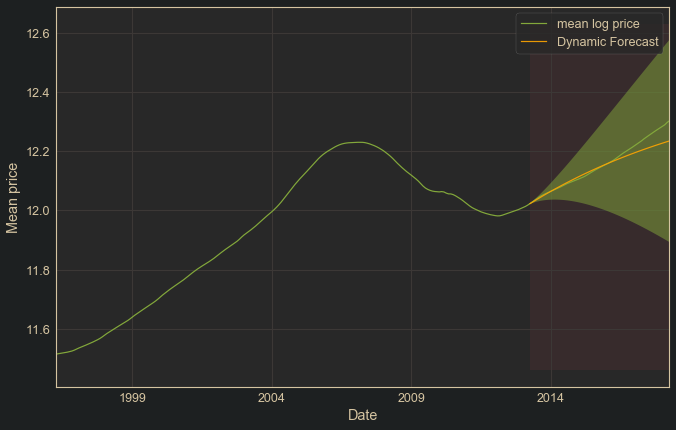

In [69]:
# We can see that the one step ahead forecasts were similar to the last model in error

# Get dynamic predictions with confidence intervals
pred_dynamic = model.get_prediction(start='2013-04', end='2018-04', dynamic=True, full_results=True)
pred_dynamic_conf = pred_dynamic.conf_int()

# Plot observed values
ax = means_fix.plot(label='observed')
# Plot predicted values
pred_dynamic.predicted_mean.plot(ax=ax, label='Dynamic Forecast', color='orange', alpha=0.9)
# Plot the range for confidence intervals
ax.fill_between(pred_dynamic_conf.index, 
                pred_dynamic_conf.iloc[:, 0], 
                pred_dynamic_conf.iloc[:, 1],
                alpha=0.5
               )
ax.fill_betweenx(ax.get_ylim(), 
                 pd.to_datetime('2013-04'), 
                pred_dynamic.predicted_mean.index[-1],
                alpha=0.1,
                zorder=-1
               )
# Set axes labels
ax.set_xlabel('Date')
ax.set_ylabel('Mean price')
plt.legend()
plt.show()

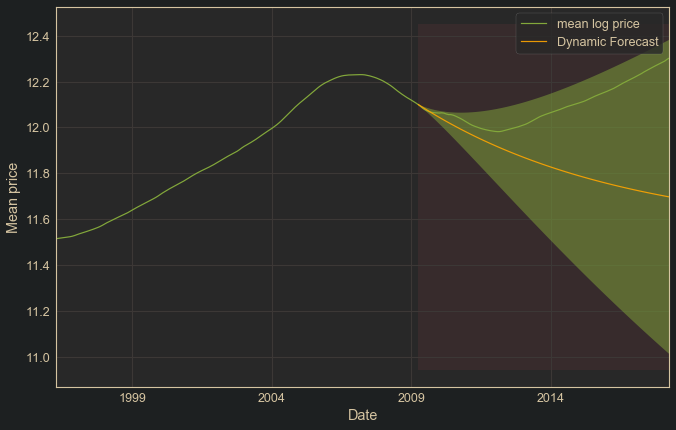

In [70]:
# We can see that this model, while very similar in its diagnostics, seems to have a bit of 
# a downturn in dynamic projections, likely a result of the AR(1) parameter.
# Get dynamic predictions with confidence intervals
pred_dynamic = model.get_prediction(start='2009-04', end='2018-04', dynamic=True, full_results=True)
pred_dynamic_conf = pred_dynamic.conf_int()

# Plot observed values
ax = means_fix.plot(label='observed')
# Plot predicted values
pred_dynamic.predicted_mean.plot(ax=ax, label='Dynamic Forecast', color='orange', alpha=0.9)
# Plot the range for confidence intervals
ax.fill_between(pred_dynamic_conf.index, 
                pred_dynamic_conf.iloc[:, 0], 
                pred_dynamic_conf.iloc[:, 1],
                alpha=0.5
               )
ax.fill_betweenx(ax.get_ylim(), 
                 pd.to_datetime('2009-04'), 
                pred_dynamic.predicted_mean.index[-1],
                alpha=0.1,
                zorder=-1
               )
# Set axes labels
ax.set_xlabel('Date')
ax.set_ylabel('Mean price')
plt.legend()
plt.show()

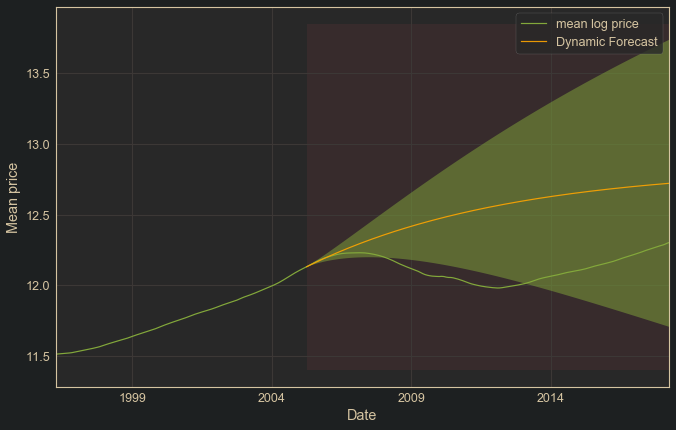

In [71]:
# It appears that the AR term is introducing a bit of resistance to the ongoing trend at the
# time. Let's look further back
# Get dynamic predictions with confidence intervals
pred_dynamic = model.get_prediction(start='2005-04', end='2018-04', dynamic=True, full_results=True)
pred_dynamic_conf = pred_dynamic.conf_int()

# Plot observed values
ax = means_fix.plot(label='observed')
# Plot predicted values
pred_dynamic.predicted_mean.plot(ax=ax, label='Dynamic Forecast', color='orange', alpha=0.9)
# Plot the range for confidence intervals
ax.fill_between(pred_dynamic_conf.index, 
                pred_dynamic_conf.iloc[:, 0], 
                pred_dynamic_conf.iloc[:, 1],
                alpha=0.5
               )
ax.fill_betweenx(ax.get_ylim(), 
                 pd.to_datetime('2005-04'), 
                pred_dynamic.predicted_mean.index[-1],
                alpha=0.1,
                zorder=-1
               )
# Set axes labels
ax.set_xlabel('Date')
ax.set_ylabel('Mean price')
plt.legend()
plt.show()

In [72]:
# We can see the figtht against the ongoing trend here as well. The market crash was unanticipated
# by both models so far.

In [73]:
# Let's look at a 5 year forecast with this model
prediction = model.get_forecast(60)

# Get confidence intervals of forecasts
pred_conf = prediction.conf_int()

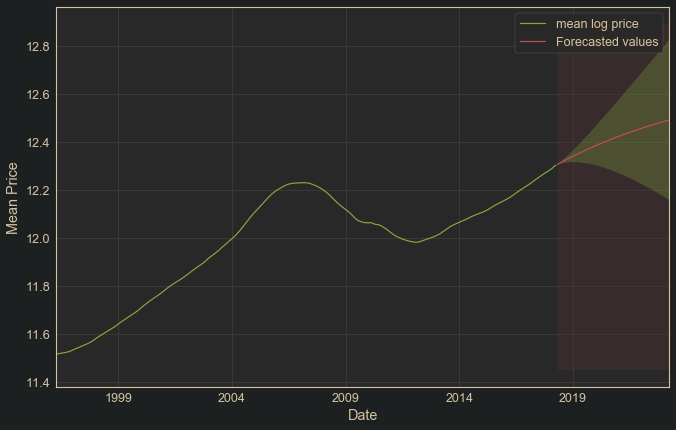

In [74]:
# Plot future predictions with confidence intervals
ax = means_fix.plot(label='observed')
prediction.predicted_mean.plot(label='Forecasted values', ax=ax)

ax.fill_between(pred_conf.index,
                pred_conf.iloc[:, 0],
                pred_conf.iloc[:, 1],
                alpha=0.3
               )

ax.fill_betweenx(ax.get_ylim(), pred_conf.index[0], pred_conf.index[-1],
                 alpha=0.1,
                 zorder=-1
                )

ax.set_xlabel('Date')
ax.set_ylabel('Mean Price')
plt.legend()
plt.show()

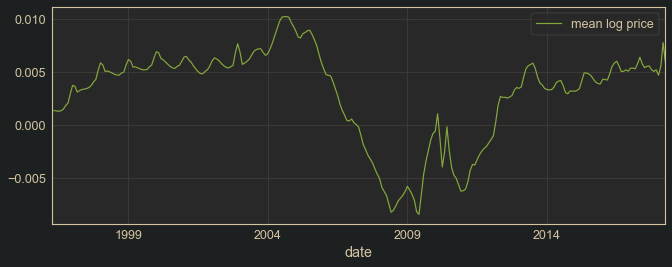

In [75]:
# We can see here a similar projection to our last model, but just a bit more pessimistic by 
# it's fight against the ongoing trend. Although this model has seems relatively sound,
# when we analyze the terms in the model, there is only one degree of 
# differencing. The point of differencing is to make the data you are working with stationary,
# and since earlier we showed that one order of differencing wasn't enough to make the series
# fully stationary, it means that the assumption of the model that the input data is stationary
# is violated, making it technically not as good of a model as the one before, with two orders
# of differencing. Let's look at the 1st ordered difference series again:
means_fix.diff().plot(figsize=(11,4))

In [76]:
# This is visibly non-stationary data
# We can recall from earlier that the Augmented Dickey-Fuller test did not reject the null
# hypothesis for non-stationarity of this data

In [78]:
dftest = adfuller(means_fix['mean log price'].diff().dropna())
dfoutput = pd.Series(dftest[0:4], index=['Test Statistic', 'p-value', '#Lags Used', 'Number of Observations Used'])
print("Dickey-Fuller Results for Differenced Means:\n================================\n",dfoutput)

Dickey-Fuller Results for Differenced Means:
 Test Statistic                  -1.942736
p-value                          0.312231
#Lags Used                      14.000000
Number of Observations Used    249.000000
dtype: float64


There is a function in R that I'd like to get to use through python is the fourier() function from the 'forecast' package. It generates a Fourier series for the input data, which can be used as exogenous terms in an ARIMA function.

To do this, I will take a bit of a detour into generating Fourier Series from R using python. Note that this ultimately does not come in handy for this project, but definitely could in the future.

In [81]:
# Earlier the periodogram showed a strong spike at the full-length period of the data, and the
# halfway point. I discussed how this is an artifact of the way that the periodogram is made,
# but one thing I noticed is that the half-period spike is higher than it would be for the 
# random data experiment from the R notebook. This means that there may be more to investigate
# here than just an artifact of the math, let's see
fs = r['fourier'](r['ts'](FloatVector(means_fix['mean log price']), f=132.5), K=2)

In [82]:
fs

0.047402,0.094698,0.141781,0.188546,...,0.959796,0.982064,0.995506,1.000000


In [83]:
# We can see that the returned matrix is one dimensional, whereas it should be 2
# Looking at the comparable result from the R notebook, it looks like the columns have been
# laid end to end, we can set up the appropriate dataframe as below
two_d = list(zip(fs[:265], fs[265:]))
two_d

[(0.04740249628668982, 0.9988758698385852),
 (0.0946984194217752, 0.9955060066915807),
 (0.14178143585783998, 0.9898979868885931),
 (0.18854569071715174, 0.9820644187180351),
 (0.23488604578098365, 0.9720229140804107),
 (0.28069831586769994, 0.9597960488921784),
 (0.32587950306816577, 0.9454113123292133),
 (0.37032802831186007, 0.9289010450239843),
 (0.4139439597430692, 0.9103023663553931),
 (0.45662923739371303, 0.8896570909947473),
 (0.4982878936476807, 0.8670116348954942),
 (0.5388262690010142, 0.8424169109380739),
 (0.5781532226328543, 0.8159282144645111),
 (0.616180337313733, 0.7876050989600907),
 (0.6528221181905216, 0.7575112421616201),
 (0.6879961850011169, 0.7257143028933003),
 (0.7216234572867163, 0.6922857689520757),
 (0.7536283321852749, 0.6573007963844566),
 (0.7839388544064212, 0.6208380405161622),
 (0.8124868780056812, 0.5829794791144721),
 (0.8392082195943015, 0.5438102280808652),
 (0.8640428026402155, 0.5034183500883153),
 (0.8869347925357273, 0.4618946565934774),
 (0.

In [84]:
# This can be easily fit into a DataFrame
fourier_series = pd.DataFrame(two_d)
fourier_series.head()

,0,1
0,0.047402,0.998876
1,0.094698,0.995506
2,0.141781,0.989898
3,0.188546,0.982064
4,0.234886,0.972023


In [996]:
log_returns.index.is_all_dates

True

In [993]:
means.index.freqstr

In [1024]:
# Now to make a function to get everything together properly:
def fourier_series(data, freqs, K, h=None):
    type1 = type(pd.DataFrame())
    type2 = type(pd.Series())
    if type(data) != type1 and type(data) != type2:
        raise ValueError("Input data must be a Pandas DataFrame or Series")
    if type(data) == type1:
        if len(data.columns) > 1:
            raise ValueError("Input DataFrame must have only one column")
        else:
            data = data.iloc[:,0]
    
    from rpy2.robjects.packages import importr
    from rpy2.robjects import FloatVector
    from rpy2.robjects import r
    importr('forecast')
    
    index = data.index
    length = len(data)
    
    #for col in data:
    rlist = FloatVector(data)
    fourier_terms = pd.DataFrame()
    for freq in freqs:
        if not h:
            fs = r['fourier'](r['ts'](rlist, f=freq), K=K)
        else:
            fs = r['fourier'](r['ts'](rlist, f=freq), K=K, h=h)

        length = int(len(fs)/(2*K))
        for i in range(K):
            columns = ['S'+str(i+1)+'-'+str(round(freq, 2)), 
                       'C'+str(i+1)+'-'+str(round(freq, 2))]
            # split sine and cosine values:
            i *= 2
            s = fs[i*length:(i+1)*length]
            c = fs[(i+1)*length:(i+2)*length]
            fourier_terms = pd.concat([fourier_terms, 
                                       pd.DataFrame(list(zip(s,c)), columns=columns)],
                                      axis=1
                                     )
    
    if not h:
        fourier_terms.index = index
    else:
        if data.index.is_all_dates:
            freq = data.index.freqstr
            future_index = pd.date_range(start=data.index[-1], periods=h+1, freq=freq)[1:]
            fourier_terms.index = future_index
    
    return fourier_terms

In [1025]:
fs = fourier_series(means_fix, freqs=[265, 132.5], K=2)
fs.tail()

,S1-265,C1-265,S2-265,C2-265,S1-132.5,C1-132.5,S2-132.5,C2-132.5
date,,,,,,,,
2017-12-01,-0.094698,0.995506,-0.188546,0.982064,-0.188546,0.982064,-0.370328,0.928901
2018-01-01,-0.071070,0.997471,-0.141781,0.989898,-0.141781,0.989898,-0.280698,0.959796
2018-02-01,-0.047402,0.998876,-0.094698,0.995506,-0.094698,0.995506,-0.188546,0.982064
2018-03-01,-0.023708,0.999719,-0.047402,0.998876,-0.047402,0.998876,-0.094698,0.995506
2018-04-01,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000


In [1026]:
fs = fourier_series(means_fix, freqs=[265, 132.5], K=2, h=60)
fs.head()

,S1-265,C1-265,S2-265,C2-265,S1-132.5,C1-132.5,S2-132.5,C2-132.5
2018-05-01,0.023708,0.999719,0.047402,0.998876,0.047402,0.998876,0.094698,0.995506
2018-06-01,0.047402,0.998876,0.094698,0.995506,0.094698,0.995506,0.188546,0.982064
2018-07-01,0.071070,0.997471,0.141781,0.989898,0.141781,0.989898,0.280698,0.959796
2018-08-01,0.094698,0.995506,0.188546,0.982064,0.188546,0.982064,0.370328,0.928901
2018-09-01,0.118273,0.992981,0.234886,0.972023,0.234886,0.972023,0.456629,0.889657


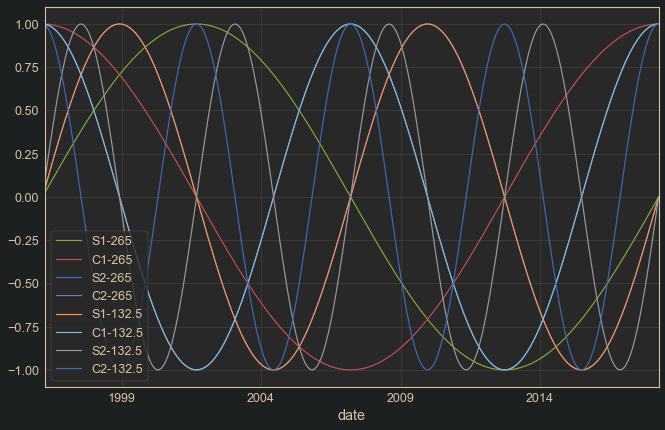

In [87]:
# A quick look at what we made
fs.plot()

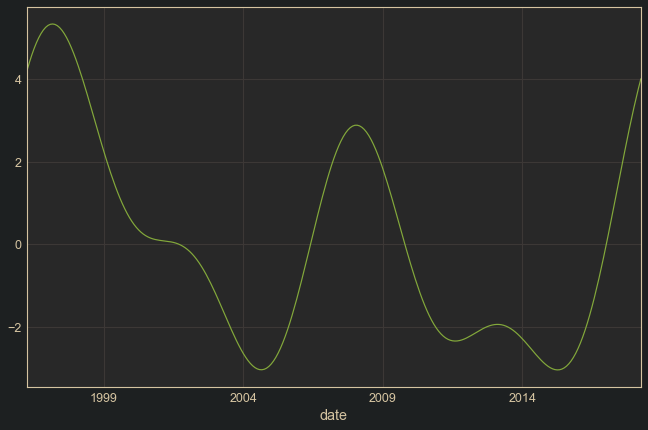

In [89]:
fs.sum(axis=1).plot()

In [90]:
# We can see the first and second harmonics of sine and cosine here

In [91]:
# Fitting the simple model using a Fourier Series as exogenous predictors
fs = fourier_series(means_fix, freqs=[132.5], K=2)
model = SARIMAX(means_fix,
                order=(0,2,1),
                #seasonal_order=(0,1,1,12),
                enforce_stationary=False,
                enforce_invertibility=False,
                exog=fs
               ).fit()
print(model.summary())

                               SARIMAX Results                                
Dep. Variable:         mean log price   No. Observations:                  265
Model:               SARIMAX(0, 2, 1)   Log Likelihood                1615.884
Date:                Fri, 04 Sep 2020   AIC                          -3219.768
Time:                        18:41:29   BIC                          -3198.335
Sample:                    04-01-1996   HQIC                         -3211.155
                         - 04-01-2018                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
S1-132.5      -0.0237      0.044     -0.539      0.590      -0.110       0.063
C1-132.5       0.0585      0.042      1.389      0.165      -0.024       0.141
S2-132.5      -0.0052      0.011     -0.453      0.6

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\mlemodel.py:3225: FutureWarning: The default value of lags is changing.  After 0.12, this value will become min(10, nobs//5) for non-seasonal time series and min (2*m, nobs//5) for seasonal time series. Directly set lags to silence this warning.
  FutureWarning


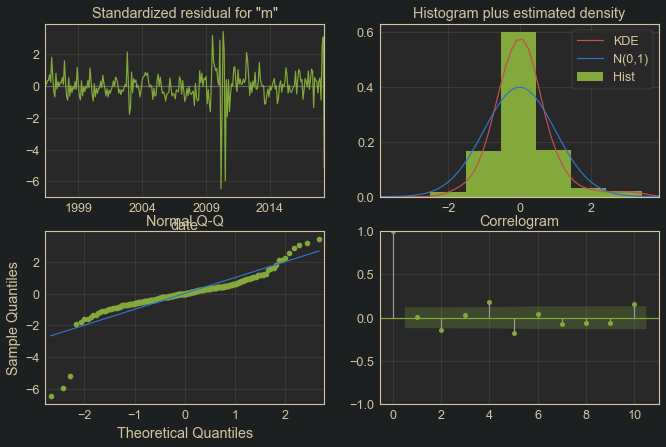

In [92]:
# We can see that the fourier terms did not aid the model much in this case, and has insignificant
# coefficients. This all may come in handy for future datasets, however.
model.plot_diagnostics(figsize=(11,7));

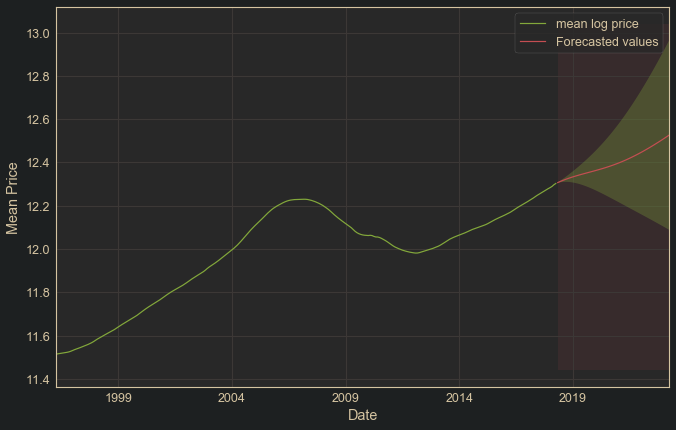

In [93]:
# Let's see now how the 5 year projection looks
prediction = model.get_forecast(60, exog=fourier_series(means_fix, freqs=[132.5], K=2, h=60))

# Get confidence intervals of forecasts
pred_conf = prediction.conf_int()
# Plot future predictions with confidence intervals
ax = means_fix.plot(label='observed')
prediction.predicted_mean.plot(label='Forecasted values', ax=ax)

ax.fill_between(pred_conf.index,
                pred_conf.iloc[:, 0],
                pred_conf.iloc[:, 1],
                alpha=0.3
               )

ax.fill_betweenx(ax.get_ylim(), pred_conf.index[0], pred_conf.index[-1],
                 alpha=0.1,
                 zorder=-1
                )

ax.set_xlabel('Date')
ax.set_ylabel('Mean Price')
plt.legend()
plt.show()

That function is working properly, although it does not seem to be useful so far. It should prove useful in the future.<br>
<br>
I'd like to see if using the fourier_series function on the seasonal component of a seasonal decomposition might aid a model, let's try that now.

In [123]:
decomposition = seasonal_decompose(log_returns)

In [ ]:
pd.register

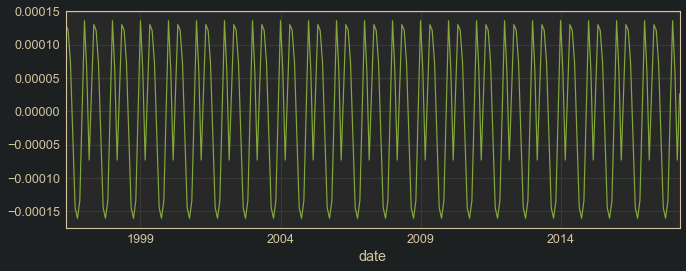

In [126]:
decomposition.seasonal.plot(figsize=(11,4))

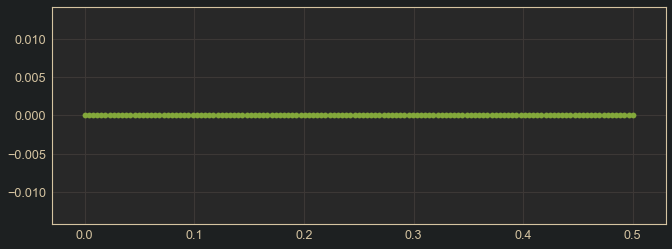

In [127]:
# We can see that there is a very slight but regular yearly seasonality to the data.
# let's see what a periodogram turns up
pgram = periodogram(decomposition.seasonal)
plt.figure(figsize=(11,4))
plt.scatter(pgram[0], pgram[1])

In [128]:
# Finding 3 largest specs:
indices = np.argpartition(pgram[1], -2)[-3:]
pd.DataFrame(list(zip((1 / pgram[0][indices])[::-1], pgram[1][indices][::-1])),
             columns=['Period', 'Spec']
            )

,Period,Spec
0,6.0,1.287000e-06
1,12.0,1.273207e-06
2,4.0,2.444789e-07


In [129]:
# We can see the periods are close to, but not exactly yearly, this may explain the shifting
# phase over time that we observed earlier. Let's generate a fourier series
fs = fourier_series(pd.DataFrame(decomposition.seasonal), [12.045455, 
                                             #6.022727
                                            ], K=2)
fs.head()

,S1-12.05,C1-12.05,S2-12.05,C2-12.05
date,,,,
1996-05-01,0.498288,0.867012,0.864043,0.503418
1996-06-01,0.864043,0.503418,0.869950,-0.493140
1996-07-01,0.999982,0.005928,0.011855,-0.999930
1996-08-01,0.869950,-0.493140,-0.858014,-0.513626
1996-09-01,0.508531,-0.861044,-0.875735,0.482792


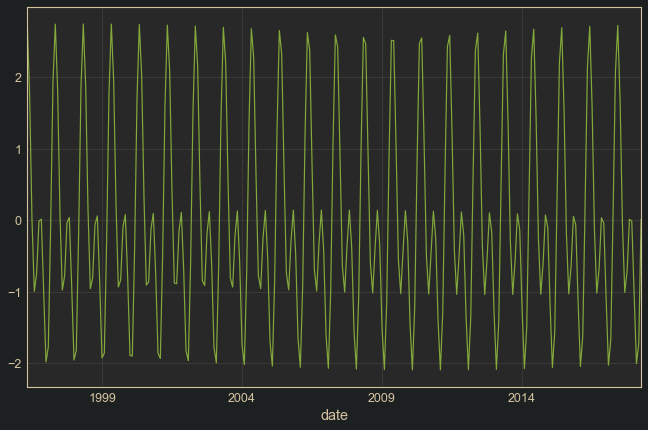

In [130]:
fs.sum(axis=1).plot()

In [132]:
# Fitting the ARIMA(0,2,1) model again with this fourier series as an exog variable
model = SARIMAX(log_returns,
                order=(0,1,1),
                #seasonal_order=(0,1,1,12),
                enforce_stationary=False,
                enforce_invertibility=False,
                exog=fs
               ).fit()
print(model.summary())

                               SARIMAX Results                                
Dep. Variable:            log returns   No. Observations:                  264
Model:               SARIMAX(0, 1, 1)   Log Likelihood                1614.297
Date:                Fri, 04 Sep 2020   AIC                          -3216.594
Time:                        18:49:54   BIC                          -3195.162
Sample:                    05-01-1996   HQIC                         -3207.981
                         - 04-01-2018                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
S1-12.05   -4.988e-05      0.000     -0.285      0.776      -0.000       0.000
C1-12.05       0.0002      0.000      1.001      0.317      -0.000       0.000
S2-12.05     3.84e-05   7.23e-05      0.531      0.5

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\mlemodel.py:3225: FutureWarning: The default value of lags is changing.  After 0.12, this value will become min(10, nobs//5) for non-seasonal time series and min (2*m, nobs//5) for seasonal time series. Directly set lags to silence this warning.
  FutureWarning


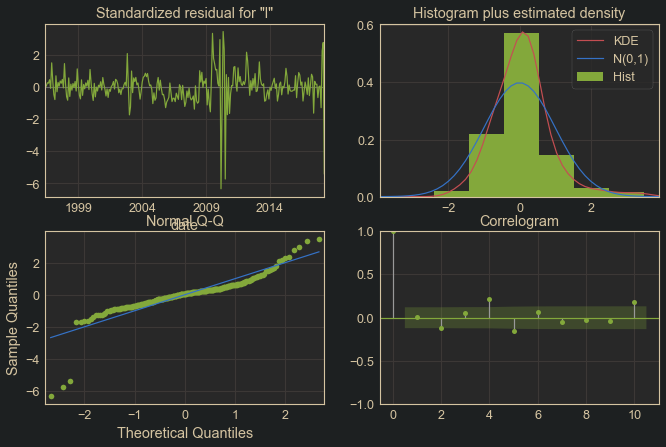

In [133]:
# We can see that the fourier terms did not aid the model in this case, and has insignificant
# coefficients. This all may come in handy for future datasets, however.
model.plot_diagnostics(figsize=(11,7));

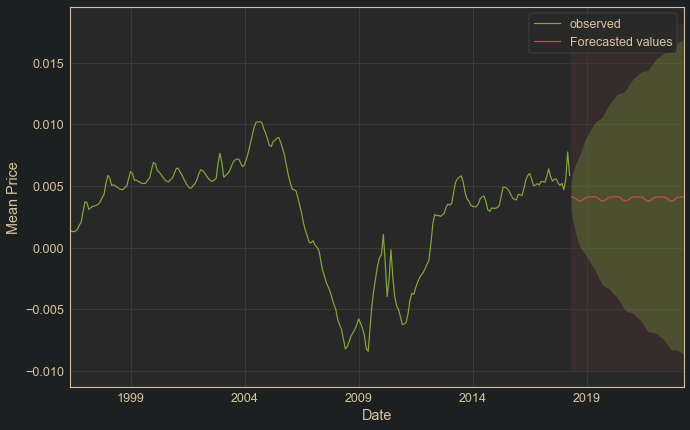

In [135]:
# Let's see now how the 5 year projection looks
prediction = model.get_forecast(60, exog=fourier_series(means_fix, freqs=[12.045455], K=2, h=60))

# Get confidence intervals of forecasts
pred_conf = prediction.conf_int()
# Plot future predictions with confidence intervals
ax = log_returns.plot(label='observed')
prediction.predicted_mean.plot(label='Forecasted values', ax=ax)

ax.fill_between(pred_conf.index,
                pred_conf.iloc[:, 0],
                pred_conf.iloc[:, 1],
                alpha=0.3
               )

ax.fill_betweenx(ax.get_ylim(), pred_conf.index[0], pred_conf.index[-1],
                 alpha=0.1,
                 zorder=-1
                )

ax.set_xlabel('Date')
ax.set_ylabel('Mean Price')
plt.legend()
plt.show()

In [136]:
# Now to add a yearly seasonal component to the model, since earlier we were able to see this
# in the data, and see how the model compares
# Note that the auto.arima model did not suggest seasonality, but we can force it to include
# a seasonal component by setting D=1
# we also want d=2 because this makes the data stationary for modeling

In [143]:
autoarima = r['auto.arima'](r['ts'](FloatVector(means_fix['mean log price']), freq=12), 
                            seasonal=True,
                            D=1,
                            d=2
                           )

In [144]:
print(autoarima)

Series: structure(c(11.5142636560835, 11.5156201149108, 11.5169485751824,  11.5182357576629, 11.5195757467557, 11.5210575971359, 11.5228841489884,  11.5249333014024, 11.5278829306489, 11.5316086082182, 11.535252316171,  11.5383534954782, 11.5415904538513, 11.5449263757948, 11.54830457405,  11.5517305429253, 11.5552601274276, 11.5589619578487, 11.5630126618771,  11.5673044536636, 11.5724822697232, 11.578333641924, 11.5839786994788,  11.5890169642435, 11.5941094198777, 11.5991079190941, 11.6040011697805,  11.6087765989047, 11.6134920813558, 11.6181866190224, 11.6230718089739,  11.6280522465346, 11.6336840083587, 11.6398526349363, 11.6458408132802,  11.6512929777247, 11.6567625445083, 11.6621346678752, 11.6674173362969,  11.6726227747144, 11.6778141452453, 11.6830376187281, 11.6885137086376,  11.6941535701393, 11.7004552784774, 11.7073544441803, 11.7141693716779,  11.7204271709258, 11.7265550433744, 11.7324668468003, 11.7381735593981,  11.7436797558414, 11.7490539850659, 11.7543890300087,

In [145]:
# Extracting the model parameters by making output into a string:
def get_params(autoarima_output):
    string = str(autoarima_output).split('ARIMA')[1].split(' ')[0]
    if len(string) < 8:
        param = tuple(int(x) for x in string.replace('(','').replace(')','').split(','))
        sparam = (0,0,0,0)
    else:
        params = tuple(int(x) for x in string.replace('(','').replace(')',',')
                       .replace('[','').replace(']','').split(','))
        param = params[:3]
        sparam = params[3:]
    
    return param, sparam

param, sparam = get_params(autoarima)
print(param)
print(sparam)

(4, 2, 2)
(0, 1, 1, 12)


In [146]:
model = SARIMAX(means_fix,
                order=param,
                seasonal_order=sparam,
                enforce_stationary=False,
                enforce_invertibility=False,
                initialization='approximate_diffuse'
               ).fit()
print(model.summary())

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:965: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


                                      SARIMAX Results                                       
Dep. Variable:                       mean log price   No. Observations:                  265
Model:             SARIMAX(4, 2, 2)x(0, 1, [1], 12)   Log Likelihood                1336.037
Date:                              Fri, 04 Sep 2020   AIC                          -2656.074
Time:                                      18:51:38   BIC                          -2627.436
Sample:                                  04-01-1996   HQIC                         -2644.568
                                       - 04-01-2018                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1      -1.095e-09   7.12e-09     -0.154      0.878    -1.5e-08    1.29e-08
ar.L2       1.247e-

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\mlemodel.py:3225: FutureWarning: The default value of lags is changing.  After 0.12, this value will become min(10, nobs//5) for non-seasonal time series and min (2*m, nobs//5) for seasonal time series. Directly set lags to silence this warning.
  FutureWarning


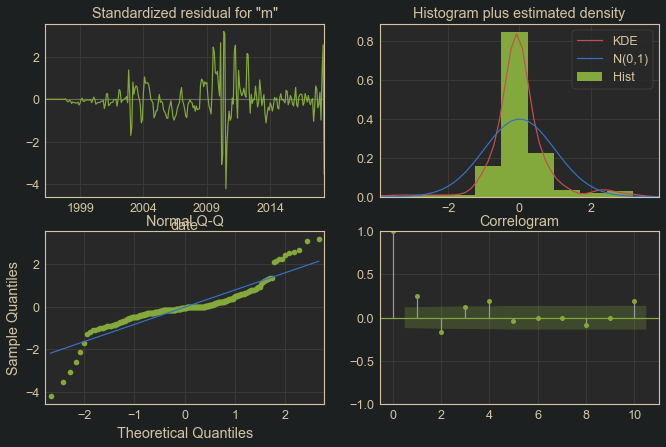

In [147]:
model.plot_diagnostics();

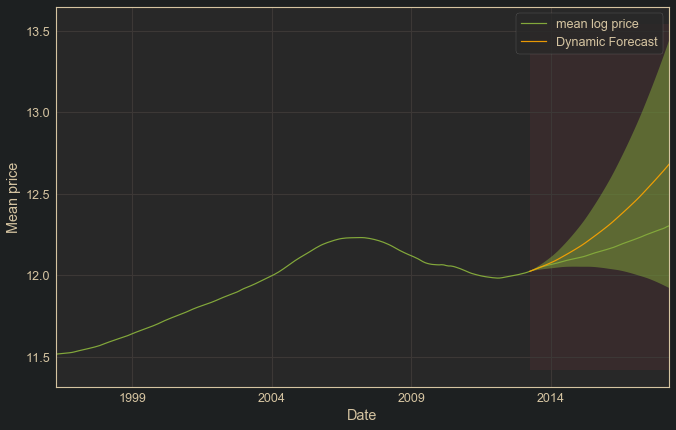

In [148]:
# We can see that the log likelihood and AIC values have improved, but now the Ljung-Box test
# is rejecting the null hypothesis of non-autocorrelated residuals. The residuals are heavily
# heteroscedastic as well, with a very noticeable change over time. Let's look at the predictive
# accuracy of this model

# Get dynamic predictions with confidence intervals
pred_dynamic = model.get_prediction(start='2013-04', end='2018-04', dynamic=True, full_results=True)
pred_dynamic_conf = pred_dynamic.conf_int()

# Plot observed values
ax = means_fix.plot(label='observed')
# Plot predicted values
pred_dynamic.predicted_mean.plot(ax=ax, label='Dynamic Forecast', color='orange', alpha=0.9)
# Plot the range for confidence intervals
ax.fill_between(pred_dynamic_conf.index, 
                pred_dynamic_conf.iloc[:, 0], 
                pred_dynamic_conf.iloc[:, 1],
                alpha=0.5
               )
ax.fill_betweenx(ax.get_ylim(), 
                 pd.to_datetime('2013-04'), 
                pred_dynamic.predicted_mean.index[-1],
                alpha=0.1,
                zorder=-1
               )
# Set axes labels
ax.set_xlabel('Date')
ax.set_ylabel('Mean price')
plt.legend()
plt.show()

In [149]:
# We can see that this model does not behave as well as the more simple model with no seasonality

In [150]:
# Let's look at a 5 year forecast with this model
prediction = model.get_forecast(60)

# Get confidence intervals of forecasts
pred_conf = prediction.conf_int()

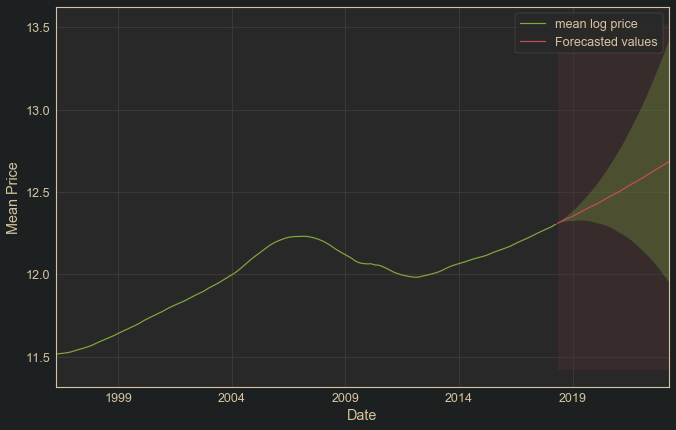

In [151]:
# Plot future predictions with confidence intervals
ax = means_fix.plot(label='observed')
prediction.predicted_mean.plot(label='Forecasted values', ax=ax)

ax.fill_between(pred_conf.index,
                pred_conf.iloc[:, 0],
                pred_conf.iloc[:, 1],
                alpha=0.3
               )

ax.fill_betweenx(ax.get_ylim(), pred_conf.index[0], pred_conf.index[-1],
                 alpha=0.1,
                 zorder=-1
                )

ax.set_xlabel('Date')
ax.set_ylabel('Mean Price')
plt.legend()
plt.show()

In [152]:
# We can see that the confidence intervals on the out of sample forecasting are huge, and not
# very helpful.

<a id='arima_returns'></a>
### ARIMA Modeling on Returns

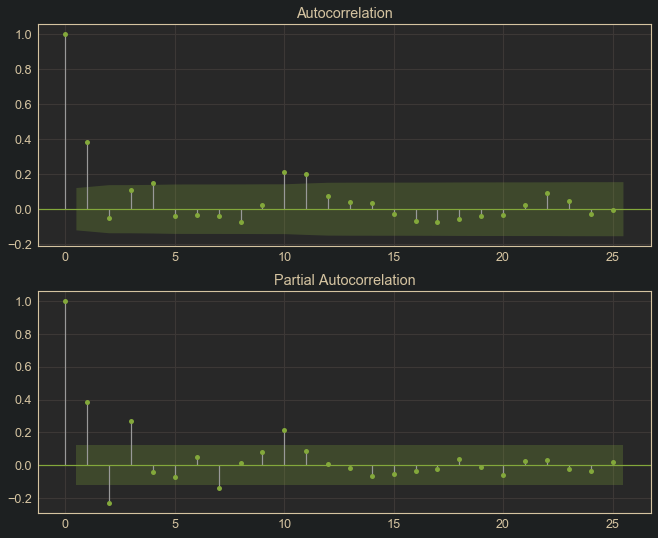

In [154]:
# First a look at the acf and pacf of the log returns and see if we can guess appropriate orders
fig, (ax1, ax2) = plt.subplots(2, figsize=(11,9))
plot_acf(log_returns.diff().dropna(), ax=ax1);
plot_pacf(log_returns.diff().dropna(), ax=ax2);

In [155]:
# We can see what looks like either a taper past lag 1 in the PACF, or a dropoff after lag 3.
# There is a drop off after lag 1 on the ACF, so a MA(1) order may be appropriate. There is a
# bump at 10 lags, which drops off more on the PACF, meaning that possibly an AR(10) order may
# be useful if the coefficients for the in between lags are set at zero. 

In [1400]:
# Now let's see what the auto.arima function in R recommends for this series
rlist = FloatVector(log_returns)
rmodel = r['auto.arima'](r['ts'](rlist, 
                                 #freq=12
                                ), 
                        seasonal='TRUE'
                       )

In [1401]:
print(rmodel)

Series: structure(c(0.00135645882736313, 0.00132846027159061, 0.00128718248053517,  0.00133998909277011, 0.00148185038020543, 0.00182655185247249,  0.00204915241402759, 0.00294962924643194, 0.00372567756934394,  0.00364370795275626, 0.00310117930727927, 0.00323695837310112,  0.00333592194346188, 0.00337819825519325, 0.00342596887532487,  0.0035295845023029, 0.00370183042110561, 0.00405070402834262,  0.00429179178650863, 0.00517781605966938, 0.00585137220078735,  0.00564505755479416, 0.00503826476466784, 0.00509245563422311,  0.00499849921635409, 0.00489325068639879, 0.00477542912421924,  0.00471548245115905, 0.00469453766660166, 0.00488518995142329,  0.00498043756074829, 0.00563176182410352, 0.00616862657754602,  0.00598817834392484, 0.00545216444446872, 0.00546956678363308,  0.00537212336688953, 0.00528266842171021, 0.0052054384175424,  0.00519137053088414, 0.00522347348279162, 0.00547608990946102,  0.00563986150170059, 0.00630170833814603, 0.00689916570288496,  0.00681492749757062, 0

In [1402]:
# Extracting the model parameters:
string = str(rmodel).split('ARIMA')[1].split(' ')[0]
param = tuple(int(x) for x in string.replace('(','').replace(')','').split(','))
print(param)

(3, 1, 1)


In [1403]:
# Fitting the simple model using the optimal parameters found by the auto.arima() function:
model = SARIMAX(log_returns,
                order=param,
                enforce_stationary=False,
                enforce_invertibility=False,
               ).fit()
print(model.summary())

                               SARIMAX Results                                
Dep. Variable:            log returns   No. Observations:                  264
Model:               SARIMAX(3, 1, 1)   Log Likelihood                1620.827
Date:                Sat, 05 Sep 2020   AIC                          -3231.655
Time:                        22:56:35   BIC                          -3213.794
Sample:                    05-01-1996   HQIC                         -3224.477
                         - 04-01-2018                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2063      0.078      2.641      0.008       0.053       0.359
ar.L2         -0.2873      0.040     -7.246      0.000      -0.365      -0.210
ar.L3          0.2439      0.052      4.648      0.0

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\mlemodel.py:3225: FutureWarning: The default value of lags is changing.  After 0.12, this value will become min(10, nobs//5) for non-seasonal time series and min (2*m, nobs//5) for seasonal time series. Directly set lags to silence this warning.
  FutureWarning


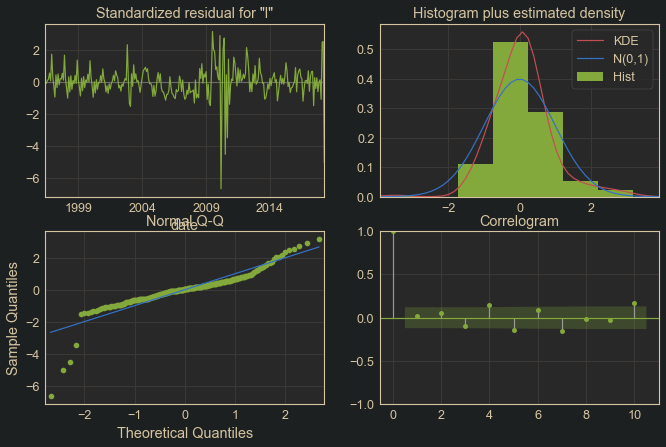

In [1404]:
model.plot_diagnostics();

In [1405]:
# We can see that the residuals are visibly heteroscedastic, and the null hypothesis of
# homoscedastic residuals is rejected. The Jarque-Bera test has the null hypothesis of normal
# skew and kurtosis rejected, caused by the leptokurtocity resulting from the large errors
# during the crash

In [1406]:
from statsmodels.stats.diagnostic import het_arch

In [1407]:
# Performing ARCH-LM test, note that recommended ddof = (p+q) from ARIMA model
results = het_arch(model.resid, 
                   #maxlag=80, 
                   ddof=4
                  )
res_names = ['LM test statistic', 'LM p-value', 'F-statistic', 'F-test p-value']
results = list(zip(res_names, results))
results

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\stats\diagnostic.py:660: FutureWarning: The default value of nlags is changing.  After 0.12, this value will become min(10, nobs//5). Directly setmaxlags or period to silence this warning.
  FutureWarning)


[('LM test statistic', 44.603674174414145),
 ('LM p-value', 0.0001595982102365387),
 ('F-statistic', 3.229575786949997),
 ('F-test p-value', 4.727212546347242e-05)]

In [1408]:
# We can see that the null hypothesis of non-autocorrelated residuals is rejected.
# Let's see what the predictive behavior of this model is

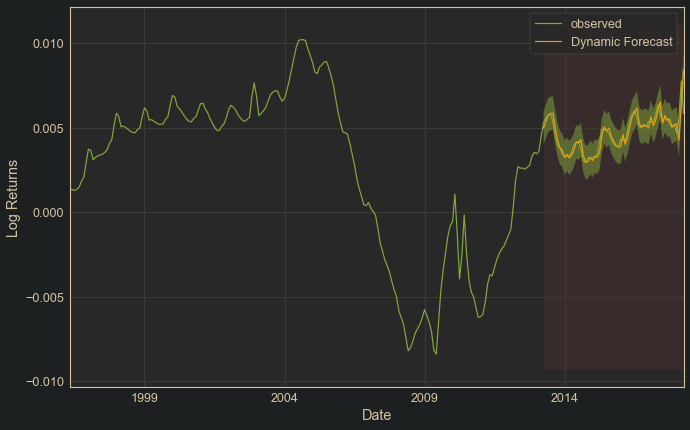

In [1409]:
# Get one step ahead predictions with confidence intervals
pred = model.get_prediction()
pred_conf = pred.conf_int().loc['2013-04-01':]

# Plot observed values
ax = log_returns.plot(label='observed')
# Plot predicted values
pred.predicted_mean.loc['2013-04-01':].plot(ax=ax, label='Dynamic Forecast', color='orange', alpha=0.9)
# Plot the range for confidence intervals
ax.fill_between(pred_conf.index, 
                pred_conf.iloc[:, 0], 
                pred_conf.iloc[:, 1],
                alpha=0.5
               )
ax.fill_betweenx(ax.get_ylim(), 
                 pd.to_datetime('2013-04'), 
                pred.predicted_mean.index[-1],
                alpha=0.1,
                zorder=-1
               )
# Set axes labels
ax.set_xlabel('Date')
ax.set_ylabel('Log Returns')
plt.legend()
plt.show()

In [1410]:
print('MSE for step ahead forecasts:')
((pred.predicted_mean - log_returns)**2).mean()

MSE for step ahead forecasts:


2.649241387452546e-07

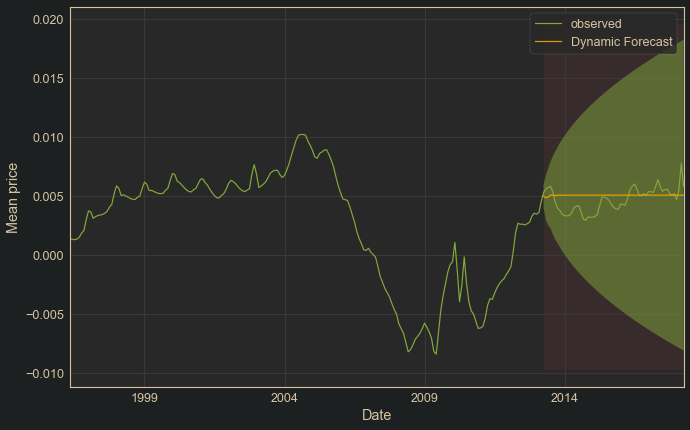

In [1411]:
# We can see that the one step ahead forecasts were fairly accurate on the training data,
# let's look now at the dynamic forecast from the same date

# Get dynamic predictions with confidence intervals
pred_dynamic = model.get_prediction(start='2013-04', end='2018-04', dynamic=True, full_results=True)
pred_dynamic_conf = pred_dynamic.conf_int()

# Plot observed values
ax = log_returns.plot(label='observed')
# Plot predicted values
pred_dynamic.predicted_mean.plot(ax=ax, label='Dynamic Forecast', color='orange', alpha=0.9)
# Plot the range for confidence intervals
ax.fill_between(pred_dynamic_conf.index, 
                pred_dynamic_conf.iloc[:, 0], 
                pred_dynamic_conf.iloc[:, 1],
                alpha=0.5
               )
ax.fill_betweenx(ax.get_ylim(), 
                 pd.to_datetime('2013-04'), 
                pred_dynamic.predicted_mean.index[-1],
                alpha=0.1,
                zorder=-1
               )
# Set axes labels
ax.set_xlabel('Date')
ax.set_ylabel('Mean price')
plt.legend()
plt.show()

In [1412]:
# We can see the predicted means are fairly in line with the actual observations, but the
# confidence bands are rather wide.

In [1413]:
# Let's look at a 5 year forecast with this model
prediction = model.get_forecast(60)

# Get confidence intervals of forecasts
pred_conf = prediction.conf_int()

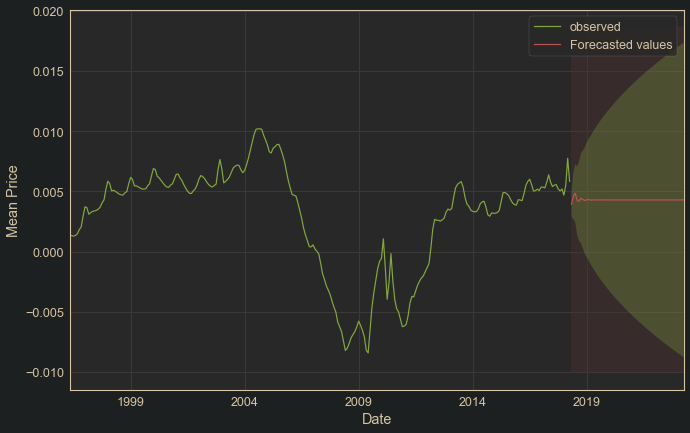

In [1414]:
# Plot future predictions with confidence intervals
ax = log_returns.plot(label='observed')
prediction.predicted_mean.plot(label='Forecasted values', ax=ax)

ax.fill_between(pred_conf.index,
                pred_conf.iloc[:, 0],
                pred_conf.iloc[:, 1],
                alpha=0.3
               )

ax.fill_betweenx(ax.get_ylim(), pred_conf.index[0], pred_conf.index[-1],
                 alpha=0.1,
                 zorder=-1
                )

ax.set_xlabel('Date')
ax.set_ylabel('Mean Price')
plt.legend()
plt.show()

In [1415]:
# We can see that the model has a conservative outlook on out of sample forecasts, indicating
# that the returns stream is expected to have a reduction in mean

# Since the assumptions of the model are violated, our parameter estimates may biased and
# not efficient. In order to get parameter estimates which are BLUE, we will need to perform
# heteroscedasticity filtering

,Period,Spec
0,13.150000,0.000005
1,10.115385,0.000004
2,10.958333,0.000004
3,87.666667,0.000003
4,11.434783,0.000003


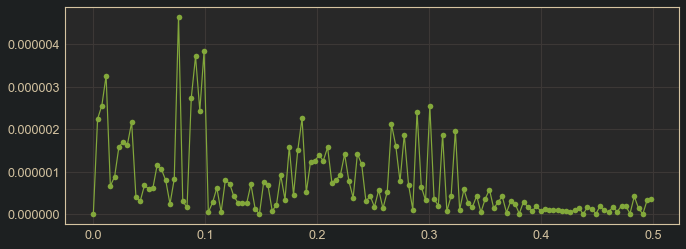

In [1416]:
# First, I'd like to see if a fourier component could help this model. I will generate the
# fourier series using the differenced data, then use the cumulative sum of the values in the
# model above.
pgram = check_pgram(diff_returns)
pgram.head()

In [1431]:
fs = fourier_series(diff_returns, freqs=pgram.Period[:3], K=1)
fs_cols = [0,2,4]

In [1452]:
# Fitting the simple model using the optimal parameters found by the auto.arima() function:
model = SARIMAX(log_returns.loc[fs.index],
                order=param,
                #seasonal_order=(0,2,3,4),
                enforce_stationary=False,
                enforce_invertibility=False,
                exog=fs.iloc[:].cumsum()
               ).fit()
print(model.summary())

                               SARIMAX Results                                
Dep. Variable:            log returns   No. Observations:                  263
Model:               SARIMAX(3, 1, 1)   Log Likelihood                1627.285
Date:                Sat, 05 Sep 2020   AIC                          -3232.571
Time:                        23:04:39   BIC                          -3193.319
Sample:                    06-01-1996   HQIC                         -3216.795
                         - 04-01-2018                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
S1-13.15       0.0002   8.29e-05      2.200      0.028    1.99e-05       0.000
C1-13.15   -4.358e-05   6.48e-05     -0.672      0.501      -0.000    8.34e-05
S1-10.12      -0.0002   7.67e-05     -2.127      0.0

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\mlemodel.py:3225: FutureWarning: The default value of lags is changing.  After 0.12, this value will become min(10, nobs//5) for non-seasonal time series and min (2*m, nobs//5) for seasonal time series. Directly set lags to silence this warning.
  FutureWarning


In [ ]:
# It looks as though all of the cosine components do not produce significant coefficients,
# let's see what happens if we reduce the additions to only the sine components of the fourier
# series

In [1454]:
# Fitting the simple model using the optimal parameters found by the auto.arima() function:
model = SARIMAX(log_returns.loc[fs.index],
                order=param,
                #seasonal_order=(0,2,3,4),
                enforce_stationary=False,
                enforce_invertibility=False,
                exog=fs.iloc[:, fs_cols].cumsum()
               ).fit()
print(model.summary())

                               SARIMAX Results                                
Dep. Variable:            log returns   No. Observations:                  263
Model:               SARIMAX(3, 1, 1)   Log Likelihood                1625.753
Date:                Sat, 05 Sep 2020   AIC                          -3235.506
Time:                        23:07:34   BIC                          -3206.959
Sample:                    06-01-1996   HQIC                         -3224.032
                         - 04-01-2018                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
S1-13.15       0.0002   7.53e-05      2.429      0.015    3.53e-05       0.000
S1-10.12      -0.0002   6.93e-05     -2.346      0.019      -0.000   -2.67e-05
S1-10.96      -0.0002   6.98e-05     -2.282      0.0

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\mlemodel.py:3225: FutureWarning: The default value of lags is changing.  After 0.12, this value will become min(10, nobs//5) for non-seasonal time series and min (2*m, nobs//5) for seasonal time series. Directly set lags to silence this warning.
  FutureWarning


In [1455]:
# We can see that the coefficients for the newly added fourier series are significant

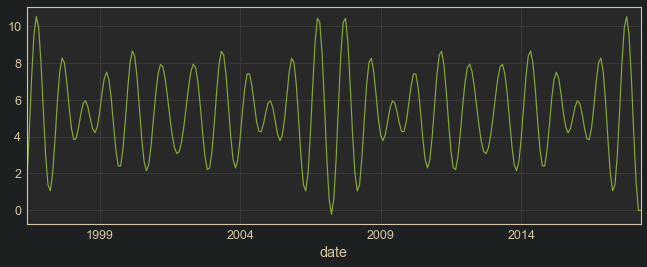

In [1477]:
fs.iloc[:, fs_cols].cumsum().sum(axis=1).plot(figsize=(11,4))

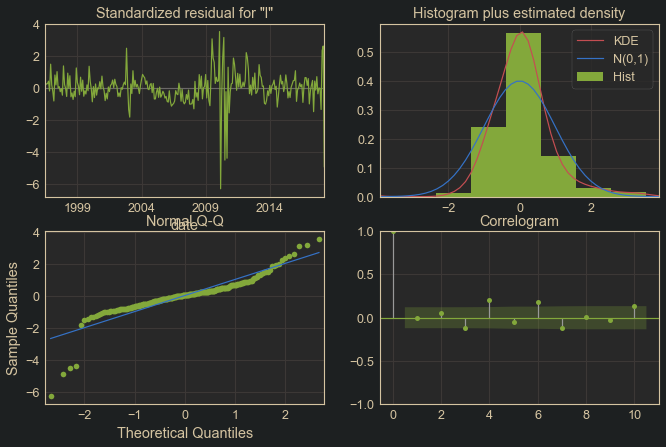

In [1457]:
model.plot_diagnostics();

In [1458]:
# We can see that the residuals are visibly heteroscedastic, and the null hypothesis of
# homoscedastic residuals is rejected. The Jarque-Bera test has the null hypothesis of normal
# skew and kurtosis rejected, caused by the leptokurtocity resulting from the large errors
# during the crash

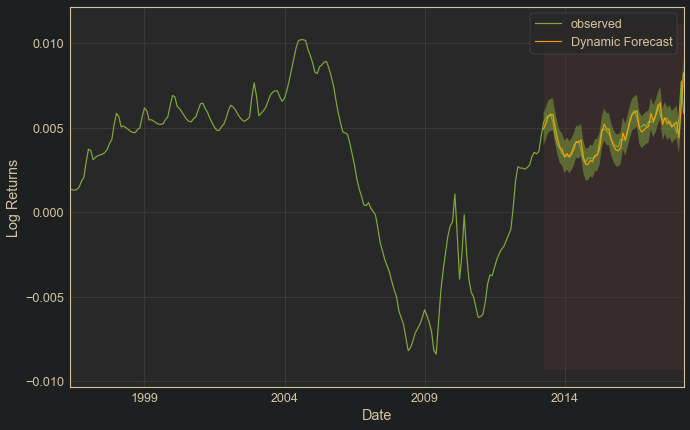

In [1459]:
# Get one step ahead predictions with confidence intervals
pred = model.get_prediction()
pred_conf = pred.conf_int().loc['2013-04-01':]

# Plot observed values
ax = log_returns.plot(label='observed')
# Plot predicted values
pred.predicted_mean.loc['2013-04-01':].plot(ax=ax, label='Step Ahead Forecast', color='orange', alpha=0.9)
# Plot the range for confidence intervals
ax.fill_between(pred_conf.index, 
                pred_conf.iloc[:, 0], 
                pred_conf.iloc[:, 1],
                alpha=0.5
               )
ax.fill_betweenx(ax.get_ylim(), 
                 pd.to_datetime('2013-04'), 
                pred.predicted_mean.index[-1],
                alpha=0.1,
                zorder=-1
               )
# Set axes labels
ax.set_xlabel('Date')
ax.set_ylabel('Log Returns')
plt.legend()
plt.show()

In [1460]:
print('MSE for step ahead forecasts:')
((pred.predicted_mean - log_returns)**2).mean()

MSE for step ahead forecasts:


2.44696264292393e-07

In [1461]:
# We can see that the MSE for the new model has improved slightly

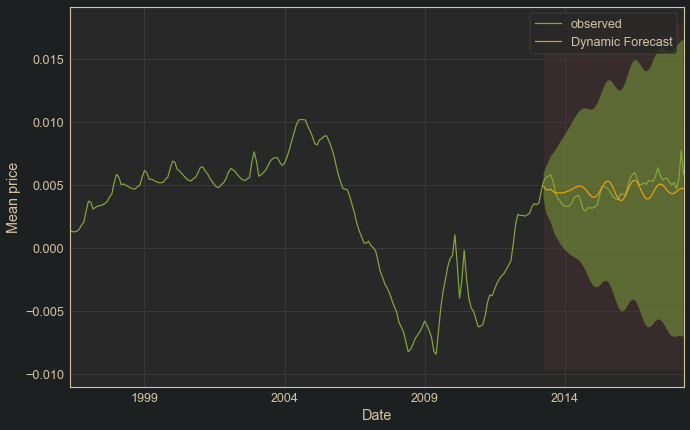

In [1462]:
# We can see that the one step ahead forecasts were fairly accurate on the training data,
# let's look now at the dynamic forecast from the same date

# Get dynamic predictions with confidence intervals
pred_dynamic = model.get_prediction(start='2013-04', end='2018-04', dynamic=True, full_results=True)
pred_dynamic_conf = pred_dynamic.conf_int()

# Plot observed values
ax = log_returns.plot(label='observed')
# Plot predicted values
pred_dynamic.predicted_mean.plot(ax=ax, label='Dynamic Forecast', color='orange', alpha=0.9)
# Plot the range for confidence intervals
ax.fill_between(pred_dynamic_conf.index, 
                pred_dynamic_conf.iloc[:, 0], 
                pred_dynamic_conf.iloc[:, 1],
                alpha=0.5
               )
ax.fill_betweenx(ax.get_ylim(), 
                 pd.to_datetime('2013-04'), 
                pred_dynamic.predicted_mean.index[-1],
                alpha=0.1,
                zorder=-1
               )
# Set axes labels
ax.set_xlabel('Date')
ax.set_ylabel('Mean price')
plt.legend()
plt.show()

In [1463]:
fs_fore = fourier_series(diff_returns, freqs=pgram.Period[:3], K=1, h=60)
fs_fore = pd.concat([fs, fs_fore], axis=0)

In [1464]:
# Let's look at a 5 year forecast with this model
prediction = model.get_forecast(60, exog=fs_fore.iloc[-60:, fs_cols])

# Get confidence intervals of forecasts
pred_conf = prediction.conf_int()

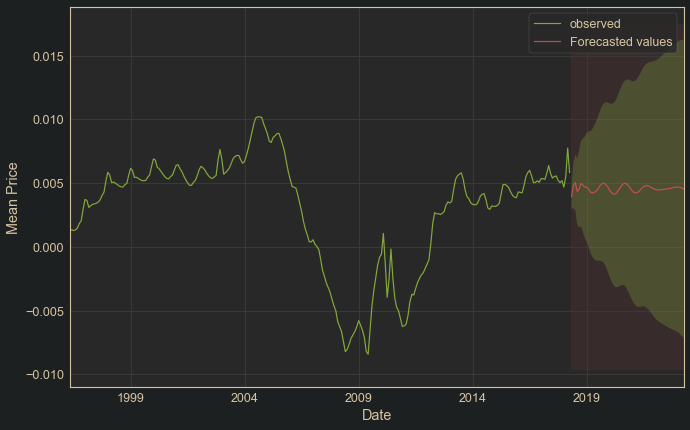

In [1465]:
# Plot future predictions with confidence intervals
ax = log_returns.plot(label='observed')
prediction.predicted_mean.plot(label='Forecasted values', ax=ax)

ax.fill_between(pred_conf.index,
                pred_conf.iloc[:, 0],
                pred_conf.iloc[:, 1],
                alpha=0.3
               )

ax.fill_betweenx(ax.get_ylim(), pred_conf.index[0], pred_conf.index[-1],
                 alpha=0.1,
                 zorder=-1
                )

ax.set_xlabel('Date')
ax.set_ylabel('Mean Price')
plt.legend()
plt.show()

In [1466]:
# We can see that the model has a conservative outlook on out of sample forecasts, indicating
# that the returns stream is expected to have a reduction in mean

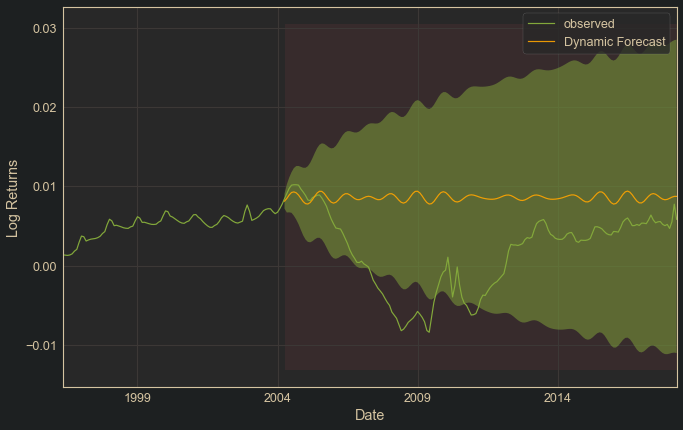

In [1467]:
# Get dynamic predictions with confidence intervals
pred_dynamic = model.get_prediction(dynamic='2004-04-01')
pred_dynamic_conf = pred_dynamic.conf_int().loc['2004-04-01':]

# Plot observed values
ax = log_returns.plot(label='observed')
# Plot predicted values
pred_dynamic.predicted_mean.loc['2004-04-01':].plot(ax=ax, label='Dynamic Forecast', color='orange', alpha=0.9)
# Plot the range for confidence intervals
ax.fill_between(pred_dynamic_conf.index, 
                pred_dynamic_conf.iloc[:, 0], 
                pred_dynamic_conf.iloc[:, 1],
                alpha=0.5
               )
ax.fill_betweenx(ax.get_ylim(), 
                 pd.to_datetime('2004-04'), 
                pred_dynamic.predicted_mean.index[-1],
                alpha=0.1,
                zorder=-1
               )
# Set axes labels
ax.set_xlabel('Date')
ax.set_ylabel('Log Returns')
plt.legend()
plt.show()

,Period,Spec
0,10.150000,0.000005
1,203.000000,0.000005
2,10.684211,0.000005
3,101.500000,0.000004
4,13.533333,0.000003


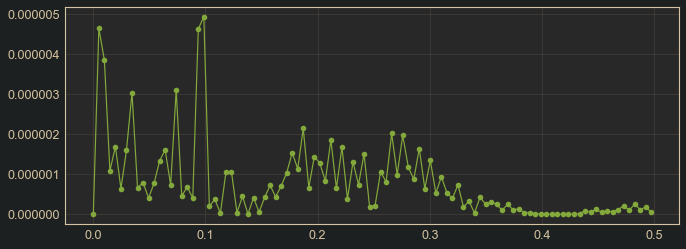

In [1471]:
pgm = check_pgram(diff_returns.loc[:'2013-04-01'])
pgm.head()

In [1313]:
# Since the assumptions of the model are violated, our parameter estimates may biased and
# not efficient. In order to get parameter estimates which are BLUE, we will need to perform
# heteroscedasticity filtering

In [1474]:
((log_returns - log_returns.shift(1))**2).mean()

3.726542334908291e-07

### Filtering Heteroscedasticity:
When it comes to filtering heteroscedasticity, Stockhammar & Oller (2007) discuss some effective options in their paper. As the authors state, "the most straightforward way to remove heteroscedasticity in [a time series] is to divide the heteroscedastic series by the conditional volatility estimated from ARCH/GARCH models or from any of their many generalizations." They go on to compare this to their own suggested method of filtering using rolling window estimates of standard deviation over the series.<br>
<br>
The objective is to apply mean and heteroscedasticity filtering to get an appropriately stationary series, fit an ARIMA/SARIMA/ARFIMA model to the resulting filtered series, then apply the parameter estimates to the unfiltered data and make predictions.<br>
<br>
Below, I have constructed a function which can perform heteroscedasticity filtering by the methods they use in their study. For more detailed analysis of these methods, see the other notebook where I reconstructed the workflow from the paper.

In [175]:
# First I would like to generate conditional volatility using a GARCH model on the residuals
# from our last model, then filter the data using this, before moving on to the methods used
# by Stockhammar & Oller

In [176]:
from arch import arch_model

In [178]:
# define model
arch = arch_model(model.resid, 
                  mean='Zero', 
                  vol='GARCH', 
                  #dist='t'
                  rescale=True
                 ).fit()

Iteration:      1,   Func. Count:      5,   Neg. LLF: 146.49290278009585
Iteration:      2,   Func. Count:     12,   Neg. LLF: 145.99044090066124
Iteration:      3,   Func. Count:     18,   Neg. LLF: 145.3870284268093
Iteration:      4,   Func. Count:     24,   Neg. LLF: 145.02176895934454
Iteration:      5,   Func. Count:     30,   Neg. LLF: 144.90614189731912
Iteration:      6,   Func. Count:     35,   Neg. LLF: 144.87369106703093
Iteration:      7,   Func. Count:     40,   Neg. LLF: 144.86298972624698
Iteration:      8,   Func. Count:     45,   Neg. LLF: 144.8618168027637
Iteration:      9,   Func. Count:     50,   Neg. LLF: 144.86169326009764
Iteration:     10,   Func. Count:     55,   Neg. LLF: 144.86167114389957
Optimization terminated successfully.    (Exit mode 0)
            Current function value: 144.8616711438996
            Iterations: 10
            Function evaluations: 55
            Gradient evaluations: 10


In [179]:
print(arch.summary())

                       Zero Mean - GARCH Model Results                        
Dep. Variable:                   None   R-squared:                       0.000
Mean Model:                 Zero Mean   Adj. R-squared:                  0.004
Vol Model:                      GARCH   Log-Likelihood:               -144.862
Distribution:                  Normal   AIC:                           295.723
Method:            Maximum Likelihood   BIC:                           306.451
                                        No. Observations:                  264
Date:                Fri, Sep 04 2020   Df Residuals:                      261
Time:                        19:13:40   Df Model:                            3
                              Volatility Model                             
                 coef    std err          t      P>|t|     95.0% Conf. Int.
---------------------------------------------------------------------------
omega          0.0403  3.382e-02      1.192      0.233 [-2.59

In [180]:
arch.scale

1000.0

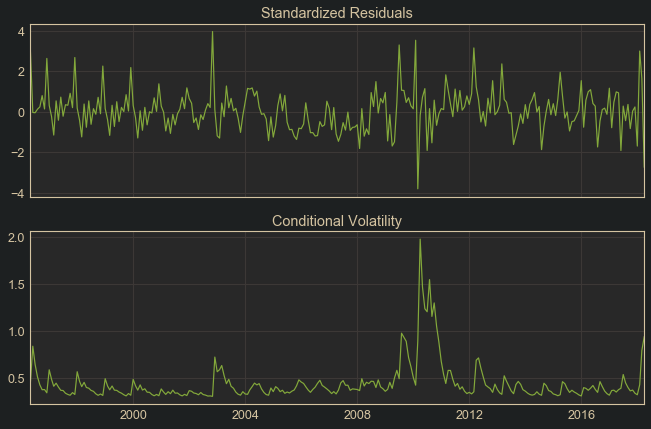

In [181]:
arch.plot();

In [182]:
len(arch.conditional_volatility)

264

In [183]:
log_returns.std()

0.0044080356084499695

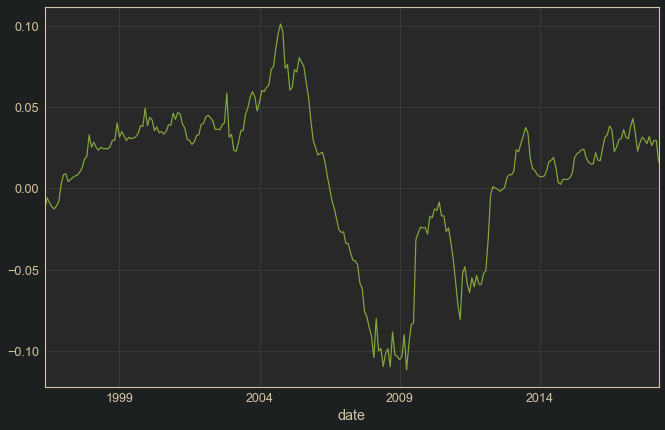

In [208]:
# Now let's take the advice of Stockhammar & Oller's advice and divide the serie by the cond.
# volatility generated by this model
series_mean = log_returns.mean()
series_std = log_returns.std()
test = series_std * (log_returns-series_mean) / (arch.conditional_volatility / arch.scale) + series_mean
test.plot()

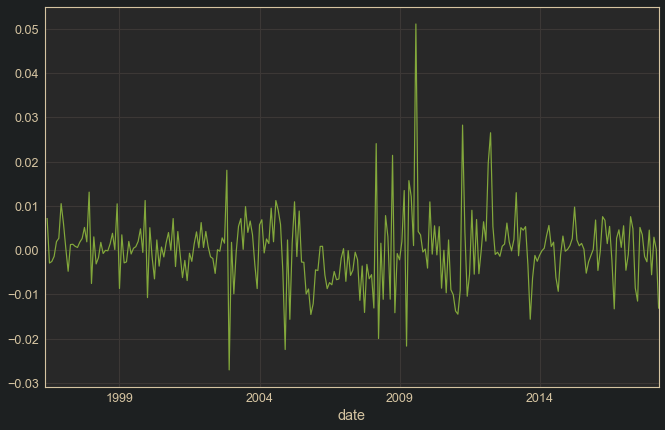

In [209]:
test.diff().plot()

In [210]:
rlist = FloatVector(test)

In [211]:
rmod = r['auto.arima'](r['ts'](rlist, 
                               freq=12
                              ))
print(rmod)

Series: structure(c(-0.0128801697016313, -0.00574796042652528, -0.00865864613501738,  -0.0112171076588548, -0.0126183592866251, -0.0106970484718165,  -0.00801349195519285, 0.00249590070333537, 0.00853945649715323,  0.00897168501851719, 0.00420465032914321, 0.0054636568488473,  0.00679845907753925, 0.00766898024710419, 0.00827531490903522,  0.0100812018441972, 0.0127113090171106, 0.0178480479793324, 0.0197286182248615,  0.032834846043337, 0.0253049034268578, 0.0283092425309826, 0.0251983071299633,  0.0235035617671402, 0.0252667045553308, 0.0245105118537181, 0.0244716136562502,  0.0243278564685483, 0.0257660555575289, 0.029577094350088, 0.0297079027142919,  0.0401759849638137, 0.0315073372605191, 0.0349673796187515, 0.0320936868171904,  0.029447814105691, 0.0314178089161081, 0.0305524919583359, 0.0309728148142097,  0.0317624053455349, 0.0337473658964334, 0.0385692440728163, 0.0380571633087966,  0.0492769091993323, 0.0385571674354373, 0.0436298190246622, 0.0419862011073272,  0.03549699995

In [212]:
model = SARIMAX(test,
                order=(0,1,0),
                seasonal_order=(0,0,1,12),
                enforce_stationary=False,
                enforce_invertibility=False
               ).fit()
print(model.summary())

                                      SARIMAX Results                                       
Dep. Variable:                                    y   No. Observations:                  264
Model:             SARIMAX(0, 1, 0)x(0, 0, [1], 12)   Log Likelihood                 902.988
Date:                              Fri, 04 Sep 2020   AIC                          -1801.976
Time:                                      19:20:45   BIC                          -1794.832
Sample:                                  05-01-1996   HQIC                         -1799.105
                                       - 04-01-2018                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.S.L12       0.2253      0.050      4.473      0.000       0.127       0.324
sigma2      6.077e-

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\mlemodel.py:3225: FutureWarning: The default value of lags is changing.  After 0.12, this value will become min(10, nobs//5) for non-seasonal time series and min (2*m, nobs//5) for seasonal time series. Directly set lags to silence this warning.
  FutureWarning


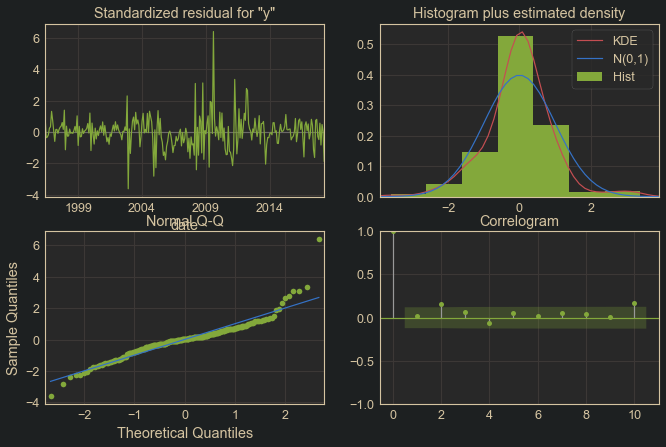

In [213]:
# all of our coefficients are significant with alpha = 0.05
# The null hypothesis of non-autocorrelated residuals is not rejected by Ljung-Box
# The null hypothesis of non-heteroscedastic residuals is not rejected
# The null hypothesis of normal skew & kurtosis is rejected by JB, the problem being thin tails
# caused by outliers in the errors
model.plot_diagnostics();

In [214]:
# We can see that the log likelihood and AIC values have improved, but now the Ljung-Box test
# is rejecting the null hypothesis of non-autocorrelated residuals. The residuals are heavily
# heteroscedastic as well, with a very noticeable change over time. Let's look at the predictive
# accuracy of this model

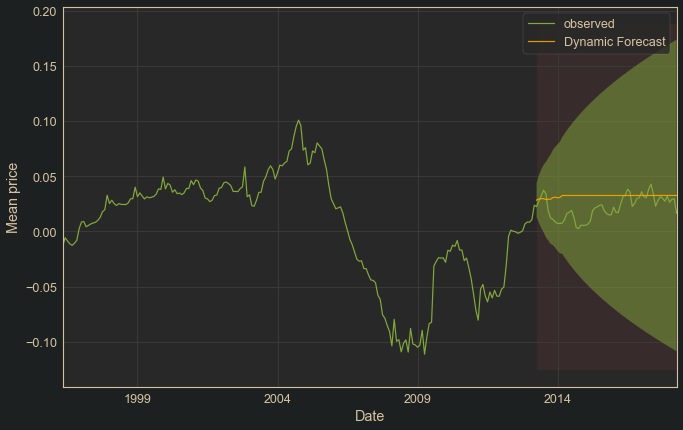

In [215]:
# Get dynamic predictions with confidence intervals
pred_dynamic = model.get_prediction(start='2013-04', end='2018-04', dynamic=True, full_results=True)
pred_dynamic_conf = pred_dynamic.conf_int()

# Plot observed values
ax = test.plot(label='observed')
# Plot predicted values
pred_dynamic.predicted_mean.plot(ax=ax, label='Dynamic Forecast', color='orange', alpha=0.9)
# Plot the range for confidence intervals
ax.fill_between(pred_dynamic_conf.index, 
                pred_dynamic_conf.iloc[:, 0], 
                pred_dynamic_conf.iloc[:, 1],
                alpha=0.5
               )
ax.fill_betweenx(ax.get_ylim(), 
                 pd.to_datetime('2013-04'), 
                pred_dynamic.predicted_mean.index[-1],
                alpha=0.1,
                zorder=-1
               )
# Set axes labels
ax.set_xlabel('Date')
ax.set_ylabel('Mean price')
plt.legend()
plt.show()

In [216]:
# We can see this model has performed well, managing to catch the long-term curve that follows
# the observed values

In [217]:
# Let's look at a 5 year forecast with this model
prediction = model.get_forecast(60)

# Get confidence intervals of forecasts
pred_conf = prediction.conf_int()

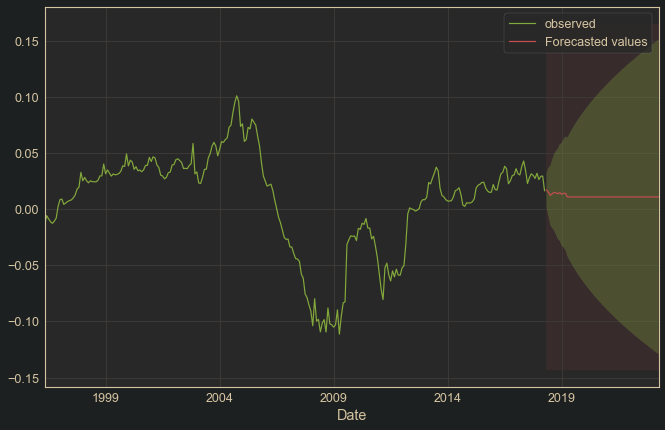

In [218]:
# Plot future predictions with confidence intervals
ax = test.plot(label='observed')
prediction.predicted_mean.plot(label='Forecasted values', ax=ax)

ax.fill_between(pred_conf.index,
                pred_conf.iloc[:, 0],
                pred_conf.iloc[:, 1],
                alpha=0.3
               )

ax.fill_betweenx(ax.get_ylim(), pred_conf.index[0], pred_conf.index[-1],
                 alpha=0.1,
                 zorder=-1
                )

ax.set_xlabel('Date')
#ax.set_ylabel('')
plt.legend()
plt.show()

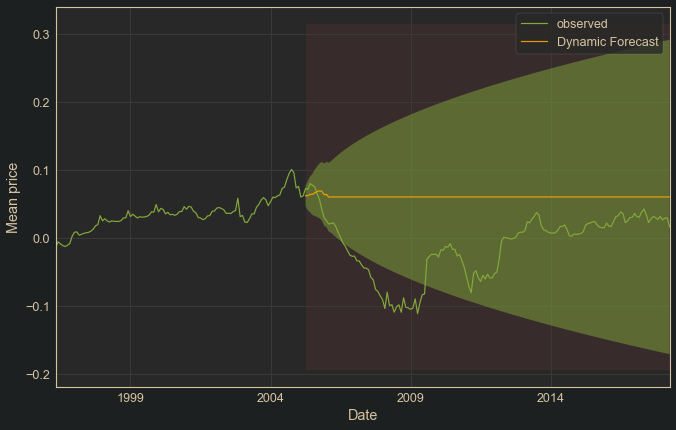

In [219]:
# Get dynamic predictions with confidence intervals
pred_dynamic = model.get_prediction(start='2005-04', end='2018-04', dynamic=True, full_results=True)
pred_dynamic_conf = pred_dynamic.conf_int()

# Plot observed values
ax = test.plot(label='observed')
# Plot predicted values
pred_dynamic.predicted_mean.plot(ax=ax, label='Dynamic Forecast', color='orange', alpha=0.9)
# Plot the range for confidence intervals
ax.fill_between(pred_dynamic_conf.index, 
                pred_dynamic_conf.iloc[:, 0], 
                pred_dynamic_conf.iloc[:, 1],
                alpha=0.5
               )
ax.fill_betweenx(ax.get_ylim(), 
                 pd.to_datetime('2005-04'), 
                pred_dynamic.predicted_mean.index[-1],
                alpha=0.1,
                zorder=-1
               )
# Set axes labels
ax.set_xlabel('Date')
ax.set_ylabel('Mean price')
plt.legend()
plt.show()

Using the filtering method of dividing a series by the conditional volatility estimate from a GARCH model on the residuals of our initial model on the series has given us a better looking model. In Stockhammar & Oller's study, they were actually fitting the GARCH model to the differenced series, let's try that now.

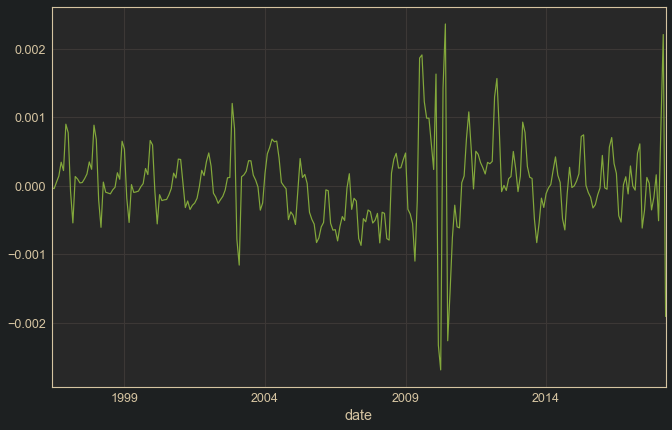

In [257]:
# First assign the differenced log returns to a variable for convenience
diff_returns = log_returns.diff().dropna()
diff_returns.plot();

In [258]:
# We can see that the differenced return series is mostly stationary, with some local trends 
# and heteroscedasticity visible

In [250]:
# define model
arch = arch_model(diff_returns, 
                  mean='Zero', 
                  vol='GARCH', 
                  #dist='t'
                  rescale=True
                 ).fit()

Iteration:      1,   Func. Count:      5,   Neg. LLF: 190.39784874368902
Iteration:      2,   Func. Count:     12,   Neg. LLF: 188.86369115690553
Iteration:      3,   Func. Count:     18,   Neg. LLF: 181.8130054411506
Iteration:      4,   Func. Count:     24,   Neg. LLF: 177.24319745021475
Iteration:      5,   Func. Count:     31,   Neg. LLF: 177.219658802067
Iteration:      6,   Func. Count:     36,   Neg. LLF: 177.17709360232857
Iteration:      7,   Func. Count:     41,   Neg. LLF: 177.103215989903
Iteration:      8,   Func. Count:     46,   Neg. LLF: 177.07326833841068
Iteration:      9,   Func. Count:     51,   Neg. LLF: 177.04398493940164
Iteration:     10,   Func. Count:     56,   Neg. LLF: 177.0420255804043
Iteration:     11,   Func. Count:     61,   Neg. LLF: 177.0419027400082
Iteration:     12,   Func. Count:     66,   Neg. LLF: 177.04190065460023
Optimization terminated successfully.    (Exit mode 0)
            Current function value: 177.04190065456567
            Iteration

In [251]:
print(arch.summary())

                       Zero Mean - GARCH Model Results                        
Dep. Variable:            log returns   R-squared:                       0.000
Mean Model:                 Zero Mean   Adj. R-squared:                  0.004
Vol Model:                      GARCH   Log-Likelihood:               -177.042
Distribution:                  Normal   AIC:                           360.084
Method:            Maximum Likelihood   BIC:                           370.800
                                        No. Observations:                  263
Date:                Fri, Sep 04 2020   Df Residuals:                      260
Time:                        19:31:33   Df Model:                            3
                              Volatility Model                             
                 coef    std err          t      P>|t|     95.0% Conf. Int.
---------------------------------------------------------------------------
omega          0.0727  2.224e-02      3.268  1.084e-03  [2.90

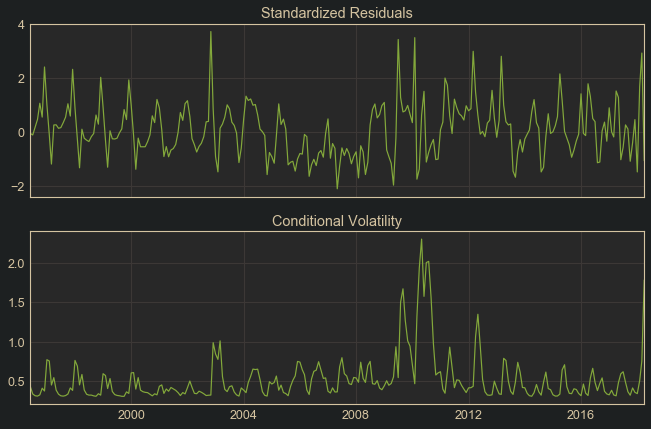

In [252]:
arch.plot();

In [253]:
arch.scale

1000.0

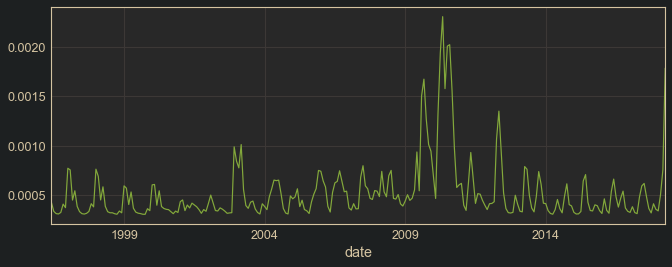

In [254]:
(arch.conditional_volatility / arch.scale).plot(figsize=(11,4))

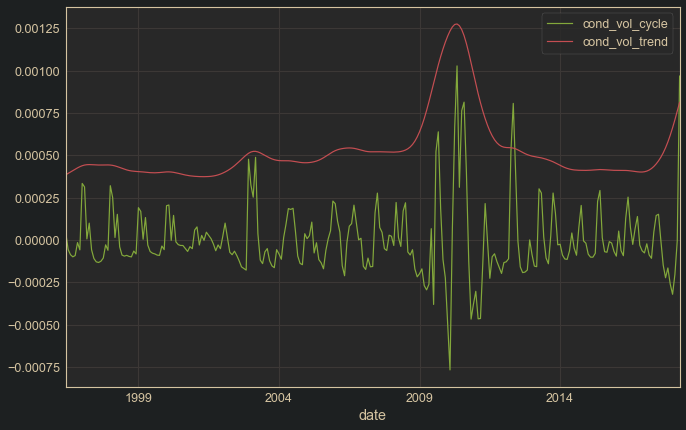

In [255]:
filter_test = pd.DataFrame(hpfilter(arch.conditional_volatility/arch.scale, lamb=700)).T
filter_test.plot()

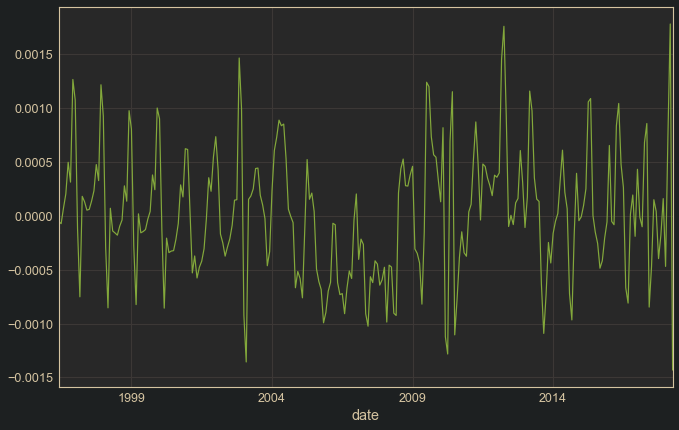

In [259]:
# Now to filter the series using the trend component of the conditional volatility
stdev = diff_returns.std()
mean = diff_returns.mean()
zt = diff_returns - mean
filtered = stdev * (zt / (filter_test.cond_vol_trend)) + mean
filtered.plot()

In [260]:
# We can see that filtering the data using the conditional volatility from the GARCH model
# has mostly removed the visible heteroscedasticity, but has left the local trends in tact

In [261]:
# Now to fit a model to this filtered series
rlist = FloatVector(filtered)
autoarima = r['auto.arima'](r['ts'](rlist, freq=12))
param, sparam = get_params(autoarima)
print(param, sparam)

(4, 0, 2) (1, 0, 2, 12)


In [262]:
# Using the recommended parameters
model = SARIMAX(filtered,
                order=param,
                seasonal_order=sparam,
                enforce_stationary=False,
                enforce_invertibility=False
               ).fit()
print(model.summary())

                                     SARIMAX Results                                      
Dep. Variable:                                  y   No. Observations:                  263
Model:             SARIMAX(4, 0, 2)x(1, 0, 2, 12)   Log Likelihood                1665.689
Date:                            Fri, 04 Sep 2020   AIC                          -3311.378
Time:                                    19:34:10   BIC                          -3275.656
Sample:                                06-01-1996   HQIC                         -3297.022
                                     - 04-01-2018                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1747      0.041      4.282      0.000       0.095       0.255
ar.L2         -0.6166      0.078   

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\mlemodel.py:3225: FutureWarning: The default value of lags is changing.  After 0.12, this value will become min(10, nobs//5) for non-seasonal time series and min (2*m, nobs//5) for seasonal time series. Directly set lags to silence this warning.
  FutureWarning


In [263]:
# The metrics have improved, although the null hypothesis of homoscedastic residuals is
# still being rejected. The Ljung-Box null hypothesis of non-autocorrelated residuals is not
# rejected, which is an improvement

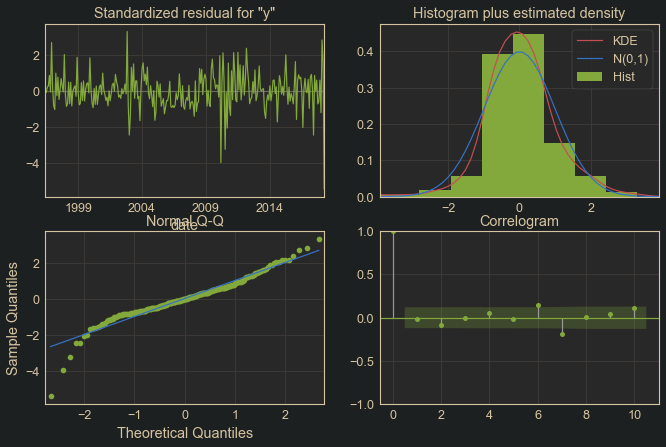

In [264]:
model.plot_diagnostics();

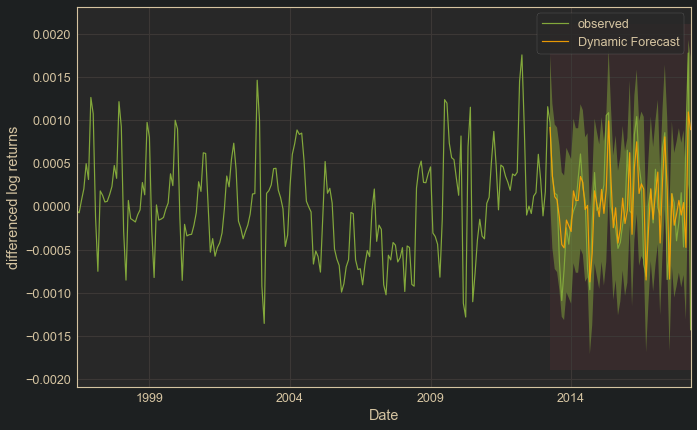

In [266]:
# Get dynamic predictions with confidence intervals
pred_dynamic = model.get_prediction(start='2013-04', end='2018-04', dynamic=False, full_results=True)
pred_dynamic_conf = pred_dynamic.conf_int()

# Plot observed values
ax = filtered.plot(label='observed')
# Plot predicted values
pred_dynamic.predicted_mean.plot(ax=ax, label='Dynamic Forecast', color='orange', alpha=0.9)
# Plot the range for confidence intervals
ax.fill_between(pred_dynamic_conf.index, 
                pred_dynamic_conf.iloc[:, 0], 
                pred_dynamic_conf.iloc[:, 1],
                alpha=0.5
               )
ax.fill_betweenx(ax.get_ylim(), 
                 pd.to_datetime('2013-04'), 
                pred_dynamic.predicted_mean.index[-1],
                alpha=0.1,
                zorder=-1
               )
# Set axes labels
ax.set_xlabel('Date')
ax.set_ylabel('differenced log returns')
plt.legend()
plt.show()

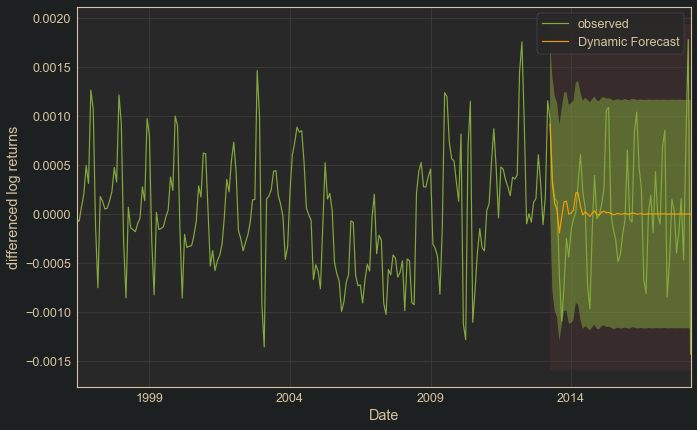

In [267]:
# Get dynamic predictions with confidence intervals
pred_dynamic = model.get_prediction(start='2013-04', end='2018-04', dynamic=True, full_results=True)
pred_dynamic_conf = pred_dynamic.conf_int()

# Plot observed values
ax = filtered.plot(label='observed')
# Plot predicted values
pred_dynamic.predicted_mean.plot(ax=ax, label='Dynamic Forecast', color='orange', alpha=0.9)
# Plot the range for confidence intervals
ax.fill_between(pred_dynamic_conf.index, 
                pred_dynamic_conf.iloc[:, 0], 
                pred_dynamic_conf.iloc[:, 1],
                alpha=0.5
               )
ax.fill_betweenx(ax.get_ylim(), 
                 pd.to_datetime('2013-04'), 
                pred_dynamic.predicted_mean.index[-1],
                alpha=0.1,
                zorder=-1
               )
# Set axes labels
ax.set_xlabel('Date')
ax.set_ylabel('differenced log returns')
plt.legend()
plt.show()

In [268]:
# Let's look at a 5 year forecast with this model
prediction = model.get_forecast(60)

# Get confidence intervals of forecasts
pred_conf = prediction.conf_int()

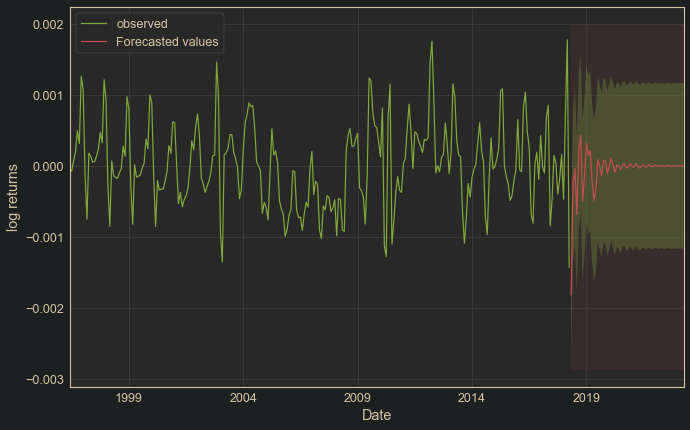

In [269]:
# Plot future predictions with confidence intervals
ax = filtered.plot(label='observed')
prediction.predicted_mean.plot(label='Forecasted values', ax=ax)

ax.fill_between(pred_conf.index,
                pred_conf.iloc[:, 0],
                pred_conf.iloc[:, 1],
                alpha=0.3
               )

ax.fill_betweenx(ax.get_ylim(), pred_conf.index[0], pred_conf.index[-1],
                 alpha=0.1,
                 zorder=-1
                )

ax.set_xlabel('Date')
ax.set_ylabel('log returns')
plt.legend()
plt.show()

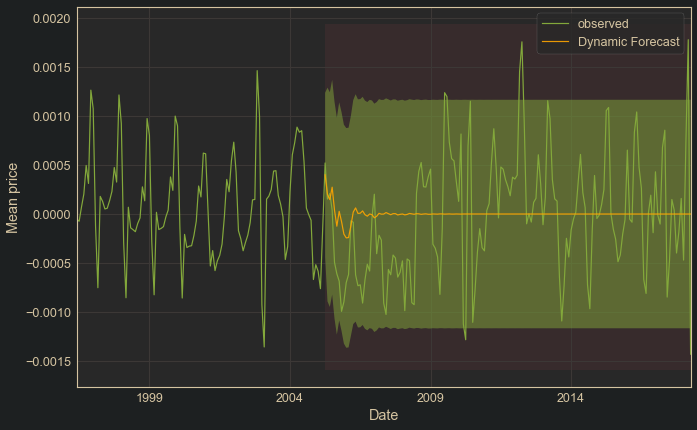

In [270]:
# Get dynamic predictions with confidence intervals
pred_dynamic = model.get_prediction(start='2005-04', end='2018-04', dynamic=True, full_results=True)
pred_dynamic_conf = pred_dynamic.conf_int()

# Plot observed values
ax = filtered.plot(label='observed')
# Plot predicted values
pred_dynamic.predicted_mean.plot(ax=ax, label='Dynamic Forecast', color='orange', alpha=0.9)
# Plot the range for confidence intervals
ax.fill_between(pred_dynamic_conf.index, 
                pred_dynamic_conf.iloc[:, 0], 
                pred_dynamic_conf.iloc[:, 1],
                alpha=0.5
               )
ax.fill_betweenx(ax.get_ylim(), 
                 pd.to_datetime('2005-04'), 
                pred_dynamic.predicted_mean.index[-1],
                alpha=0.1,
                zorder=-1
               )
# Set axes labels
ax.set_xlabel('Date')
ax.set_ylabel('Mean price')
plt.legend()
plt.show()

Now that we have generated coefficients on the filtered data, we will smooth another model with these coefficients, then see how good the predictive power of the coefficients are.

In [272]:
mod = SARIMAX(log_returns,
                order=(4,1,2),
                seasonal_order=(1,0,2,12),
                enforce_stationary=False,
                enforce_invertibility=False
               )
coefs = model.params
res = mod.smooth(coefs)
print(res.summary())

                                     SARIMAX Results                                      
Dep. Variable:                        log returns   No. Observations:                  264
Model:             SARIMAX(4, 1, 2)x(1, 0, 2, 12)   Log Likelihood                1597.530
Date:                            Fri, 04 Sep 2020   AIC                          -3175.060
Time:                                    19:37:10   BIC                          -3139.339
Sample:                                05-01-1996   HQIC                         -3160.705
                                     - 04-01-2018                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1747      0.024      7.139      0.000       0.127       0.223
ar.L2         -0.6166      0.038   

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\mlemodel.py:3225: FutureWarning: The default value of lags is changing.  After 0.12, this value will become min(10, nobs//5) for non-seasonal time series and min (2*m, nobs//5) for seasonal time series. Directly set lags to silence this warning.
  FutureWarning


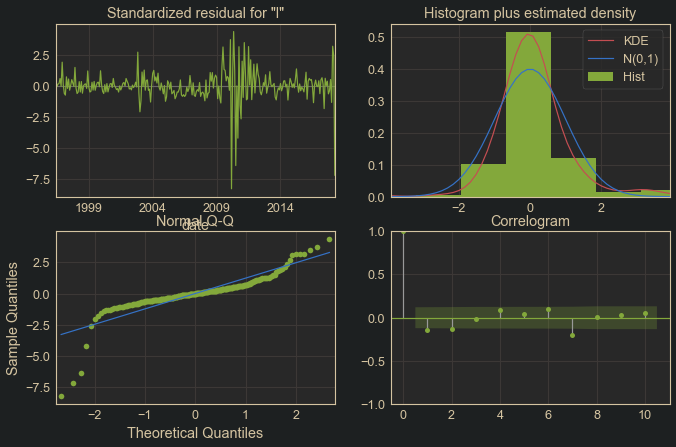

In [273]:
res.plot_diagnostics();

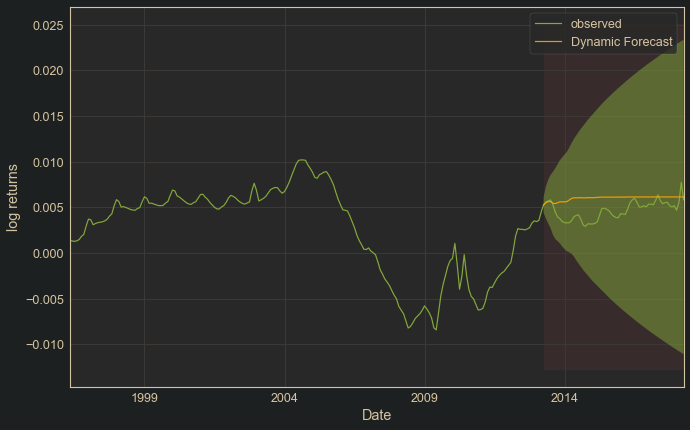

In [274]:
# Get dynamic predictions with confidence intervals
pred_dynamic = res.get_prediction(start='2013-04', end='2018-04', dynamic=True, full_results=True)
pred_dynamic_conf = pred_dynamic.conf_int()

# Plot observed values
ax = log_returns.plot(label='observed')
# Plot predicted values
pred_dynamic.predicted_mean.plot(ax=ax, label='Dynamic Forecast', color='orange', alpha=0.9)
# Plot the range for confidence intervals
ax.fill_between(pred_dynamic_conf.index, 
                pred_dynamic_conf.iloc[:, 0], 
                pred_dynamic_conf.iloc[:, 1],
                alpha=0.5
               )
ax.fill_betweenx(ax.get_ylim(), 
                 pd.to_datetime('2013-04'), 
                pred_dynamic.predicted_mean.index[-1],
                alpha=0.1,
                zorder=-1
               )
# Set axes labels
ax.set_xlabel('Date')
ax.set_ylabel('log returns')
plt.legend()
plt.show()

In [275]:
# Let's look at a 5 year forecast with this model
prediction = res.get_forecast(60)

# Get confidence intervals of forecasts
pred_conf = prediction.conf_int()

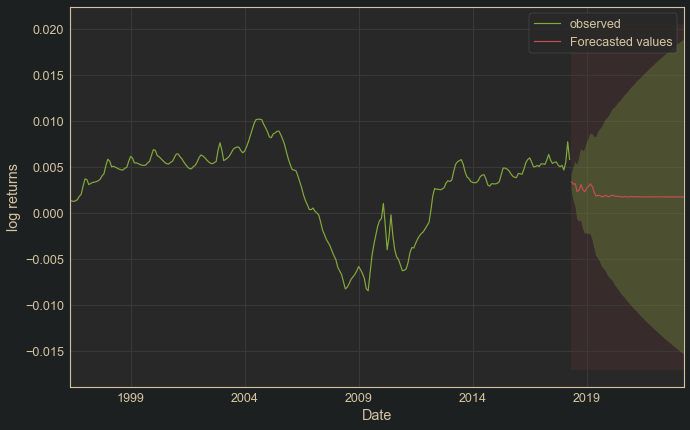

In [276]:
# Plot future predictions with confidence intervals
ax = log_returns.plot(label='observed')
prediction.predicted_mean.plot(label='Forecasted values', ax=ax)

ax.fill_between(pred_conf.index,
                pred_conf.iloc[:, 0],
                pred_conf.iloc[:, 1],
                alpha=0.3
               )

ax.fill_betweenx(ax.get_ylim(), pred_conf.index[0], pred_conf.index[-1],
                 alpha=0.1,
                 zorder=-1
                )

ax.set_xlabel('Date')
ax.set_ylabel('log returns')
plt.legend()
plt.show()

In [277]:
# This model is anticipating an upcoming reduction in the mean of log returns

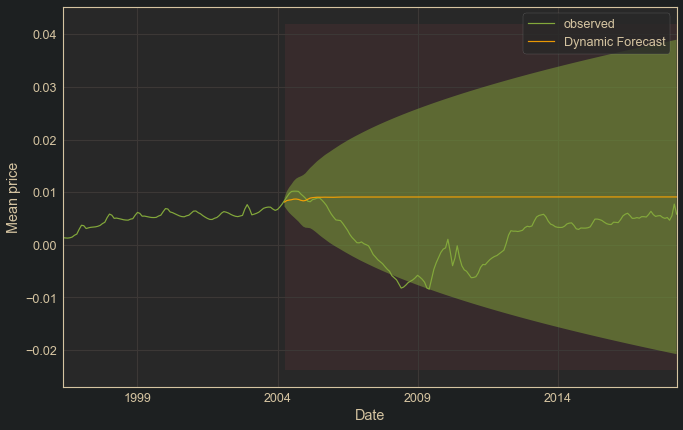

In [278]:
# Get dynamic predictions with confidence intervals
pred_dynamic = res.get_prediction(start='2004-04', end='2018-04', dynamic=True, full_results=True)
pred_dynamic_conf = pred_dynamic.conf_int()

# Plot observed values
ax = log_returns.plot(label='observed')
# Plot predicted values
pred_dynamic.predicted_mean.plot(ax=ax, label='Dynamic Forecast', color='orange', alpha=0.9)
# Plot the range for confidence intervals
ax.fill_between(pred_dynamic_conf.index, 
                pred_dynamic_conf.iloc[:, 0], 
                pred_dynamic_conf.iloc[:, 1],
                alpha=0.5
               )
ax.fill_betweenx(ax.get_ylim(), 
                 pd.to_datetime('2004-04'), 
                pred_dynamic.predicted_mean.index[-1],
                alpha=0.1,
                zorder=-1
               )
# Set axes labels
ax.set_xlabel('Date')
ax.set_ylabel('Mean price')
plt.legend()
plt.show()

In [279]:
# This model managed to capture most of the upcoming crash in its confidence bands

Since before we filtered the differenced series using the trend component of an HP filter of the GARCH model conditional volatility, let's see what happens if we do not use the HP filter.

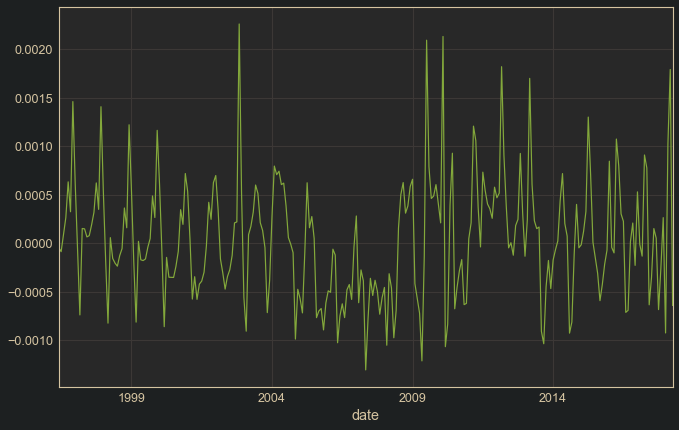

In [280]:
stdev = diff_returns.std()
mean = diff_returns.mean()
zt2 = diff_returns - mean
filtered2 = stdev * (zt2 / (arch.conditional_volatility/arch.scale)) + mean
filtered2.plot()

In [282]:
# Now to fit a model, then to get the conditional volatility in this unit
rlist = FloatVector(filtered2)
autoarima = r['auto.arima'](r['ts'](rlist, freq=12))
param, sparam = get_params(autoarima)
print(param, sparam)

(0, 0, 1) (1, 0, 2, 12)


In [283]:
model = SARIMAX(filtered2,
                order=param,
                seasonal_order=sparam,
                enforce_stationary=False,
                enforce_invertibility=False
               ).fit()
print(model.summary())

                                        SARIMAX Results                                        
Dep. Variable:                                       y   No. Observations:                  263
Model:             SARIMAX(0, 0, 1)x(1, 0, [1, 2], 12)   Log Likelihood                1612.421
Date:                                 Fri, 04 Sep 2020   AIC                          -3214.843
Time:                                         19:41:31   BIC                          -3196.982
Sample:                                     06-01-1996   HQIC                         -3207.665
                                          - 04-01-2018                                         
Covariance Type:                                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.5379      0.042     12.757      0.000       0.455       0

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\mlemodel.py:3225: FutureWarning: The default value of lags is changing.  After 0.12, this value will become min(10, nobs//5) for non-seasonal time series and min (2*m, nobs//5) for seasonal time series. Directly set lags to silence this warning.
  FutureWarning


In [287]:
# All of the coefficients are significant other than the 2 lag seasonal MA term
# The null hypothesis of homoscedasticity is not rejected, which is good
# The null hypothesis of non autocorrelated residuals is rejected, but the pvalue has increased
# There is still leptokurtocity, due to extreme errors in the volatile periods still present

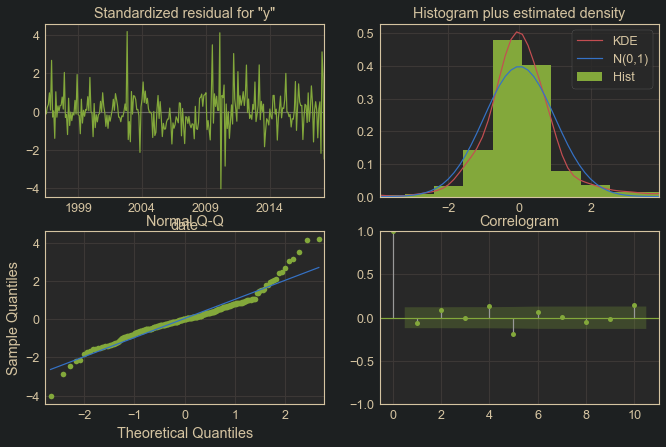

In [288]:
model.plot_diagnostics();

In [289]:
# l will be the length of our window, must be an odd number
l = 3
n = series.index
v = int((l-1)/2)
for t in range(v, len(n)-v):
    if v > 0:
        term = np.sum([series.iloc[i]**2 for i in range(t-v, t+v+1)])
    else:
        term = series.iloc[i] ** 2

    stds.loc[n[t]] = np.sqrt(term / 2*v)

NameError: name 'series' is not defined

Now that we have seen some heteroscedasticity filtering in action, it is time to make a function which can perform the full filtering process outlined in Stockhammar & Oller's study, either using GARCH or the rolling windows that they recommmend.

In [675]:
def so_filter(series, sd_method='rolling', l=None, k=0, lamb=700, center=True, visualize=False,
                hp_filter=True, return_df=False, d=1):
    '''Takes in a pandas series and filters it to become stationary according to the process
    outlined by Stockhammar & Oller (2007). Series passed should be the already differenced
    series (close to stationary but with local trends and heteroscedasticity).
    '''
    
    series_mean = series.mean()
    
    if k > 0:
        rolling_means = series.rolling(window=k, center=center).mean()
        mean_filt = series - rolling_means
        rolling_means.name = 'ma'
    else:
        mean_filt = series - series_mean
    
    # Get local stds using Stockhammer & Oller (2007) method
    if sd_method == 'rolling':
        stds = series.rolling(window=l, center=center).std(ddof=1).dropna()
    
    # Get local stds using GARCH
    if sd_method == 'GARCH':
        arch = arch_model(series, 
                      mean='Zero', 
                      vol='GARCH', 
                      #dist='t'
                      rescale=True
                     ).fit()
        stds = arch.conditional_volatility / arch.scale
        print(arch.summary())
    
    # Perform filtering

    if hp_filter:
        stds = pd.DataFrame(hpfilter(stds, lamb=lamb)).T.iloc[:, 1]
        
    stds.name = 'sd'
    
    filtered = series.std() * ((mean_filt) / stds) + series_mean
    filtered = filtered.dropna()
    filtered.name = 'filtered_series'
    
    if visualize:
        fig, (ax1, ax2) = plt.subplots(2, figsize=(11,10), sharex=True)
        series.plot(label=series.name, ax=ax1)
        stds.plot(label='local SD', ax=ax1)
        ax1.set_title('Series with local SD')
        ax1.legend()
        filtered.plot(label=series.name, ax=ax2)
        ax2.set_title('Filtered Series')
        ax2.legend()
        plt.tight_layout()
        plt.show()
        
    results = pd.merge(filtered, stds, left_index=True, right_index=True)
    if k > 0:
        results = pd.merge(results, rolling_means, left_index=True, right_index=True)
    
    if return_df:
        return results
    else:
        return filtered

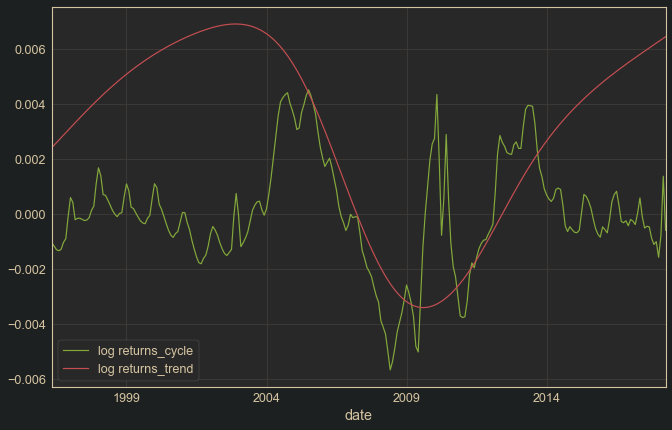

In [300]:
filter_test = pd.DataFrame(hpfilter(log_returns, lamb=129600)).T
filter_test.plot()

Let's experiment using our new function to see if we can get some truly efficient and unbiased estimations of our model coefficients.

In [646]:
diff_returns = log_returns.diff().dropna()

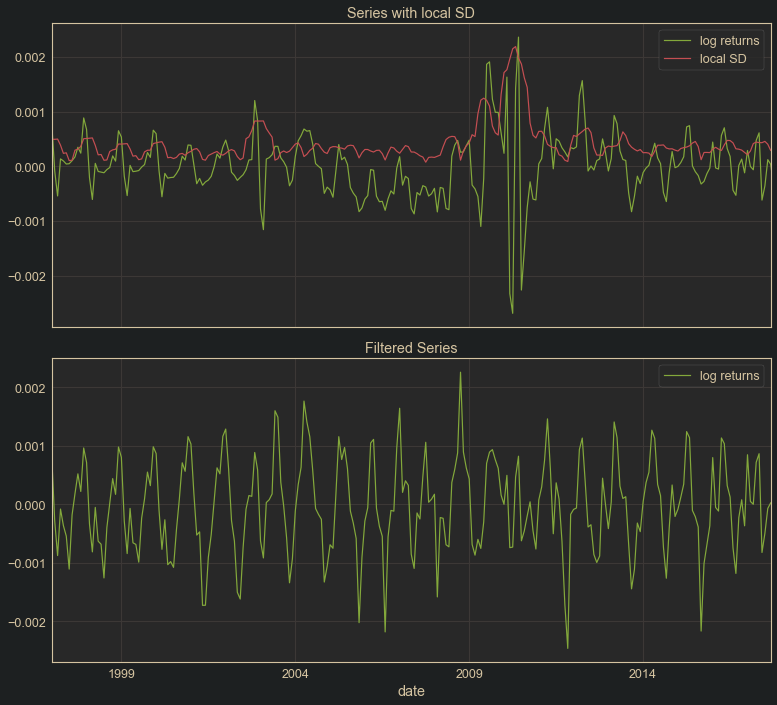

In [1358]:
filtered = so_filter(diff_returns, 
                     #sd_method='GARCH',
                     l=7, 
                     k=15, 
                     visualize=True, 
                     hp_filter=False, 
                     lamb=60000)

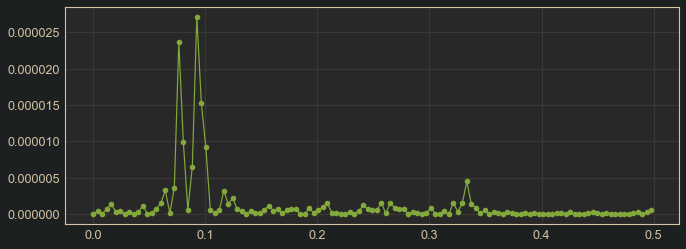

In [1359]:
pgram = check_pgram(filtered)

In [1360]:
pgram.head()

,Period,Spec
0,10.826087,0.000027
1,13.105263,0.000024
2,10.375000,0.000015
3,12.450000,0.000010
4,9.960000,0.000009


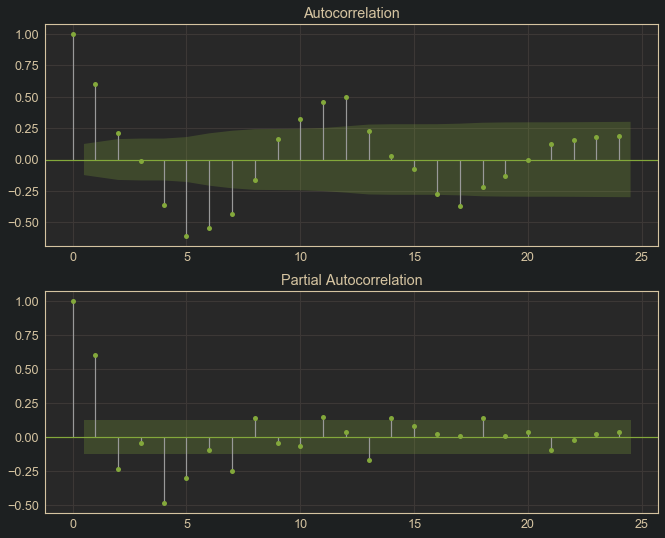

In [1361]:
fig, (ax1, ax2) = plt.subplots(2, figsize=(11,9))
plot_acf(filtered, ax=ax1);
plot_pacf(filtered, ax=ax2);

In [1362]:
num_periods = 2
fs = fourier_series(filtered, freqs=pgram.Period[:num_periods], K=1)

In [1363]:
# Now to fit a model to this filtered series
rlist = FloatVector(filtered)
autoarima = r['auto.arima'](r['ts'](rlist, 
                                    freq=12
                                   ))
param, sparam = get_params(autoarima)
print(param, sparam)

(1, 0, 1) (1, 0, 0, 12)


In [1364]:
#fs_cols = [0,2,4,6]
fs_cols = [0,2]

In [1365]:
# Using the recommended parameters
model = SARIMAX(filtered,
                order=param,
                seasonal_order=sparam,
                enforce_stationary=False,
                enforce_invertibility=False,
                exog=fs.iloc[:, 
                             fs_cols
                            ]
               ).fit()
print(model.summary())

                                      SARIMAX Results                                      
Dep. Variable:                     filtered_series   No. Observations:                  249
Model:             SARIMAX(1, 0, 1)x(1, 0, [], 12)   Log Likelihood                1530.209
Date:                             Sat, 05 Sep 2020   AIC                          -3048.417
Time:                                     22:46:55   BIC                          -3027.312
Sample:                                 01-01-1997   HQIC                         -3039.922
                                      - 09-01-2017                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
S1-10.83       0.0005   9.65e-05      4.791      0.000       0.000       0.001
S1-13.11      -0.0004      

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\mlemodel.py:3225: FutureWarning: The default value of lags is changing.  After 0.12, this value will become min(10, nobs//5) for non-seasonal time series and min (2*m, nobs//5) for seasonal time series. Directly set lags to silence this warning.
  FutureWarning


In [1366]:
# The metrics have improved, although the null hypothesis of homoscedastic residuals is
# still being rejected. The Ljung-Box null hypothesis of non-autocorrelated residuals is not
# rejected, which is an improvement

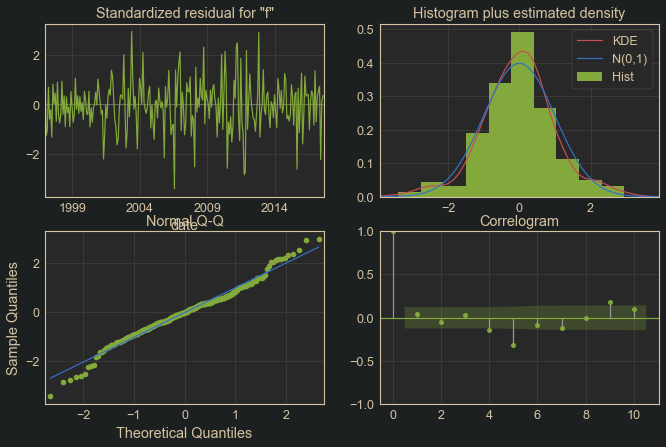

In [1367]:
model.plot_diagnostics();

In [1368]:
mod = SARIMAX(filtered,
                order=param,
                seasonal_order=sparam,
                #enforce_stationary=False,
                #enforce_invertibility=False,
                exog=fs.iloc[:, 
                             fs_cols
                            ]
               )
res = mod.filter(model.params)

In [1369]:
print(res.summary())

                                      SARIMAX Results                                      
Dep. Variable:                     filtered_series   No. Observations:                  249
Model:             SARIMAX(1, 0, 1)x(1, 0, [], 12)   Log Likelihood                1530.209
Date:                             Sat, 05 Sep 2020   AIC                          -3048.417
Time:                                     22:47:03   BIC                          -3027.312
Sample:                                 01-01-1997   HQIC                         -3039.922
                                      - 09-01-2017                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
S1-10.83       0.0005   9.65e-05      4.791      0.000       0.000       0.001
S1-13.11      -0.0004      

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\mlemodel.py:3225: FutureWarning: The default value of lags is changing.  After 0.12, this value will become min(10, nobs//5) for non-seasonal time series and min (2*m, nobs//5) for seasonal time series. Directly set lags to silence this warning.
  FutureWarning


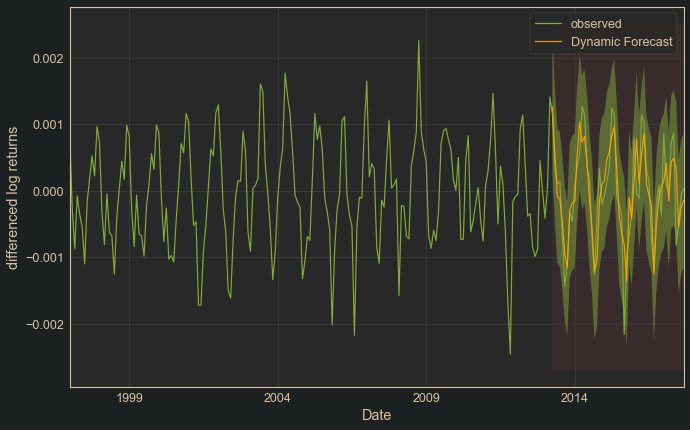

In [1370]:
# Get dynamic predictions with confidence intervals
start='2013-04-01'
end='2018-04-01'
pred_dynamic = model.get_prediction(
                                    #dynamic=start, 
                                    #full_results=True                                                 ]
                                   )
pred_dynamic_conf = pred_dynamic.conf_int().loc[start:]

# Plot observed values
ax = filtered.plot(label='observed')
# Plot predicted values
pred_dynamic.predicted_mean.loc[start:].plot(ax=ax, label='Dynamic Forecast', color='orange', alpha=0.9)
# Plot the range for confidence intervals
ax.fill_between(pred_dynamic_conf.index, 
                pred_dynamic_conf.iloc[:, 0], 
                pred_dynamic_conf.iloc[:, 1],
                alpha=0.5
               )
ax.fill_betweenx(ax.get_ylim(), 
                 pd.to_datetime('2013-04'), 
                pred_dynamic.predicted_mean.index[-1],
                alpha=0.1,
                zorder=-1
               )
# Set axes labels
ax.set_xlabel('Date')
ax.set_ylabel('differenced log returns')
plt.legend()
plt.show()

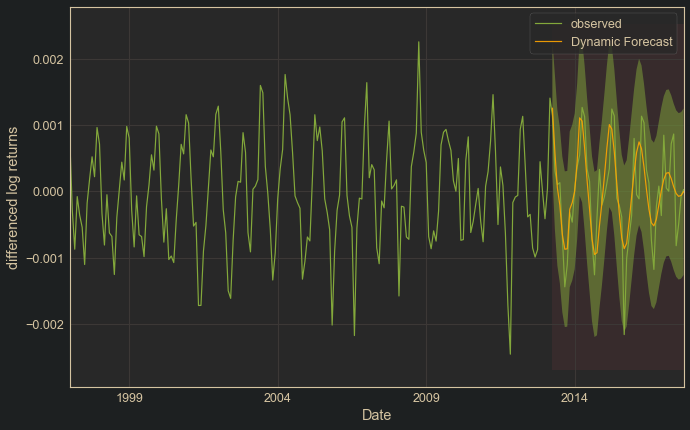

In [1371]:
# Get dynamic predictions with confidence intervals
pred_dynamic = model.get_prediction(#start='2013-04', 
                                    #end='2018-04', 
                                    dynamic=start, 
                                    #full_results=True,
                                    #exog=fourier_series(filtered, 
                                    #                     freqs=pgram.Period[:num_periods],
                                    #                     K=1
                                    #                    ).loc['2012-09':'2013-03'].iloc[:, 
                                    #                                                    fs_cols
                                    #                                                   ]
                                   )
pred_dynamic_conf = pred_dynamic.conf_int().loc[start:]

# Plot observed values
ax = filtered.plot(label='observed')
# Plot predicted values
pred_dynamic.predicted_mean.loc[start:].plot(ax=ax, label='Dynamic Forecast', color='orange', alpha=0.9)
# Plot the range for confidence intervals
ax.fill_between(pred_dynamic_conf.index, 
                pred_dynamic_conf.iloc[:, 0], 
                pred_dynamic_conf.iloc[:, 1],
                alpha=0.5
               )
ax.fill_betweenx(ax.get_ylim(), 
                 pd.to_datetime('2013-04'), 
                pred_dynamic.predicted_mean.index[-1],
                alpha=0.1,
                zorder=-1
               )
# Set axes labels
ax.set_xlabel('Date')
ax.set_ylabel('differenced log returns')
plt.legend()
plt.show()

In [1372]:
# Let's look at a 5 year forecast with this model
prediction = model.get_forecast(60,
                               exog=fourier_series(filtered, 
                                                         freqs=pgram.Period[:num_periods],
                                                         K=1,
                                                        h=60
                                                        ).iloc[:, 
                                                               fs_cols
                                                              ])

# Get confidence intervals of forecasts
pred_conf = prediction.conf_int()

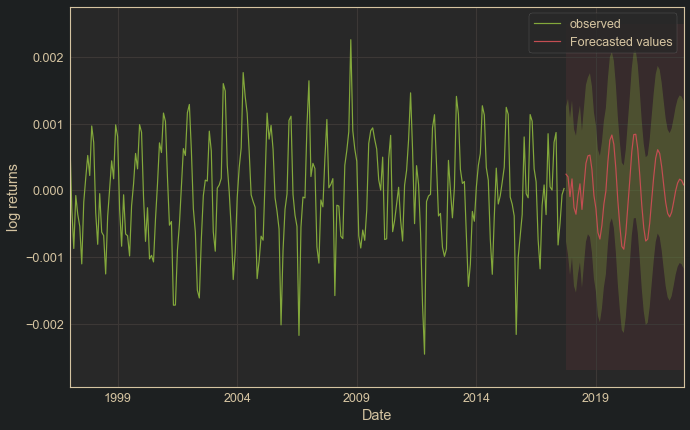

In [1373]:
# Plot future predictions with confidence intervals
ax = filtered.plot(label='observed')
prediction.predicted_mean.plot(label='Forecasted values', ax=ax)

ax.fill_between(pred_conf.index,
                pred_conf.iloc[:, 0],
                pred_conf.iloc[:, 1],
                alpha=0.3
               )

ax.fill_betweenx(ax.get_ylim(), pred_conf.index[0], pred_conf.index[-1],
                 alpha=0.1,
                 zorder=-1
                )

ax.set_xlabel('Date')
ax.set_ylabel('log returns')
plt.legend()
plt.show()

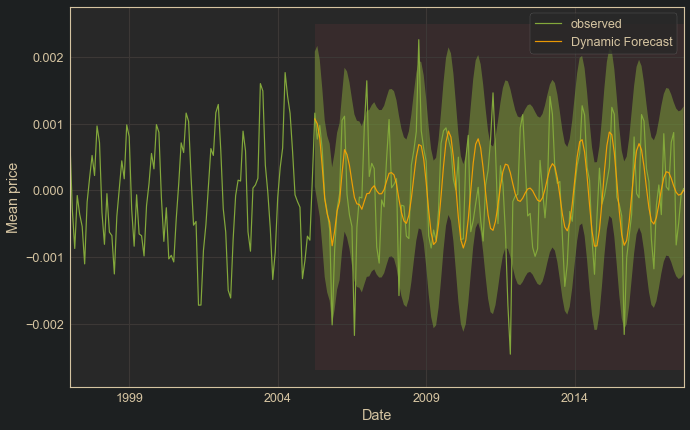

In [1374]:
# Get dynamic predictions with confidence intervals
pred_dynamic = model.get_prediction(#start=, 
                                    #end='2018-04', 
                                    dynamic='2005-04-01', 
                                    #full_results=True,
                                    #exog=fourier_series(filtered, 
                                    #                     freqs=pgram.Period[:num_periods],
                                    #                     K=1
                                    #                    ).loc['2004-09':'2005-03'].iloc[:, 
                                    #                                                    fs_cols
                                    #                                                   ]
                                   )
pred_dynamic_conf = pred_dynamic.conf_int().loc['2005-04-01':]

# Plot observed values
ax = filtered.plot(label='observed')
# Plot predicted values
pred_dynamic.predicted_mean.loc['2005-04-01':].plot(ax=ax, label='Dynamic Forecast', color='orange', alpha=0.9)
# Plot the range for confidence intervals
ax.fill_between(pred_dynamic_conf.index, 
                pred_dynamic_conf.iloc[:, 0], 
                pred_dynamic_conf.iloc[:, 1],
                alpha=0.5
               )
ax.fill_betweenx(ax.get_ylim(), 
                 pd.to_datetime('2005-04'), 
                pred_dynamic.predicted_mean.index[-1],
                alpha=0.1,
                zorder=-1
               )
# Set axes labels
ax.set_xlabel('Date')
ax.set_ylabel('Mean price')
plt.legend()
plt.show()

In [1375]:
print(param, sparam)

(1, 0, 1) (1, 0, 0, 12)


In [1376]:
fs_ext = pd.concat([fs, fourier_series(filtered, freqs=pgram.Period[:2], K=1, h=7)], axis=0)

In [1377]:
mod = SARIMAX(log_returns.loc[fs_ext.index],
                order=(1,1,1),
                seasonal_order=sparam,
                #simple_differencing=True,
                enforce_stationary=False,
                enforce_invertibility=False,
               exog=np.cumsum(fs_ext.iloc[:, 
                                      fs_cols
                                     ])
               )
coefs = model.params
res = mod.smooth(coefs)
print(res.summary())

                                      SARIMAX Results                                      
Dep. Variable:                         log returns   No. Observations:                  256
Model:             SARIMAX(1, 1, 1)x(1, 0, [], 12)   Log Likelihood                1533.834
Date:                             Sat, 05 Sep 2020   AIC                          -3055.669
Time:                                     22:47:30   BIC                          -3034.421
Sample:                                 01-01-1997   HQIC                         -3047.122
                                      - 04-01-2018                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
S1-10.83       0.0005   9.45e-05      4.890      0.000       0.000       0.001
S1-13.11      -0.0004      

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\mlemodel.py:3225: FutureWarning: The default value of lags is changing.  After 0.12, this value will become min(10, nobs//5) for non-seasonal time series and min (2*m, nobs//5) for seasonal time series. Directly set lags to silence this warning.
  FutureWarning


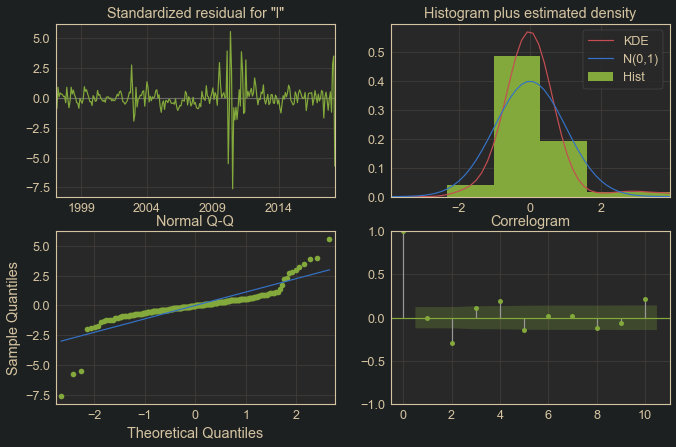

In [1378]:
res.plot_diagnostics();

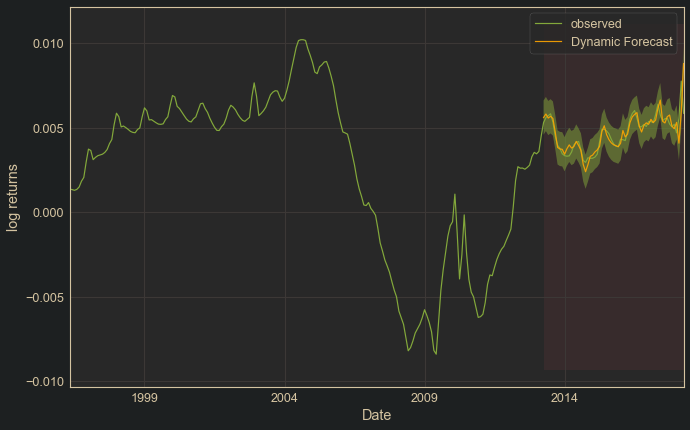

In [1379]:
# Get dynamic predictions with confidence intervals
pred = res.get_prediction()
pred_conf = pred.conf_int().loc['2013-04-01':]

# Plot observed values
ax = log_returns.plot(label='observed')
# Plot predicted values
pred.predicted_mean.loc['2013-04-01':].plot(ax=ax, label='Dynamic Forecast', color='orange', alpha=0.9)
# Plot the range for confidence intervals
ax.fill_between(pred_conf.index, 
                pred_conf.iloc[:, 0], 
                pred_conf.iloc[:, 1],
                alpha=0.5
               )
ax.fill_betweenx(ax.get_ylim(), 
                 pd.to_datetime('2013-04'), 
                pred.predicted_mean.index[-1],
                alpha=0.1,
                zorder=-1
               )
# Set axes labels
ax.set_xlabel('Date')
ax.set_ylabel('log returns')
plt.legend()
plt.show()

In [1380]:
((pred.predicted_mean - log_returns)**2).mean()

3.882851480262683e-07

In [1476]:
((log_returns - log_returns.shift(1))**2).mean()

3.726542334908291e-07

We can see that the MSE for the model using the coefficients from the model fitted over the filtered data is actually slightly higher than for the model fit earlier using the unfiltered data.

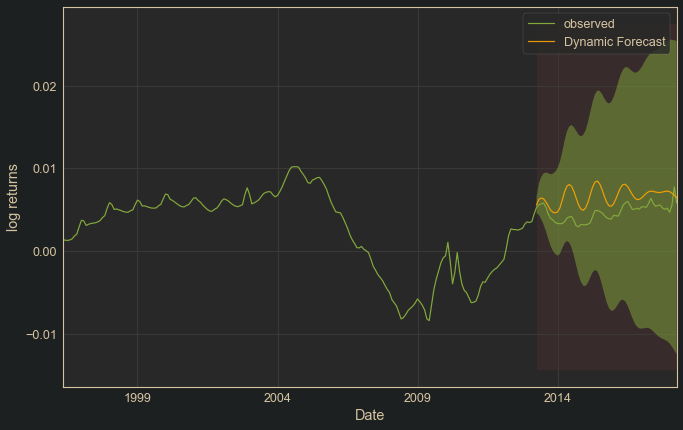

In [1250]:
# Get dynamic predictions with confidence intervals
pred_dynamic = res.get_prediction(start='2013-04', 
                                  end='2018-04', 
                                  dynamic=True, 
                                  full_results=True,
                                  exog=np.cumsum(fourier_series(filtered, 
                                                         freqs=pgram.Period[:2],
                                                         K=1
                                                        ).loc['2012-09':'2013-03'].iloc[:, 
                                                                                        fs_cols
                                                                                       ])
                                 )
pred_dynamic_conf = pred_dynamic.conf_int()

# Plot observed values
ax = log_returns.plot(label='observed')
# Plot predicted values
pred_dynamic.predicted_mean.plot(ax=ax, label='Dynamic Forecast', color='orange', alpha=0.9)
# Plot the range for confidence intervals
ax.fill_between(pred_dynamic_conf.index, 
                pred_dynamic_conf.iloc[:, 0], 
                pred_dynamic_conf.iloc[:, 1],
                alpha=0.5
               )
ax.fill_betweenx(ax.get_ylim(), 
                 pd.to_datetime('2013-04'), 
                pred_dynamic.predicted_mean.index[-1],
                alpha=0.1,
                zorder=-1
               )
# Set axes labels
ax.set_xlabel('Date')
ax.set_ylabel('log returns')
plt.legend()
plt.show()

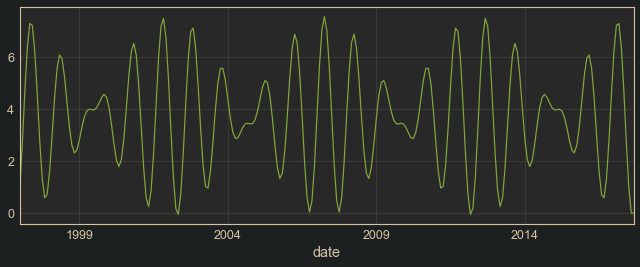

In [1251]:
fs.cumsum().iloc[:, fs_cols].sum(axis=1).plot(figsize=(11,4))

,S1-10.83,C1-10.83,S1-13.11,C1-13.11
2017-10-01,0.548337,0.836257,0.461282,0.887253
2017-11-01,0.917102,0.398653,0.818549,0.574437


,S1-10.83,C1-10.83,S1-13.11,C1-13.11
2017-10-01,0.548337,0.836257,0.461282,0.887253
2017-11-01,1.465439,1.234910,1.279831,1.461691


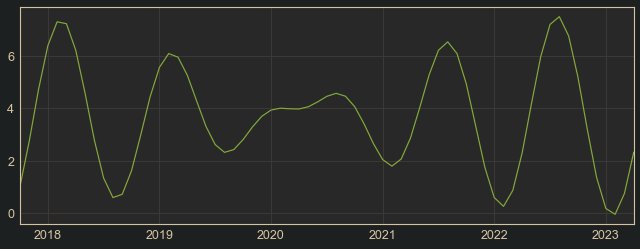

In [1252]:
# Let's look at a 5 year forecast with this model
# First we will need out of sample fourier series
fs_fore = fourier_series(filtered, 
                          freqs=pgram.Period[:2],
                          K=1,
                          h=67
                         )
display(fs_fore.head(2))
display(fs_fore.cumsum().head(2))
fs_fore.cumsum().iloc[:, fs_cols].sum(axis=1).plot(figsize=(11,4))

,S1-10.83,C1-10.83,S1-13.11,C1-13.11
2017-09-01,8.215650e-15,-2.531308e-14,-7.616818e-14,-1.216804e-13
2017-10-01,5.483372e-01,8.362573e-01,4.612822e-01,8.872535e-01
2017-11-01,1.465439e+00,1.234910e+00,1.279831e+00,1.461691e+00


,S1-10.83,C1-10.83,S1-13.11,C1-13.11
2018-05-01,1.291687,-2.205026,3.298463,-2.192693
2018-06-01,0.419422,-1.715992,2.376404,-2.579744


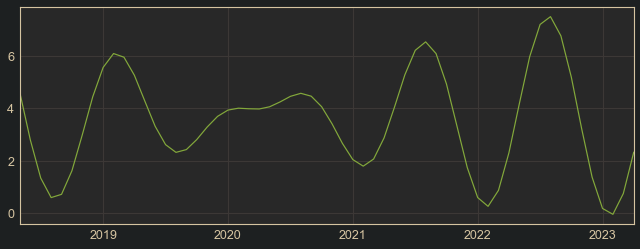

In [1253]:
fs_fore = pd.concat([fs_ext, fs_fore.iloc[7:]], axis=0).cumsum()
display(fs_fore.loc['2017-09-01':'2017-11-01'])
fs_fore = fs_fore.iloc[-60:]
display(fs_fore.head(2))
fs_fore.iloc[:, fs_cols].sum(axis=1).plot(figsize=(11,4))

In [1254]:
# Concatenating the leading data before taking the cumulative sum has not appeared to have an
# impact on the out of sample fourier series, but this may only be because the cumulative sum
# value right at the end of the sample is so close to zero. For other series, it would probably
# be better to concatenate the leading data first 

In [1255]:
prediction = res.get_forecast(60, exog=fs_fore.iloc[:, 
                                                    fs_cols
                                                    ])

# Get confidence intervals of forecasts
pred_conf = prediction.conf_int()

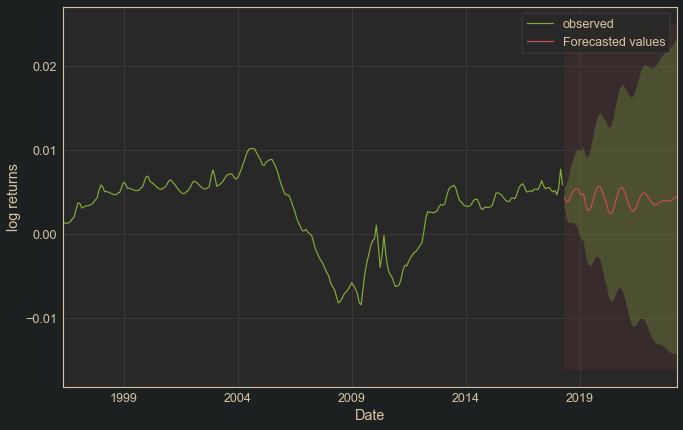

In [1256]:
# Plot future predictions with confidence intervals
ax = log_returns.plot(label='observed')
prediction.predicted_mean.plot(label='Forecasted values', ax=ax)

ax.fill_between(pred_conf.index,
                pred_conf.iloc[:, 0],
                pred_conf.iloc[:, 1],
                alpha=0.3
               )

ax.fill_betweenx(ax.get_ylim(), pred_conf.index[0], pred_conf.index[-1],
                 alpha=0.1,
                 zorder=-1
                )

ax.set_xlabel('Date')
ax.set_ylabel('log returns')
plt.legend()
plt.show()

In [1257]:
# This model is anticipating an upcoming reduction in the mean of log returns

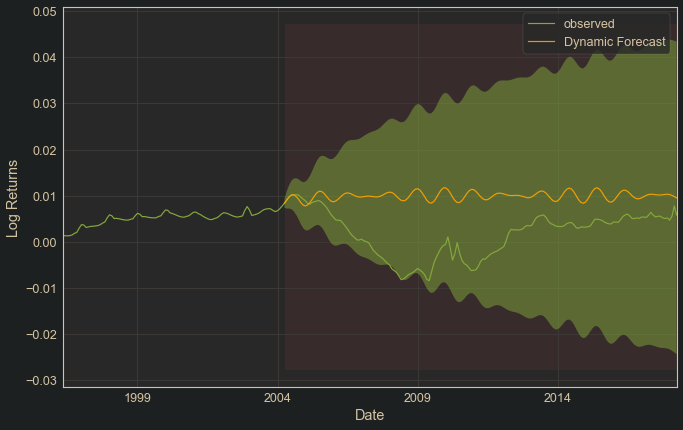

In [1258]:
# Get dynamic predictions with confidence intervals
pred_dynamic = res.get_prediction(start='2004-04', 
                                  end='2018-04', 
                                  dynamic=True, 
                                  full_results=True,
                                  exog=np.cumsum(fourier_series(filtered, 
                                                         freqs=pgram.Period[:2],
                                                         K=1
                                                        ).loc['2003-09':'2004-03'].iloc[:, 
                                                                                        fs_cols
                                                                                       ])
                                 )
pred_dynamic_conf = pred_dynamic.conf_int()

# Plot observed values
ax = log_returns.plot(label='observed')
# Plot predicted values
pred_dynamic.predicted_mean.plot(ax=ax, label='Dynamic Forecast', color='orange', alpha=0.9)
# Plot the range for confidence intervals
ax.fill_between(pred_dynamic_conf.index, 
                pred_dynamic_conf.iloc[:, 0], 
                pred_dynamic_conf.iloc[:, 1],
                alpha=0.5
               )
ax.fill_betweenx(ax.get_ylim(), 
                 pd.to_datetime('2004-04'), 
                pred_dynamic.predicted_mean.index[-1],
                alpha=0.1,
                zorder=-1
               )
# Set axes labels
ax.set_xlabel('Date')
ax.set_ylabel('Log Returns')
plt.legend()
plt.show()

We can see that this model which incorporates the sine components of the fourier series for the periods of high spectral density generated by the periodogram has captured a good amount of the seasonal movement which was not perfectly yearly that we have observed. The periods were between 10 and 11 months and just under 14 months. Interestingly, the model still has a significant coefficient for the 12 month seasonality component as well. We can see that not only did this model have confidence bands that captured the crash, it also caught the seasonal movements during the crash as well. I am pretty happy with this model.

In [1381]:
# Now to try a model with parameters recommended without seasonality
rlist = FloatVector(filtered)
autoarima = r['auto.arima'](r['ts'](rlist, 
                                    #freq=12
                                   ))
param, sparam = get_params(autoarima)
print(param, sparam)

(5, 0, 2) (0, 0, 0, 0)


In [1382]:
# Using the recommended parameters
model = SARIMAX(filtered,
                order=param,
                seasonal_order=sparam,
                enforce_stationary=False,
                enforce_invertibility=False,
                exog=fs.iloc[:, 
                             fs_cols
                            ]
               ).fit()
print(model.summary())

                               SARIMAX Results                                
Dep. Variable:        filtered_series   No. Observations:                  249
Model:               SARIMAX(5, 0, 2)   Log Likelihood                1541.003
Date:                Sat, 05 Sep 2020   AIC                          -3062.007
Time:                        22:51:30   BIC                          -3026.832
Sample:                    01-01-1997   HQIC                         -3047.848
                         - 09-01-2017                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
S1-10.83       0.0005      0.000      3.018      0.003       0.000       0.001
S1-13.11      -0.0004      0.000     -3.799      0.000      -0.001      -0.000
ar.L1          0.2774      0.060      4.616      0.0

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\mlemodel.py:3225: FutureWarning: The default value of lags is changing.  After 0.12, this value will become min(10, nobs//5) for non-seasonal time series and min (2*m, nobs//5) for seasonal time series. Directly set lags to silence this warning.
  FutureWarning


In [1383]:
# We can see that the log likelihood of this model has improved slightly, and the AIC has also
# decreased slightly, which is good. The Ljung-Box test also is now not having the null
# hypothesis of autocorrelated residuals rejected.

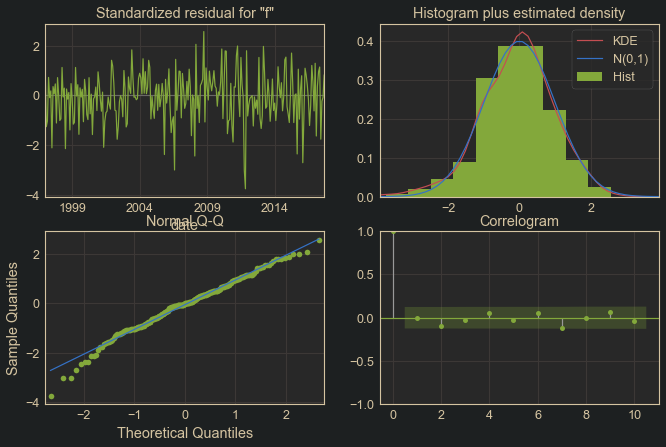

In [1384]:
model.plot_diagnostics();

In [1385]:
mod = SARIMAX(filtered,
                order=param,
                seasonal_order=sparam,
                #enforce_stationary=False,
                #enforce_invertibility=False,
                exog=fs.iloc[:, 
                             fs_cols
                            ]
               )
res = mod.filter(model.params)

In [1386]:
print(res.summary())

                               SARIMAX Results                                
Dep. Variable:        filtered_series   No. Observations:                  249
Model:               SARIMAX(5, 0, 2)   Log Likelihood                1541.003
Date:                Sat, 05 Sep 2020   AIC                          -3062.007
Time:                        22:51:36   BIC                          -3026.832
Sample:                    01-01-1997   HQIC                         -3047.848
                         - 09-01-2017                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
S1-10.83       0.0005      0.000      3.018      0.003       0.000       0.001
S1-13.11      -0.0004      0.000     -3.799      0.000      -0.001      -0.000
ar.L1          0.2774      0.060      4.616      0.0

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\mlemodel.py:3225: FutureWarning: The default value of lags is changing.  After 0.12, this value will become min(10, nobs//5) for non-seasonal time series and min (2*m, nobs//5) for seasonal time series. Directly set lags to silence this warning.
  FutureWarning


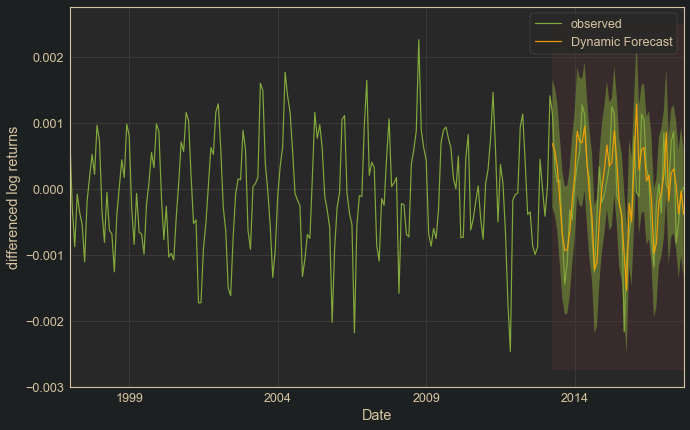

In [1387]:
# Get dynamic predictions with confidence intervals
start='2013-04-01'
end='2018-04-01'
pred_dynamic = model.get_prediction(
                                    #dynamic=start, 
                                    #full_results=True                                                 ]
                                   )
pred_dynamic_conf = pred_dynamic.conf_int().loc[start:]

# Plot observed values
ax = filtered.plot(label='observed')
# Plot predicted values
pred_dynamic.predicted_mean.loc[start:].plot(ax=ax, label='Dynamic Forecast', color='orange', alpha=0.9)
# Plot the range for confidence intervals
ax.fill_between(pred_dynamic_conf.index, 
                pred_dynamic_conf.iloc[:, 0], 
                pred_dynamic_conf.iloc[:, 1],
                alpha=0.5
               )
ax.fill_betweenx(ax.get_ylim(), 
                 pd.to_datetime('2013-04'), 
                pred_dynamic.predicted_mean.index[-1],
                alpha=0.1,
                zorder=-1
               )
# Set axes labels
ax.set_xlabel('Date')
ax.set_ylabel('differenced log returns')
plt.legend()
plt.show()

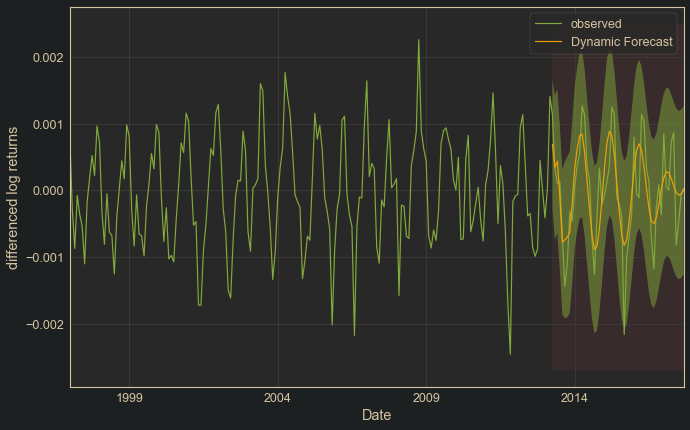

In [1388]:
# Get dynamic predictions with confidence intervals
pred_dynamic = model.get_prediction(#start='2013-04', 
                                    #end='2018-04', 
                                    dynamic=start, 
                                    #full_results=True,
                                    #exog=fourier_series(filtered, 
                                    #                     freqs=pgram.Period[:num_periods],
                                    #                     K=1
                                    #                    ).loc['2012-09':'2013-03'].iloc[:, 
                                    #                                                    fs_cols
                                    #                                                   ]
                                   )
pred_dynamic_conf = pred_dynamic.conf_int().loc[start:]

# Plot observed values
ax = filtered.plot(label='observed')
# Plot predicted values
pred_dynamic.predicted_mean.loc[start:].plot(ax=ax, label='Dynamic Forecast', color='orange', alpha=0.9)
# Plot the range for confidence intervals
ax.fill_between(pred_dynamic_conf.index, 
                pred_dynamic_conf.iloc[:, 0], 
                pred_dynamic_conf.iloc[:, 1],
                alpha=0.5
               )
ax.fill_betweenx(ax.get_ylim(), 
                 pd.to_datetime('2013-04'), 
                pred_dynamic.predicted_mean.index[-1],
                alpha=0.1,
                zorder=-1
               )
# Set axes labels
ax.set_xlabel('Date')
ax.set_ylabel('differenced log returns')
plt.legend()
plt.show()

In [1389]:
# Let's look at a 5 year forecast with this model
prediction = model.get_forecast(60,
                               exog=fourier_series(filtered, 
                                                         freqs=pgram.Period[:num_periods],
                                                         K=1,
                                                        h=60
                                                        ).iloc[:, 
                                                               fs_cols
                                                              ])

# Get confidence intervals of forecasts
pred_conf = prediction.conf_int()

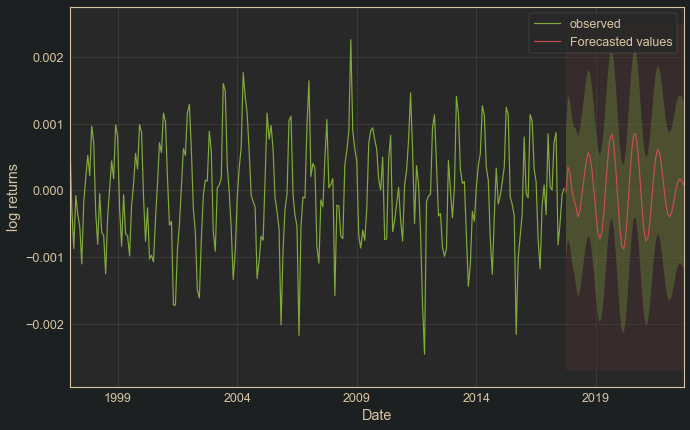

In [1390]:
# Plot future predictions with confidence intervals
ax = filtered.plot(label='observed')
prediction.predicted_mean.plot(label='Forecasted values', ax=ax)

ax.fill_between(pred_conf.index,
                pred_conf.iloc[:, 0],
                pred_conf.iloc[:, 1],
                alpha=0.3
               )

ax.fill_betweenx(ax.get_ylim(), pred_conf.index[0], pred_conf.index[-1],
                 alpha=0.1,
                 zorder=-1
                )

ax.set_xlabel('Date')
ax.set_ylabel('log returns')
plt.legend()
plt.show()

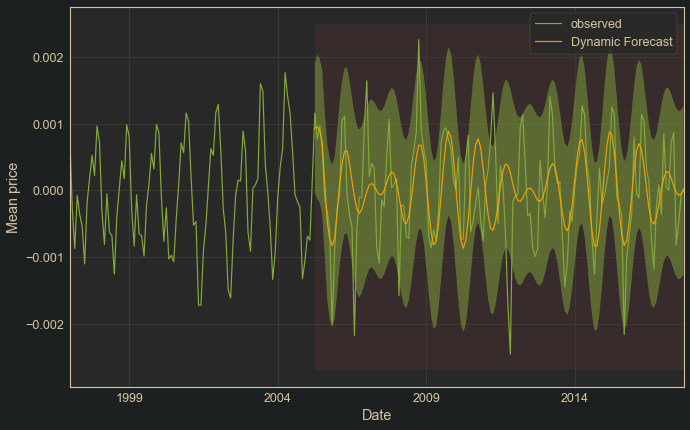

In [1391]:
# Get dynamic predictions with confidence intervals
pred_dynamic = model.get_prediction(#start=, 
                                    #end='2018-04', 
                                    dynamic='2005-04-01', 
                                    #full_results=True,
                                    #exog=fourier_series(filtered, 
                                    #                     freqs=pgram.Period[:num_periods],
                                    #                     K=1
                                    #                    ).loc['2004-09':'2005-03'].iloc[:, 
                                    #                                                    fs_cols
                                    #                                                   ]
                                   )
pred_dynamic_conf = pred_dynamic.conf_int().loc['2005-04-01':]

# Plot observed values
ax = filtered.plot(label='observed')
# Plot predicted values
pred_dynamic.predicted_mean.loc['2005-04-01':].plot(ax=ax, label='Dynamic Forecast', color='orange', alpha=0.9)
# Plot the range for confidence intervals
ax.fill_between(pred_dynamic_conf.index, 
                pred_dynamic_conf.iloc[:, 0], 
                pred_dynamic_conf.iloc[:, 1],
                alpha=0.5
               )
ax.fill_betweenx(ax.get_ylim(), 
                 pd.to_datetime('2005-04'), 
                pred_dynamic.predicted_mean.index[-1],
                alpha=0.1,
                zorder=-1
               )
# Set axes labels
ax.set_xlabel('Date')
ax.set_ylabel('Mean price')
plt.legend()
plt.show()

In [1392]:
print(param, sparam)

(5, 0, 2) (0, 0, 0, 0)


In [1393]:
fs_ext = pd.concat([fs, fourier_series(filtered, freqs=pgram.Period[:2], K=1, h=7)], axis=0)

In [1394]:
mod = SARIMAX(log_returns.loc[fs_ext.index],
                order=(5,1,2),
                seasonal_order=sparam,
                #simple_differencing=True,
                enforce_stationary=False,
                enforce_invertibility=False,
               exog=np.cumsum(fs_ext.iloc[:, 
                                      fs_cols
                                     ])
               )
coefs = model.params
res = mod.smooth(coefs)
print(res.summary())

                               SARIMAX Results                                
Dep. Variable:            log returns   No. Observations:                  256
Model:               SARIMAX(5, 1, 2)   Log Likelihood                1535.358
Date:                Sat, 05 Sep 2020   AIC                          -3050.716
Time:                        22:51:48   BIC                          -3015.304
Sample:                    01-01-1997   HQIC                         -3036.472
                         - 04-01-2018                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
S1-10.83       0.0005      0.000      2.815      0.005       0.000       0.001
S1-13.11      -0.0004      0.000     -3.611      0.000      -0.001      -0.000
ar.L1          0.2774      0.054      5.135      0.0

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\mlemodel.py:3225: FutureWarning: The default value of lags is changing.  After 0.12, this value will become min(10, nobs//5) for non-seasonal time series and min (2*m, nobs//5) for seasonal time series. Directly set lags to silence this warning.
  FutureWarning


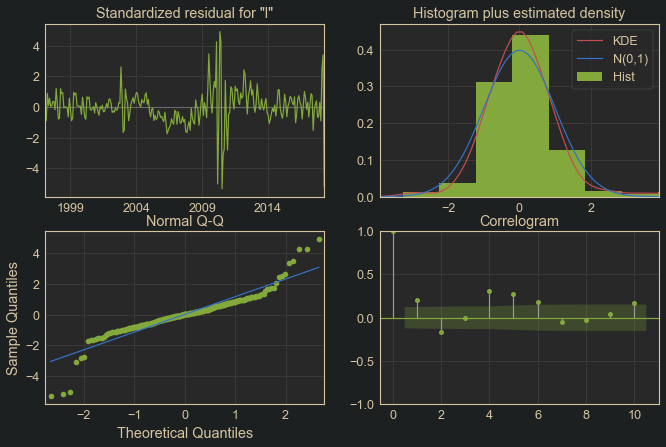

In [1395]:
res.plot_diagnostics();

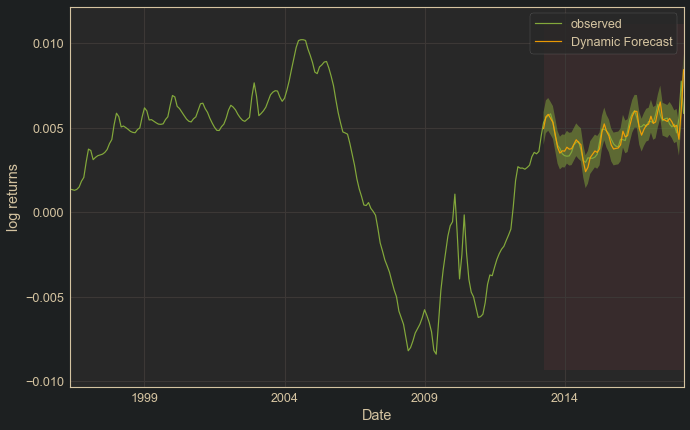

In [1396]:
# Get dynamic predictions with confidence intervals
pred = res.get_prediction()
pred_conf = pred.conf_int().loc['2013-04-01':]

# Plot observed values
ax = log_returns.plot(label='observed')
# Plot predicted values
pred.predicted_mean.loc['2013-04-01':].plot(ax=ax, label='Dynamic Forecast', color='orange', alpha=0.9)
# Plot the range for confidence intervals
ax.fill_between(pred_conf.index, 
                pred_conf.iloc[:, 0], 
                pred_conf.iloc[:, 1],
                alpha=0.5
               )
ax.fill_betweenx(ax.get_ylim(), 
                 pd.to_datetime('2013-04'), 
                pred.predicted_mean.index[-1],
                alpha=0.1,
                zorder=-1
               )
# Set axes labels
ax.set_xlabel('Date')
ax.set_ylabel('log returns')
plt.legend()
plt.show()

In [1399]:
((pred.predicted_mean - log_returns)**2).mean()

3.7929860811086697e-07

In [ ]:
# We can see that the MSE has decreased slightly from the last model, but is still larger than
# for the ARIMA(3,1,1) on the unfiltered data.

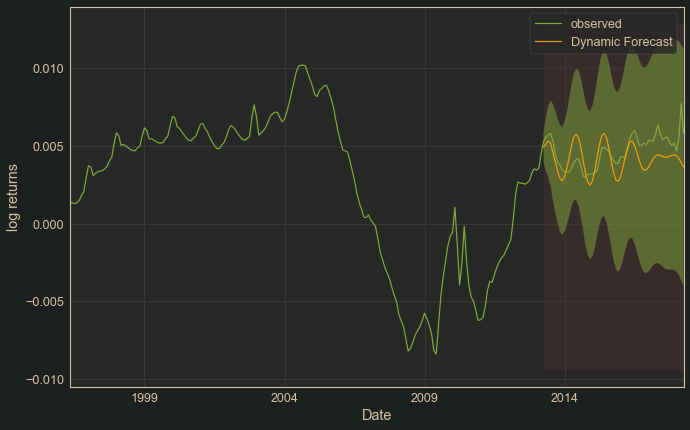

In [1186]:
# Get dynamic predictions with confidence intervals
pred_dynamic = res.get_prediction(start='2013-04', 
                                  end='2018-04', 
                                  dynamic=True, 
                                  full_results=True,
                                  exog=np.cumsum(fourier_series(filtered, 
                                                         freqs=pgram.Period[:2],
                                                         K=1
                                                        ).loc['2012-09':'2013-03'].iloc[:, 
                                                                                        fs_cols
                                                                                       ])
                                 )
pred_dynamic_conf = pred_dynamic.conf_int()

# Plot observed values
ax = log_returns.plot(label='observed')
# Plot predicted values
pred_dynamic.predicted_mean.plot(ax=ax, label='Dynamic Forecast', color='orange', alpha=0.9)
# Plot the range for confidence intervals
ax.fill_between(pred_dynamic_conf.index, 
                pred_dynamic_conf.iloc[:, 0], 
                pred_dynamic_conf.iloc[:, 1],
                alpha=0.5
               )
ax.fill_betweenx(ax.get_ylim(), 
                 pd.to_datetime('2013-04'), 
                pred_dynamic.predicted_mean.index[-1],
                alpha=0.1,
                zorder=-1
               )
# Set axes labels
ax.set_xlabel('Date')
ax.set_ylabel('log returns')
plt.legend()
plt.show()

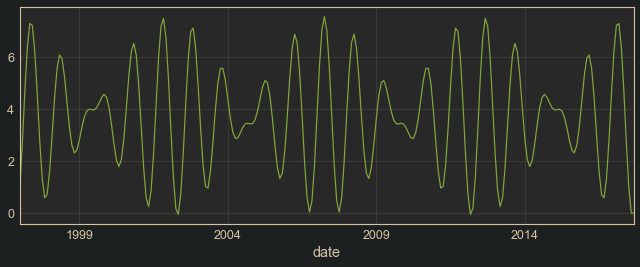

In [1187]:
fs.cumsum().iloc[:, fs_cols].sum(axis=1).plot(figsize=(11,4))

,S1-10.83,C1-10.83,S1-13.11,C1-13.11
2017-10-01,0.548337,0.836257,0.461282,0.887253
2017-11-01,0.917102,0.398653,0.818549,0.574437


,S1-10.83,C1-10.83,S1-13.11,C1-13.11
2017-10-01,0.548337,0.836257,0.461282,0.887253
2017-11-01,1.465439,1.234910,1.279831,1.461691


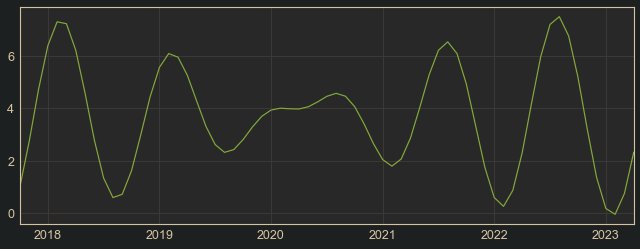

In [1188]:
# Let's look at a 5 year forecast with this model
# First we will need out of sample fourier series
fs_fore = fourier_series(filtered, 
                          freqs=pgram.Period[:2],
                          K=1,
                          h=67
                         )
display(fs_fore.head(2))
display(fs_fore.cumsum().head(2))
fs_fore.cumsum().iloc[:, fs_cols].sum(axis=1).plot(figsize=(11,4))

,S1-10.83,C1-10.83,S1-13.11,C1-13.11
2017-09-01,8.215650e-15,-2.531308e-14,-7.616818e-14,-1.216804e-13
2017-10-01,5.483372e-01,8.362573e-01,4.612822e-01,8.872535e-01
2017-11-01,1.465439e+00,1.234910e+00,1.279831e+00,1.461691e+00


,S1-10.83,C1-10.83,S1-13.11,C1-13.11
2018-05-01,1.291687,-2.205026,3.298463,-2.192693
2018-06-01,0.419422,-1.715992,2.376404,-2.579744


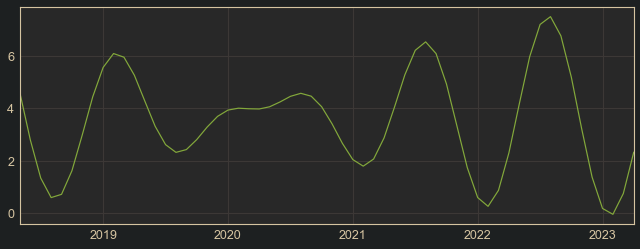

In [1189]:
fs_fore = pd.concat([fs_ext, fs_fore.iloc[7:]], axis=0).cumsum()
display(fs_fore.loc['2017-09-01':'2017-11-01'])
fs_fore = fs_fore.iloc[-60:]
display(fs_fore.head(2))
fs_fore.iloc[:, fs_cols].sum(axis=1).plot(figsize=(11,4))

In [1190]:
# Concatenating the leading data before taking the cumulative sum has not appeared to have an
# impact on the out of sample fourier series, but this may only be because the cumulative sum
# value right at the end of the sample is so close to zero. For other series, it would probably
# be better to concatenate the leading data first 

In [1191]:
prediction = res.get_forecast(60, exog=fs_fore.iloc[:, 
                                                    fs_cols
                                                    ])

# Get confidence intervals of forecasts
pred_conf = prediction.conf_int()

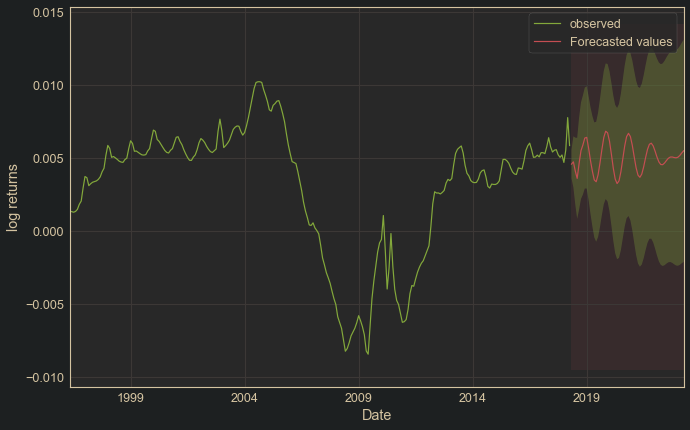

In [1192]:
# Plot future predictions with confidence intervals
ax = log_returns.plot(label='observed')
prediction.predicted_mean.plot(label='Forecasted values', ax=ax)

ax.fill_between(pred_conf.index,
                pred_conf.iloc[:, 0],
                pred_conf.iloc[:, 1],
                alpha=0.3
               )

ax.fill_betweenx(ax.get_ylim(), pred_conf.index[0], pred_conf.index[-1],
                 alpha=0.1,
                 zorder=-1
                )

ax.set_xlabel('Date')
ax.set_ylabel('log returns')
plt.legend()
plt.show()

In [1193]:
# This model is anticipating an upcoming reduction in the mean of log returns

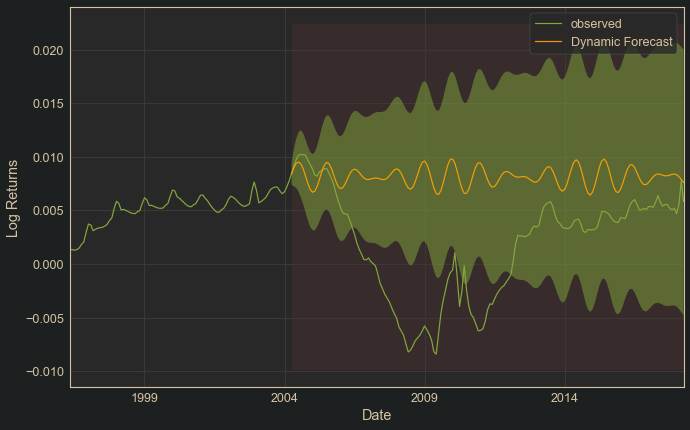

In [1194]:
# Get dynamic predictions with confidence intervals
pred_dynamic = res.get_prediction(start='2004-04', 
                                  end='2018-04', 
                                  dynamic=True, 
                                  full_results=True,
                                  exog=np.cumsum(fourier_series(filtered, 
                                                         freqs=pgram.Period[:2],
                                                         K=1
                                                        ).loc['2003-09':'2004-03'].iloc[:, 
                                                                                        fs_cols
                                                                                       ])
                                 )
pred_dynamic_conf = pred_dynamic.conf_int()

# Plot observed values
ax = log_returns.plot(label='observed')
# Plot predicted values
pred_dynamic.predicted_mean.plot(ax=ax, label='Dynamic Forecast', color='orange', alpha=0.9)
# Plot the range for confidence intervals
ax.fill_between(pred_dynamic_conf.index, 
                pred_dynamic_conf.iloc[:, 0], 
                pred_dynamic_conf.iloc[:, 1],
                alpha=0.5
               )
ax.fill_betweenx(ax.get_ylim(), 
                 pd.to_datetime('2004-04'), 
                pred_dynamic.predicted_mean.index[-1],
                alpha=0.1,
                zorder=-1
               )
# Set axes labels
ax.set_xlabel('Date')
ax.set_ylabel('Log Returns')
plt.legend()
plt.show()

We can see that this model which incorporates the sine components of the fourier series for the periods of high spectral density generated by the periodogram has captured a good amount of the seasonal movement which was not perfectly yearly that we have observed. The periods were between 10 and 11 months and just under 14 months. Interestingly, the model still has a significant coefficient for the 12 month seasonality component as well. We can see that not only did this model have confidence bands that captured the crash, it also caught the seasonal movements during the crash as well. I am pretty happy with this model.

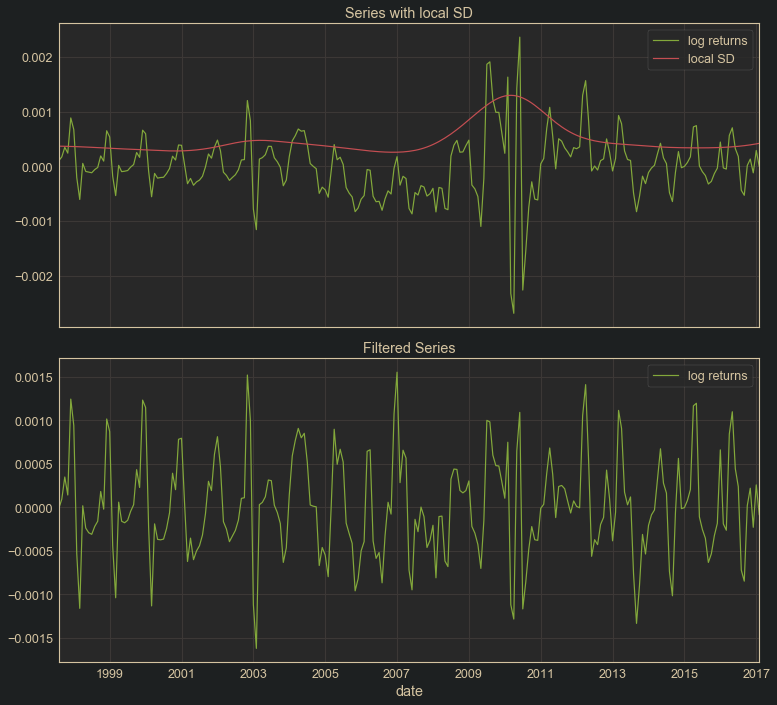

In [1084]:
filtered = so_filter(diff_returns, 
                     #sd_method='GARCH',
                     l=15, 
                     k=29, 
                     visualize=True, 
                     #hp_filter=True, 
                     lamb=3000)

In [925]:
# Now to fit a model to this filtered series
rlist = FloatVector(filtered)
autoarima = r['auto.arima'](r['ts'](rlist, 
                                    #freq=12
                                   ))
param, sparam = get_params(autoarima)
print(param, sparam)

(2, 0, 5) (0, 0, 0, 0)


In [926]:
# Using the recommended parameters
model = SARIMAX(filtered,
                order=param,
                seasonal_order=sparam,
                enforce_stationary=False,
                enforce_invertibility=False,
                #exog=fs.iloc[:, [0,2]]
               ).fit()
print(model.summary())

                               SARIMAX Results                                
Dep. Variable:        filtered_series   No. Observations:                  235
Model:               SARIMAX(2, 0, 5)   Log Likelihood                1510.245
Date:                Fri, 04 Sep 2020   AIC                          -3004.491
Time:                        23:46:00   BIC                          -2976.814
Sample:                    08-01-1997   HQIC                         -2993.333
                         - 02-01-2017                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6153      0.048     12.794      0.000       0.521       0.710
ar.L2         -0.0473      0.048     -0.985      0.325      -0.142       0.047
ma.L1          0.3539      0.067      5.316      0.0

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\mlemodel.py:3225: FutureWarning: The default value of lags is changing.  After 0.12, this value will become min(10, nobs//5) for non-seasonal time series and min (2*m, nobs//5) for seasonal time series. Directly set lags to silence this warning.
  FutureWarning


In [927]:
# The metrics have improved, although the null hypothesis of homoscedastic residuals is
# still being rejected. The Ljung-Box null hypothesis of non-autocorrelated residuals is not
# rejected, which is an improvement

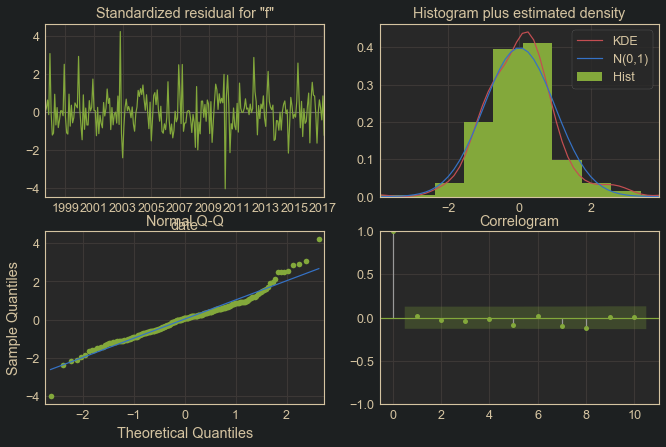

In [928]:
model.plot_diagnostics();

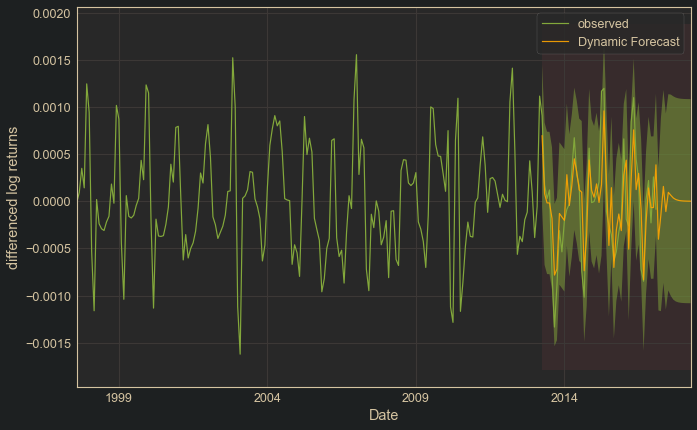

In [929]:
# Get dynamic predictions with confidence intervals
pred_dynamic = model.get_prediction(start='2013-04', 
                                    end='2018-04', 
                                    dynamic=False, 
                                    full_results=True,
                                    #exog=fourier_series(filtered, 
                                    #                     freqs=pgram.Period[:2],
                                    #                     K=1
                                    #                    ).loc['2012-09':'2013-03'].iloc[:, [0,2]]
                                   )
pred_dynamic_conf = pred_dynamic.conf_int()

# Plot observed values
ax = filtered.plot(label='observed')
# Plot predicted values
pred_dynamic.predicted_mean.plot(ax=ax, label='Dynamic Forecast', color='orange', alpha=0.9)
# Plot the range for confidence intervals
ax.fill_between(pred_dynamic_conf.index, 
                pred_dynamic_conf.iloc[:, 0], 
                pred_dynamic_conf.iloc[:, 1],
                alpha=0.5
               )
ax.fill_betweenx(ax.get_ylim(), 
                 pd.to_datetime('2013-04'), 
                pred_dynamic.predicted_mean.index[-1],
                alpha=0.1,
                zorder=-1
               )
# Set axes labels
ax.set_xlabel('Date')
ax.set_ylabel('differenced log returns')
plt.legend()
plt.show()

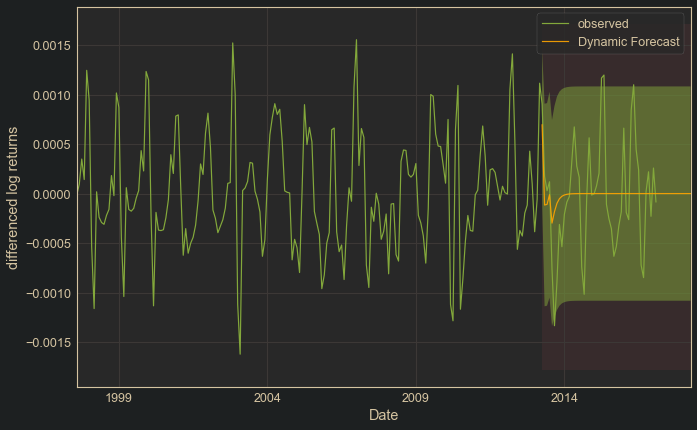

In [930]:
# Get dynamic predictions with confidence intervals
pred_dynamic = model.get_prediction(start='2013-04', 
                                    end='2018-04', 
                                    dynamic=True, 
                                    full_results=True,
                                    #exog=fourier_series(filtered, 
                                    #                     freqs=pgram.Period[:2],
                                    #                     K=1
                                    #                    ).loc['2012-09':'2013-03'].iloc[:, [0,2]]
                                   )
pred_dynamic_conf = pred_dynamic.conf_int()

# Plot observed values
ax = filtered.plot(label='observed')
# Plot predicted values
pred_dynamic.predicted_mean.plot(ax=ax, label='Dynamic Forecast', color='orange', alpha=0.9)
# Plot the range for confidence intervals
ax.fill_between(pred_dynamic_conf.index, 
                pred_dynamic_conf.iloc[:, 0], 
                pred_dynamic_conf.iloc[:, 1],
                alpha=0.5
               )
ax.fill_betweenx(ax.get_ylim(), 
                 pd.to_datetime('2013-04'), 
                pred_dynamic.predicted_mean.index[-1],
                alpha=0.1,
                zorder=-1
               )
# Set axes labels
ax.set_xlabel('Date')
ax.set_ylabel('differenced log returns')
plt.legend()
plt.show()

In [931]:
# Let's look at a 5 year forecast with this model
prediction = model.get_forecast(60,
                               #exog=fourier_series(filtered, 
                               #                          freqs=pgram.Period[:2],
                               #                          K=1,
                               #                         h=60
                               #                         ).iloc[:, [0,2]]
                               )

# Get confidence intervals of forecasts
pred_conf = prediction.conf_int()

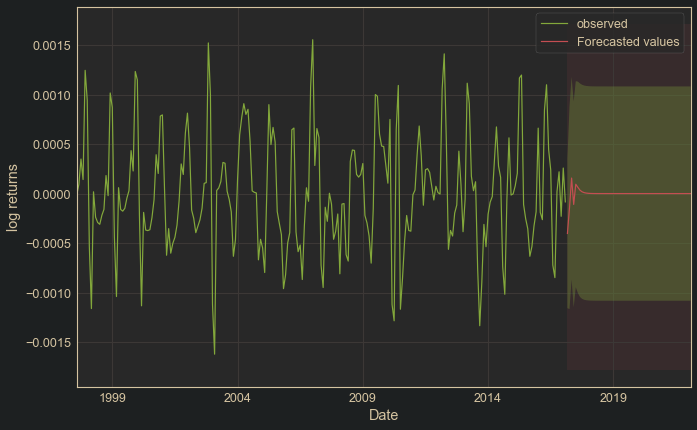

In [932]:
# Plot future predictions with confidence intervals
ax = filtered.plot(label='observed')
prediction.predicted_mean.plot(label='Forecasted values', ax=ax)

ax.fill_between(pred_conf.index,
                pred_conf.iloc[:, 0],
                pred_conf.iloc[:, 1],
                alpha=0.3
               )

ax.fill_betweenx(ax.get_ylim(), pred_conf.index[0], pred_conf.index[-1],
                 alpha=0.1,
                 zorder=-1
                )

ax.set_xlabel('Date')
ax.set_ylabel('log returns')
plt.legend()
plt.show()

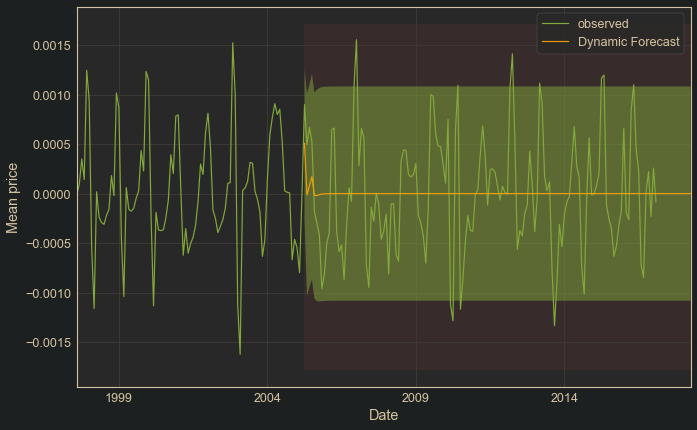

In [933]:
# Get dynamic predictions with confidence intervals
pred_dynamic = model.get_prediction(start='2005-04', 
                                    end='2018-04', 
                                    dynamic=True, 
                                    full_results=True,
                                    #exog=fourier_series(filtered, 
                                    #                     freqs=pgram.Period[:2],
                                    #                     K=1
                                    #                    ).loc['2004-09':'2005-03'].iloc[:, [0,2]]
                                   )
pred_dynamic_conf = pred_dynamic.conf_int()

# Plot observed values
ax = filtered.plot(label='observed')
# Plot predicted values
pred_dynamic.predicted_mean.plot(ax=ax, label='Dynamic Forecast', color='orange', alpha=0.9)
# Plot the range for confidence intervals
ax.fill_between(pred_dynamic_conf.index, 
                pred_dynamic_conf.iloc[:, 0], 
                pred_dynamic_conf.iloc[:, 1],
                alpha=0.5
               )
ax.fill_betweenx(ax.get_ylim(), 
                 pd.to_datetime('2005-04'), 
                pred_dynamic.predicted_mean.index[-1],
                alpha=0.1,
                zorder=-1
               )
# Set axes labels
ax.set_xlabel('Date')
ax.set_ylabel('Mean price')
plt.legend()
plt.show()

Now that we have generated coefficients on the filtered data, we will smooth another model with these coefficients, then see how good the predictive power of the coefficients are.

In [934]:
print(param, sparam)

(2, 0, 5) (0, 0, 0, 0)


In [935]:
mod = SARIMAX(log_returns,
                order=(2,1,5),
                seasonal_order=sparam,
                #simple_differencing=True,
                enforce_stationary=False,
                enforce_invertibility=False,
               #exog=fs.iloc[:, [0,2]]
               )
coefs = model.params
res = mod.smooth(coefs)
print(res.summary())

                               SARIMAX Results                                
Dep. Variable:            log returns   No. Observations:                  264
Model:               SARIMAX(2, 1, 5)   Log Likelihood                1612.460
Date:                Fri, 04 Sep 2020   AIC                          -3208.920
Time:                        23:47:35   BIC                          -3180.342
Sample:                    05-01-1996   HQIC                         -3197.435
                         - 04-01-2018                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6153      0.020     30.603      0.000       0.576       0.655
ar.L2         -0.0473      0.017     -2.793      0.005      -0.081      -0.014
ma.L1          0.3539      0.010     36.481      0.0

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\mlemodel.py:3225: FutureWarning: The default value of lags is changing.  After 0.12, this value will become min(10, nobs//5) for non-seasonal time series and min (2*m, nobs//5) for seasonal time series. Directly set lags to silence this warning.
  FutureWarning


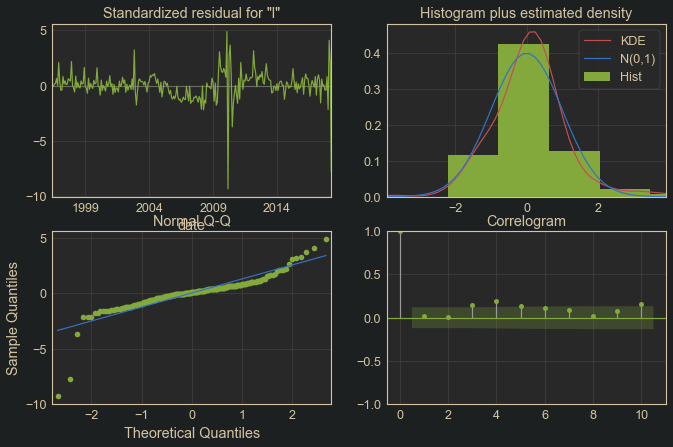

In [936]:
res.plot_diagnostics();

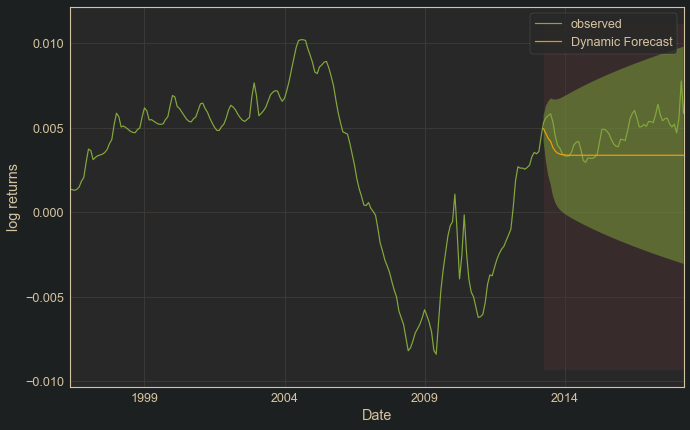

In [938]:
# Get dynamic predictions with confidence intervals
pred_dynamic = res.get_prediction(start='2013-04', 
                                  end='2018-04', 
                                  dynamic=True, 
                                  full_results=True,
                                  #exog=fourier_series(filtered, 
                                  #                       freqs=pgram.Period[:2],
                                  #                       K=1
                                  #                      ).loc['2012-09':'2013-03'].iloc[:, [0,2]]
                                 )
pred_dynamic_conf = pred_dynamic.conf_int()

# Plot observed values
ax = log_returns.plot(label='observed')
# Plot predicted values
pred_dynamic.predicted_mean.plot(ax=ax, label='Dynamic Forecast', color='orange', alpha=0.9)
# Plot the range for confidence intervals
ax.fill_between(pred_dynamic_conf.index, 
                pred_dynamic_conf.iloc[:, 0], 
                pred_dynamic_conf.iloc[:, 1],
                alpha=0.5
               )
ax.fill_betweenx(ax.get_ylim(), 
                 pd.to_datetime('2013-04'), 
                pred_dynamic.predicted_mean.index[-1],
                alpha=0.1,
                zorder=-1
               )
# Set axes labels
ax.set_xlabel('Date')
ax.set_ylabel('log returns')
plt.legend()
plt.show()

In [939]:
# Let's look at a 5 year forecast with this model
prediction = res.get_forecast(60)

# Get confidence intervals of forecasts
pred_conf = prediction.conf_int()

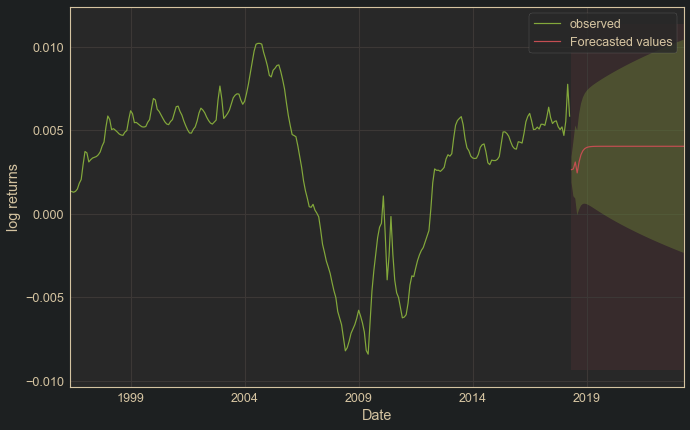

In [940]:
# Plot future predictions with confidence intervals
ax = log_returns.plot(label='observed')
prediction.predicted_mean.plot(label='Forecasted values', ax=ax)

ax.fill_between(pred_conf.index,
                pred_conf.iloc[:, 0],
                pred_conf.iloc[:, 1],
                alpha=0.3
               )

ax.fill_betweenx(ax.get_ylim(), pred_conf.index[0], pred_conf.index[-1],
                 alpha=0.1,
                 zorder=-1
                )

ax.set_xlabel('Date')
ax.set_ylabel('log returns')
plt.legend()
plt.show()

In [941]:
# This model is anticipating an upcoming reduction in the mean of log returns

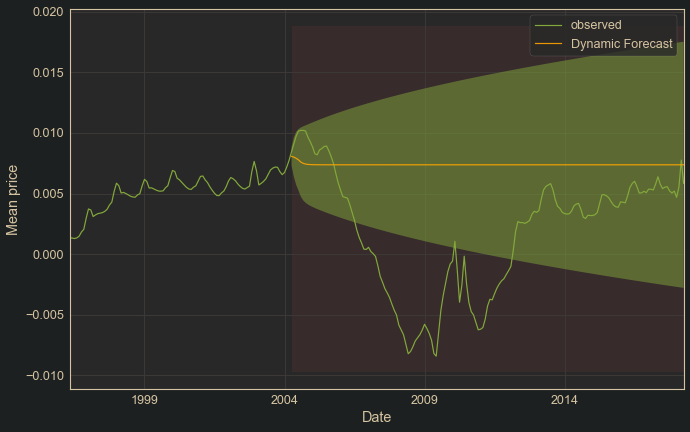

In [942]:
# Get dynamic predictions with confidence intervals
pred_dynamic = res.get_prediction(start='2004-04', end='2018-04', dynamic=True, full_results=True)
pred_dynamic_conf = pred_dynamic.conf_int()

# Plot observed values
ax = log_returns.plot(label='observed')
# Plot predicted values
pred_dynamic.predicted_mean.plot(ax=ax, label='Dynamic Forecast', color='orange', alpha=0.9)
# Plot the range for confidence intervals
ax.fill_between(pred_dynamic_conf.index, 
                pred_dynamic_conf.iloc[:, 0], 
                pred_dynamic_conf.iloc[:, 1],
                alpha=0.5
               )
ax.fill_betweenx(ax.get_ylim(), 
                 pd.to_datetime('2004-04'), 
                pred_dynamic.predicted_mean.index[-1],
                alpha=0.1,
                zorder=-1
               )
# Set axes labels
ax.set_xlabel('Date')
ax.set_ylabel('Mean price')
plt.legend()
plt.show()

In [279]:
# This model managed to capture most of the upcoming crash in its confidence bands

### Removing the heteroscedasticity by limiting time window

Since the investigation into using fourier terms on this dataset revealed that they will not be useful to model any long-term seasonality of the market, and because the circumstances that led to the 2007 market crash are probably more unique than they are seasonal, I have decided that the best choice moving forward would be to remove data the data before and during the crash, and focus on the price data after all of the drama subsided.<br>
<br>
Let's look again at the plot of the price means to see where a good cutoff point might be:

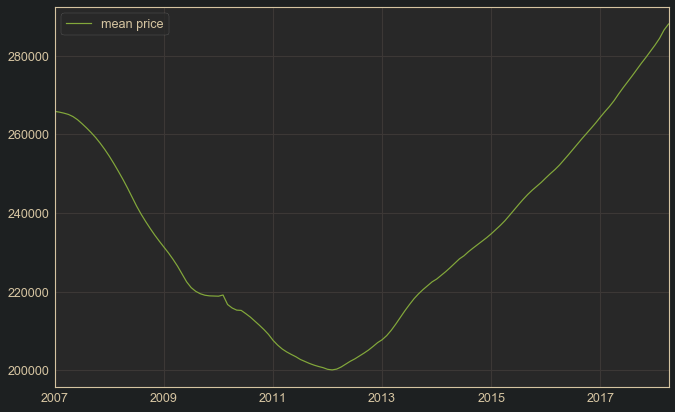

In [177]:
means_fix['2007':].plot(figsize=(11,7))

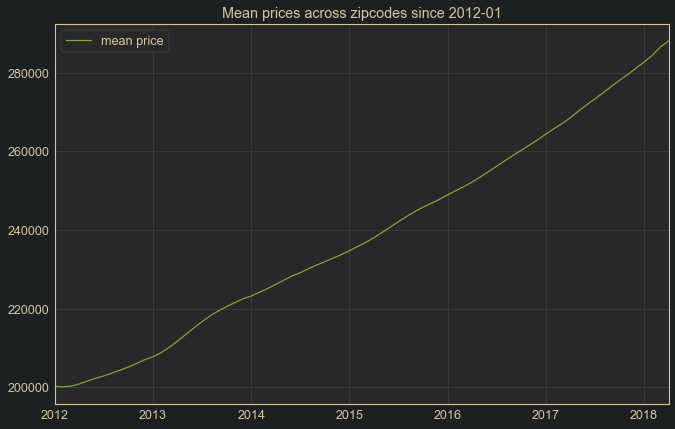

In [178]:
# It looks like the beginning of 2012 would make a good cutoff point, let's see that:
means_fix['2012':].plot(figsize=(11,7))
plt.title("Mean prices across zipcodes since 2012-01");

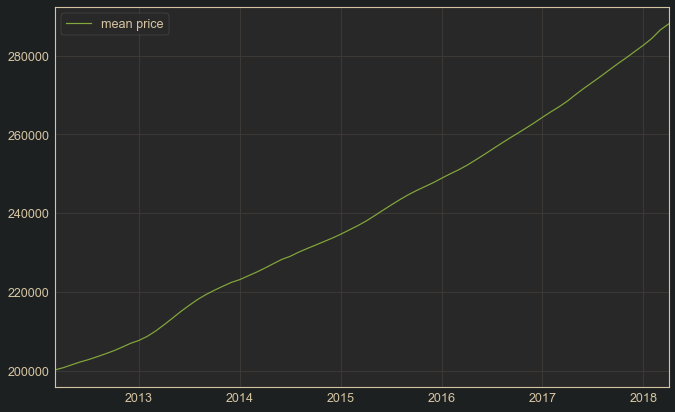

In [179]:
# This still has a bit of a dip in it, I will index a bit further into 2012
means_fix['2012-03':].plot(figsize=(11,7))

In [180]:
# This looks pretty uniform. Let's see how an arima model looks for this data
means_trim = means_fix['2012-03':]
rlist = FloatVector(means_trim['mean price'])
rmodel = r['auto.arima'](rlist)
print(rmodel)

Series: c(200272.349817229, 200824.656872888, 201558.155734878, 202274.412028416,  202879.534339051, 203592.28490735, 204337.92105807, 205118.247571812,  206036.550251429, 207004.656609492, 207745.450178424, 208791.545429591,  210145.42272852, 211730.785067252, 213399.382377162, 215113.127916552,  216674.798138771, 218163.500752703, 219413.008074449, 220509.586697687,  221509.880936089, 222473.737511975, 223183.207199836, 224135.937819595,  225082.573123338, 226124.783527647, 227232.010636122, 228310.622485853,  229099.280038036, 230141.74420974, 231060.035318889, 231927.514772804,  232822.135434354, 233712.307274333, 234691.190654079, 235760.279834273,  236836.426000136, 238009.760239082, 239354.207702235, 240744.121442641,  242103.525096787, 243424.444746315, 244658.269374448, 245764.565645589,  246765.041092169, 247765.170141955, 248896.366229709, 249987.312368403,  251014.310942063, 252164.273585546, 253483.637845548, 254820.084221966,  256205.780071996, 257597.914827141, 258946.02

In [181]:
# Extracting the model parameters:
string = str(rmodel).split('ARIMA')[1].split(' ')[0]
param = tuple(int(x) for x in string.replace('(','').replace(')','').split(','))
print(param)

# Making an equivalent model in StatsModels
model = SARIMAX(means_trim,
                order=param,
                #seasonal_order=(0,2,3,4),
                enforce_stationary=False,
                enforce_invertibility=False
               ).fit()
print(model.summary())

(0, 2, 0)
                           Statespace Model Results                           
Dep. Variable:             mean price   No. Observations:                   74
Model:               SARIMAX(0, 2, 0)   Log Likelihood                -464.546
Date:                Mon, 03 Aug 2020   AIC                            931.093
Time:                        12:11:00   BIC                            933.370
Sample:                    03-01-2012   HQIC                           931.999
                         - 04-01-2018                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      2.352e+04   2521.377      9.329      0.000    1.86e+04    2.85e+04
Ljung-Box (Q):                       23.51   Jarque-Bera (JB):                33.05
Prob(Q):                             

In [182]:
# The null hypothesis of the Ljung-Box test that the errors are not autocorrelated is not 
# rejected.
# The null hypothesis of the Heteroskedasticity test that the variance is not changing
# throughout the sample is not rejected.
# The null hypothesis of normal skew and kurtosis of the residuals is rejected, but a 
# visual inspection of the histogram of residuals indicates they are normal enough, the issue
# is the kurtosis being too high, meaning long tails

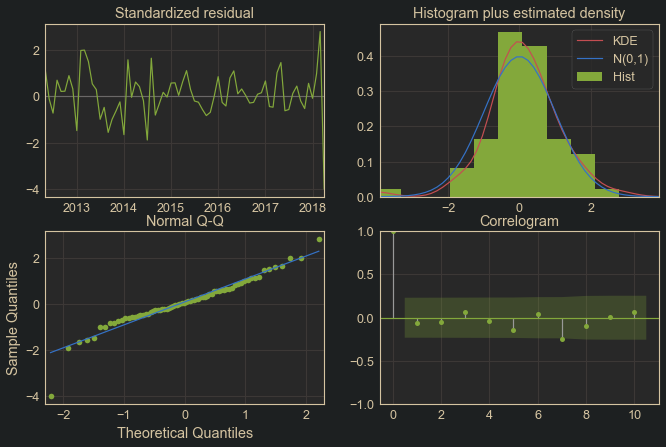

In [183]:
# Checking diagnostics of new model:
model.plot_diagnostics(figsize=(11,7));

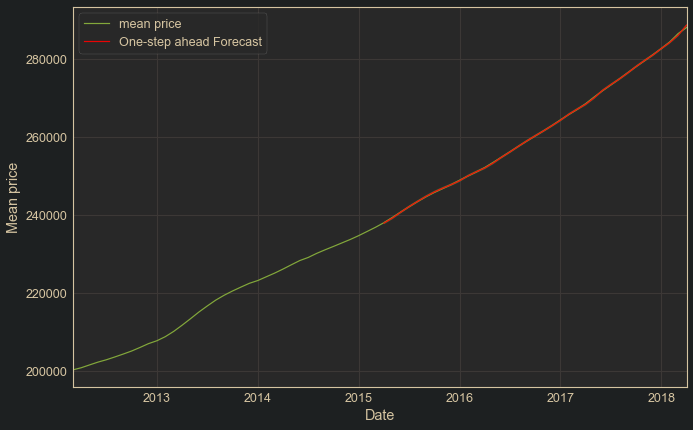

In [364]:
# Get predictions
pred = model.get_prediction('2015-04', '2018-04', dynamic=False)
pred_conf = pred.conf_int()
# Plot observed values
ax = means_trim.plot(label='observed')
# Plot predicted values
pred.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', color='red', alpha=0.9)
# Plot the range for confidence intervals
ax.fill_between(pred_conf.index, 
                pred_conf.iloc[:, 0], 
                pred_conf.iloc[:, 1],
                alpha=0.5
               )
# Set axes labels
ax.set_xlabel('Date')
ax.set_ylabel('Mean price')
plt.legend()
plt.show()

In [365]:
# We can see the one-step-ahead predictions of this model are pretty spot on, which isn't 
# surprising considering the smooth linear data. Let's look at the MSE
forecasted = pred.predicted_mean
truth = means_trim['2015-04':'2018-04']['mean price']

# Compute the mean square error
mse = np.mean((forecasted - truth) ** 2)
print('The Mean Squared Error of our forecasts is {}'.format(round(mse, 2)))

The Mean Squared Error of our forecasts is 23522.72


In [ ]:
# This error is pretty good, considering the scale we are considering is in the hundreds of
# thousands

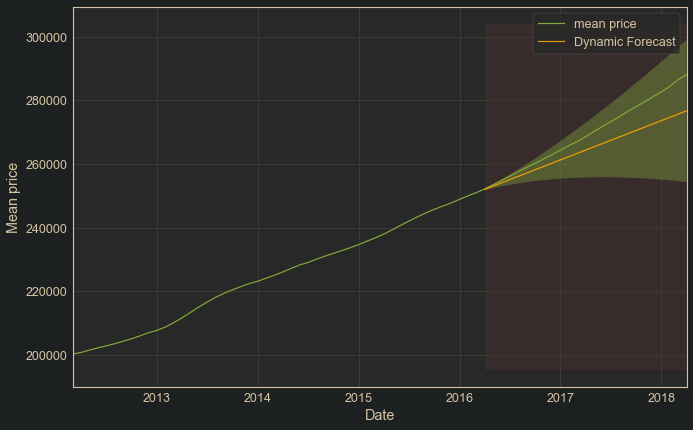

In [366]:
# Get dynamic predictions with confidence intervals
pred_dynamic = model.get_prediction(start='2016-04', end='2018-04', dynamic=True, full_results=True)
pred_dynamic_conf = pred_dynamic.conf_int()

# Plot observed values
ax = means_trim.plot(label='observed')
# Plot predicted values
pred_dynamic.predicted_mean.plot(ax=ax, label='Dynamic Forecast', color='orange', alpha=0.9)
# Plot the range for confidence intervals
ax.fill_between(pred_dynamic_conf.index, 
                pred_dynamic_conf.iloc[:, 0], 
                pred_dynamic_conf.iloc[:, 1],
                alpha=0.4
               )
ax.fill_betweenx(ax.get_ylim(), 
                 pd.to_datetime('2016-04'), 
                pred_dynamic.predicted_mean.index[-1],
                alpha=0.1,
                zorder=-1
               )
# Set axes labels
ax.set_xlabel('Date')
ax.set_ylabel('Mean price')
plt.legend()
plt.show()

In [ ]:
# The predictions here are a bit conservative, but the slope does increase a bit during the
# period which was isolated from the training data.

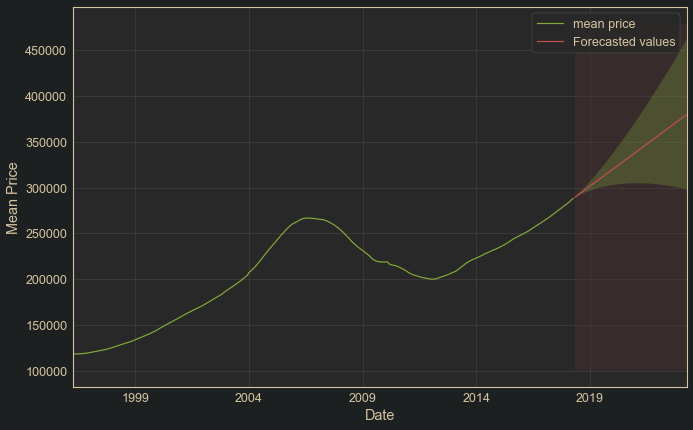

In [368]:
# Let's see now how the 5 year projection looks
prediction = model.get_forecast(60)

# Get confidence intervals of forecasts
pred_conf = prediction.conf_int()
# Plot future predictions with confidence intervals
ax = means_fix.plot(label='observed')
prediction.predicted_mean.plot(label='Forecasted values', ax=ax)

ax.fill_between(pred_conf.index,
                pred_conf.iloc[:, 0],
                pred_conf.iloc[:, 1],
                alpha=0.3
               )

ax.fill_betweenx(ax.get_ylim(), pred_conf.index[0], pred_conf.index[-1],
                 alpha=0.1,
                 zorder=-1
                )

ax.set_xlabel('Date')
ax.set_ylabel('Mean Price')
plt.legend()
plt.show()

In [ ]:
# These results are fairly reminiscent of the facebook prophet projections, although the low end
# is a bit more optimistic, probably because the training data only considered an upward trend

In [369]:
# I am wondering how this model, which had no AR or MA terms, compares to one which has at least
# one MA term
# Let's try another basic model, this time with pdq of (0, 2, 1)
model = SARIMAX(means_trim,
                order=(0,2,1),
                #seasonal_order=(0,2,3,4),
                enforce_stationary=False,
                enforce_invertibility=False
               ).fit()
print(model.summary())

                           Statespace Model Results                           
Dep. Variable:             mean price   No. Observations:                   74
Model:               SARIMAX(0, 2, 1)   Log Likelihood                -463.789
Date:                Sun, 02 Aug 2020   AIC                            931.578
Time:                        17:16:59   BIC                            936.131
Sample:                    03-01-2012   HQIC                           933.391
                         - 04-01-2018                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.0406      0.085     -0.476      0.634      -0.208       0.126
sigma2      2.404e+04   3203.115      7.505      0.000    1.78e+04    3.03e+04
Ljung-Box (Q):                       23.93   Jarque-

In [ ]:
# We can see that the performance is nearly identical, with only a little improvement on the 
# log likelihood and JB scores.
# It can be seen that the p-value for the MA term is far from significant, reinforcing the fact
# that the last model was ideal. This also reinforces the selection of the auto.arima() function

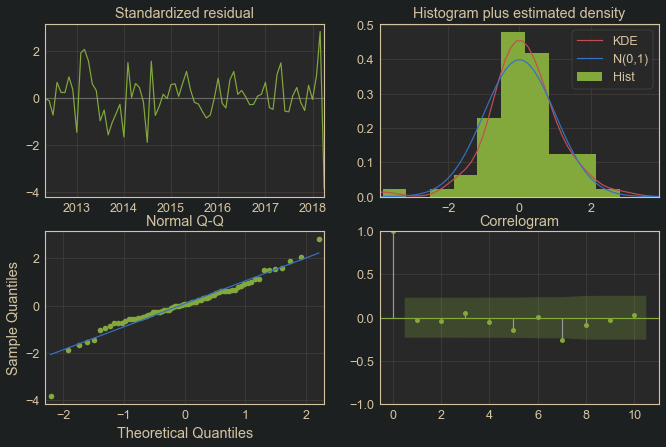

In [370]:
# Checking diagnostics of new model:
model.plot_diagnostics(figsize=(11,7));

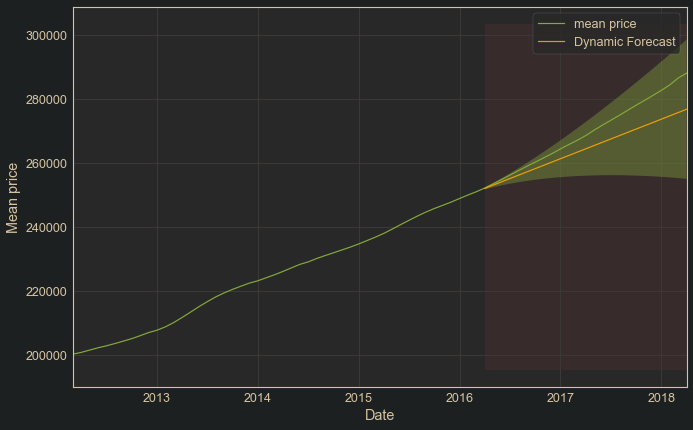

In [371]:
# Get dynamic predictions with confidence intervals
pred_dynamic = model.get_prediction(start='2016-04', end='2018-04', dynamic=True, full_results=True)
pred_dynamic_conf = pred_dynamic.conf_int()

# Plot observed values
ax = means_trim.plot(label='observed')
# Plot predicted values
pred_dynamic.predicted_mean.plot(ax=ax, label='Dynamic Forecast', color='orange', alpha=0.9)
# Plot the range for confidence intervals
ax.fill_between(pred_dynamic_conf.index, 
                pred_dynamic_conf.iloc[:, 0], 
                pred_dynamic_conf.iloc[:, 1],
                alpha=0.4
               )
ax.fill_betweenx(ax.get_ylim(), 
                 pd.to_datetime('2016-04'), 
                pred_dynamic.predicted_mean.index[-1],
                alpha=0.1,
                zorder=-1
               )
# Set axes labels
ax.set_xlabel('Date')
ax.set_ylabel('Mean price')
plt.legend()
plt.show()

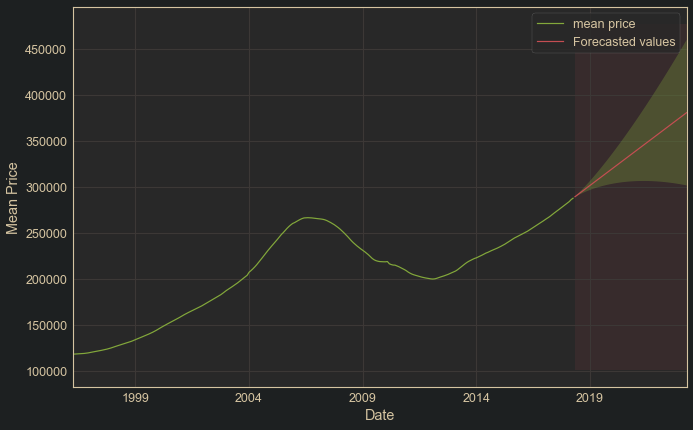

In [372]:
# Let's see now how the 5 year projection looks
prediction = model.get_forecast(60)

# Get confidence intervals of forecasts
pred_conf = prediction.conf_int()
# Plot future predictions with confidence intervals
ax = means_fix.plot(label='observed')
prediction.predicted_mean.plot(label='Forecasted values', ax=ax)

ax.fill_between(pred_conf.index,
                pred_conf.iloc[:, 0],
                pred_conf.iloc[:, 1],
                alpha=0.3
               )

ax.fill_betweenx(ax.get_ylim(), pred_conf.index[0], pred_conf.index[-1],
                 alpha=0.1,
                 zorder=-1
                )

ax.set_xlabel('Date')
ax.set_ylabel('Mean Price')
plt.legend()
plt.show()